# Notebook Final | Benchmarking Acústico Industrial de Alta Fidelidade

Este notebook consolida a versão final do **Cenário 2** com foco em três compromissos ao mesmo tempo:

1. **Rigor científico** para comparar supervisionados e não supervisionados.
2. **Leitura industrial** para entender ruído, falha, falso alarme e teste cego.
3. **Viabilidade prática** para edge, explicabilidade e relatório executivo.

## Visão arquitetural

- **DSP e saneamento do sinal:** HHT, UKF e HHT + UKF como matéria-prima acústica.
- **Seis experimentos de features:** Mel, MFCC, CWT, híbridos vetoriais, NMF e STFT log 64x64.
- **Benchmark competitivo:** XGBoost, GRU, GMM, Tiny-AST, CNN + GMM, IForest, Mahalanobis, LSTM-AE e VAE.
- **Camadas incrementais do projeto:** Frentes 1 a 11, incluindo protocolo sem vazamento, OE real, diagnóstico cego, XAI e Edge/TinyML.

## Resultado esperado desta execução

Ao final, este notebook entrega:

- ranking técnico por `F1`, `AUC-ROC`, `pAUC@0.1` e `Score DCASE Proxy`;
- leitura de custo em `latência`, `memória` e exportabilidade;
- explicação visual e vetorial do campeão;
- evolução acumulativa das frentes para o relatório final.


In [1]:
# =========================================================
# FINAL NOTEBOOK | Ambiente e dependências
# Papel deste bloco:
# - instala bibliotecas
# - importa o ecossistema de áudio, ML e DL
# - configura o runtime e a aceleração disponível
# =========================================================
# 1. Instalação 100% Silenciosa
!pip install -q librosa xgboost seaborn EMD-signal pywavelets filterpy > /dev/null 2>&1
!pip install -q "dill<0.3.9" "multiprocess<0.70.17" > /dev/null 2>&1

# 2. Importação do Ecossistema Matemático e de IA
import gc
import os
import time
import pywt
import torch
import shutil
import joblib
import librosa
import zipfile
import warnings
import kagglehub
import numpy as np
import pandas as pd
import seaborn as sns
from PyEMD import EMD
import torch.nn as nn
from tqdm import tqdm
import librosa.display
from pathlib import Path
import scipy.stats as stats
import torch.optim as optim
from scipy.ndimage import zoom
import matplotlib.pyplot as plt
import torch.nn.functional as F
from matplotlib.patches import Rectangle
from xgboost import XGBClassifier
from scipy.stats import kurtosis, skew
from torch.utils.data import DataLoader, TensorDataset
from filterpy.kalman import MerweScaledSigmaPoints, UnscentedKalmanFilter
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve
from sklearn.decomposition import NMF
from sklearn.mixture import GaussianMixture
from sklearn.ensemble import IsolationForest

try:
    from google.colab import drive
    IN_COLAB = True
except ImportError:
    drive = None
    IN_COLAB = False

# 3. Importação Específica do Filtro Anti-Ruído (HHT)
from PyEMD import EMD

# 4. Configurações Globais do Notebook
warnings.filterwarnings('ignore')
plt.style.use('dark_background')
sns.set_theme(style="darkgrid", palette="deep")

CPU_THREADS = max(1, (os.cpu_count() or 2) - 1)
torch.set_num_threads(CPU_THREADS)


# 5. Configuração de aceleração: usa CUDA quando existir, depois MPS, senão CPU.
ENABLE_ACCELERATION = os.getenv('AAD_ENABLE_ACCELERATION', '1').strip().lower() in {'1', 'true', 'yes', 'sim'}
FORCE_DEVICE = os.getenv('AAD_FORCE_DEVICE', 'auto').strip().lower()


def resolve_runtime_device():
    if not ENABLE_ACCELERATION:
        return {
            'requested_device': FORCE_DEVICE,
            'device_type': 'cpu',
            'device_name': 'CPU',
            'cuda_available': False,
            'mps_available': False,
            'tf32_enabled': False,
            'tensor_core_hint': 'desativado',
        }

    if FORCE_DEVICE == 'cuda' and torch.cuda.is_available():
        device_idx = torch.cuda.current_device()
        device_name = torch.cuda.get_device_name(device_idx)
        if hasattr(torch.backends, 'cuda') and hasattr(torch.backends.cuda, 'matmul'):
            torch.backends.cuda.matmul.allow_tf32 = True
        if hasattr(torch.backends, 'cudnn'):
            torch.backends.cudnn.allow_tf32 = True
            torch.backends.cudnn.benchmark = True
        if hasattr(torch, 'set_float32_matmul_precision'):
            try:
                torch.set_float32_matmul_precision('high')
            except Exception:
                pass
        return {
            'requested_device': FORCE_DEVICE,
            'device_type': 'cuda',
            'device_name': device_name,
            'cuda_available': True,
            'mps_available': False,
            'tf32_enabled': True,
            'tensor_core_hint': 'ativo quando o hardware CUDA suportar Tensor Cores/TF32',
        }

    if FORCE_DEVICE == 'mps' and hasattr(torch.backends, 'mps') and torch.backends.mps.is_available():
        return {
            'requested_device': FORCE_DEVICE,
            'device_type': 'mps',
            'device_name': 'Apple Metal (MPS)',
            'cuda_available': False,
            'mps_available': True,
            'tf32_enabled': False,
            'tensor_core_hint': 'não aplicável',
        }

    if FORCE_DEVICE == 'cpu':
        return {
            'requested_device': FORCE_DEVICE,
            'device_type': 'cpu',
            'device_name': 'CPU',
            'cuda_available': torch.cuda.is_available(),
            'mps_available': hasattr(torch.backends, 'mps') and torch.backends.mps.is_available(),
            'tf32_enabled': False,
            'tensor_core_hint': 'não aplicável',
        }

    if torch.cuda.is_available():
        device_idx = torch.cuda.current_device()
        device_name = torch.cuda.get_device_name(device_idx)
        if hasattr(torch.backends, 'cuda') and hasattr(torch.backends.cuda, 'matmul'):
            torch.backends.cuda.matmul.allow_tf32 = True
        if hasattr(torch.backends, 'cudnn'):
            torch.backends.cudnn.allow_tf32 = True
            torch.backends.cudnn.benchmark = True
        if hasattr(torch, 'set_float32_matmul_precision'):
            try:
                torch.set_float32_matmul_precision('high')
            except Exception:
                pass
        return {
            'requested_device': FORCE_DEVICE,
            'device_type': 'cuda',
            'device_name': device_name,
            'cuda_available': True,
            'mps_available': False,
            'tf32_enabled': True,
            'tensor_core_hint': 'ativo quando o hardware CUDA suportar Tensor Cores/TF32',
        }

    if hasattr(torch.backends, 'mps') and torch.backends.mps.is_available():
        return {
            'requested_device': FORCE_DEVICE,
            'device_type': 'mps',
            'device_name': 'Apple Metal (MPS)',
            'cuda_available': False,
            'mps_available': True,
            'tf32_enabled': False,
            'tensor_core_hint': 'não aplicável',
        }

    return {
        'requested_device': FORCE_DEVICE,
        'device_type': 'cpu',
        'device_name': 'CPU',
        'cuda_available': False,
        'mps_available': False,
        'tf32_enabled': False,
        'tensor_core_hint': 'não aplicável',
    }


RUNTIME_DEVICE_INFO = resolve_runtime_device()
TORCH_PIN_MEMORY = bool(RUNTIME_DEVICE_INFO['device_type'] == 'cuda')

print("✅ Ambiente local/Colab configurado com sucesso!")
print(f"🧠 Threads de CPU disponíveis para treino: {CPU_THREADS}")
print(f"☁️ Execução em Colab: {IN_COLAB}")
print(
    f"⚡ Runtime preferencial: {RUNTIME_DEVICE_INFO['device_type'].upper()} | "
    f"dispositivo: {RUNTIME_DEVICE_INFO['device_name']}"
)
print(
    f"🧮 TF32: {'ATIVO' if RUNTIME_DEVICE_INFO['tf32_enabled'] else 'inativo'} | "
    f"Tensor Cores: {RUNTIME_DEVICE_INFO['tensor_core_hint']}"
)
print(
    f"⚡ Runtime preferencial: {RUNTIME_DEVICE_INFO['device_type'].upper()} | "
    f"dispositivo: {RUNTIME_DEVICE_INFO['device_name']}"
)
print(
    f"🧮 TF32: {'ATIVO' if RUNTIME_DEVICE_INFO['tf32_enabled'] else 'inativo'} | "
    f"Tensor Cores: {RUNTIME_DEVICE_INFO['tensor_core_hint']}"
)
print(
    f"⚡ Runtime preferencial: {RUNTIME_DEVICE_INFO['device_type'].upper()} | "
    f"dispositivo: {RUNTIME_DEVICE_INFO['device_name']}"
)
print(
    f"🧮 TF32: {'ATIVO' if RUNTIME_DEVICE_INFO['tf32_enabled'] else 'inativo'} | "
    f"Tensor Cores: {RUNTIME_DEVICE_INFO['tensor_core_hint']}"
)
print(
    f"⚡ Runtime preferencial: {RUNTIME_DEVICE_INFO['device_type'].upper()} | "
    f"dispositivo: {RUNTIME_DEVICE_INFO['device_name']}"
)
print(
    f"🧮 TF32: {'ATIVO' if RUNTIME_DEVICE_INFO['tf32_enabled'] else 'inativo'} | "
    f"Tensor Cores: {RUNTIME_DEVICE_INFO['tensor_core_hint']}"
)

✅ Ambiente local/Colab configurado com sucesso!
🧠 Threads de CPU disponíveis para treino: 1
☁️ Execução em Colab: True
⚡ Runtime preferencial: CPU | dispositivo: CPU
🧮 TF32: inativo | Tensor Cores: não aplicável
⚡ Runtime preferencial: CPU | dispositivo: CPU
🧮 TF32: inativo | Tensor Cores: não aplicável
⚡ Runtime preferencial: CPU | dispositivo: CPU
🧮 TF32: inativo | Tensor Cores: não aplicável
⚡ Runtime preferencial: CPU | dispositivo: CPU
🧮 TF32: inativo | Tensor Cores: não aplicável


## Bloco 1 | Dados, origem e governança experimental

**Objetivo.**
Organizar a base de treino/validação do Kaggle e o conjunto de **teste cego** coletado no projeto, preservando rastreabilidade desde o carregamento.

**O que este bloco prepara.**
- origem dos áudios e caminhos locais/Colab;
- limites de memória e amostragem;
- suporte opcional à `Frente 7` com `Outlier Exposure Real` via diretórios próprios ou DCASE.

**Saída esperada.**
Estruturas consistentes para o restante do pipeline sem perder controle sobre custo computacional.


In [6]:
# =========================================================
# FINAL NOTEBOOK | Origem dos dados e limites operacionais
# Papel deste bloco:
# - define caminhos Kaggle/Colab/local
# - controla RAM e amostragem
# - prepara a Frente 7 quando houver OE real
# =========================================================
# 1. Configuração híbrida: Colab ou máquina local
print("🔐 Configurando origem dos dados...")

# --- PARTE ADICIONADA PARA EQUILÍBRIO DE CLASSES ---
LIMITE_NORMAL = 500
LIMITE_FALHAS_TOTAL = 500 # Será dividido entre Inner e Outer Race (250 cada)
# --------------------------------------------------

def get_total_ram_gb():
    try:
        page_size = os.sysconf("SC_PAGE_SIZE")
        phys_pages = os.sysconf("SC_PHYS_PAGES")
        return max(1, round((page_size * phys_pages) / (1024 ** 3)))
    except (ValueError, OSError, AttributeError):
        return 8

TOTAL_RAM_GB = get_total_ram_gb()

if IN_COLAB:
    drive.mount('/content/drive', force_remount=True)
    ROOT_PROJETO = Path('/content/drive/MyDrive/PROJETO APLICADO - Acoustic Anomaly Detection (AAD)/Arquivos de audio')
    EXTRACT_PATH = Path('/content/kaggle_data')
else:
    ROOT_PROJETO = Path(os.getenv('AAD_ROOT', str(Path.cwd()))).expanduser()
    EXTRACT_PATH = Path(os.getenv('AAD_EXTRACT_PATH', str(ROOT_PROJETO / 'kaggle_data'))).expanduser()

PATH_KAGGLE_ZIP = Path(os.getenv('AAD_KAGGLE_ZIP', str(ROOT_PROJETO / 'archive.zip'))).expanduser()
TEST_DIR = Path(os.getenv('AAD_TEST_DIR', str(ROOT_PROJETO / 'teste'))).expanduser()
DATASET_DIR_OVERRIDE = os.getenv('AAD_DATASET_DIR', '').strip()
SR_TARGET = 10000

default_limit = 120 if TOTAL_RAM_GB <= 8 else 250 if TOTAL_RAM_GB <= 16 else 400
# MAX_SAMPLES_PER_CLASS recebe o limite definido para a classe normal
MAX_SAMPLES_PER_CLASS = LIMITE_NORMAL

oe_default_max_files = 40 if TOTAL_RAM_GB <= 8 else 80 if TOTAL_RAM_GB <= 16 else 160
oe_default_max_windows = 256 if TOTAL_RAM_GB <= 8 else 640 if TOTAL_RAM_GB <= 16 else 1200
oe_default_max_per_group = 8 if TOTAL_RAM_GB <= 8 else 12 if TOTAL_RAM_GB <= 16 else 20

OE_REAL_DIRS = [Path(item.strip()).expanduser() for item in os.getenv('AAD_OE_DIRS', '').split(',') if item.strip()]
OE_REAL_DCASE_ROOTS = [Path(item.strip()).expanduser() for item in os.getenv('AAD_OE_DCASE_ROOTS', '').split(',') if item.strip()]
OE_REAL_ENABLED = os.getenv('AAD_OE_ENABLED', '1' if (OE_REAL_DIRS or OE_REAL_DCASE_ROOTS) else '0').strip().lower() in {'1', 'true', 'yes', 'sim'}
OE_REAL_MAX_FILES = int(os.getenv('AAD_OE_MAX_FILES', str(oe_default_max_files)))
OE_REAL_MAX_WINDOWS = int(os.getenv('AAD_OE_MAX_WINDOWS', str(oe_default_max_windows)))
OE_REAL_MAX_FILES_PER_GROUP = int(os.getenv('AAD_OE_MAX_FILES_PER_GROUP', str(oe_default_max_per_group)))
OE_REAL_DCASE_MAX_TRAIN_DIRS = int(os.getenv('AAD_OE_DCASE_MAX_TRAIN_DIRS', '6'))
OE_REAL_SEED = int(os.getenv('AAD_OE_SEED', '42'))
OE_REAL_ALLOWED_EXTS = {'.wav', '.flac', '.ogg', '.mp3', '.csv', '.npy'}

DATA_BLEND_ENABLE = os.getenv('AAD_DATA_BLEND_ENABLE', '0').strip().lower() in {'1', 'true', 'yes', 'sim'}
blend_default_bucket = min(MAX_SAMPLES_PER_CLASS, 24 if TOTAL_RAM_GB <= 8 else 48 if TOTAL_RAM_GB <= 16 else 80)
DATA_BLEND_PER_BUCKET = int(os.getenv('AAD_DATA_BLEND_PER_BUCKET', str(blend_default_bucket)))
DATA_BLEND_MAX_TRAIN_DIRS = int(os.getenv('AAD_DATA_BLEND_MAX_TRAIN_DIRS', '3'))
DATA_BLEND_BALANCE_BINARY = os.getenv('AAD_DATA_BLEND_BALANCE_BINARY', '0').strip().lower() in {'1', 'true', 'yes', 'sim'}
DATA_BLEND_SEED = int(os.getenv('AAD_DATA_BLEND_SEED', '123'))
DATA_BLEND_DCASE_ROOTS_RAW = [Path(item.strip()).expanduser() for item in os.getenv('AAD_DATA_BLEND_DCASE_ROOTS', '').split(',') if item.strip()]
DATA_BLEND_DCASE_ROOTS = DATA_BLEND_DCASE_ROOTS_RAW if DATA_BLEND_DCASE_ROOTS_RAW else list(OE_REAL_DCASE_ROOTS)

print(f"📁 ROOT_PROJETO: {ROOT_PROJETO}")
print(f"📦 ZIP Kaggle: {PATH_KAGGLE_ZIP}")
print(f"🧪 Pasta teste: {TEST_DIR}")
print(f"💾 RAM detectada: {TOTAL_RAM_GB} GB | Limite por classe: {MAX_SAMPLES_PER_CLASS}")
print(f"🛰️ Frente 7 | OE real: {'ATIVO' if OE_REAL_ENABLED and (OE_REAL_DIRS or OE_REAL_DCASE_ROOTS) else 'inativo'} | dirs={len(OE_REAL_DIRS)} | dcase_roots={len(OE_REAL_DCASE_ROOTS)} | max_files={OE_REAL_MAX_FILES} | max_por_grupo={OE_REAL_MAX_FILES_PER_GROUP} | max_janelas={OE_REAL_MAX_WINDOWS}")
print(f"🧬 Mistura Kaggle + DCASE: {'ATIVA' if DATA_BLEND_ENABLE else 'inativa'} | bucket={DATA_BLEND_PER_BUCKET} | roots_dcase={len(DATA_BLEND_DCASE_ROOTS)} | balance_binário={'SIM' if DATA_BLEND_BALANCE_BINARY else 'NÃO'}")

# 2. Extração do ZIP (apenas se necessário)
if PATH_KAGGLE_ZIP.exists() and not EXTRACT_PATH.exists():
    print("📦 Extraindo base do Kaggle...")
    with zipfile.ZipFile(PATH_KAGGLE_ZIP, 'r') as zip_ref:
        zip_ref.extractall(EXTRACT_PATH)
    print("✅ Extração finalizada!")
elif not PATH_KAGGLE_ZIP.exists():
    print(f"⚠️ ZIP do Kaggle não encontrado em {PATH_KAGGLE_ZIP}. Vou procurar a pasta já extraída.")

def dataset_root_is_valid(root_path):
    root_path = Path(root_path).expanduser()
    expected_folders = ('Normal', 'Inner Race Fault', 'Outer Race Fault')
    return root_path.exists() and all((root_path / folder).exists() for folder in expected_folders)


candidate_dataset_dirs = []
if DATASET_DIR_OVERRIDE:
    candidate_dataset_dirs.append(Path(DATASET_DIR_OVERRIDE).expanduser())
candidate_dataset_dirs.extend([
    EXTRACT_PATH / 'Dataset',
    EXTRACT_PATH,
    ROOT_PROJETO / 'Dataset',
    ROOT_PROJETO,
])

path_ds = next((p for p in candidate_dataset_dirs if dataset_root_is_valid(p)), None)
if path_ds is None:
    candidate_report = '\n'.join(
        f" - {p} | existe={p.exists()} | estrutura_kaggle={'SIM' if dataset_root_is_valid(p) else 'NÃO'}"
        for p in candidate_dataset_dirs
    )
    raise FileNotFoundError(
        'Dataset não encontrado com a estrutura esperada.\n'
        'Esperado: uma pasta contendo Normal/, Inner Race Fault/ e Outer Race Fault/ com CSVs.\n'
        f'ROOT_PROJETO={ROOT_PROJETO}\n'
        f'ZIP Kaggle={PATH_KAGGLE_ZIP} | existe={PATH_KAGGLE_ZIP.exists()}\n'
        f'EXTRACT_PATH={EXTRACT_PATH} | existe={EXTRACT_PATH.exists()}\n'
        f'TEST_DIR={TEST_DIR} | existe={TEST_DIR.exists()}\n'
        f'AAD_DATASET_DIR={DATASET_DIR_OVERRIDE or "<não definido>"}\n'
        'Candidatos avaliados:\n'
        f'{candidate_report}\n\n'
        'Se os dados estiverem em um Drive sincronizado localmente, aponte AAD_DATASET_DIR, AAD_EXTRACT_PATH e AAD_TEST_DIR para o caminho local do Drive.'
    )

# 3. Carregamento Seletivo (Kaggle -> Treino | Pasta Teste -> Prova Real)
X_train, y_train = [], []
X_blind, y_blind = [], []
X_oe_real = []
blind_file_names = []
train_file_names = []
train_source_groups = []
train_source_folders = []
train_source_datasets = []
oe_real_file_names = []
oe_real_source_groups = []
oe_real_source_folders = []
train_protocol_rows = []
oe_real_rows = []
map_kag = {'Normal': 0, 'Inner Race Fault': 1, 'Outer Race Fault': 1}


def load_external_signal_file(file_path, sr=SR_TARGET):
    suffix = file_path.suffix.lower()
    if suffix in {'.wav', '.flac', '.ogg', '.mp3'}:
        signal, _ = librosa.load(file_path, sr=sr)
        return signal.astype(np.float32)
    if suffix == '.csv':
        df = pd.read_csv(file_path)
        numeric = df.select_dtypes(include=[np.number])
        if numeric.empty:
            raise ValueError(f'CSV sem coluna numérica: {file_path.name}')
        return numeric.iloc[:, 0].to_numpy(dtype=np.float32)
    if suffix == '.npy':
        arr = np.load(file_path)
        return np.asarray(arr, dtype=np.float32).flatten()
    raise ValueError(f'Extensão não suportada para OE real: {suffix}')


def sample_paths_with_cap(paths, max_items, seed):
    paths = list(paths)
    if max_items <= 0 or len(paths) <= max_items:
        return paths
    rng = np.random.default_rng(seed)
    keep_idx = np.sort(rng.choice(len(paths), size=max_items, replace=False))
    return [paths[int(i)] for i in keep_idx]


def discover_dcase_train_dirs(root_path):
    root_path = Path(root_path).expanduser()
    discovered = []

    if not root_path.exists():
        return discovered

    direct_candidates = []
    if root_path.name == 'train' and root_path.is_dir():
        direct_candidates.append(root_path)
    if (root_path / 'train').is_dir():
        direct_candidates.append(root_path / 'train')
    if (root_path / 'raw').is_dir():
        direct_candidates.extend(sorted(p for p in (root_path / 'raw').glob('*/train') if p.is_dir()))
    direct_candidates.extend(sorted(p for p in root_path.glob('*/train') if p.is_dir()))

    if not direct_candidates:
        direct_candidates = sorted(
            p for p in root_path.rglob('train')
            if p.is_dir() and any(child.is_file() and child.suffix.lower() == '.wav' for child in p.iterdir())
        )

    seen = set()
    for candidate in direct_candidates:
        resolved = candidate.resolve()
        if resolved in seen:
            continue
        seen.add(resolved)
        if any(child.is_file() and child.suffix.lower() == '.wav' for child in candidate.iterdir()):
            discovered.append(candidate)

    return discovered


def list_dcase_train_audio_files(train_dir):
    train_dir = Path(train_dir)
    files = [
        p for p in sorted(train_dir.iterdir())
        if p.is_file() and p.suffix.lower() == '.wav' and '_train_' in p.name.lower()
    ]
    if files:
        return files
    return [
        p for p in sorted(train_dir.rglob('*.wav'))
        if p.is_file() and 'test' not in {part.lower() for part in p.parts} and 'attribute' not in p.name.lower()
    ]

def append_train_signal(signal, label, file_name, source_folder, group_id, source_dataset):
    X_train.append(np.asarray(signal, dtype=np.float32))
    y_train.append(int(label))
    train_file_names.append(str(file_name))
    train_source_folders.append(str(source_folder))
    train_source_groups.append(str(group_id))
    train_source_datasets.append(str(source_dataset))
    train_protocol_rows.append({
        'source_index': len(train_file_names) - 1,
        'source_file': str(file_name),
        'source_folder': str(source_folder),
        'source_dataset': str(source_dataset),
        'group_id': str(group_id),
        'class_label': int(label),
        'class_name': 'Anômalo' if int(label) == 1 else 'Normal',
    })


def load_kaggle_csv_signal(file_path):
    df = pd.read_csv(file_path)
    numeric = df.select_dtypes(include=[np.number])
    if numeric.empty:
        raise ValueError(f'CSV sem coluna numérica: {file_path.name}')
    return numeric.iloc[:, 0].to_numpy(dtype=np.float32)


print(f"\n📊 Lendo Kaggle com Equilíbrio (Normal: {LIMITE_NORMAL} | Falhas: {LIMITE_FALHAS_TOTAL})...")
if DATA_BLEND_ENABLE:
    print("🧬 Modo misto ativo: Kaggle + DCASE com caps iguais por bloco para conter RAM e tempo.")

    kaggle_normal_files = sorted((path_ds / 'Normal').glob('*.csv')) if (path_ds / 'Normal').exists() else []
    kaggle_normal_files = sample_paths_with_cap(kaggle_normal_files, DATA_BLEND_PER_BUCKET, DATA_BLEND_SEED)

    kaggle_anomaly_candidates = []
    for anomaly_folder in ('Inner Race Fault', 'Outer Race Fault'):
        folder_path = path_ds / anomaly_folder
        if folder_path.exists():
            kaggle_anomaly_candidates.extend(sorted(folder_path.glob('*.csv')))
    kaggle_anomaly_files = sample_paths_with_cap(kaggle_anomaly_candidates, DATA_BLEND_PER_BUCKET, DATA_BLEND_SEED + 101)

    print(f"   -> Kaggle | Normal selecionado: {len(kaggle_normal_files)}")
    print(f"   -> Kaggle | Anomalia binária selecionada: {len(kaggle_anomaly_files)}")

    for f in tqdm(kaggle_normal_files, desc='Kaggle | Normal', unit='arquivo'):
        try:
            append_train_signal(
                load_kaggle_csv_signal(f),
                0,
                f.name,
                'Normal',
                f"Normal/{f.stem}",
                'Kaggle',
            )
        except Exception as e:
            print(f"⚠️ Falha ao ler {f.name}: {e}")

    for f in tqdm(kaggle_anomaly_files, desc='Kaggle | Anomalia binária', unit='arquivo'):
        try:
            append_train_signal(
                load_kaggle_csv_signal(f),
                1,
                f.name,
                f.parent.name,
                f"Anomalia/{f.parent.name}/{f.stem}",
                'Kaggle',
            )
        except Exception as e:
            print(f"⚠️ Falha ao ler {f.name}: {e}")

    if DATA_BLEND_DCASE_ROOTS:
        dcase_train_dirs = []
        for dcase_root in DATA_BLEND_DCASE_ROOTS:
            discovered_dirs = discover_dcase_train_dirs(dcase_root)
            for train_dir in discovered_dirs:
                if len(dcase_train_dirs) >= DATA_BLEND_MAX_TRAIN_DIRS:
                    break
                machine_name = train_dir.parent.name if train_dir.name == 'train' else train_dir.name
                dcase_train_dirs.append((train_dir, machine_name))
            if len(dcase_train_dirs) >= DATA_BLEND_MAX_TRAIN_DIRS:
                break

        if dcase_train_dirs:
            dcase_candidates = []
            per_dir_cap = max(1, int(np.ceil(DATA_BLEND_PER_BUCKET / max(len(dcase_train_dirs), 1))))
            for idx_dir, (train_dir, machine_name) in enumerate(dcase_train_dirs):
                files = list_dcase_train_audio_files(train_dir)
                files = sample_paths_with_cap(files, per_dir_cap, DATA_BLEND_SEED + 200 + (idx_dir * 13))
                for file_path in files:
                    dcase_candidates.append((file_path, machine_name, train_dir))

            if len(dcase_candidates) > DATA_BLEND_PER_BUCKET:
                rng_blend = np.random.default_rng(DATA_BLEND_SEED + 501)
                keep_idx = np.sort(rng_blend.choice(len(dcase_candidates), size=DATA_BLEND_PER_BUCKET, replace=False))
                dcase_candidates = [dcase_candidates[int(i)] for i in keep_idx]

            print(f"   -> DCASE | Normal selecionado: {len(dcase_candidates)}")

            for file_path, machine_name, train_dir in tqdm(dcase_candidates, desc='DCASE | Normal', unit='arquivo'):
                try:
                    signal = load_external_signal_file(file_path, sr=SR_TARGET)
                    rel = file_path.relative_to(train_dir)
                    append_train_signal(
                        signal,
                        0,
                        file_path.name,
                        f'dcase_{machine_name}',
                        f"dcase_{machine_name}/{rel.with_suffix('').as_posix()}",
                        'DCASE',
                    )
                except Exception as e:
                    print(f"⚠️ Falha ao ler DCASE {file_path.name}: {e}")
        else:
            print("⚠️ Mistura ativada, mas nenhum diretório train do DCASE foi encontrado. Mantendo apenas Kaggle nesta rodada.")
    else:
        print("⚠️ Mistura ativada sem raiz DCASE configurada. Use `AAD_DATA_BLEND_DCASE_ROOTS` ou reaproveite `AAD_OE_DCASE_ROOTS`.")

    if DATA_BLEND_BALANCE_BINARY and len(X_train) > 0:
        normal_idx = [i for i, label in enumerate(y_train) if int(label) == 0]
        anomaly_idx = [i for i, label in enumerate(y_train) if int(label) == 1]
        if normal_idx and anomaly_idx:
            keep_size = min(len(normal_idx), len(anomaly_idx))
            rng_balance = np.random.default_rng(DATA_BLEND_SEED + 907)
            keep_normals = list(np.sort(rng_balance.choice(normal_idx, size=keep_size, replace=False)))
            keep_anomalies = list(np.sort(rng_balance.choice(anomaly_idx, size=keep_size, replace=False)))
            keep_idx = sorted(keep_normals + keep_anomalies)

            X_train = [X_train[i] for i in keep_idx]
            y_train = [y_train[i] for i in keep_idx]
            train_file_names = [train_file_names[i] for i in keep_idx]
            train_source_folders = [train_source_folders[i] for i in keep_idx]
            train_source_groups = [train_source_groups[i] for i in keep_idx]
            train_source_datasets = [train_source_datasets[i] for i in keep_idx]
            train_protocol_rows = [dict(train_protocol_rows[i]) for i in keep_idx]
            for new_idx, row in enumerate(train_protocol_rows):
                row['source_index'] = int(new_idx)

            print(f"   -> Balanceamento binário ativo: {keep_size} normais e {keep_size} anomalias mantidos.")
else:
    for pasta, label in map_kag.items():
        p = path_ds / pasta
        if p.exists():
            arquivos = sorted([f for f in p.iterdir() if f.suffix.lower() == '.csv'])

            # --- LÓGICA DE EQUILÍBRIO

            if pasta == 'Normal':
                limite_atual = LIMITE_NORMAL
            else:
                limite_atual = LIMITE_FALHAS_TOTAL // 2
            # --------------------------------------

            for f in tqdm(arquivos[:limite_atual], desc=f"Processando {pasta}"):
                try:
                    append_train_signal(
                        load_kaggle_csv_signal(f),
                        label,
                        f.name,
                        pasta,
                        f"{pasta}/{f.stem}",
                        'Kaggle',
                    )
                except Exception as e:
                    print(f"⚠️ Falha ao ler {f.name}: {e}")

print(f"\n🎯 Lendo a PASTA TESTE em {TEST_DIR}...")
if TEST_DIR.exists():
    for f in tqdm(sorted(TEST_DIR.iterdir()), desc="Lendo Teste"):
        if f.suffix.lower() == '.wav':
            sig, _ = librosa.load(f, sr=SR_TARGET)
            X_blind.append(sig.astype(np.float32))
            y_blind.append(0 if 'normal' in f.name.lower() else 1)
            blind_file_names.append(f.name)
else:
    print("⚠️ Pasta de teste não encontrada. A validação final ficará indisponível até você apontar AAD_TEST_DIR.")

if OE_REAL_ENABLED and (OE_REAL_DIRS or OE_REAL_DCASE_ROOTS):
    print("\n🛰️ Frente 7 | Carregando Outlier Exposure real...")
    oe_loaded = 0
    oe_source_entries = []

    for root in OE_REAL_DIRS:
        oe_source_entries.append({
            'kind': 'generic',
            'root': root,
            'source_folder': root.name,
            'display_name': root.name,
        })

    dcase_train_dirs = []
    for dcase_root in OE_REAL_DCASE_ROOTS:
        discovered_dirs = discover_dcase_train_dirs(dcase_root)
        if not discovered_dirs:
            print(f"⚠️ Nenhuma pasta train do DCASE encontrada em: {dcase_root}")
            continue
        for train_dir in discovered_dirs:
            if len(dcase_train_dirs) >= OE_REAL_DCASE_MAX_TRAIN_DIRS:
                break
            machine_name = train_dir.parent.name if train_dir.name == 'train' else train_dir.name
            dcase_train_dirs.append((train_dir, machine_name))
        if len(dcase_train_dirs) >= OE_REAL_DCASE_MAX_TRAIN_DIRS:
            break

    for train_dir, machine_name in dcase_train_dirs:
        oe_source_entries.append({
            'kind': 'dcase_train',
            'root': train_dir,
            'source_folder': f'dcase_{machine_name}',
            'display_name': f'DCASE {machine_name}',
        })

    for source_idx, source_entry in enumerate(oe_source_entries):
        if oe_loaded >= OE_REAL_MAX_FILES:
            break
        root = Path(source_entry['root']).expanduser()
        if not root.exists():
            print(f"⚠️ Diretório de OE real não encontrado: {root}")
            continue

        if source_entry['kind'] == 'dcase_train':
            candidate_files = list_dcase_train_audio_files(root)
        else:
            candidate_files = [
                p for p in sorted(root.rglob('*'))
                if p.is_file() and p.suffix.lower() in OE_REAL_ALLOWED_EXTS
            ]

        candidate_files = sample_paths_with_cap(
            candidate_files,
            OE_REAL_MAX_FILES_PER_GROUP,
            OE_REAL_SEED + (source_idx * 17),
        )

        for file_path in tqdm(candidate_files, desc=f"OE real | {source_entry['display_name']}", unit='arquivo'):
            if oe_loaded >= OE_REAL_MAX_FILES:
                break

            try:
                signal = load_external_signal_file(file_path, sr=SR_TARGET)
                if signal.size == 0:
                    continue
            except Exception as e:
                print(f"⚠️ Falha ao ler OE real {file_path.name}: {e}")
                continue

            rel = file_path.relative_to(root)
            group_id = f"{source_entry['source_folder']}/{rel.with_suffix('').as_posix()}"

            X_oe_real.append(np.asarray(signal, dtype=np.float32))
            oe_real_file_names.append(file_path.name)
            oe_real_source_groups.append(group_id)
            oe_real_source_folders.append(source_entry['source_folder'])
            oe_real_rows.append({
                'source_file': file_path.name,
                'source_folder': source_entry['source_folder'],
                'group_id': group_id,
                'label': 'OE real DCASE' if source_entry['kind'] == 'dcase_train' else 'OE real',
            })
            oe_loaded += 1

    df_oe_real_sources = pd.DataFrame(oe_real_rows)
else:
    df_oe_real_sources = pd.DataFrame()

print(f"\n✅ SUCESSO NO CARREGAMENTO!")
df_train_sources = pd.DataFrame(train_protocol_rows)
print(f"📈 Sinais para Treino: {len(X_train)}")
print(f"🧱 Arquivos únicos disponíveis para a Frente 6: {len(set(train_source_groups))}")
print(f"🛡️ Sinais para Teste Cego: {len(X_blind)}")
print(f"🛰️ Sinais OE reais carregados: {len(X_oe_real)}")

if len(X_train) == 0:
    raise RuntimeError(
        'Nenhum sinal de treino foi carregado para o benchmark.\n'
        f'Dataset raiz usado: {path_ds}\n'
        f'ROOT_PROJETO={ROOT_PROJETO}\n'
        f'AAD_DATASET_DIR={DATASET_DIR_OVERRIDE or "<não definido>"}\n'
        f'AAD_EXTRACT_PATH={EXTRACT_PATH}\n'
        f'AAD_KAGGLE_ZIP={PATH_KAGGLE_ZIP} | existe={PATH_KAGGLE_ZIP.exists()}\n'
        'Revise os caminhos locais antes de continuar. Se a base estiver em um Drive local, use o caminho sincronizado da máquina.'
    )

if not df_train_sources.empty:
    print("📋 Auditoria rápida dos arquivos carregados (nível fonte):")
    display(
        df_train_sources.groupby([col for col in ['source_dataset', 'source_folder', 'class_name'] if col in df_train_sources.columns])
        .size()
        .rename('Arquivos')
        .reset_index()
    )
if not df_oe_real_sources.empty:
    print("🛰️ Auditoria rápida das fontes reais de Outlier Exposure:")
    display(
        df_oe_real_sources.groupby(['source_folder', 'label'])
        .size()
        .rename('Arquivos')
        .reset_index()
    )
elif OE_REAL_ENABLED:
    print("⚠️ Frente 7 configurada, mas nenhuma fonte real foi carregada. Revise `AAD_OE_DIRS` e/ou `AAD_OE_DCASE_ROOTS`.")

🔐 Configurando origem dos dados...
Mounted at /content/drive
📁 ROOT_PROJETO: /content/drive/MyDrive/PROJETO APLICADO - Acoustic Anomaly Detection (AAD)/Arquivos de audio
📦 ZIP Kaggle: /content/drive/MyDrive/PROJETO APLICADO - Acoustic Anomaly Detection (AAD)/Arquivos de audio/archive.zip
🧪 Pasta teste: /content/drive/MyDrive/PROJETO APLICADO - Acoustic Anomaly Detection (AAD)/Arquivos de audio/teste
💾 RAM detectada: 13 GB | Limite por classe: 500
🛰️ Frente 7 | OE real: inativo | dirs=0 | dcase_roots=0 | max_files=80 | max_por_grupo=12 | max_janelas=640
🧬 Mistura Kaggle + DCASE: inativa | bucket=48 | roots_dcase=0 | balance_binário=NÃO
📦 Extraindo base do Kaggle...
✅ Extração finalizada!

📊 Lendo Kaggle com Equilíbrio (Normal: 500 | Falhas: 500)...


Processando Outer Race Fault: 100%|██████████| 250/250 [00:05<00:00, 42.88it/s]



🎯 Lendo a PASTA TESTE em /content/drive/MyDrive/PROJETO APLICADO - Acoustic Anomaly Detection (AAD)/Arquivos de audio/teste...


Lendo Teste: 100%|██████████| 25/25 [00:27<00:00,  1.10s/it]


✅ SUCESSO NO CARREGAMENTO!
📈 Sinais para Treino: 1000
🧱 Arquivos únicos disponíveis para a Frente 6: 1000
🛡️ Sinais para Teste Cego: 25
🛰️ Sinais OE reais carregados: 0
📋 Auditoria rápida dos arquivos carregados (nível fonte):


,source_dataset,source_folder,class_name,Arquivos
0,Kaggle,Inner Race Fault,Anômalo,250
1,Kaggle,Normal,Normal,500
2,Kaggle,Outer Race Fault,Anômalo,250


## Bloco 2 | Leitura inicial do sinal bruto

Antes de qualquer filtragem, este bloco mostra como o áudio se apresenta no **domínio do tempo**.

**Por que isso importa.**
- ajuda a localizar impulsos e diferenças entre normal e falha;
- cria uma referência visual honesta antes do DSP;
- facilita explicar no relatório o que a IA recebeu originalmente.


📊 Extraindo amostras do Kaggle para visualização técnica...
Sinal Normal encontrado no índice: 0
Sinal Anômalo (Inner Race Fault) encontrado no índice: 500
Sinal Anômalo (Outer Race Fault) encontrado no índice: 501


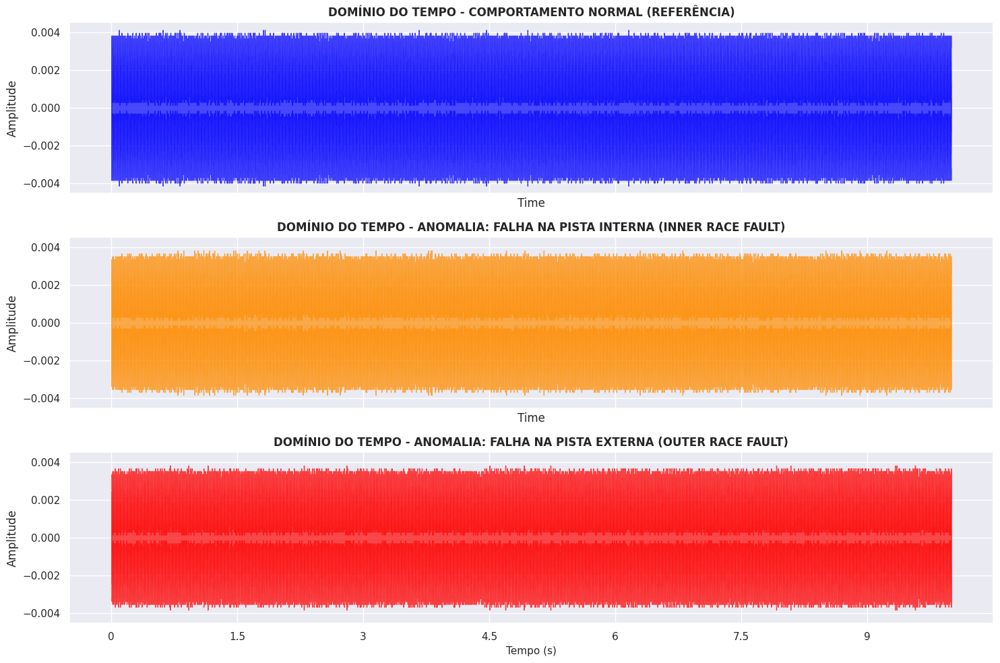

In [7]:
# =========================================================
# FINAL NOTEBOOK | Seleção de sinais e painel temporal bruto
# Papel deste bloco:
# - separa sinais normais e anômalos
# - constrói a referência visual antes do DSP
# =========================================================
print("📊 Extraindo amostras do Kaggle para visualização técnica...")

# Ensure SR_TARGET is used as sr
sr = SR_TARGET

# Find indices for normal and anomalous signals robustly
normal_signal = None
inner_signal = None
outer_signal = None
anomaly_signal = None

# Attempt to find a normal signal (label 0)
normal_indices = [i for i, label in enumerate(y_train) if label == 0]
if normal_indices:
    normal_signal = X_train[normal_indices[0]]
    print(f"Sinal Normal encontrado no índice: {normal_indices[0]}")
else:
    print("Aviso: Nenhum sinal 'Normal' (label 0) encontrado em X_train/y_train para visualização.")

# Attempt to find anomalous signals (label 1)
anomalous_indices = [i for i, label in enumerate(y_train) if label == 1]
if len(anomalous_indices) > 0:
    inner_signal = X_train[anomalous_indices[0]]
    anomaly_signal = inner_signal # Default anomaly signal for RPCA/NMF later
    print(f"Sinal Anômalo (Inner Race Fault) encontrado no índice: {anomalous_indices[0]}")

    # Try to find a second distinct anomalous signal for outer_signal, if available
    if len(anomalous_indices) > 1:
        outer_signal = X_train[anomalous_indices[1]]
        print(f"Sinal Anômalo (Outer Race Fault) encontrado no índice: {anomalous_indices[1]}")
    else:
        outer_signal = inner_signal # Use the same if only one available
        print("Apenas um sinal anômalo encontrado; usando-o para Inner e Outer Race Fault.")
else:
    print("Aviso: Nenhum sinal 'Anômalo' (label 1) encontrado em X_train/y_train para visualização.")
    # If no anomalous signals, the notebook will effectively halt or plot empty.
    # It's crucial for the rest of the notebook that anomaly_signal is defined if possible.
    # If there are no anomalous signals, the next cell will fail.

# If no anomaly_signal could be found at all, raise an error or inform the user that subsequent cells will fail.
if anomaly_signal is None:
    print("ERRO: Não foi possível encontrar nenhum sinal anômalo. As próximas células que dependem de 'anomaly_signal' falharão.")


# =========================================================
# 3. PLOTAGEM TÉCNICA (Painel Triplo)
# =========================================================
fig, ax = plt.subplots(3, 1, figsize=(15, 10), sharex=True, sharey=True)

# Onda Sonora - Comportamento Normal
if normal_signal is not None:
    librosa.display.waveshow(y=normal_signal, sr=sr, ax=ax[0], color='blue', alpha=0.7)
    ax[0].set_title('DOMÍNIO DO TEMPO - COMPORTAMENTO NORMAL (REFERÊNCIA)', fontsize=12, fontweight='bold')
    ax[0].set_ylabel('Amplitude')
else:
    ax[0].set_title('DOMÍNIO DO TEMPO - COMPORTAMENTO NORMAL (SINAL NÃO DISPONÍVEL)', fontsize=12, fontweight='bold', color='gray')
    ax[0].set_ylabel('Amplitude') # Keep label for consistency

# Onda Sonora - Falha na Pista Interna (Inner Race)
if inner_signal is not None:
    librosa.display.waveshow(y=inner_signal, sr=sr, ax=ax[1], color='darkorange', alpha=0.7)
    ax[1].set_title('DOMÍNIO DO TEMPO - ANOMALIA: FALHA NA PISTA INTERNA (INNER RACE FAULT)', fontsize=12, fontweight='bold')
    ax[1].set_ylabel('Amplitude')
else:
    ax[1].set_title('DOMÍNIO DO TEMPO - ANOMALIA: FALHA NA PISTA INTERNA (SINAL NÃO DISPONÍVEL)', fontsize=12, fontweight='bold', color='gray')
    ax[1].set_ylabel('Amplitude')

# Onda Sonora - Falha na Pista Externa (Outer Race)
if outer_signal is not None:
    librosa.display.waveshow(y=outer_signal, sr=sr, ax=ax[2], color='red', alpha=0.7)
    ax[2].set_title('DOMÍNIO DO TEMPO - ANOMALIA: FALHA NA PISTA EXTERNA (OUTER RACE FAULT)', fontsize=12, fontweight='bold')
    ax[2].set_xlabel('Tempo (s)', fontsize=11)
    ax[2].set_ylabel('Amplitude')
else:
    ax[2].set_title('DOMÍNIO DO TEMPO - ANOMALIA: FALHA NA PISTA EXTERNA (SINAL NÃO DISPONÍVEL)', fontsize=12, fontweight='bold', color='gray')
    ax[2].set_xlabel('Tempo (s)', fontsize=11)
    ax[2].set_ylabel('Amplitude')

plt.tight_layout()
plt.show()

## Bloco 3 | Frente 3 de DSP: HHT, UKF e HHT + UKF

Aqui definimos o núcleo de saneamento acústico do notebook.

**Função desta etapa.**
- reduzir ruído de fundo;
- preservar impactos mecânicos relevantes;
- preparar o sinal para comparação multi-frente na avaliação estrita.

O primeiro bloco implementa os filtros; o bloco seguinte transforma isso em um **painel visual comparativo**.


In [8]:
# =========================================================
# FINAL NOTEBOOK | Definição das frentes DSP
# Papel deste bloco:
# - implementa HHT, UKF e HHT + UKF
# - deixa o saneamento pronto para benchmark e visualização
# =========================================================
def _ukf_state_transition(x, dt):
    return np.array([x[0] + dt * x[1], x[1]], dtype=np.float64)


def _ukf_measurement_model(x):
    return np.array([x[0]], dtype=np.float64)


def _run_ukf_pass(signal, dt, process_var, measurement_var, alpha, beta, kappa):
    points = MerweScaledSigmaPoints(n=2, alpha=alpha, beta=beta, kappa=kappa)
    ukf = UnscentedKalmanFilter(
        dim_x=2,
        dim_z=1,
        dt=dt,
        fx=_ukf_state_transition,
        hx=_ukf_measurement_model,
        points=points,
    )

    signal_var = np.var(signal) + 1e-9
    ukf.x = np.array([signal[0], 0.0], dtype=np.float64)
    ukf.P = np.diag([signal_var * 5.0 + 1e-6, 1.0])
    ukf.Q = np.array(
        [
            [process_var, 0.0],
            [0.0, process_var * 0.25 + 1e-9],
        ],
        dtype=np.float64,
    )
    ukf.R = np.array([[measurement_var]], dtype=np.float64)

    estimates = np.empty(len(signal), dtype=np.float64)
    for i, sample in enumerate(signal):
        ukf.predict()
        ukf.update(np.array([sample], dtype=np.float64))
        estimates[i] = ukf.x[0]

    return estimates


def apply_hht_denoising(signal, sr=10000, max_imfs=2):
    """
    Aplica a Transformada de Hilbert-Huang (via EMD) para denoising e isolamento
    de um sinal de áudio, retornando o primeiro componente (IMF 0).
    """
    signal_64 = np.asarray(signal, dtype=np.float64).flatten()
    if signal_64.size < 8:
        return signal_64.astype(np.float32)

    emd_inst = EMD()

    try:
        imfs = emd_inst.emd(signal_64, max_imf=max_imfs)
        if imfs is not None and np.ndim(imfs) == 2 and imfs.shape[0] > 0:
            return imfs[0].astype(np.float32)
        return signal_64.astype(np.float32)
    except Exception:
        return signal_64.astype(np.float32)


def apply_ukf_denoising(
    signal,
    sr=10000,
    process_noise_scale=0.02,
    measurement_noise_scale=0.15,
    alpha=0.1,
    beta=2.0,
    kappa=0.0,
    bidirectional=True,
):
    """
    Frente 3 de DSP: filtro UKF para suavizar o ruído de sensor preservando a dinâmica do sinal.
    O estado é modelado como [amplitude, velocidade], uma formulação clássica para 1D sensor fusion.
    """
    signal_64 = np.asarray(signal, dtype=np.float64).flatten()
    if signal_64.size < 8:
        return signal_64.astype(np.float32)

    signal_var = np.var(signal_64) + 1e-9
    process_var = max(signal_var * process_noise_scale, 1e-9)
    measurement_var = max(signal_var * measurement_noise_scale, 1e-9)
    dt = 1.0 / max(sr, 1)

    forward = _run_ukf_pass(signal_64, dt, process_var, measurement_var, alpha, beta, kappa)
    if bidirectional:
        backward = _run_ukf_pass(signal_64[::-1], dt, process_var, measurement_var, alpha, beta, kappa)[::-1]
        filtered = 0.5 * (forward + backward)
    else:
        filtered = forward

    return filtered.astype(np.float32)


def apply_hht_ukf_denoising(signal, sr=10000):
    """
    Pipeline híbrido recomendado:
    1. HHT expõe os transientes de falha.
    2. UKF estabiliza o piso de ruído sem apagar os impactos principais.
    """
    hht_signal = apply_hht_denoising(signal, sr=sr, max_imfs=2)
    return apply_ukf_denoising(
        hht_signal,
        sr=sr,
        process_noise_scale=0.01,
        measurement_noise_scale=0.08,
        bidirectional=True,
    )


DSP_FRONT_OPTIONS = {
    "hht": apply_hht_denoising,
    "ukf": apply_ukf_denoising,
    "hht_ukf": apply_hht_ukf_denoising,
}

print("✅ Frente DSP 1: HHT pronta para o pipeline.")
print("✅ Frente DSP 3: UKF pronta para o pipeline.")
print("✅ Frente híbrida HHT + UKF pronta para uso experimental.")

✅ Frente DSP 1: HHT pronta para o pipeline.
✅ Frente DSP 3: UKF pronta para o pipeline.
✅ Frente híbrida HHT + UKF pronta para uso experimental.


In [10]:
# =========================================================
# FINAL NOTEBOOK | Painel visual comparativo do DSP
# Papel deste bloco:
# - mostra o efeito de cada frente no tempo
# - marca a região mais informativa sem poluir a leitura
# - NOVA ESTRUTURA: Duas figuras grandes (Normal e Anômalo) para caber no artigo
# =========================================================

# Supondo que as funções apply_hht_denoising, etc., normal_signal, anomaly_signal e SR_TARGET estejam definidas anteriormente.

# --- AJUSTE GLOBAL DE RESOULÇÃO (DPI) ---
# Isso garante que ao salvar, a imagem tenha alta qualidade.
plt.rcParams['figure.dpi'] = 300

print("⚙️ Processando as frentes DSP para os sinais de demonstração (Visualização de Artigo)...")

signal_normal_raw = normal_signal
signal_anomaly_raw = anomaly_signal
sr_visual = SR_TARGET

# --- DEFINIÇÃO DE TAMANHOS DE FONTE (ESTILO ARTIGO) ---
FONT_TITLE = 20
FONT_LABEL = 16
FONT_TICKS = 14
FONT_ANNOT = 12

def get_focus_window(signal, sr=10000, window_ms=140):
    if signal is None or len(signal) == 0:
        return 0.0, 0.15, 0.05

    envelope = np.abs(np.asarray(signal, dtype=np.float32))
    peak_idx = int(np.argmax(envelope))
    peak_time = peak_idx / sr
    half_window = window_ms / 2000.0
    t_start = max(0.0, peak_time - half_window)
    t_end = min(len(signal) / sr, peak_time + half_window)
    return t_start, t_end, peak_time


def plot_waveform_panel(ax, signal, sr, title, color, focus_window, annotation_text):
    if signal is None:
        ax.set_title(f"{title} (NÃO DISPONÍVEL)", fontsize=FONT_TITLE, fontweight='bold', color='gray')
        ax.set_xlabel('Tempo (s)', fontsize=FONT_LABEL)
        ax.grid(True, linestyle='--', alpha=0.25)
        return

    # A faixa amarela agora fica curta e elegante: destaca a região sem dominar todo o eixo Y.
    librosa.display.waveshow(y=signal, sr=sr, ax=ax, color=color, alpha=0.9)
    t_start, t_end, peak_time = focus_window

    peak_idx = min(int(peak_time * sr), len(signal) - 1)
    peak_amp = float(signal[peak_idx])
    signal_abs_max = float(np.max(np.abs(signal))) if np.max(np.abs(signal)) > 0 else 1.0
    focus_half = max((t_end - t_start) * 0.16, 0.004)
    span_start = max(0.0, peak_time - focus_half)
    span_end = min(len(signal) / sr, peak_time + focus_half)

    ax.axvspan(span_start, span_end, ymin=0.10, ymax=0.90, color='gold', alpha=0.14)
    ax.axvline(peak_time, ymin=0.12, ymax=0.88, color='gold', linestyle='--', linewidth=1.4, alpha=0.90)

    text_x = min(len(signal) / sr * 0.76, peak_time + 0.06)
    text_y = min(signal_abs_max * 0.78, signal_abs_max * 0.92)

    ax.scatter([peak_time], [peak_amp], s=170, facecolors='none', edgecolors='cyan', linewidths=1.8, zorder=5)

    # Anotação com fonte maior
    ax.annotate(
        annotation_text,
        xy=(peak_time, peak_amp),
        xytext=(text_x, text_y),
        fontsize=FONT_ANNOT, # Aumentado
        color='white',
        arrowprops=dict(arrowstyle='->', color='cyan', lw=1.3),
        bbox=dict(boxstyle='round,pad=0.3', fc='black', ec='cyan', alpha=0.42),
    )

    # Ajuste de títulos e eixos
    ax.set_title(title, fontsize=FONT_TITLE, fontweight='bold')
    ax.set_xlabel('Tempo (s)', fontsize=FONT_LABEL)
    ax.set_ylabel('Amplitude', fontsize=FONT_LABEL)

    # Ajuste dos ticks (números dos eixos)
    ax.tick_params(axis='both', which='major', labelsize=FONT_TICKS)
    ax.grid(True, linestyle='--', alpha=0.35)

# --- PROCESSAMENTO DSP (MANTIDO IGUAL) ---
signal_normal_hht = apply_hht_denoising(signal_normal_raw, sr=sr_visual) if signal_normal_raw is not None else None
signal_normal_ukf = apply_ukf_denoising(signal_normal_raw, sr=sr_visual) if signal_normal_raw is not None else None
signal_normal_hht_ukf = apply_hht_ukf_denoising(signal_normal_raw, sr=sr_visual) if signal_normal_raw is not None else None

signal_anomaly_hht = apply_hht_denoising(signal_anomaly_raw, sr=sr_visual) if signal_anomaly_raw is not None else None
signal_anomaly_ukf = apply_ukf_denoising(signal_anomaly_raw, sr=sr_visual) if signal_anomaly_raw is not None else None
signal_anomaly_hht_ukf = apply_hht_ukf_denoising(signal_anomaly_raw, sr=sr_visual) if signal_anomaly_raw is not None else None

normal_focus = get_focus_window(signal_normal_raw, sr=sr_visual)
anomaly_focus = get_focus_window(
    signal_anomaly_hht_ukf if signal_anomaly_hht_ukf is not None else signal_anomaly_raw,
    sr=sr_visual,
)

# ==============================================================================
# FIGURA 1: PAINEL NORMAL (2x2)
# Duas imagens por linha, fonte grande.
# ==============================================================================
print("🖼️ Gerando Painel Normal para Artigo...")
fig_normal, ax_n = plt.subplots(2, 2, figsize=(16, 12)) # Tamanho ajustado para 2x2

plot_waveform_panel(
    ax_n[0, 0],
    signal_normal_raw,
    sr_visual,
    'Normal | Bruto',
    '#3b82f6',
    normal_focus,
    'Observe que a energia é difusa.\nNão há repetição impulsiva dominante.',
)
plot_waveform_panel(
    ax_n[0, 1],
    signal_normal_hht,
    sr_visual,
    'Normal | Pós-HHT',
    '#22c55e',
    normal_focus,
    'O HHT remove tendência lenta.\nAqui o residual segue estável.',
)
plot_waveform_panel(
    ax_n[1, 0],
    signal_normal_ukf,
    sr_visual,
    'Normal | Pós-UKF',
    '#8b5cf6',
    normal_focus,
    'O UKF suaviza o ruído de sensor.\nA linha fica mais coerente no tempo.',
)
plot_waveform_panel(
    ax_n[1, 1],
    signal_normal_hht_ukf,
    sr_visual,
    'Normal | HHT + UKF',
    '#f59e0b',
    normal_focus,
    'Combinação com piso de ruído mais limpo.\nO padrão normal segue sem estalos fortes.',
)

plt.suptitle(
    'Painel Comparativo DSP | Sinais NORMAS (HHT vs UKF vs Híbrido)',
    fontsize=24, # Título principal maior
    fontweight='bold',
    y=1.01
)
plt.tight_layout()
# Para salvar em alta resolução:
# fig_normal.savefig('dsp_panel_normal.png', dpi=300, bbox_inches='tight')
plt.show()

# ==============================================================================
# FIGURA 2: PAINEL ANÔMALO (2x2)
# Duas imagens por linha, fonte grande.
# ==============================================================================
print("🖼️ Gerando Painel Anômalo para Artigo...")
fig_anomaly, ax_a = plt.subplots(2, 2, figsize=(16, 12)) # Tamanho ajustado para 2x2

plot_waveform_panel(
    ax_a[0, 0],
    signal_anomaly_raw,
    sr_visual,
    'Anômalo | Bruto',
    '#ef4444',
    anomaly_focus,
    'A região dourada já contém o evento,\nmas ele ainda está mascarado pelo ruído.',
)
plot_waveform_panel(
    ax_a[0, 1],
    signal_anomaly_hht,
    sr_visual,
    'Anômalo | Pós-HHT',
    '#f97316',
    anomaly_focus,
    'Aqui os impactos impulsivos aparecem.\nEles ganham contraste para a IA.',
)
plot_waveform_panel(
    ax_a[1, 0],
    signal_anomaly_ukf,
    sr_visual,
    'Anômalo | Pós-UKF',
    '#a855f7',
    anomaly_focus,
    'O UKF estabiliza a trajetória.\nAjuda a separar impacto real de ruído aleatório.',
)
plot_waveform_panel(
    ax_a[1, 1],
    signal_anomaly_hht_ukf,
    sr_visual,
    'Anômalo | HHT + UKF',
    '#facc15',
    anomaly_focus,
    'Melhor leitura visual do evento.\nO estalo principal fica curto, forte e bem localizado.',
)

plt.suptitle(
    'Painel Comparativo DSP | Sinais ANÔMALOS (HHT vs UKF vs Híbrido)',
    fontsize=24, # Título principal maior
    fontweight='bold',
    y=1.01
)
plt.tight_layout()
# Para salvar em alta resolução:
# fig_anomaly.savefig('dsp_panel_anomaly.png', dpi=300, bbox_inches='tight')
plt.show()

print("\n" + "=" * 92)
print(" 📊 RELATÓRIO DIDÁTICO DO DSP")
print("=" * 92)
print("1. HHT: excelente para expor transientes curtos ligados a atrito, choque e impacto.")
print("2. UKF: excelente para estabilizar ruído de sensor e preservar continuidade dinâmica.")
print("3. HHT + UKF: recomendado quando você quer expor a falha e ao mesmo tempo reduzir o piso de ruído.")
print("4. O círculo ciano marca o ponto de maior energia local; a faixa dourada mostra a janela que merece inspeção.")
print("5. Para sinais normais, queremos residual baixo e sem repetição impulsiva. Para sinais anômalos, buscamos estalos concentrados.")
print("=" * 92)

Output hidden; open in https://colab.research.google.com to view.

# Salvar as imagens dos graficos

In [14]:
# =========================================================
# FONTES 20 NAS CAIXINHAS COM QUEBRA DE LINHA
# =========================================================

print("🚀 Gerando imagens com padrão Emanoel (Fonte 20)...")

plt.rcParams['figure.dpi'] = 300
F_TITLE = 22
F_LABEL = 18
F_TICKS = 16
F_ANNOT = 20

def salvar_painel_emanoel(sinais, titulos, cores, focus, descricoes, nome_arquivo, sup_title):
    # Aumentei um pouco o figsize (18, 14) para dar respiro à fonte 20
    fig, axes = plt.subplots(2, 2, figsize=(18, 14))
    axes = axes.flatten()

    for i in range(4):
        plot_waveform_panel(axes[i], sinais[i], sr_visual, titulos[i], cores[i], focus, descricoes[i])

        axes[i].set_title(titulos[i], fontsize=F_TITLE, fontweight='bold')
        axes[i].set_xlabel('Tempo (s)', fontsize=F_LABEL)
        axes[i].set_ylabel('Amplitude', fontsize=F_LABEL)
        axes[i].tick_params(labelsize=F_TICKS)

        # Procura a caixinha de texto e força o tamanho 20
        for child in axes[i].get_children():
            if isinstance(child, plt.Text) and child.get_bbox_patch() is not None:
                child.set_fontsize(F_ANNOT)

    plt.suptitle(sup_title, fontsize=26, fontweight='bold', y=1.05)
    plt.tight_layout()
    plt.savefig(nome_arquivo, dpi=300, bbox_inches='tight')
    print(f"✅ Arquivo '{nome_arquivo}' gerado com sucesso!")
    plt.close(fig)

# --- TEXTOS REVISADOS COM \n PARA NÃO TRANSBORDAR ---

textos_normais = [
    "Energia difusa.\nSem padrão\nimpulsivo.",
    "HHT remove\ntendências.\nSinal estável.",
    "UKF suaviza\no ruído.\nMais coerente.",
    "Piso limpo.\nPadronagem\nconstante."
]

textos_anomalos = [
    "Evento\nmascarado.\nRuído alto.",
    "Impactos\nexpostos.\nContraste.",
    "Trajetória\nestável.\nIsola choque.",
    "Estalo forte.\nLeitura\nclara."
]

# 1. SALVAR PAINEL NORMAL
salvar_painel_emanoel(
    [signal_normal_raw, signal_normal_hht, signal_normal_ukf, signal_normal_hht_ukf],
    ['Normal | Bruto', 'Normal | Pós-HHT', 'Normal | Pós-UKF', 'Normal | HHT + UKF'],
    ['#3b82f6', '#22c55e', '#8b5cf6', '#f59e0b'],
    normal_focus,
    textos_normais,
    'painel_normal.png',
    'Análise Metodológica: Sinais Normais'
)

# 2. SALVAR PAINEL ANÔMALO
salvar_painel_emanoel(
    [signal_anomaly_raw, signal_anomaly_hht, signal_anomaly_ukf, signal_anomaly_hht_ukf],
    ['Anômalo | Bruto', 'Anômalo | Pós-HHT', 'Anômalo | Pós-UKF', 'Anômalo | HHT + UKF'],
    ['#ef4444', '#f97316', '#a855f7', '#facc15'],
    anomaly_focus,
    textos_anomalos,
    'painel_anomalo.png',
    'Análise Metodológica: Sinais Anômalos'
)

print("\n🎉 Pronto! Baixe as versões 'atualizadas' na pastinha 📁 lateral.")

🚀 Gerando imagens com padrão Emanoel (Fonte 20)...
✅ Arquivo 'painel_normal_emanoel.png' gerado com sucesso!
✅ Arquivo 'painel_anomalo_emanoel.png' gerado com sucesso!

🎉 Pronto! Baixe as versões 'emanoel' na pastinha 📁 lateral.


## Bloco 3.2 | Geração do banco DSP com cache e reuso

Este é o ponto em que o sinal bruto vira a base `DSP` principal da execução.

**O que foi reforçado nesta versão final.**
- cache persistente para evitar recalcular HHT/UKF sem necessidade;
- relatório de tempo da etapa;
- manutenção dos aliases legados para não quebrar células antigas.

**Leitura operacional.**
Na primeira rodada, o custo pode ser alto. Nas rodadas seguintes, a expectativa é reaproveitar o cache e encurtar bastante o tempo.


In [15]:
# =========================================================
# FINAL NOTEBOOK | Banco DSP com cache incremental
# Papel deste bloco:
# - gera X_train_dsp_signals
# - reaproveita cache de HHT/UKF
# - mede tempo e registra o relatório da etapa
# =========================================================
# Frente configurável de DSP antes da segmentação
import hashlib
import pickle
from pathlib import Path
from joblib import Parallel, delayed

X_subset = X_train
y_subset = y_train

DSP_FRONT = os.getenv('AAD_DSP_FRONT', 'hht_ukf').strip().lower()
DSP_FRONT_LABELS = {
    'hht': 'HHT',
    'ukf': 'UKF',
    'hht_ukf': 'HHT + UKF',
}

DSP_CACHE_ENABLE = os.getenv('AAD_DSP_CACHE', '1').strip().lower() in {'1', 'true', 'yes', 'sim'}
DSP_CACHE_DIR = Path(os.getenv('AAD_DSP_CACHE_DIR', 'aad_dsp_cache')).expanduser()
DSP_CACHE_FORCE_REBUILD = os.getenv('AAD_DSP_FORCE_REBUILD', '0').strip().lower() in {'1', 'true', 'yes', 'sim'}
DSP_MAX_LEN = int(os.getenv('AAD_DSP_MAX_LEN', '20000'))
DSP_HASH_POINTS = max(16, int(os.getenv('AAD_DSP_HASH_POINTS', '96')))
DSP_PARALLEL_ENABLE = os.getenv('AAD_DSP_PARALLEL', '1').strip().lower() in {'1', 'true', 'yes', 'sim'}
DSP_PARALLEL_JOBS = max(1, min(int(os.getenv('AAD_DSP_JOBS', str(min(3, globals().get('CPU_THREADS', 2))))), globals().get('CPU_THREADS', 2)))
DSP_PARALLEL_MIN_SIGNALS = max(4, int(os.getenv('AAD_DSP_PARALLEL_MIN_SIGNALS', '12')))

if DSP_FRONT not in DSP_FRONT_OPTIONS:
    raise ValueError(
        f"Frente DSP inválida: {DSP_FRONT}. Use uma entre {list(DSP_FRONT_OPTIONS.keys())}."
    )

DSP_CACHE_DIR.mkdir(parents=True, exist_ok=True)


def build_dsp_signal_fingerprint(signal, max_len, sample_points=DSP_HASH_POINTS):
    signal_f32 = np.asarray(signal, dtype=np.float32).flatten()
    signal_short = signal_f32[:min(len(signal_f32), max_len)]
    if signal_short.size == 0:
        return b'empty'

    sample_points = min(sample_points, signal_short.size)
    if signal_short.size <= sample_points:
        probe = signal_short
    else:
        idx = np.linspace(0, signal_short.size - 1, num=sample_points, dtype=np.int64)
        probe = signal_short[idx]

    summary = np.asarray(
        [
            float(signal_short.size),
            float(probe.mean()),
            float(probe.std()),
            float(probe.max()),
            float(probe.min()),
            float(probe[0]),
            float(probe[-1]),
        ],
        dtype=np.float32,
    )
    return summary.tobytes() + np.asarray(probe, dtype=np.float32).tobytes()


def build_dsp_cache_key(signals, labels, front_name, sr, max_len):
    hasher = hashlib.sha1()
    hasher.update(f"{front_name}|{sr}|{max_len}|{len(signals)}".encode('utf-8'))
    hasher.update(np.asarray(labels, dtype=np.int64).tobytes())
    for sig in signals:
        hasher.update(build_dsp_signal_fingerprint(sig, max_len))
    return hasher.hexdigest()


def resolve_dsp_cache_path(cache_key):
    return DSP_CACHE_DIR / f"dsp_stage_{cache_key}.pkl"


def load_dsp_cache_payload(cache_key):
    runtime_cache = globals().setdefault('_DSP_RUNTIME_CACHE', {})
    if cache_key in runtime_cache and not DSP_CACHE_FORCE_REBUILD:
        return runtime_cache[cache_key], 'memória'

    cache_path = resolve_dsp_cache_path(cache_key)
    if DSP_CACHE_ENABLE and cache_path.exists() and not DSP_CACHE_FORCE_REBUILD:
        with cache_path.open('rb') as handle:
            payload = pickle.load(handle)
        runtime_cache[cache_key] = payload
        return payload, str(cache_path)

    return None, None


def save_dsp_cache_payload(cache_key, payload):
    runtime_cache = globals().setdefault('_DSP_RUNTIME_CACHE', {})
    runtime_cache[cache_key] = payload

    if not DSP_CACHE_ENABLE:
        return None

    cache_path = resolve_dsp_cache_path(cache_key)
    with cache_path.open('wb') as handle:
        pickle.dump(payload, handle, protocol=pickle.HIGHEST_PROTOCOL)
    return str(cache_path)


def _process_single_signal_with_front(sig, front_name, sr, max_len):
    dsp_processor = DSP_FRONT_OPTIONS[front_name]
    try:
        signal_short = np.asarray(sig[:min(len(sig), max_len)], dtype=np.float32)
        signal_dsp = dsp_processor(signal_short, sr=sr)
        return np.asarray(signal_dsp, dtype=np.float32)
    except Exception as e:
        print(
            f"Erro ao processar sinal com {DSP_FRONT_LABELS[front_name]}: {e}. "
            "Anexando sinal original truncado."
        )
        return np.asarray(sig[:min(len(sig), max_len)], dtype=np.float32)


def process_signals_with_front(signals, front_name, sr=SR_TARGET, max_len=20000, desc_prefix='Filtrando Sinais'):
    if front_name not in DSP_FRONT_OPTIONS:
        raise ValueError(
            f"Frente DSP inválida: {front_name}. Use uma entre {list(DSP_FRONT_OPTIONS.keys())}."
        )

    signals = list(signals)
    if len(signals) == 0:
        return []

    use_parallel = bool(DSP_PARALLEL_ENABLE and len(signals) >= DSP_PARALLEL_MIN_SIGNALS and DSP_PARALLEL_JOBS > 1)
    if use_parallel:
        jobs = max(1, min(DSP_PARALLEL_JOBS, len(signals)))
        print(f"   -> DSP paralelo ativo para {DSP_FRONT_LABELS[front_name]} | jobs={jobs} | sinais={len(signals)}")
        return Parallel(n_jobs=jobs, prefer='processes')(
            delayed(_process_single_signal_with_front)(sig, front_name, sr, max_len)
            for sig in signals
        )

    processed_signals = []
    for sig in tqdm(signals, desc=f"{desc_prefix} ({DSP_FRONT_LABELS[front_name]})"):
        processed_signals.append(_process_single_signal_with_front(sig, front_name, sr, max_len))

    return processed_signals


print(f"⚡ Iniciando Processamento DSP com a frente '{DSP_FRONT_LABELS[DSP_FRONT]}'...")
print("   Opções disponíveis: hht | ukf | hht_ukf")
print(
    f"   Cache DSP: {'ATIVO' if DSP_CACHE_ENABLE else 'inativo'} | "
    f"max_len={DSP_MAX_LEN} | force_rebuild={'SIM' if DSP_CACHE_FORCE_REBUILD else 'NÃO'}"
)

dsp_start_time = time.time()
dsp_cache_key = build_dsp_cache_key(X_subset, y_subset, DSP_FRONT, SR_TARGET, DSP_MAX_LEN)
dsp_payload, dsp_cache_origin = load_dsp_cache_payload(dsp_cache_key)
dsp_cache_hit = dsp_payload is not None

if dsp_cache_hit:
    X_train_dsp_signals = [np.asarray(sig, dtype=np.float32) for sig in dsp_payload['signals']]
    y_train_dsp = np.asarray(dsp_payload['labels'], dtype=np.int64)
    print(f"♻️ Cache DSP encontrado ({dsp_cache_origin}). Reaproveitando sinais já filtrados.")
else:
    X_train_dsp_signals = process_signals_with_front(
        X_subset,
        DSP_FRONT,
        sr=SR_TARGET,
        max_len=DSP_MAX_LEN,
        desc_prefix='Filtrando Sinais'
    )
    y_train_dsp = np.array(y_subset, dtype=np.int64)
    dsp_payload = {
        'front_name': DSP_FRONT,
        'front_label': DSP_FRONT_LABELS[DSP_FRONT],
        'sr': int(SR_TARGET),
        'max_len': int(DSP_MAX_LEN),
        'signals': X_train_dsp_signals,
        'labels': y_train_dsp,
    }
    dsp_cache_origin = save_dsp_cache_payload(dsp_cache_key, dsp_payload)

dsp_elapsed = time.time() - dsp_start_time

DSP_FRONT_ATIVO = DSP_FRONT
DSP_FRONT_ATIVO_LABEL = DSP_FRONT_LABELS[DSP_FRONT]
X_train_dsp = X_train_dsp_signals

# Alias legados para nao quebrar secoes antigas; prefira os nomes DSP.
X_train_hht = X_train_dsp_signals
y_train_hht = y_train_dsp

dsp_lengths = np.asarray([len(sig) for sig in X_train_dsp_signals], dtype=np.int32) if len(X_train_dsp_signals) > 0 else np.asarray([], dtype=np.int32)
DSP_STAGE_REPORT = {
    'front_name': DSP_FRONT_ATIVO,
    'front_label': DSP_FRONT_ATIVO_LABEL,
    'cache_hit': bool(dsp_cache_hit),
    'cache_origin': dsp_cache_origin if dsp_cache_origin is not None else '',
    'cache_key': dsp_cache_key,
    'cache_enabled': bool(DSP_CACHE_ENABLE),
    'max_len': int(DSP_MAX_LEN),
    'num_signals': int(len(X_train_dsp_signals)),
    'avg_signal_len': float(dsp_lengths.mean()) if dsp_lengths.size > 0 else 0.0,
    'max_signal_len': int(dsp_lengths.max()) if dsp_lengths.size > 0 else 0,
    'elapsed_seconds': float(dsp_elapsed),
}
globals()['DSP_STAGE_REPORT'] = dict(DSP_STAGE_REPORT)

print(f"\n✅ PROCESSAMENTO DSP CONCLUÍDO!")
print(f"📊 Variável principal 'X_train_dsp_signals' pronta com {len(X_train_dsp_signals)} sinais.")
print("🔁 Alias legado ativo: `X_train_hht` / `y_train_hht` (somente compatibilidade com células antigas).")
print(f"🧪 Frente ativa nesta execução: {DSP_FRONT_ATIVO_LABEL}")
print(
    f"⏱️ Tempo da etapa DSP: {dsp_elapsed:.2f}s | "
    f"cache={'HIT' if dsp_cache_hit else 'MISS'} | "
    f"sinais={len(X_train_dsp_signals)} | "
    f"comprimento médio={DSP_STAGE_REPORT['avg_signal_len']:.1f}"
)
if dsp_cache_origin:
    print(f"💾 Origem do reuso DSP: {dsp_cache_origin}")
print("🧭 Para comparar as três frentes na Frente 5, use:")
print("   export AAD_COMPARE_ALL_DSP_FRONTS=1")
print("   ou export AAD_DSP_BENCHMARK_FRONTS='hht,ukf,hht_ukf'")

⚡ Iniciando Processamento DSP com a frente 'HHT + UKF'...
   Opções disponíveis: hht | ukf | hht_ukf
   Cache DSP: ATIVO | max_len=20000 | force_rebuild=NÃO


Filtrando Sinais (HHT + UKF): 100%|██████████| 1000/1000 [1:57:43<00:00,  7.06s/it]


✅ PROCESSAMENTO DSP CONCLUÍDO!
📊 Variável principal 'X_train_dsp_signals' pronta com 1000 sinais.
🔁 Alias legado ativo: `X_train_hht` / `y_train_hht` (somente compatibilidade com células antigas).
🧪 Frente ativa nesta execução: HHT + UKF
⏱️ Tempo da etapa DSP: 7064.04s | cache=MISS | sinais=1000 | comprimento médio=20000.0
💾 Origem do reuso DSP: aad_dsp_cache/dsp_stage_caf7d8c9b9f7b8b2fde4af02e3ffddff7eca3904.pkl
🧭 Para comparar as três frentes na Frente 5, use:
   export AAD_COMPARE_ALL_DSP_FRONTS=1
   ou export AAD_DSP_BENCHMARK_FRONTS='hht,ukf,hht_ukf'


## Bloco 4 | Janela deslizante com metadados de origem

Depois do DSP, o sinal contínuo é convertido em **janelas analíticas**.

**Por que esta etapa é crítica.**
- define a granularidade que os modelos enxergam;
- preserva `arquivo`, `grupo` e `classe`;
- sustenta a `Frente 6`, que evita vazamento entre janelas irmãs.



[PASSO 1] Fatiando áudios pós-DSP com janela deslizante...


Fatiando Janelas: 100%|██████████| 1000/1000 [00:00<00:00, 236272.19áudio/s]



[PASSO 2] Extraindo features estruturais para 1000 fatias...


Extraindo Features: 100%|██████████| 1000/1000 [00:59<00:00, 16.74fatia/s]



[PASSO 3] Pré-visualização didática da Frente 4 (Mixup)...


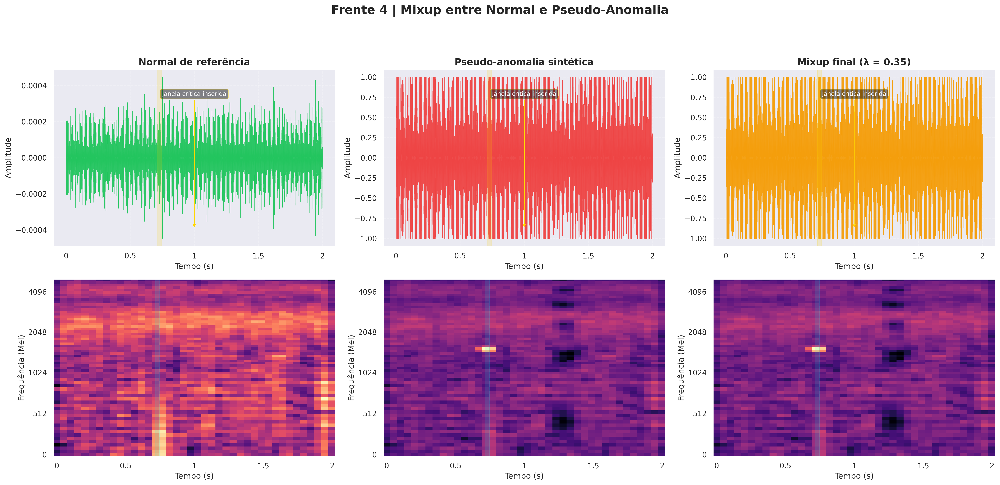

,Sinal,Leitura
0,Normal,Referência da máquina sem defeito explícito
1,Pseudo-anomalia,"Evento sintético entre 0.713s e 0.747s, com po..."
2,Mixup,Combinação convexa com λ=0.35; serve para ensi...



🎯 DATASET ESTRUTURAL GERADO COM SUCESSO!
-> Tensor Mel (CNN): (1000, 1, 64, 64)
-> Vetor MFCC (XGBoost): (1000, 26)
-> Tensor CWT Wavelet: (1000, 1, 64, 64)
-> Erro NMF (Exp 5): (1000,)
-> Frente 4 Mixup ativa: True
-> Configuração Mixup: razão=0.20 | alpha=0.40 | alvo FPR=0.10


In [16]:
# =========================================================
# FINAL NOTEBOOK | Janela deslizante com metadados
# Papel deste bloco:
# - fatia os sinais
# - preserva origem por arquivo
# - sustenta a Frente 6
# =========================================================
def build_signal_metadata(file_names=None, labels=None, groups=None, folders=None):
    labels = np.asarray(labels if labels is not None else [], dtype=np.int64)
    total = int(len(labels))

    file_names = list(file_names) if file_names is not None else [f'arquivo_{i:04d}.csv' for i in range(total)]
    groups = list(groups) if groups is not None else [Path(name).stem for name in file_names]
    folders = list(folders) if folders is not None else ['desconhecido'] * total

    if not (len(file_names) == len(groups) == len(folders) == total):
        raise ValueError("Os metadados de origem precisam ter o mesmo tamanho da lista de sinais.")

    metadata = []
    for idx, (name, label, group, folder) in enumerate(zip(file_names, labels, groups, folders)):
        metadata.append({
            'source_index': int(idx),
            'source_file': str(name),
            'source_folder': str(folder),
            'group_id': str(group),
            'class_label': int(label),
            'class_name': 'Anômalo' if int(label) == 1 else 'Normal',
        })
    return metadata


def apply_sliding_window_to_list(
    audio_list,
    labels_list,
    sr=10000,
    window_size=2.0,
    overlap=0.5,
    metadata_list=None,
    return_metadata=False,
):
    step = int(window_size * sr * (1 - overlap))
    w_len = int(window_size * sr)
    all_segments, all_labels = [], []
    all_metadata = []

    for i, audio in enumerate(tqdm(audio_list, desc="Fatiando Janelas", unit="áudio")):
        label = int(labels_list[i])
        base_metadata = {}
        if metadata_list is not None and i < len(metadata_list):
            candidate = metadata_list[i]
            if isinstance(candidate, dict):
                base_metadata = dict(candidate)
            else:
                base_metadata = {'group_id': str(candidate), 'source_file': str(candidate)}

        if 'group_id' not in base_metadata:
            base_metadata['group_id'] = f'arquivo_{i:04d}'
        if 'source_file' not in base_metadata:
            base_metadata['source_file'] = str(base_metadata['group_id'])
        if 'source_folder' not in base_metadata:
            base_metadata['source_folder'] = 'desconhecido'
        base_metadata['source_index'] = int(base_metadata.get('source_index', i))
        base_metadata['class_label'] = label
        base_metadata['class_name'] = 'Anômalo' if label == 1 else 'Normal'

        if len(audio) < w_len:
            audio = np.pad(audio, (0, w_len - len(audio)))

        for window_idx, start in enumerate(range(0, len(audio) - w_len + 1, step)):
            all_segments.append(audio[start : start + w_len].astype(np.float32, copy=False))
            all_labels.append(label)

            if return_metadata:
                window_meta = dict(base_metadata)
                window_meta.update({
                    'window_index': int(window_idx),
                    'start_sample': int(start),
                    'end_sample': int(start + w_len),
                    'start_s': round(start / sr, 4),
                    'end_s': round((start + w_len) / sr, 4),
                    'window_size_s': float(window_size),
                    'overlap': float(overlap),
                })
                all_metadata.append(window_meta)

    segments = np.array(all_segments, dtype=np.float32)
    labels = np.array(all_labels, dtype=np.int64)

    if return_metadata:
        return segments, labels, pd.DataFrame(all_metadata)
    return segments, labels


def build_grouped_protocol_split(
    window_metadata_df,
    test_size=0.30,
    random_state=42,
    group_col='group_id',
    label_col='class_label',
):
    if not isinstance(window_metadata_df, pd.DataFrame) or window_metadata_df.empty:
        raise ValueError("A Frente 6 precisa de um DataFrame de metadados das janelas.")

    df = window_metadata_df.copy().reset_index(drop=True)
    required_cols = {group_col, label_col, 'source_file', 'source_folder', 'class_name'}
    missing_cols = required_cols.difference(df.columns)
    if missing_cols:
        raise ValueError(f"Metadados insuficientes para a Frente 6: {sorted(missing_cols)}")

    label_consistency = df.groupby(group_col)[label_col].nunique()
    if (label_consistency > 1).any():
        raise RuntimeError("Um mesmo arquivo foi associado a mais de uma classe. Revise os metadados antes do split.")

    source_df = (
        df[[group_col, label_col, 'class_name', 'source_file', 'source_folder']]
        .drop_duplicates(subset=[group_col])
        .reset_index(drop=True)
    )

    unique_groups = source_df[group_col].to_numpy()
    group_labels = source_df[label_col].to_numpy()

    can_stratify = (
        len(np.unique(group_labels)) > 1
        and np.min(np.bincount(group_labels)) >= 2
        and len(unique_groups) >= 4
    )
    stratify_labels = group_labels if can_stratify else None

    train_groups, test_groups = train_test_split(
        unique_groups,
        test_size=test_size,
        random_state=random_state,
        stratify=stratify_labels,
    )

    train_mask = df[group_col].isin(train_groups).to_numpy()
    test_mask = df[group_col].isin(test_groups).to_numpy()
    train_idx = np.flatnonzero(train_mask)
    test_idx = np.flatnonzero(test_mask)

    if len(train_idx) == 0 or len(test_idx) == 0:
        raise RuntimeError("A Frente 6 gerou um split vazio. Ajuste o tamanho do teste ou o número de arquivos.")

    shared_groups = sorted(set(train_groups).intersection(set(test_groups)))

    audit_df = df[[group_col, 'source_file', 'source_folder', 'class_name']].copy()
    audit_df['Split'] = np.where(train_mask, 'Treino', 'Teste')

    file_summary = (
        audit_df.drop_duplicates(subset=[group_col])
        .groupby(['Split', 'class_name'])
        .size()
        .rename('Arquivos')
        .reset_index()
    )
    window_summary = (
        audit_df.groupby(['Split', 'class_name'])
        .size()
        .rename('Janelas')
        .reset_index()
    )
    summary_table = (
        pd.merge(file_summary, window_summary, on=['Split', 'class_name'], how='outer')
        .fillna(0)
        .rename(columns={'class_name': 'Classe'})
        .sort_values(['Split', 'Classe'])
        .reset_index(drop=True)
    )
    if not summary_table.empty:
        summary_table[['Arquivos', 'Janelas']] = summary_table[['Arquivos', 'Janelas']].astype(int)

    source_table = (
        audit_df.drop_duplicates(subset=[group_col])
        .sort_values(['Split', 'class_name', 'source_file'])
        .reset_index(drop=True)
    )

    return {
        'train_idx': train_idx.astype(np.int64),
        'test_idx': test_idx.astype(np.int64),
        'train_groups': list(train_groups),
        'test_groups': list(test_groups),
        'shared_group_count': int(len(shared_groups)),
        'shared_groups': shared_groups,
        'summary_table': summary_table,
        'audit_table': source_table,
        'protocol_label': 'holdout agrupado por arquivo de origem',
        'grouping_label': 'arquivo de origem',
    }


def apply_cwt(signal, sr, wavelet='morl', scales=None):
    if scales is None:
        max_scale = len(signal) / (2 * sr)
        scales = np.arange(1, int(max_scale * 10), 1) if int(max_scale * 10) > 1 else np.array([1])
    coefficients, frequencies = pywt.cwt(signal, scales, wavelet, sampling_period=1 / sr)
    return coefficients, frequencies


def safe_normalize_audio(signal):
    signal = np.asarray(signal, dtype=np.float32)
    peak = np.max(np.abs(signal)) + 1e-9
    return (signal / peak).astype(np.float32)


def create_pseudo_anomaly(signal, sr=10000, rng=None, return_metadata=False):
    rng = rng or np.random.default_rng(42)
    x = np.asarray(signal, dtype=np.float32).copy()

    if x.size < 128:
        metadata = {
            'event_start_s': 0.0,
            'event_end_s': min(len(x) / max(sr, 1), 0.01),
            'carrier_freq_hz': 0.0,
            'strategy': 'sinal_curto_sem_perturbacao'
        }
        return (x, metadata) if return_metadata else x

    n = len(x)
    sig_std = float(np.std(x) + 1e-6)

    event_len = int(rng.integers(max(64, int(0.03 * sr)), max(65, int(0.12 * sr))))
    event_start = int(rng.integers(0, max(1, n - event_len)))
    event_end = min(n, event_start + event_len)

    burst_t = np.arange(event_end - event_start) / sr
    carrier_freq = float(rng.uniform(250.0, min(sr / 3, 2400.0)))
    burst = np.sin(2 * np.pi * carrier_freq * burst_t + rng.uniform(0, 2 * np.pi))
    burst *= np.hanning(max(8, burst.size))
    burst *= rng.uniform(2.0, 4.5) * sig_std
    x[event_start:event_end] += burst.astype(np.float32)

    patch_len = int(rng.integers(max(64, int(0.05 * sr)), max(65, int(0.18 * sr))))
    patch_start = int(rng.integers(0, max(1, n - patch_len)))
    patch_end = min(n, patch_start + patch_len)
    patch = x[patch_start:patch_end].copy()

    if patch.size > 8:
        operation_id = int(rng.integers(0, 3))
        if operation_id == 0:
            patch = patch[::-1]
            strategy = 'burst + inversão local'
        elif operation_id == 1:
            patch = np.roll(patch, int(rng.integers(4, max(5, patch.size // 3))))
            strategy = 'burst + deslocamento local'
        else:
            order = np.arange(patch.size)
            rng.shuffle(order)
            patch = patch[order]
            strategy = 'burst + embaralhamento local'
        x[patch_start:patch_end] = 0.65 * x[patch_start:patch_end] + 0.35 * patch.astype(np.float32)
    else:
        strategy = 'burst localizado'

    x = np.clip(x, -3.0 * (sig_std + 1e-6), 3.0 * (sig_std + 1e-6))
    x = safe_normalize_audio(x)

    metadata = {
        'event_start_s': round(event_start / sr, 4),
        'event_end_s': round(event_end / sr, 4),
        'event_center_s': round(((event_start + event_end) / 2) / sr, 4),
        'carrier_freq_hz': round(carrier_freq, 1),
        'patch_start_s': round(patch_start / sr, 4),
        'patch_end_s': round(patch_end / sr, 4),
        'strategy': strategy,
    }
    return (x.astype(np.float32), metadata) if return_metadata else x.astype(np.float32)


def mixup_audio_pair(normal_signal, pseudo_signal, alpha=0.4, rng=None, lam_bounds=(0.35, 0.85)):
    rng = rng or np.random.default_rng(42)
    lam = float(np.clip(rng.beta(alpha, alpha), lam_bounds[0], lam_bounds[1]))
    mixed = lam * np.asarray(normal_signal, dtype=np.float32) + (1.0 - lam) * np.asarray(pseudo_signal, dtype=np.float32)
    return safe_normalize_audio(mixed), lam


def create_mixup_dataset(normal_segments, sr=10000, mixup_ratio=0.2, alpha=0.4, max_samples=800, seed=42):
    normal_segments = np.asarray(normal_segments, dtype=np.float32)
    if normal_segments.size == 0 or mixup_ratio <= 0:
        return np.empty((0,), dtype=np.float32), np.empty((0,), dtype=np.int64), pd.DataFrame()

    rng = np.random.default_rng(seed)
    total = min(int(np.ceil(len(normal_segments) * mixup_ratio)), max_samples)
    if total <= 0:
        return np.empty((0,), dtype=np.float32), np.empty((0,), dtype=np.int64), pd.DataFrame()

    replace = len(normal_segments) < total
    chosen_idx = rng.choice(len(normal_segments), size=total, replace=replace)

    mix_segments = []
    rows = []
    for sample_id, base_idx in enumerate(chosen_idx, start=1):
        base_signal = normal_segments[int(base_idx)]
        pseudo_signal, meta = create_pseudo_anomaly(base_signal, sr=sr, rng=rng, return_metadata=True)
        mixed_signal, lam = mixup_audio_pair(base_signal, pseudo_signal, alpha=alpha, rng=rng)
        mix_segments.append(mixed_signal.astype(np.float32))
        rows.append({
            'Amostra': sample_id,
            'Indice_Base': int(base_idx),
            'Lambda': round(lam, 4),
            'Evento (s)': f"{meta['event_start_s']:.3f}-{meta['event_end_s']:.3f}",
            'Portadora (Hz)': meta['carrier_freq_hz'],
            'Estratégia': meta['strategy'],
        })

    return (
        np.array(mix_segments, dtype=np.float32),
        np.ones(len(mix_segments), dtype=np.int64),
        pd.DataFrame(rows),
    )


def extract_features(X_segments, sr=10000, n_mels=64, fixed_img_dims=(64, 64)):
    if X_segments is None or len(X_segments) == 0:
        raise ValueError(
            'extract_features recebeu zero fatias. Isso normalmente significa que o carregamento local dos dados falhou ou que a etapa DSP ficou sem sinais.'
        )

    feats_mel, feats_mfcc_stats, feats_cwt = [], [], []
    feats_nmf_error = []

    min_scale = 1
    max_scale = len(X_segments[0]) / (2 * sr)
    if max_scale < min_scale:
        max_scale = min_scale + 1
    fixed_scales = np.geomspace(min_scale, max_scale, num=fixed_img_dims[0])

    for audio in tqdm(X_segments, desc="Extraindo Features", unit="fatia"):
        mel = librosa.feature.melspectrogram(y=audio, sr=sr, n_mels=n_mels)

        try:
            nmf_model = NMF(n_components=3, init='nndsvda', random_state=42, max_iter=200)
            W = nmf_model.fit_transform(mel)
            H = nmf_model.components_
            mel_reconstructed = np.dot(W, H)
            erro_reconstrucao = np.mean((mel - mel_reconstructed) ** 2)
            feats_nmf_error.append(np.float32(erro_reconstrucao))
        except Exception:
            feats_nmf_error.append(np.float32(0.0))

        mel_db = librosa.power_to_db(mel, ref=np.max)
        if mel_db.shape[1] > fixed_img_dims[1]:
            mel_db = mel_db[:, :fixed_img_dims[1]]
        else:
            mel_db = np.pad(mel_db, ((0, 0), (0, fixed_img_dims[1] - mel_db.shape[1])))
        feats_mel.append(mel_db[np.newaxis, ...].astype(np.float32))

        mfcc = librosa.feature.mfcc(y=audio, sr=sr, n_mfcc=13)
        feats_mfcc_stats.append(np.concatenate([np.mean(mfcc, axis=1), np.std(mfcc, axis=1)]).astype(np.float32))

        coefficients, _ = apply_cwt(audio, sr=sr, scales=fixed_scales)
        coefficients_abs = np.abs(coefficients)
        zoom_factors = (
            fixed_img_dims[0] / coefficients_abs.shape[0],
            fixed_img_dims[1] / coefficients_abs.shape[1],
        )
        resized_cwt = zoom(coefficients_abs, zoom_factors, order=1)
        feats_cwt.append(resized_cwt[np.newaxis, ...].astype(np.float32))

    return (
        np.array(feats_mel, dtype=np.float32),
        np.array(feats_mfcc_stats, dtype=np.float32),
        np.array(feats_cwt, dtype=np.float32),
        np.array(feats_nmf_error, dtype=np.float32),
    )


def plot_mixup_preview(normal_signal, pseudo_signal, mixup_signal, meta, lam, sr=10000):
    fig, axes = plt.subplots(2, 3, figsize=(21, 10))
    titles = [
        'Normal de referência',
        'Pseudo-anomalia sintética',
        f'Mixup final (λ = {lam:.2f})',
    ]
    signals = [normal_signal, pseudo_signal, mixup_signal]
    colors = ['#22c55e', '#ef4444', '#f59e0b']
    t0, t1 = meta['event_start_s'], meta['event_end_s']

    for col, (title, signal, color) in enumerate(zip(titles, signals, colors)):
        librosa.display.waveshow(signal, sr=sr, ax=axes[0, col], color=color, alpha=0.95)
        axes[0, col].axvspan(t0, t1, color='gold', alpha=0.16)
        axes[0, col].set_title(title, fontsize=14, fontweight='bold')
        axes[0, col].set_xlabel('Tempo (s)')
        axes[0, col].set_ylabel('Amplitude')
        axes[0, col].grid(True, linestyle='--', alpha=0.25)

        # --- FIX TÉCNICO: Usando coordenadas relativas ao eixo (axes fraction) para evitar erros visuais ---
        axes[0, col].annotate(
            'Janela crítica inserida',
            xy=(0.5, 0.1),            # Aponta para a base central do quadro
            xycoords='axes fraction',
            xytext=(0.5, 0.85),       # Texto no topo central do quadro
            textcoords='axes fraction',
            ha='center',
            fontsize=9,
            color='white',
            arrowprops=dict(arrowstyle='->', color='gold', lw=1.2),
            bbox=dict(boxstyle='round,pad=0.3', fc='black', ec='gold', alpha=0.45),
        )

        mel = librosa.feature.melspectrogram(y=signal, sr=sr, n_mels=64)
        mel_db = librosa.power_to_db(mel, ref=np.max)
        librosa.display.specshow(
            mel_db,
            sr=sr,
            x_axis='time',
            y_axis='mel',
            ax=axes[1, col],
            cmap='magma',
        )
        axes[1, col].axvspan(t0, t1, color='cyan', alpha=0.12)
        axes[1, col].set_xlabel('Tempo (s)')
        axes[1, col].set_ylabel('Frequência (Mel)')

    plt.suptitle('Frente 4 | Mixup entre Normal e Pseudo-Anomalia', fontsize=18, fontweight='bold', y=1.01)
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()


# =========================================================
# EXECUÇÃO DO PIPELINE INTEGRADO
# =========================================================

MIXUP_ENABLED = os.getenv('AAD_ENABLE_MIXUP', '1').strip().lower() in {'1', 'true', 'yes', 'sim'}
MIXUP_RATIO = float(os.getenv('AAD_MIXUP_RATIO', '0.20'))
MIXUP_ALPHA = float(os.getenv('AAD_MIXUP_ALPHA', '0.40'))
MIXUP_MAX_SAMPLES = int(os.getenv('AAD_MIXUP_MAX_SAMPLES', '800'))
MIXUP_SEED = int(os.getenv('AAD_MIXUP_SEED', '42'))
MIXUP_TARGET_FPR = float(os.getenv('AAD_MIXUP_TARGET_FPR', '0.10'))

print("\n[PASSO 1] Fatiando áudios pós-DSP com janela deslizante...")
if len(X_train_hht) == 0 or len(y_train_hht) == 0:
    raise RuntimeError(
        'A etapa DSP terminou sem sinais válidos para o treino. Revise o carregamento local da base e os caminhos AAD_DATASET_DIR/AAD_EXTRACT_PATH/AAD_ROOT.'
    )

X_win, y_win = apply_sliding_window_to_list(X_train_hht, y_train_hht, sr=SR_TARGET, window_size=2.0)
if len(X_win) == 0:
    raise RuntimeError(
        'Nenhuma janela foi gerada após o DSP. Isso sugere que o conjunto de treino está vazio ou inválido nesta execução local.'
    )

print(f"\n[PASSO 2] Extraindo features estruturais para {len(X_win)} fatias...")
X_mel, X_mfcc_stats, X_cwt, X_nmf_error = extract_features(X_win, sr=SR_TARGET)

print("\n[PASSO 3] Pré-visualização didática da Frente 4 (Mixup)...")
normal_segments_preview = X_win[y_win == 0]
df_mixup_preview = pd.DataFrame()

if MIXUP_ENABLED and len(normal_segments_preview) > 0:
    preview_rms = np.array([np.sqrt(np.mean(seg ** 2)) for seg in normal_segments_preview[: min(64, len(normal_segments_preview))]])
    preview_idx = int(np.argmax(preview_rms)) if preview_rms.size > 0 else 0
    preview_base = normal_segments_preview[preview_idx]
    preview_pseudo, preview_meta = create_pseudo_anomaly(
        preview_base,
        sr=SR_TARGET,
        rng=np.random.default_rng(MIXUP_SEED + 7),
        return_metadata=True,
    )
    preview_mixup, preview_lambda = mixup_audio_pair(
        preview_base,
        preview_pseudo,
        alpha=MIXUP_ALPHA,
        rng=np.random.default_rng(MIXUP_SEED + 19),
    )

    plot_mixup_preview(preview_base, preview_pseudo, preview_mixup, preview_meta, preview_lambda, sr=SR_TARGET)

    df_mixup_preview = pd.DataFrame([
        {
            'Sinal': 'Normal',
            'Leitura': 'Referência da máquina sem defeito explícito',
        },
        {
            'Sinal': 'Pseudo-anomalia',
            'Leitura': f"Evento sintético entre {preview_meta['event_start_s']:.3f}s e {preview_meta['event_end_s']:.3f}s, com portadora em {preview_meta['carrier_freq_hz']:.1f} Hz",
        },
        {
            'Sinal': 'Mixup',
            'Leitura': f"Combinação convexa com λ={preview_lambda:.2f}; serve para ensinar ao modelo zonas intermediárias entre normal e falha",
        },
    ])
    display(df_mixup_preview)
else:
    print("Mixup desativado ou sem janelas normais suficientes para a visualização.")

print("\n" + "=" * 70)
print("🎯 DATASET ESTRUTURAL GERADO COM SUCESSO!")
print(f"-> Tensor Mel (CNN): {X_mel.shape}")
print(f"-> Vetor MFCC (XGBoost): {X_mfcc_stats.shape}")
print(f"-> Tensor CWT Wavelet: {X_cwt.shape}")
print(f"-> Erro NMF (Exp 5): {X_nmf_error.shape}")
print(f"-> Frente 4 Mixup ativa: {MIXUP_ENABLED}")
if MIXUP_ENABLED:
    print(f"-> Configuração Mixup: razão={MIXUP_RATIO:.2f} | alpha={MIXUP_ALPHA:.2f} | alvo FPR={MIXUP_TARGET_FPR:.2f}")
print("=" * 70)

# Salvar as imagens dos graficos

🚀 Gerando arquivos com o texto original e fontes grandes...


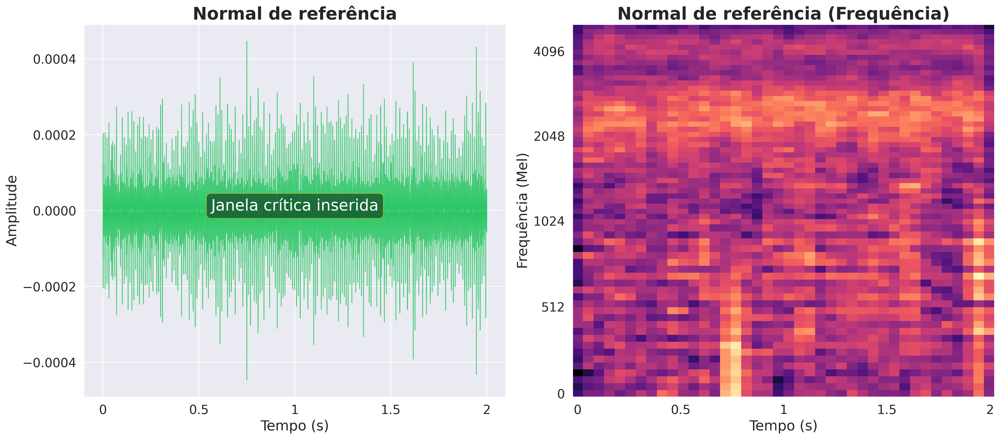

✅ Arquivo 'fig_1_referencia_normal.png' salvo com texto original.


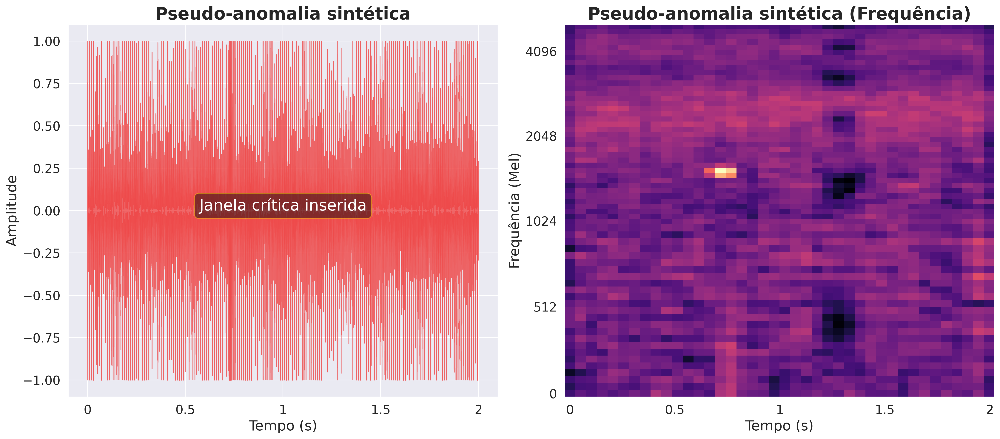

✅ Arquivo 'fig_2_pseudo_anomalia.png' salvo com texto original.


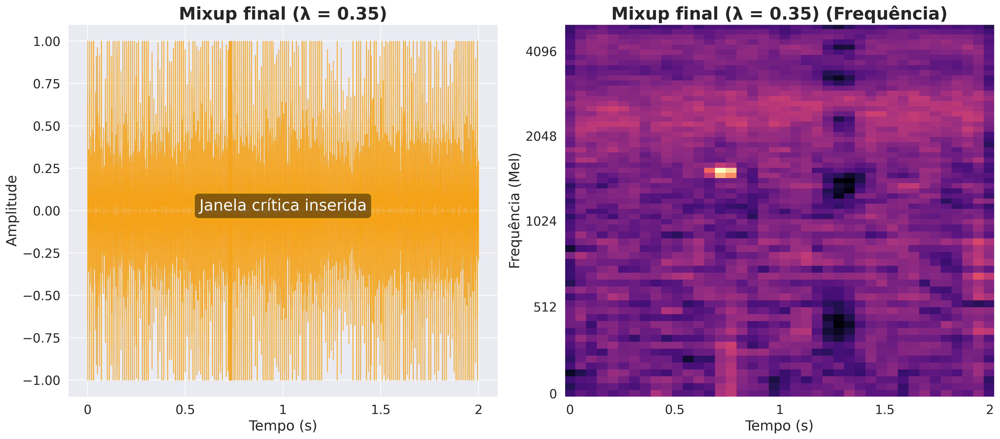

✅ Arquivo 'fig_3_mixup_final.png' salvo com texto original.

🎉 Processo concluído. Agora os 3 arquivos têm o texto original e estão na pasta lateral 📁.


In [21]:
# =========================================================
# GERADOR DE IMAGENS TÉCNICAS | FRENTE 4 (TEXTO ORIGINAL)
# Papel: Salvar 3 arquivos com o texto "Janela crítica inserida"
# =========================================================

print("🚀 Gerando arquivos com o texto original e fontes grandes...")

# Configurações de Estilo Acadêmico (Padrão 20/22)
plt.rcParams['figure.dpi'] = 300
F_TITLE, F_LABEL, F_TICKS, F_ANNOT = 22, 18, 16, 20

def plot_fiel_ao_original(signal, titulo_base, nome_arquivo, cor, sr=10000):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 8))

    # 1. Domínio do Tempo (Waveform)
    librosa.display.waveshow(signal, sr=sr, ax=ax1, color=cor, alpha=0.8)
    ax1.set_title(f"{titulo_base}", fontsize=F_TITLE, fontweight='bold')
    ax1.set_ylabel("Amplitude", fontsize=F_LABEL)
    ax1.set_xlabel("Tempo (s)", fontsize=F_LABEL)
    ax1.tick_params(labelsize=F_TICKS)

    # 2. Domínio da Frequência (Espectrograma)
    S = librosa.feature.melspectrogram(y=signal, sr=sr, n_mels=64)
    mel = librosa.power_to_db(S, ref=np.max)
    librosa.display.specshow(mel, sr=sr, x_axis='time', y_axis='mel', ax=ax2, cmap='magma')
    ax2.set_title(f"{titulo_base} (Frequência)", fontsize=F_TITLE, fontweight='bold')
    ax2.set_ylabel("Frequência (Mel)", fontsize=F_LABEL)
    ax2.set_xlabel("Tempo (s)", fontsize=F_LABEL)
    ax2.tick_params(labelsize=F_TICKS)

    # TEXTO EXATO DO ORIGINAL: "Janela crítica inserida"
    # Adicionado em todos os gráficos de tempo (ax1)
    ax1.annotate("Janela crítica inserida", xy=(0.5, 0.5), xycoords='axes fraction',
                 fontsize=F_ANNOT, bbox=dict(boxstyle='round,pad=0.3', fc='black', ec='gold', alpha=0.45),
                 color='white', ha='center')

    plt.tight_layout()
    plt.savefig(nome_arquivo, dpi=300, bbox_inches='tight')
    plt.show()
    plt.close(fig)
    print(f"✅ Arquivo '{nome_arquivo}' salvo com texto original.")

# --- GERAÇÃO DOS 3 PARES ---

# 1. Normal de referência
plot_fiel_ao_original(preview_base, "Normal de referência", "fig_1_referencia_normal.png", '#22c55e')

# 2. Pseudo-anomalia sintética
plot_fiel_ao_original(preview_pseudo, "Pseudo-anomalia sintética", "fig_2_pseudo_anomalia.png", '#ef4444')

# 3. Mixup final
plot_fiel_ao_original(preview_mixup, f"Mixup final (λ = {preview_lambda:.2f})", "fig_3_mixup_final.png", '#f59e0b')

print("\n🎉 Processo concluído. Agora os 3 arquivos têm o texto original e estão na pasta lateral 📁.")

## Bloco 5 | Construção das matrizes de features

A partir das janelas, criamos as representações que vão alimentar cada família de modelos.

**Filosofia desta seção.**
Em vez de assumir uma única transformação “correta”, o notebook compara múltiplas visões do mesmo som para descobrir qual delas combina melhor **robustez diagnóstica** com **custo computacional**.


### Experimento 1 | Mel + RPCA

**Leitura técnica.**
O espectrograma Mel concentra energia em bandas perceptualmente relevantes. Depois, a `RPCA` separa o componente mais raro/esparso, útil para destacar assinaturas de falha.


In [22]:
# =========================================================
# FINAL NOTEBOOK | Extração do experimento Mel + RPCA
# Papel deste bloco:
# - monta a representação de imagem acústica do Exp 1
# =========================================================
# =========================================================
# NOTA DIDÁTICA: Entendendo a Extração do Espectrograma de Mel
# =========================================================
# O trecho abaixo ilustra a lógica matemática que consolidou o Tensor X_mel.

def generate_mel_spectrogram_for_segment(audio_segment, sr=10000, n_mels=64, fixed_img_dims=(64, 64)):
    """
    Função de referência para geração de imagens acústicas padronizadas (64x64).
    """
    # 1. Mapeamento de Energia Acústica (Mel Scale)
    mel = librosa.feature.melspectrogram(y=audio_segment, sr=sr, n_mels=n_mels)
    mel_db = librosa.power_to_db(mel, ref=np.max)

    # 2. Padronização do Tensor (Corte ou Padding para 64x64)
    if mel_db.shape[1] > fixed_img_dims[1]:
        mel_db = mel_db[:, :fixed_img_dims[1]]
    else:
        mel_db = np.pad(mel_db, ((0,0), (0, fixed_img_dims[1] - mel_db.shape[1])))

    # Adiciona dimensão de canal (1, 64, 64) para compatibilidade com CNNs
    return mel_db[np.newaxis, ...]

# Validação de Integridade do Tensor Final na RAM
print(f"✅ O Tensor `X_mel` encontra-se sanitizado e alocado na memória!")
print(f"-> Formato (Shape) oficial: {X_mel.shape}")
print(f"-> Total de fatias para o experimento: {X_mel.shape[0]}")
print(f"-> Resolução Acústica: {X_mel.shape[2]} mels x {X_mel.shape[3]} frames.")

✅ O Tensor `X_mel` encontra-se sanitizado e alocado na memória!
-> Formato (Shape) oficial: (1000, 1, 64, 64)
-> Total de fatias para o experimento: 1000
-> Resolução Acústica: 64 mels x 64 frames.


### Experimento 2 | MFCC Dinâmico

**Leitura técnica.**
Os `MFCCs` e suas derivadas capturam **timbre**, **variação temporal** e mudanças rápidas no comportamento espectral, sendo uma base muito forte para modelos vetoriais.


In [23]:
# =========================================================
# FINAL NOTEBOOK | Extração do experimento MFCC Dinâmico
# Papel deste bloco:
# - monta o vetor do Exp 2 com MFCC, deltas e delta-deltas
# =========================================================
# =========================================================
# NOTA DIDÁTICA: Entendendo a Extração de MFCCs (Timbre Mecânico)
# =========================================================
# Ilustração da lógica matemática que consolidou a matriz X_mfcc_stats.

def generate_mfcc_stats_for_segment(audio_segment, sr=10000, n_mfcc=13):
    """
    Extrai a 'impressão digital' do áudio usando coeficientes cepstrais.
    """
    # 1. Cálculo dos coeficientes MFCC (Mapeia a cavidade e ressonância)
    mfcc = librosa.feature.mfcc(y=audio_segment, sr=sr, n_mfcc=n_mfcc)

    # 2. Consolidação Estatística (Média e Desvio Padrão)
    # Gera um vetor de 26 posições (13 Médias + 13 Desvios)
    mfcc_stats = np.concatenate([np.mean(mfcc, axis=1), np.std(mfcc, axis=1)])

    return mfcc_stats

# Validação de Integridade na RAM
print(f"✅ A matriz global `X_mfcc_stats` encontra-se sanitizada e alocada!")
print(f"-> Formato (Shape) oficial: {X_mfcc_stats.shape}")
print(f"-> Total de fatias processadas: {X_mfcc_stats.shape[0]}")
print(f"-> Atributos por fatia: {X_mfcc_stats.shape[1]} (13 Médias + 13 Desvios Padrão).")

✅ A matriz global `X_mfcc_stats` encontra-se sanitizada e alocada!
-> Formato (Shape) oficial: (1000, 26)
-> Total de fatias processadas: 1000
-> Atributos por fatia: 26 (13 Médias + 13 Desvios Padrão).


### Experimento 3 | CWT + RPCA

**Leitura técnica.**
A `CWT` funciona como uma lente de aumento para transientes curtos e impulsos mecânicos. Em seguida, a `RPCA` ajuda a destacar a parcela rara da resposta tempo-frequência.


In [24]:
# =========================================================
# FINAL NOTEBOOK | Extração do experimento CWT + RPCA
# Papel deste bloco:
# - monta a leitura transiente do Exp 3
# =========================================================
# =========================================================
# NOTA DIDÁTICA: Entendendo a Extração da CWT (Wavelets)
# =========================================================
# Ilustração da lógica de redimensionamento e interpolação bilinear.

def generate_cwt_for_segment(audio_segment, sr=10000, fixed_img_dims=(64, 64)):
    """
    Gera escalogramas (CWT) padronizados para análise de transientes.
    """
    # 1. Definição Dinâmica de Escalas (Logarítmicas)
    min_scale = 1
    max_scale = max(min_scale + 1, len(audio_segment) / (2 * sr))
    scales = np.geomspace(min_scale, max_scale, num=fixed_img_dims[0])

    # 2. Aplicação da Transformada Wavelet (Mãe: Morlet)
    coefficients, _ = apply_cwt(audio_segment, sr=sr, scales=scales)
    coefficients_abs = np.abs(coefficients)

    # 3. Interpolação Bilinear (Zoom) para 64x64
    if coefficients_abs.shape != fixed_img_dims:
        # Normalização para o redimensionamento
        max_val = np.max(coefficients_abs)
        norm_cwt = coefficients_abs / max_val if max_val > 0 else coefficients_abs

        zoom_factors = (fixed_img_dims[0] / norm_cwt.shape[0],
                        fixed_img_dims[1] / norm_cwt.shape[1])
        resized_cwt = zoom(norm_cwt, zoom_factors, order=1)
    else:
        resized_cwt = coefficients_abs

    # Retorna o Tensor (Canal, Escala, Tempo)
    return resized_cwt[np.newaxis, ...]

# Validação de Integridade na RAM
print(f"✅ A matriz global `X_cwt` encontra-se sanitizada e alocada!")
print(f"-> Formato (Shape) oficial: {X_cwt.shape}")
print(f"-> Total de fatias para o experimento: {X_cwt.shape[0]}")
print(f"-> Resolução do Escalograma: {X_cwt.shape[2]} escalas x {X_cwt.shape[3]} frames.")

✅ A matriz global `X_cwt` encontra-se sanitizada e alocada!
-> Formato (Shape) oficial: (1000, 1, 64, 64)
-> Total de fatias para o experimento: 1000
-> Resolução do Escalograma: 64 escalas x 64 frames.


## Bloco 6 | Extração de canais híbridos

Nesta etapa o notebook monta o raciocínio híbrido clássico do projeto:

- um canal para a parte esparsa/anômala;
- um canal para a dinâmica espectral;
- um canal para estatísticas físicas simples e interpretáveis.

Essa fusão é a base dos experimentos híbridos que costumam performar bem em cenários industriais.


### Canal A | Energia esparsa da RPCA

Este canal resume a intensidade média do componente raro da matriz, funcionando como um indício compacto de perturbação acústica.


In [25]:
# =========================================================
# FINAL NOTEBOOK | Canal A do híbrido
# Papel deste bloco:
# - resume a parcela esparsa da RPCA
# =========================================================
# =========================================================
# CANAL A: EXTRATOR DE ENERGIA DE ANOMALIAS (RPCA)
# =========================================================

def get_channel_A_feature(signal, sr=10000):
    """
    CANAL A (Espectral): Isola eventos acústicos anômalos via RPCA.
    Separa o ruído estacionário (L) dos transientes de falha (S).
    """
    # 1. Extração do Espectrograma de Mel (Padronizado 64x64 para consistência)
    mel_spec = librosa.feature.melspectrogram(y=signal, sr=sr, n_mels=64)
    mel_db = librosa.power_to_db(mel_spec, ref=np.max)

    # Ajuste de shape para garantir que seja processável pelo RPCA
    # (O RPCA gosta de matrizes o mais 'quadradas' possíveis)
    if mel_db.shape[1] > 64:
        mel_db = mel_db[:, :64]
    elif mel_db.shape[1] < 64:
        mel_db = np.pad(mel_db, ((0,0), (0, 64 - mel_db.shape[1])))

    try:
        # 2. Separação de Matrizes via RPCA (Decomposição L + S)
        # L = Background estável | S = Eventos raros/impactos
        L_db, S_db = rpca_ialm(mel_db)

        # 3. Retorna a energia média acumulada na Matriz Esparsa (S)
        # No diagnóstico de rolamentos, a matriz S contém a 'assinatura do defeito'
        energia_anomalia = np.mean(np.abs(S_db))
    except Exception as e:
        # Fallback caso a convergência do RPCA falhe em um sinal muito ruidoso
        energia_anomalia = 0.0

    return energia_anomalia

print("✅ Canal A (Extrator RPCA / Matriz Esparsa) configurado e pronto para uso!")

✅ Canal A (Extrator RPCA / Matriz Esparsa) configurado e pronto para uso!


### Canal B | Dinâmica MFCC

Este canal transforma cada janela em um vetor que resume timbre e variação temporal, servindo como espinha dorsal para modelos vetoriais.


In [26]:
# =========================================================
# FINAL NOTEBOOK | Canal B do híbrido
# Papel deste bloco:
# - resume a dinâmica MFCC em vetor compacto
# =========================================================
# =========================================================
# CANAL B: EXTRATOR DINÂMICO DE TIMBRE (MFCC + DELTAS)
# =========================================================

def get_channel_B_feature(signal, sr=10000, n_mfcc=13):
    """
    CANAL B (Dinâmico/Timbre): Captura a assinatura vocal e a variação temporal.
    Inclui MFCC (estático), Deltas (velocidade) e Delta-Deltas (aceleração).
    """
    # 1. Extração da "Assinatura Vocal" base
    mfccs = librosa.feature.mfcc(y=signal, sr=sr, n_mfcc=n_mfcc)

    # 2. Primeira Derivada (Deltas): Velocidade da mudança espectral
    # width=3 para garantir que funcione em janelas curtas
    mfccs_delta = librosa.feature.delta(mfccs, width=3)

    # 3. Segunda Derivada (Delta-Deltas): Aceleração da mudança (impactos)
    mfccs_delta2 = librosa.feature.delta(mfccs, order=2, width=3)

    # 4. Consolidação do Super-Vetor (39 atributos)
    # Combinamos a média de cada um para um diagnóstico global da fatia
    feature_vector = np.concatenate([
        np.mean(mfccs, axis=1),
        np.mean(mfccs_delta, axis=1),
        np.mean(mfccs_delta2, axis=1)
    ])

    return feature_vector

print("✅ Canal B (Extrator Dinâmico / MFCC + Deltas) configurado e pronto para uso.")

✅ Canal B (Extrator Dinâmico / MFCC + Deltas) configurado e pronto para uso.


### Canal C | Estatísticas físicas da janela

RMS, curtose e assimetria ajudam a traduzir o comportamento do sinal em métricas simples, úteis para comparação e interpretação.


In [27]:
# =========================================================
# FINAL NOTEBOOK | Canal C do híbrido
# Papel deste bloco:
# - resume estatísticas físicas da janela
# =========================================================
# =========================================================
# CANAL C: EXTRATOR ESTATÍSTICO/FÍSICO (TEMPORAL)
# =========================================================

def get_channel_C_feature(signal):
    """
    CANAL C (Estatístico/Físico): Captura a energia e os impactos mecânicos puros.
    Analisa a 'forma' da onda de vibração no tempo.
    """
    # 1. Energia Global da Vibração (Root Mean Square)
    # Reflete o nível de ruído total; aumenta conforme a falha piora.
    rms = librosa.feature.rms(y=signal)

    # 2. Kurtosis (Curtose): Sensível a impactos impulsivos (falhas em rolamentos).
    # Se o valor subir (ex: > 3), há picos de impacto anormais.
    kurt = kurtosis(signal)

    # 3. Skewness (Assimetria): Detecta se o sinal está 'pendendo' para um lado.
    # Comum em problemas de lubrificação ou desalinhamento.
    skewn = skew(signal)

    # 4. Agrega em um vetor de 3 dimensões (Potência, Impacto, Assimetria)
    return np.array([np.mean(rms), kurt, skewn])

print("✅ Canal C (Extrator Estatístico / RMS + Kurtosis + Skewness) configurado!")

✅ Canal C (Extrator Estatístico / RMS + Kurtosis + Skewness) configurado!


## Bloco 7 | Pré-processamento matricial e separação de fontes

Agora passamos do sinal e das features locais para uma visão matricial mais estruturada, necessária para destacar padrões persistentes e raros.


### RPCA | Separando estrutura dominante e componente raro

**Ideia central.**
A `RPCA` tenta separar o que é **fundo regular** do que é **evento raro**, o que ajuda bastante quando a anomalia ocupa pouca energia relativa.


In [28]:
# =========================================================
# FINAL NOTEBOOK | Implementação da RPCA
# Papel deste bloco:
# - separa estrutura dominante e componente raro
# =========================================================
def rpca_ialm(D, mu_multiplier=1.25, max_iter=100, tol=1e-5):
    """
    Implementação matemática do Inexact Augmented Lagrange Multiplier (IALM) para RPCA.
    D = L + S (Low-Rank + Sparse)
    """
    # 1. Inicialização de Pesos e Matrizes
    # Adicionado 1e-7 para evitar divisão por zero em sinais silenciosos
    norm_fro = np.linalg.norm(D, 'fro') + 1e-7
    Y = D / np.maximum(np.linalg.norm(D, 2), np.linalg.norm(D, np.inf) / 1e-5)
    L = np.zeros_like(D)
    S = np.zeros_like(D)

    mu = mu_multiplier / (np.linalg.norm(D, 2) + 1e-7)
    rho = 1.5
    lam = 1 / np.sqrt(np.max(D.shape))

    # 2. O Loop de Otimização
    for _ in range(max_iter):
        # Passo 1: Atualiza S (Soft Thresholding - Isola as anomalias)
        temp_T = D - L + (1/mu) * Y
        epsilon = lam / mu
        # Operador de limiarização suave (Shrinkage operator)
        S = np.maximum(temp_T - epsilon, 0) + np.minimum(temp_T + epsilon, 0)

        # Passo 2: Atualiza L (Singular Value Thresholding - Isola o ruído constante)
        U, sigmas, V = np.linalg.svd(D - S + (1/mu) * Y, full_matrices=False)
        svp = (sigmas > 1/mu).sum()

        if svp >= 1:
            sigmas_reduced = sigmas[:svp] - 1/mu
            L = U[:, :svp] @ np.diag(sigmas_reduced) @ V[:svp, :]
        else:
            L = np.zeros_like(D)

        # Passo 3: Atualiza Multiplicadores
        Z = D - L - S
        Y = Y + mu * Z
        mu = min(mu * rho, 1e7)

        # Passo 4: Condição de parada
        if np.linalg.norm(Z, 'fro') / norm_fro < tol:
            break

    return L, S

print("✅ Algoritmo RPCA (IALM) compilado e pronto para separar as fontes de áudio.")

✅ Algoritmo RPCA (IALM) compilado e pronto para separar as fontes de áudio.


### Visualização diagnóstica dos sinais separados

Este painel ajuda a conferir se a decomposição realmente está isolando a parte mais informativa da falha.


✅ Sinais localizados! Normal (index 0), Anômalo (index 500)
🔬 Frente DSP ativa no pipeline: HHT + UKF
📦 Base usada nesta seção: `X_train_dsp_signals`
⚙️ Decompondo sinais via RPCA...


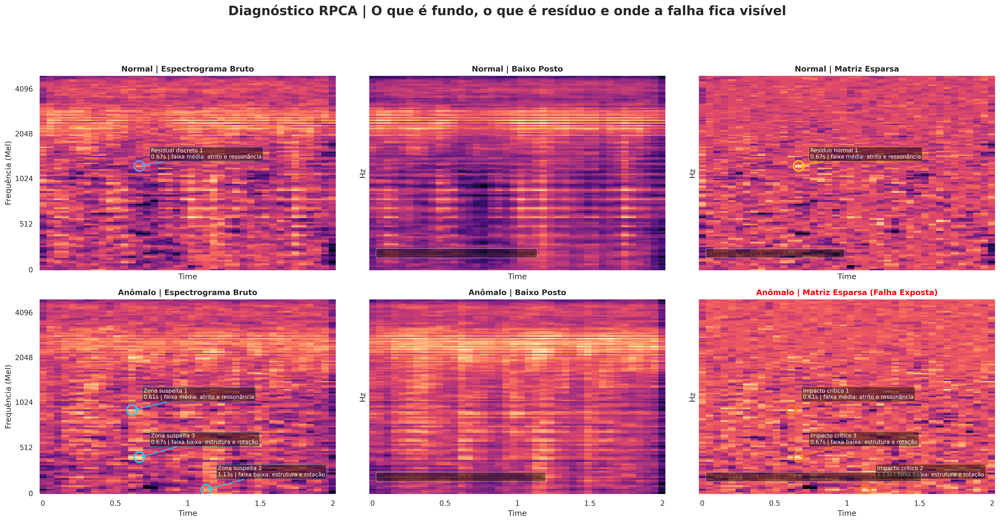

,Hotspot,Tempo (s),Faixa relevante,Intensidade,Leitura técnica
0,H1,0.614,faixa média: atrito e ressonância,5.4065,"pico impulsivo localizado, forte candidato a e..."
1,H2,1.126,faixa baixa: estrutura e rotação,4.9918,"pico impulsivo localizado, forte candidato a e..."
2,H3,0.666,faixa baixa: estrutura e rotação,4.7455,"pico impulsivo localizado, forte candidato a e..."



 📊 LEITURA DIDÁTICA DO RPCA
1. Espectrograma bruto: mostra tudo misturado — operação normal, ruído de fundo e possíveis impactos.
2. Baixo posto (L): concentra o conteúdo persistente e quase estacionário da máquina.
3. Matriz esparsa (S): concentra eventos raros, curtos e localizados — exatamente onde a falha costuma aparecer.
4. Os círculos marcam os pontos com maior energia residual; esses pontos merecem inspeção técnica e explicação XAI.


In [29]:
# =========================================================
# FINAL NOTEBOOK | Visualização da separação de fontes
# Papel deste bloco:
# - mostra se a decomposição está isolando a parte mais relevante
# =========================================================
# =========================================================
# DIAGNÓSTICO VISUAL: DECOMPOSIÇÃO RPCA (L + S) COM LEITURA DIDÁTICA
# =========================================================

idx_normal = -1
normal_indices = np.where(y_train_dsp == 0)[0]
if len(normal_indices) > 0:
    idx_normal = normal_indices[0]
    signal_normal = X_train_dsp_signals[idx_normal]
else:
    signal_normal = None
    print("Aviso: Nenhum sinal 'Normal' encontrado em y_train_dsp para visualização RPCA.")

idx_anomaly = -1
anomaly_indices = np.where(y_train_dsp == 1)[0]
if len(anomaly_indices) > 0:
    idx_anomaly = anomaly_indices[0]
    signal_anomaly = X_train_dsp_signals[idx_anomaly]
else:
    signal_anomaly = None
    print("Aviso: Nenhum sinal 'Anômalo' encontrado em y_train_dsp para visualização RPCA.")

sr_visual = SR_TARGET
hop_visual = 512

if signal_normal is not None and signal_anomaly is not None:
    print(f"✅ Sinais localizados! Normal (index {idx_normal}), Anômalo (index {idx_anomaly})")
    print(f"🔬 Frente DSP ativa no pipeline: {globals().get('DSP_FRONT_ATIVO_LABEL', 'HHT')}")
    print("📦 Base usada nesta seção: `X_train_dsp_signals`")
elif signal_anomaly is not None:
    print(f"✅ Sinal anômalo localizado (index {idx_anomaly}). Nenhum sinal normal para comparação.")
else:
    print("❌ Erro: Nenhum sinal útil foi localizado para visualização RPCA.")


def describe_band(mel_idx, n_mels):
    ratio = mel_idx / max(1, n_mels - 1)
    if ratio < 0.33:
        return 'faixa baixa: estrutura e rotação'
    if ratio < 0.66:
        return 'faixa média: atrito e ressonância'
    return 'faixa alta: impacto rápido'


def find_top_hotspots(matrix, top_k=3, quantile=0.97, min_frame_gap=5, min_mel_gap=8):
    magnitude = np.abs(np.asarray(matrix, dtype=np.float32))
    if magnitude.size == 0 or np.max(magnitude) <= 0:
        return []

    threshold = np.quantile(magnitude, quantile)
    candidates = np.argwhere(magnitude >= threshold)
    if len(candidates) == 0:
        return []

    scores = magnitude[candidates[:, 0], candidates[:, 1]]
    order = np.argsort(scores)[::-1]
    hotspots = []
    for idx in order:
        mel_idx, frame_idx = candidates[idx]
        too_close = any(
            abs(frame_idx - h['frame_idx']) < min_frame_gap and abs(mel_idx - h['mel_idx']) < min_mel_gap
            for h in hotspots
        )
        if too_close:
            continue

        hotspots.append(
            {
                'mel_idx': int(mel_idx),
                'frame_idx': int(frame_idx),
                'score': float(magnitude[mel_idx, frame_idx]),
            }
        )
        if len(hotspots) >= top_k:
            break

    return hotspots


def hotspot_to_plot_coords(matrix, hotspot, sr=10000, hop_length=512):
    mel_freqs = librosa.mel_frequencies(n_mels=matrix.shape[0], fmax=sr / 2)
    time_value = librosa.frames_to_time(hotspot['frame_idx'], sr=sr, hop_length=hop_length)
    freq_value = float(mel_freqs[hotspot['mel_idx']])
    return time_value, freq_value


def annotate_hotspots(ax, matrix, hotspots, label_prefix, color):
    for i, hotspot in enumerate(hotspots, start=1):
        time_value, freq_value = hotspot_to_plot_coords(matrix, hotspot, sr=sr_visual, hop_length=hop_visual)
        band_label = describe_band(hotspot['mel_idx'], matrix.shape[0])
        ax.scatter([time_value], [freq_value], s=260, facecolors='none', edgecolors=color, linewidths=2)
        ax.annotate(
            f"{label_prefix} {i}\n{time_value:.2f}s | {band_label}",
            xy=(time_value, freq_value),
            xytext=(time_value + 0.08, freq_value + 150),
            fontsize=8.5,
            color='white',
            arrowprops=dict(arrowstyle='->', color=color, lw=1.3),
            bbox=dict(boxstyle='round,pad=0.25', fc='black', ec=color, alpha=0.45),
        )


mel_db_normal = None
if signal_normal is not None:
    mel_db_normal = librosa.power_to_db(
        librosa.feature.melspectrogram(
            y=signal_normal,
            sr=sr_visual,
            n_fft=2048,
            hop_length=hop_visual,
            n_mels=128,
        ),
        ref=np.max,
    )

mel_db_anomaly = None
if signal_anomaly is not None:
    mel_db_anomaly = librosa.power_to_db(
        librosa.feature.melspectrogram(
            y=signal_anomaly,
            sr=sr_visual,
            n_fft=2048,
            hop_length=hop_visual,
            n_mels=128,
        ),
        ref=np.max,
    )

print("⚙️ Decompondo sinais via RPCA...")
L_db_normal, S_db_normal = (rpca_ialm(mel_db_normal) if mel_db_normal is not None else (None, None))
L_db_anomaly, S_db_anomaly = (rpca_ialm(mel_db_anomaly) if mel_db_anomaly is not None else (None, None))

rpca_hotspots_normal = find_top_hotspots(np.maximum(S_db_normal, 0), top_k=1, quantile=0.995) if S_db_normal is not None else []
rpca_hotspots_anomaly = find_top_hotspots(np.maximum(S_db_anomaly, 0), top_k=3, quantile=0.97) if S_db_anomaly is not None else []

fig, ax = plt.subplots(2, 3, figsize=(22, 11), sharex=True, sharey=True)

if mel_db_normal is not None:
    librosa.display.specshow(mel_db_normal, sr=sr_visual, hop_length=hop_visual, x_axis='time', y_axis='mel', ax=ax[0, 0], cmap='magma')
    ax[0, 0].set_title('Normal | Espectrograma Bruto', fontsize=12, fontweight='bold')
    annotate_hotspots(ax[0, 0], mel_db_normal, rpca_hotspots_normal, 'Residual discreto', '#60a5fa')
else:
    ax[0, 0].set_title('Normal | Espectrograma Bruto (NÃO DISPONÍVEL)', fontsize=12, fontweight='bold', color='gray')
ax[0, 0].set_ylabel('Frequência (Mel)')

if L_db_normal is not None:
    librosa.display.specshow(L_db_normal, sr=sr_visual, hop_length=hop_visual, x_axis='time', y_axis='mel', ax=ax[0, 1], cmap='magma')
    ax[0, 1].set_title('Normal | Baixo Posto', fontsize=12, fontweight='bold')
    ax[0, 1].text(0.03, 0.08, 'Aqui ficam as bandas contínuas do fundo da máquina.', transform=ax[0, 1].transAxes, fontsize=9, bbox=dict(boxstyle='round', fc='black', ec='white', alpha=0.4))
else:
    ax[0, 1].set_title('Normal | Baixo Posto (NÃO DISPONÍVEL)', fontsize=12, fontweight='bold', color='gray')

if S_db_normal is not None:
    librosa.display.specshow(S_db_normal, sr=sr_visual, hop_length=hop_visual, x_axis='time', y_axis='mel', ax=ax[0, 2], cmap='magma')
    ax[0, 2].set_title('Normal | Matriz Esparsa', fontsize=12, fontweight='bold')
    annotate_hotspots(ax[0, 2], S_db_normal, rpca_hotspots_normal, 'Resíduo normal', '#facc15')
    ax[0, 2].text(0.03, 0.08, 'Esperado: energia baixa e pouco concentrada.', transform=ax[0, 2].transAxes, fontsize=9, bbox=dict(boxstyle='round', fc='black', ec='white', alpha=0.4))
else:
    ax[0, 2].set_title('Normal | Matriz Esparsa (NÃO DISPONÍVEL)', fontsize=12, fontweight='bold', color='gray')

if mel_db_anomaly is not None:
    librosa.display.specshow(mel_db_anomaly, sr=sr_visual, hop_length=hop_visual, x_axis='time', y_axis='mel', ax=ax[1, 0], cmap='magma')
    ax[1, 0].set_title('Anômalo | Espectrograma Bruto', fontsize=12, fontweight='bold')
    annotate_hotspots(ax[1, 0], mel_db_anomaly, rpca_hotspots_anomaly, 'Zona suspeita', '#22d3ee')
else:
    ax[1, 0].set_title('Anômalo | Espectrograma Bruto (NÃO DISPONÍVEL)', fontsize=12, fontweight='bold', color='gray')
ax[1, 0].set_ylabel('Frequência (Mel)')

if L_db_anomaly is not None:
    librosa.display.specshow(L_db_anomaly, sr=sr_visual, hop_length=hop_visual, x_axis='time', y_axis='mel', ax=ax[1, 1], cmap='magma')
    ax[1, 1].set_title('Anômalo | Baixo Posto', fontsize=12, fontweight='bold')
    ax[1, 1].text(0.03, 0.08, 'Fundo estável isolado: útil para separar o regime normal.', transform=ax[1, 1].transAxes, fontsize=9, bbox=dict(boxstyle='round', fc='black', ec='white', alpha=0.4))
else:
    ax[1, 1].set_title('Anômalo | Baixo Posto (NÃO DISPONÍVEL)', fontsize=12, fontweight='bold', color='gray')

if S_db_anomaly is not None:
    librosa.display.specshow(S_db_anomaly, sr=sr_visual, hop_length=hop_visual, x_axis='time', y_axis='mel', ax=ax[1, 2], cmap='magma')
    ax[1, 2].set_title('Anômalo | Matriz Esparsa (Falha Exposta)', fontsize=12, fontweight='bold', color='red')
    annotate_hotspots(ax[1, 2], S_db_anomaly, rpca_hotspots_anomaly, 'Impacto crítico', '#f97316')
    ax[1, 2].text(0.03, 0.08, 'Aqui procuramos blobs curtos e concentrados: assinatura típica de falha.', transform=ax[1, 2].transAxes, fontsize=9, bbox=dict(boxstyle='round', fc='black', ec='white', alpha=0.4))
else:
    ax[1, 2].set_title('Anômalo | Matriz Esparsa (NÃO DISPONÍVEL)', fontsize=12, fontweight='bold', color='gray')

plt.suptitle('Diagnóstico RPCA | O que é fundo, o que é resíduo e onde a falha fica visível', fontsize=20, fontweight='bold', y=1.02)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

if rpca_hotspots_anomaly:
    df_rpca_hotspots = pd.DataFrame(
        [
            {
                'Hotspot': f'H{i}',
                'Tempo (s)': round(hotspot_to_plot_coords(S_db_anomaly, hotspot, sr=sr_visual, hop_length=hop_visual)[0], 3),
                'Faixa relevante': describe_band(hotspot['mel_idx'], S_db_anomaly.shape[0]),
                'Intensidade': round(hotspot['score'], 4),
                'Leitura técnica': 'pico impulsivo localizado, forte candidato a evento anômalo',
            }
            for i, hotspot in enumerate(rpca_hotspots_anomaly, start=1)
        ]
    )
    display(df_rpca_hotspots)

print("\n" + "=" * 96)
print(" 📊 LEITURA DIDÁTICA DO RPCA")
print("=" * 96)
print("1. Espectrograma bruto: mostra tudo misturado — operação normal, ruído de fundo e possíveis impactos.")
print("2. Baixo posto (L): concentra o conteúdo persistente e quase estacionário da máquina.")
print("3. Matriz esparsa (S): concentra eventos raros, curtos e localizados — exatamente onde a falha costuma aparecer.")
print("4. Os círculos marcam os pontos com maior energia residual; esses pontos merecem inspeção técnica e explicação XAI.")
print("=" * 96)

# Gerar e salvar os graficos

🚀 Gerando diagnósticos RPCA com controle de sobreposição (zorder)...


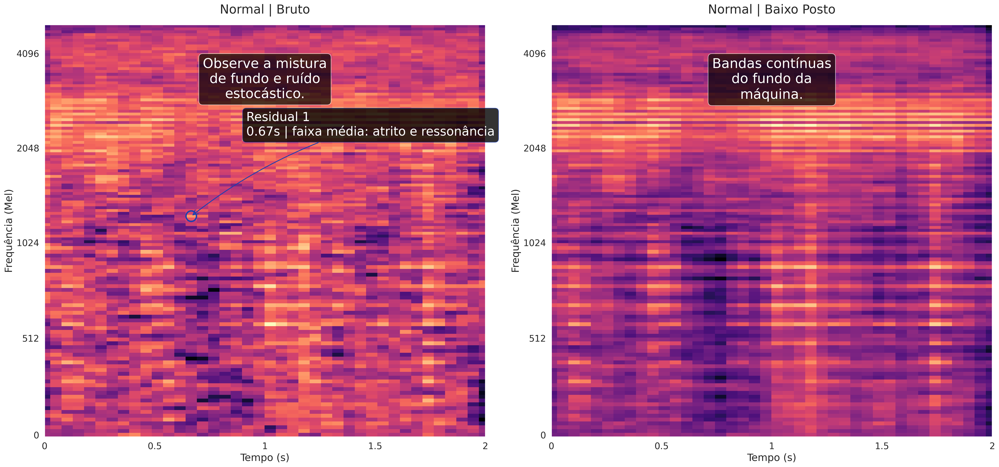

✅ Arquivo 'fig_rpca_normal_fundo.png' salvo com controle de sobreposição.


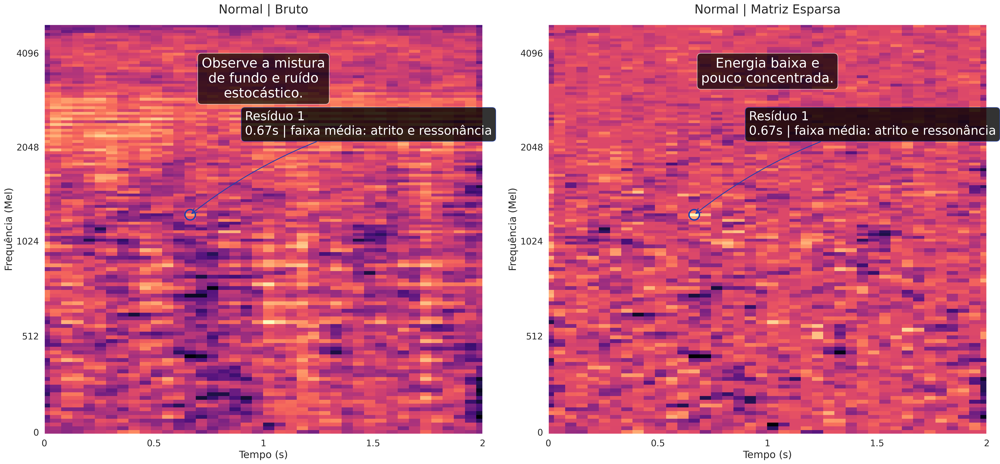

✅ Arquivo 'fig_rpca_normal_esparsa.png' salvo com controle de sobreposição.


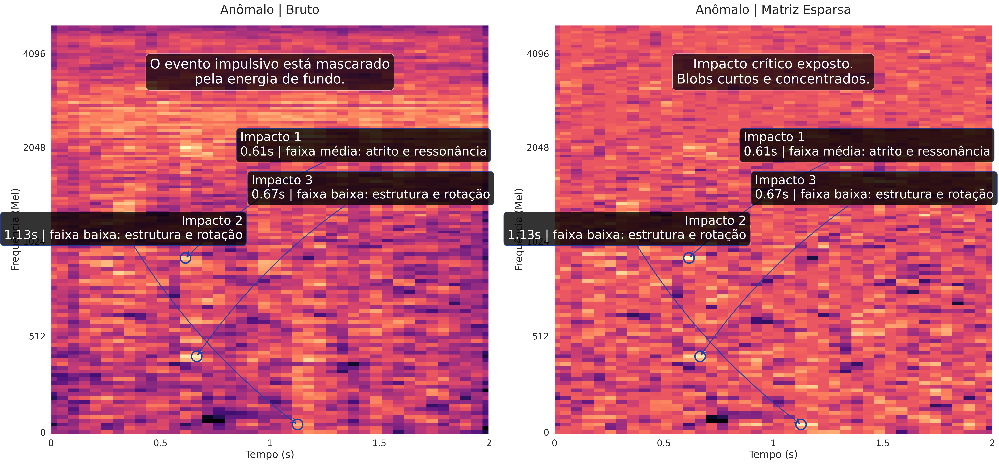

✅ Arquivo 'fig_rpca_anomalo_esparsa.png' salvo com controle de sobreposição.

🎉 Todos os 3 arquivos foram gerados corretamente com setas em Azul Marinho.


In [75]:
# =========================================================
# VERSÃO SUPREMA RPCA | CONTROLE DE SOBREPOSIÇÃO (Z-ORDER)
# Layout: 3 arquivos, dois por linha, formatação legível.
# =========================================================
from sklearn.decomposition import NMF

print("🚀 Gerando diagnósticos RPCA com controle de sobreposição (zorder)...")

# --- CONFIGURAÇÃO DE ESTILO MAXIMIZADO ---
plt.rcParams['figure.dpi'] = 300
plt.rcParams['font.weight'] = 'normal' # Fonte regular conforme solicitado
F_TITLE, F_LABEL, F_TICKS = 22, 18, 16
F_ANNOT = 24  # Fonte das caixas e hotspots

def annotate_safe_top_fixed(ax, text, color='white'):
    """Caixa explicativa fixa no topo com zorder baixo para ficar atrás."""
    bbox_props = dict(boxstyle='round,pad=0.3', fc='black', ec=color, alpha=0.7)
    # y=0.92 para dar mais respiro vertical
    # zorder=10 garante que esta caixa fique atrás de setas e círculos
    ax.text(0.5, 0.92, text, transform=ax.transAxes,
            fontsize=F_ANNOT, color=color, weight='normal',
            bbox=bbox_props, ha='center', va='top', zorder=10)

def draw_hotspots_v4_zorder(ax, matrix, hotspots, label_prefix, color):
    """Círculos e setas com zorder alto e lógica de afastamento das bordas."""
    if not hotspots:
        return

    for i, hotspot in enumerate(hotspots, start=1):
        time_val, freq_val = hotspot_to_plot_coords(matrix, hotspot, sr=sr_visual, hop_length=hop_visual)
        band_lbl = describe_band(hotspot['mel_idx'], matrix.shape[0])

        # 1. Círculo com zorder alto
        ax.scatter([time_val], [freq_val], s=350, facecolors='none', edgecolors=color, linewidths=2.5, zorder=21)

        # --- LÓGICA DE AFASTAMENTO DAS SETAS ---
        # Se o ponto está depois de 1.0s (metade), joga o texto para trás (esquerda)
        # Se o ponto está antes de 1.0s, joga o texto para frente (direita)
        if time_val > 1.0:
            x_text = time_val - 0.25 # Afasta mais para a esquerda
            ha_align = 'right'
        else:
            x_text = time_val + 0.25 # Afasta mais para a direita
            ha_align = 'left'

        # Ajuste vertical simples
        y_text = freq_val + 1000 if freq_val < 2500 else freq_val - 1000

        # 2. Seta e Texto do Hotspot com zorder alto
        ax.annotate(
            f"{label_prefix} {i}\n{time_val:.2f}s | {band_lbl}",
            xy=(time_val, freq_val),
            xytext=(x_text, y_text),
            fontsize=F_ANNOT - 2,
            color='white',
            ha=ha_align,
            # connectionstyle="arc3,rad=0.1" adiciona uma leve curvatura para desviar
            arrowprops=dict(arrowstyle='->', color=color, lw=1.5, connectionstyle="arc3,rad=0.1"),
            bbox=dict(boxstyle='round,pad=0.3', fc='black', ec=color, alpha=0.8),
            zorder=25 # Garante que a seta e a caixa fiquem à frente da caixa do topo
        )

def plot_par_tecnico_fiel_limpo_v3(sig1, sig2, t1, t2, txt_cx1, txt_cx2, hs1, hs2, lbl_ann, col_ann, nome_arq):
    # Largura ampla (26) para evitar encolhimento e dar respiro lateral
    fig, ax = plt.subplots(1, 2, figsize=(28, 14))

    for i, (sig, t, txt, hs) in enumerate(zip([sig1, sig2], [t1, t2], [txt_cx1, txt_cx2], [hs1, hs2])):
        librosa.display.specshow(sig, sr=sr_visual, hop_length=hop_visual, x_axis='time', y_axis='mel', ax=ax[i], cmap='magma')
        ax[i].set_title(t, fontsize=F_TITLE, fontweight='normal', pad=20)
        ax[i].set_xlim(0, 2.0) # Força o limite do eixo X

        # IMPORTANTE: A ordem de chamada das funções mudou para respeitar o zorder
        # 1. Desenha as caixas fixas (atrás)
        annotate_safe_top_fixed(ax[i], txt)
        # 2. Desenha as anotações dinâmicas (à frente)
        draw_hotspots_v4_zorder(ax[i], sig, hs, lbl_ann, col_ann)

        ax[i].set_xlabel('Tempo (s)', fontsize=F_LABEL)
        ax[i].set_ylabel('Frequência (Mel)', fontsize=F_LABEL)
        ax[i].tick_params(labelsize=F_TICKS)

    # Margens manuais fixas para não deixar o Matplotlib decidir e errar
    plt.subplots_adjust(left=0.08, right=0.92, top=0.88, bottom=0.15, wspace=0.15)

    # Salva o arquivo PNG em alta resolução (DPI 300)
    plt.savefig(nome_arq, dpi=300)
    plt.show()
    plt.close(fig)
    print(f"✅ Arquivo '{nome_arq}' salvo com controle de sobreposição.")

# --- TEXTOS TÉCNICOS IDÊNTICOS AOS ORIGINAIS ---
txt_n_bruto = "Observe a mistura\nde fundo e ruído\nestocástico."
txt_n_fundo = "Bandas contínuas\ndo fundo da\nmáquina."
txt_n_esparsa = "Energia baixa e\npouco concentrada."
txt_a_bruto = "O evento impulsivo está mascarado\npela energia de fundo."
txt_a_esparsa = "Impacto crítico exposto.\nBlobs curtos e concentrados."

# --- EXECUÇÃO: GERANDO OS 3 ARQUIVOS COM O NOVO LAYOUT ---
# COR_PADRAO = Azul Marinho Escuro do primeiro gráfico
COR_PADRAO = '#1e40af'

# 1. NORMAL: Bruto vs Baixo Posto
plot_par_tecnico_fiel_limpo_v3(mel_db_normal, L_db_normal, "Normal | Bruto", "Normal | Baixo Posto",
                                 txt_n_bruto, txt_n_fundo, rpca_hotspots_normal, None, "Residual", COR_PADRAO,
                                 "fig_rpca_normal_fundo.png")

# 2. NORMAL: Bruto vs Matriz Esparsa
plot_par_tecnico_fiel_limpo_v3(mel_db_normal, S_db_normal, "Normal | Bruto", "Normal | Matriz Esparsa",

                                 txt_n_bruto, txt_n_esparsa, rpca_hotspots_normal, rpca_hotspots_normal, "Resíduo", COR_PADRAO,
                                 "fig_rpca_normal_esparsa.png")

# 3. ANÔMALO: Bruto vs Matriz Esparsa (Destaque do Artigo)
plot_par_tecnico_fiel_limpo_v3(mel_db_anomaly, S_db_anomaly, "Anômalo | Bruto", "Anômalo | Matriz Esparsa",
                                 txt_a_bruto, txt_a_esparsa, rpca_hotspots_anomaly, rpca_hotspots_anomaly, "Impacto", COR_PADRAO,
                                 "fig_rpca_anomalo_esparsa.png")

print("\n🎉 Todos os 3 arquivos foram gerados corretamente com setas em Azul Marinho.")

## Bloco 8 | Modelos do benchmarking

Este notebook coloca lado a lado:

- **supervisionados:** `XGBoost` e `GRU`;
- **não supervisionados:** `GMM`, `Tiny-AST`, `CNN + GMM`, `Isolation Forest`, `Mahalanobis`, `LSTM-AE` e `VAE`.

A ideia não é premiar apenas quem acerta mais, mas quem equilibra melhor **desempenho**, **custo** e **viabilidade operacional**.


In [43]:
# =========================================================
# FINAL NOTEBOOK | Arquiteturas do benchmarking
# Papel deste bloco:
# - define GRU, Tiny-AST, LSTM-AE e VAE
# - prepara o núcleo de deep learning do notebook
# =========================================================
# =========================================================
# 🧠 ARQUITETURAS DE DEEP LEARNING (PYTORCH) - REVISADAS
# =========================================================

# ---------------------------------------------------------
# A. GRU Model (Supervisionado)
# ---------------------------------------------------------
class AnomalyGRU(nn.Module):
    def __init__(self, input_dim, hidden_dim=128, num_layers=2, output_dim=1):
        super(AnomalyGRU, self).__init__()
        self.hidden_dim = hidden_dim
        self.num_layers = num_layers
        self.gru = nn.GRU(input_dim, hidden_dim, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_dim, output_dim)

    def forward(self, x):
        # x: (batch, seq_len, input_dim)
        h0 = torch.zeros(self.num_layers, x.size(0), self.hidden_dim).to(x.device)
        out, _ = self.gru(x, h0)
        # Pega a última saída da sequência
        out = self.fc(out[:, -1, :])
        return out

# ---------------------------------------------------------
# B. LSTM Autoencoder Model (Não-Supervisionado)
# ---------------------------------------------------------
class LSTMAE(nn.Module):
    def __init__(self, input_dim, hidden_dim=128, num_layers=2):
        super(LSTMAE, self).__init__()
        self.encoder = nn.LSTM(input_dim, hidden_dim, num_layers, batch_first=True)
        # O decoder precisa reconstruir a dimensão original (input_dim)
        self.decoder = nn.LSTM(hidden_dim, input_dim, num_layers, batch_first=True)

    def forward(self, x):
        enc_out, (h_n, c_n) = self.encoder(x)
        dec_out, _ = self.decoder(enc_out)
        return dec_out

# ---------------------------------------------------------
# C. VAE Convolucional Leve (Não-Supervisionado)
# ---------------------------------------------------------
class ConvVAE(nn.Module):
    def __init__(self, input_channels=1, input_h=64, input_w=64, latent_dim=24, base_channels=16):
        super(ConvVAE, self).__init__()
        self.input_channels = input_channels
        self.input_h = input_h
        self.input_w = input_w
        self.latent_dim = latent_dim
        self.base_channels = base_channels

        self.encoder = nn.Sequential(
            nn.Conv2d(input_channels, base_channels, kernel_size=3, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(base_channels, base_channels * 2, kernel_size=3, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(base_channels * 2, base_channels * 4, kernel_size=3, stride=2, padding=1),
            nn.ReLU(),
        )

        with torch.no_grad():
            dummy = torch.zeros(1, input_channels, input_h, input_w)
            encoded = self.encoder(dummy)
            self.encoded_shape = encoded.shape[1:]
            self.flat_dim = int(encoded.numel())

        self.fc_mu = nn.Linear(self.flat_dim, latent_dim)
        self.fc_logvar = nn.Linear(self.flat_dim, latent_dim)
        self.fc_decode = nn.Linear(latent_dim, self.flat_dim)

        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(base_channels * 4, base_channels * 2, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(base_channels * 2, base_channels, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(base_channels, input_channels, kernel_size=3, stride=2, padding=1, output_padding=1),
        )

    def encode(self, x):
        hidden = self.encoder(x).flatten(1)
        mu = self.fc_mu(hidden)
        logvar = self.fc_logvar(hidden)
        return mu, logvar

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + (eps * std)

    def decode(self, z):
        hidden = self.fc_decode(z).view(-1, *self.encoded_shape)
        return self.decoder(hidden)

    def forward(self, x, deterministic=False):
        mu, logvar = self.encode(x)
        z = mu if deterministic else self.reparameterize(mu, logvar)
        recon = self.decode(z)
        return recon, mu, logvar


# ---------------------------------------------------------
# D. Tiny-AST Model (Híbrido CNN + Transformer)
# ---------------------------------------------------------
class TinyAST(nn.Module):
    def __init__(self, input_channels=1, output_channels=1, num_mels=64, time_steps=64,
                 embed_dim=128, num_heads=4, num_transformer_layers=2):
        super(TinyAST, self).__init__()

        self.num_mels = num_mels
        self.time_steps = time_steps

        # --- ENCODER CNN ---
        self.conv_encoder = nn.Sequential(
            nn.Conv2d(input_channels, 32, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2),
            nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2)
        )

        # Cálculo dinâmico das dimensões latentes
        self.latent_h = num_mels // 4
        self.latent_w = time_steps // 4
        self.flat_dim = 64 * self.latent_h * self.latent_w

        self.project_to_embed = nn.Linear(self.flat_dim, embed_dim)

        # --- TRANSFORMER (Atenção Global) ---
        encoder_layer = nn.TransformerEncoderLayer(d_model=embed_dim, nhead=num_heads, batch_first=True)
        self.transformer_encoder = nn.TransformerEncoder(encoder_layer, num_layers=num_transformer_layers)

        # --- DECODER CNN ---
        self.project_from_embed = nn.Linear(embed_dim, self.flat_dim)
        self.conv_decoder = nn.Sequential(
            nn.ConvTranspose2d(64, 32, kernel_size=2, stride=2),
            nn.ReLU(),
            nn.ConvTranspose2d(32, output_channels, kernel_size=2, stride=2)
        )

    def forward(self, x):
        batch_size = x.size(0)

        # 1. Encoder CNN
        x_enc = self.conv_encoder(x) # Shape: (B, 64, H/4, W/4)

        # 2. Transformer no espaço latente achatado
        x_flat = x_enc.view(batch_size, -1)
        x_embed = self.project_to_embed(x_flat).unsqueeze(1)
        x_trans = self.transformer_encoder(x_embed).squeeze(1)

        # 3. Decoder CNN
        x_dec_flat = self.project_from_embed(x_trans)
        x_dec_reshaped = x_dec_flat.view(batch_size, 64, self.latent_h, self.latent_w)
        x_out = self.conv_decoder(x_dec_reshaped)

        return x_out

## Bloco 9 | XAI físico e leitura do espectrograma

Antes da XAI fiel do campeão final, este bloco monta a leitura física do espectrograma e do padrão acústico para sustentar a interpretação do relatório.


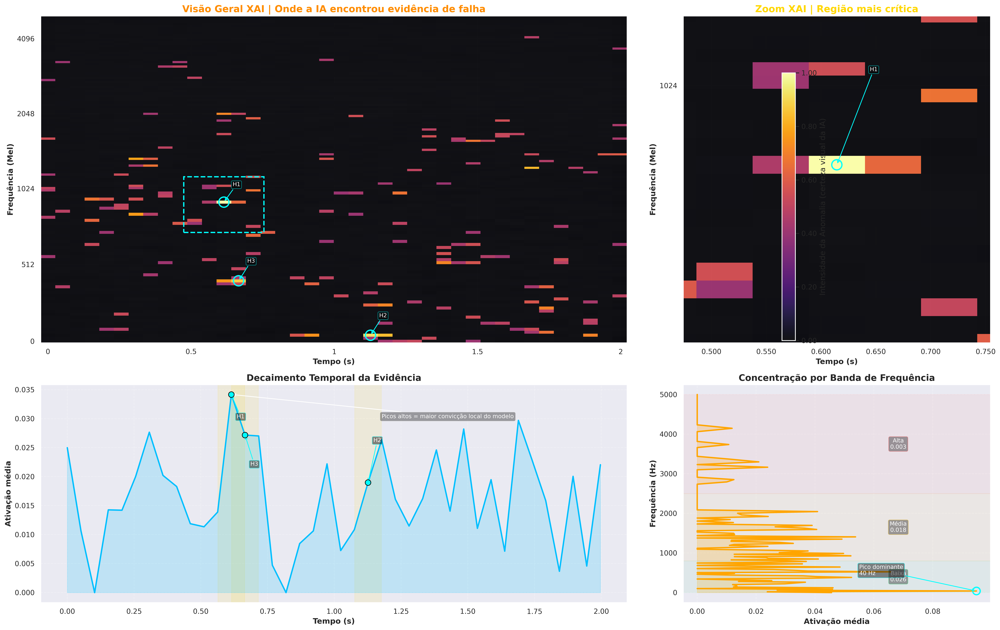

,Hotspot,Tempo (s),Faixa relevante,Intensidade normalizada,Leitura XAI
0,H1,0.614,faixa média: atrito e ressonância,5.4065,impacto principal: ponto que mais sustentou a ...
1,H2,1.126,faixa baixa: estrutura e rotação,4.9918,harmônico/resposta adjacente: reforça repetiçã...
2,H3,0.666,faixa baixa: estrutura e rotação,4.7455,eco temporal: sugere recorrência do mesmo meca...


,Faixa,Hz,Ativação média
0,Baixa,0-800,0.0258
1,Média,800-2500,0.0177
2,Alta,2500-4999,0.0031



 ✅ VISUALIZAÇÃO XAI CONCLUÍDA
1. O mapa em inferno mostra onde a IA encontrou evidência acima do limiar.
2. H1/H2/H3 destacam o núcleo da decisão, os reforços harmônicos e a recorrência temporal.
3. A curva temporal indica se a anomalia é curta, repetitiva ou com cauda de decaimento.
4. O perfil por banda mostra em qual faixa de frequência a falha concentrou mais energia.


In [44]:
# =========================================================
# FINAL NOTEBOOK | XAI físico preliminar
# Papel deste bloco:
# - gera a leitura visual inicial do padrão anômalo
# =========================================================
# =========================================================
# 🔍 XAI (Explainable AI): Heatmap, Decaimento Temporal e Perfil por Banda
# =========================================================

xai_activation = np.maximum(S_db_anomaly, 0)
max_val = np.max(xai_activation)
if max_val > 0:
    xai_activation = xai_activation / max_val

xai_activation = np.where(xai_activation > 0.4, xai_activation, 0)
xai_hotspots = rpca_hotspots_anomaly if 'rpca_hotspots_anomaly' in globals() and len(rpca_hotspots_anomaly) > 0 else find_top_hotspots(xai_activation, top_k=3, quantile=0.96)

time_axis = librosa.frames_to_time(np.arange(xai_activation.shape[1]), sr=sr_visual, hop_length=hop_visual)
mel_freqs = librosa.mel_frequencies(n_mels=xai_activation.shape[0], fmax=sr_visual / 2)
time_profile = xai_activation.mean(axis=0)
band_profile = xai_activation.mean(axis=1)

fig, axes = plt.subplots(
    2,
    2,
    figsize=(22, 14),
    gridspec_kw={'width_ratios': [2.1, 1.1], 'height_ratios': [1.5, 1.0]},
)

overview_ax = axes[0, 0]
zoom_ax = axes[0, 1]
decay_ax = axes[1, 0]
band_ax = axes[1, 1]

for ax in [overview_ax, zoom_ax]:
    librosa.display.specshow(
        mel_db_anomaly,
        sr=sr_visual,
        hop_length=hop_visual,
        x_axis='time',
        y_axis='mel',
        ax=ax,
        cmap='gray',
        alpha=0.28,
    )
    img = librosa.display.specshow(
        xai_activation,
        sr=sr_visual,
        hop_length=hop_visual,
        x_axis='time',
        y_axis='mel',
        ax=ax,
        cmap='inferno',
        alpha=0.92,
    )
    ax.set_ylabel('Frequência (Mel)', fontweight='bold')
    ax.set_xlabel('Tempo (s)', fontweight='bold')

overview_ax.set_title('Visão Geral XAI | Onde a IA encontrou evidência de falha', fontsize=15, fontweight='bold', color='darkorange')
zoom_ax.set_title('Zoom XAI | Região mais crítica', fontsize=15, fontweight='bold', color='gold')

zoom_rect = None
df_xai_hotspots = None

if xai_hotspots:
    main_hotspot = xai_hotspots[0]
    main_time, main_freq = hotspot_to_plot_coords(xai_activation, main_hotspot, sr=sr_visual, hop_length=hop_visual)

    x0 = max(0.0, main_time - 0.14)
    x1 = min(librosa.frames_to_time(xai_activation.shape[1], sr=sr_visual, hop_length=hop_visual), main_time + 0.14)
    y0 = max(0.0, float(mel_freqs[max(0, main_hotspot['mel_idx'] - 10)]))
    y1 = min(float(mel_freqs[-1]), float(mel_freqs[min(xai_activation.shape[0] - 1, main_hotspot['mel_idx'] + 10)]))

    zoom_rect = Rectangle((x0, y0), x1 - x0, y1 - y0, linewidth=2.0, edgecolor='cyan', facecolor='none', linestyle='--')
    overview_ax.add_patch(zoom_rect)
    zoom_ax.set_xlim(x0, x1)
    zoom_ax.set_ylim(y0, y1)

    rows = []
    for i, hotspot in enumerate(xai_hotspots, start=1):
        hotspot_time, hotspot_freq = hotspot_to_plot_coords(xai_activation, hotspot, sr=sr_visual, hop_length=hop_visual)
        band_label = describe_band(hotspot['mel_idx'], xai_activation.shape[0])
        narrative = {
            1: 'impacto principal: ponto que mais sustentou a decisão do modelo',
            2: 'harmônico/resposta adjacente: reforça repetição do defeito',
            3: 'eco temporal: sugere recorrência do mesmo mecanismo físico',
        }.get(i, 'ponto secundário relevante')

        for ax in [overview_ax, zoom_ax]:
            ax.scatter([hotspot_time], [hotspot_freq], s=260, facecolors='none', edgecolors='cyan', linewidths=2)
            ax.annotate(
                f'H{i}',
                xy=(hotspot_time, hotspot_freq),
                xytext=(hotspot_time + 0.03, hotspot_freq + 120),
                fontsize=9,
                color='white',
                arrowprops=dict(arrowstyle='->', color='cyan', lw=1.2),
                bbox=dict(boxstyle='round,pad=0.2', fc='black', ec='cyan', alpha=0.45),
            )

        hotspot_profile_idx = int(
            np.clip(
                hotspot.get('time_idx', hotspot.get('frame_idx', int(np.argmin(np.abs(time_axis - hotspot_time))))),
                0,
                max(0, len(time_profile) - 1),
            )
        )
        hotspot_profile_value = float(time_profile[hotspot_profile_idx]) if len(time_profile) > 0 else 0.0

        decay_ax.axvspan(max(0.0, hotspot_time - 0.05), hotspot_time + 0.05, color='gold', alpha=0.10)
        decay_ax.scatter([hotspot_time], [hotspot_profile_value], s=80, color='cyan', edgecolor='black', zorder=5)
        decay_ax.annotate(
            f'H{i}',
            xy=(hotspot_time, hotspot_profile_value),
            xytext=(hotspot_time + 0.02, time_profile.max() * (0.88 - (i - 1) * 0.12)),
            fontsize=9,
            color='white',
            arrowprops=dict(arrowstyle='->', color='cyan', lw=1.1),
            bbox=dict(boxstyle='round,pad=0.2', fc='black', ec='cyan', alpha=0.45),
        )

        rows.append(
            {
                'Hotspot': f'H{i}',
                'Tempo (s)': round(hotspot_time, 3),
                'Faixa relevante': band_label,
                'Intensidade normalizada': round(float(hotspot['score']), 4),
                'Leitura XAI': narrative,
            }
        )

    df_xai_hotspots = pd.DataFrame(rows)

decay_ax.plot(time_axis, time_profile, color='deepskyblue', linewidth=2.2)
decay_ax.fill_between(time_axis, 0, time_profile, color='deepskyblue', alpha=0.18)
decay_ax.set_title('Decaimento Temporal da Evidência', fontsize=14, fontweight='bold')
decay_ax.set_xlabel('Tempo (s)', fontweight='bold')
decay_ax.set_ylabel('Ativação média', fontweight='bold')
decay_ax.grid(True, linestyle='--', alpha=0.30)
if np.max(time_profile) > 0:
    decay_ax.annotate(
        'Picos altos = maior convicção local do modelo',
        xy=(time_axis[int(np.argmax(time_profile))], np.max(time_profile)),
        xytext=(time_axis[min(len(time_axis) - 1, int(len(time_axis) * 0.58))], np.max(time_profile) * 0.88),
        fontsize=9,
        color='white',
        arrowprops=dict(arrowstyle='->', color='white', lw=1.2),
        bbox=dict(boxstyle='round,pad=0.3', fc='black', ec='white', alpha=0.35),
    )

band_ax.plot(band_profile, mel_freqs, color='orange', linewidth=2.2)
band_ax.fill_betweenx(mel_freqs, 0, band_profile, color='orange', alpha=0.20)
band_ax.set_title('Concentração por Banda de Frequência', fontsize=14, fontweight='bold')
band_ax.set_xlabel('Ativação média', fontweight='bold')
band_ax.set_ylabel('Frequência (Hz)', fontweight='bold')
band_ax.grid(True, linestyle='--', alpha=0.30)

freq_regions = [
    ('Baixa', 0.0, 800.0, '#22c55e'),
    ('Média', 800.0, 2500.0, '#eab308'),
    ('Alta', 2500.0, float(mel_freqs[-1]), '#ef4444'),
]
band_rows = []
for label, f0, f1, color in freq_regions:
    mask = (mel_freqs >= f0) & (mel_freqs < f1)
    if np.any(mask):
        region_energy = float(np.mean(band_profile[mask]))
        band_ax.axhspan(f0, f1, color=color, alpha=0.06)
        band_ax.text(
            band_profile.max() * 0.72 if band_profile.max() > 0 else 0.01,
            (f0 + f1) / 2,
            f'{label}\n{region_energy:.3f}',
            fontsize=9,
            color='white',
            va='center',
            ha='center',
            bbox=dict(boxstyle='round,pad=0.25', fc='black', ec=color, alpha=0.35),
        )
        band_rows.append({'Faixa': label, 'Hz': f'{int(f0)}-{int(f1)}', 'Ativação média': round(region_energy, 4)})

if np.max(band_profile) > 0:
    peak_idx = int(np.argmax(band_profile))
    peak_freq = float(mel_freqs[peak_idx])
    peak_energy = float(band_profile[peak_idx])
    band_ax.scatter([peak_energy], [peak_freq], s=140, facecolors='none', edgecolors='cyan', linewidths=2)
    band_ax.annotate(
        f'Pico dominante\n{peak_freq:.0f} Hz',
        xy=(peak_energy, peak_freq),
        xytext=(peak_energy * 0.58 + 1e-6, min(float(mel_freqs[-1]), peak_freq + 400)),
        fontsize=9,
        color='white',
        arrowprops=dict(arrowstyle='->', color='cyan', lw=1.2),
        bbox=dict(boxstyle='round,pad=0.25', fc='black', ec='cyan', alpha=0.45),
    )

df_xai_bandas = pd.DataFrame(band_rows)

plt.colorbar(img, ax=[overview_ax, zoom_ax], format='%.2f', label='Intensidade da Anomalia (certeza visual da IA)')
plt.tight_layout()
plt.show()

if df_xai_hotspots is not None:
    display(df_xai_hotspots)
if not df_xai_bandas.empty:
    display(df_xai_bandas)

print("\n" + "=" * 88)
print(" ✅ VISUALIZAÇÃO XAI CONCLUÍDA")
print("=" * 88)
print("1. O mapa em inferno mostra onde a IA encontrou evidência acima do limiar.")
print("2. H1/H2/H3 destacam o núcleo da decisão, os reforços harmônicos e a recorrência temporal.")
print("3. A curva temporal indica se a anomalia é curta, repetitiva ou com cauda de decaimento.")
print("4. O perfil por banda mostra em qual faixa de frequência a falha concentrou mais energia.")
print("=" * 88)

# Graficos para baixar

🚀 Gerando diagnósticos XAI blindados... Ajustando limites verticais.


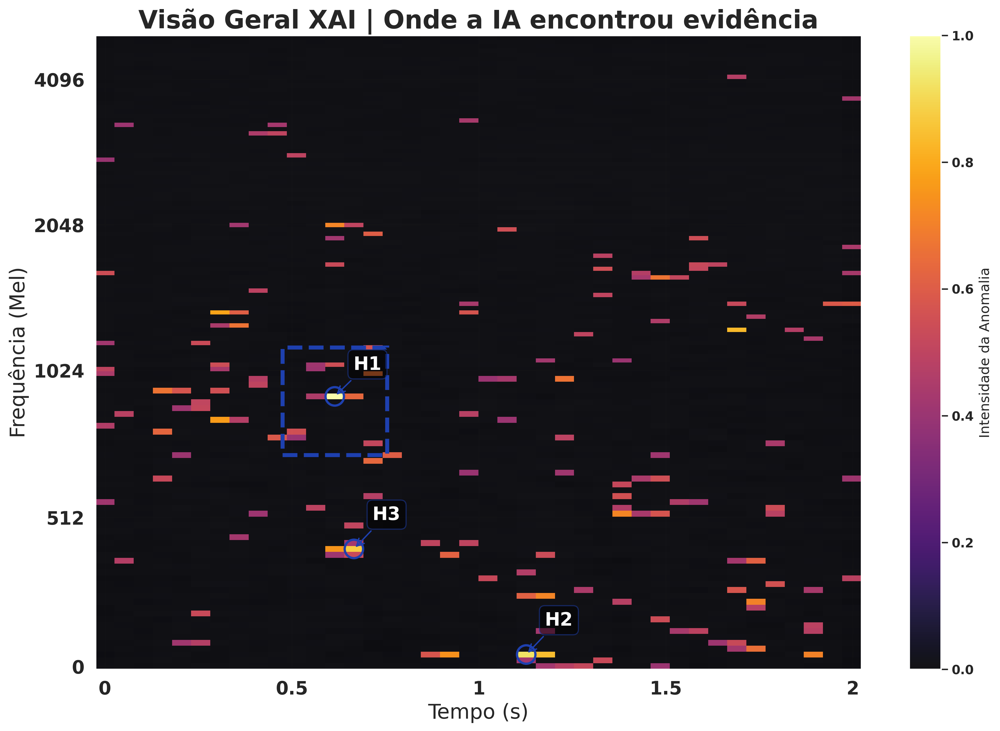

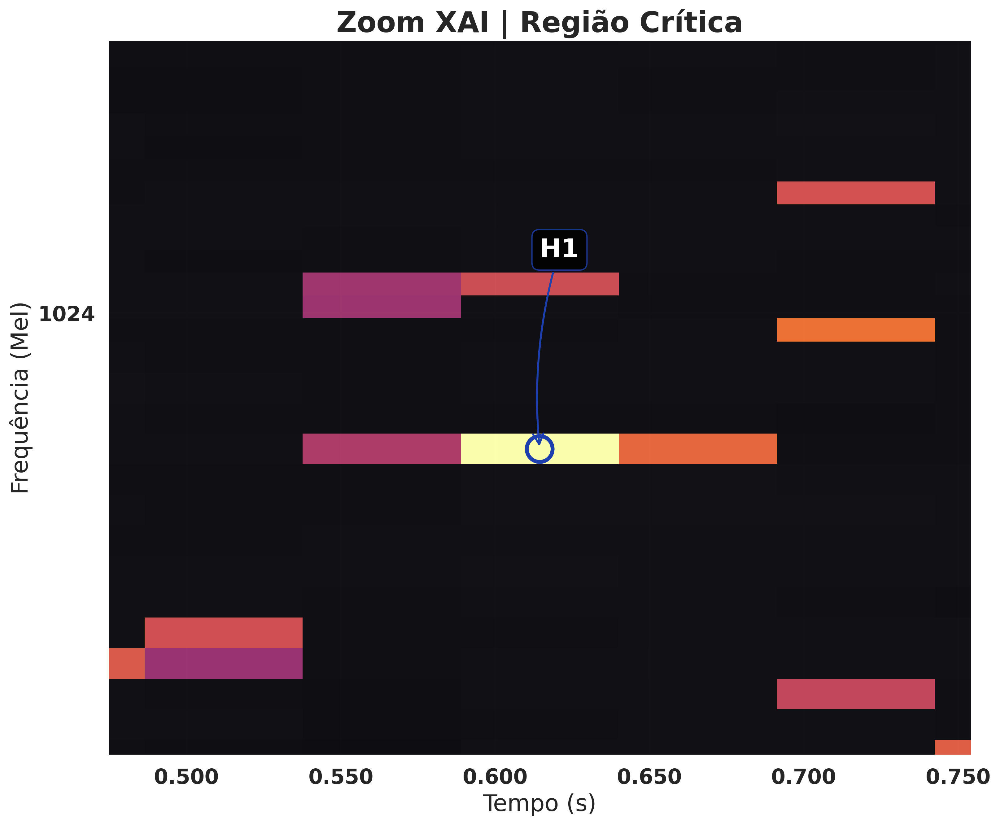

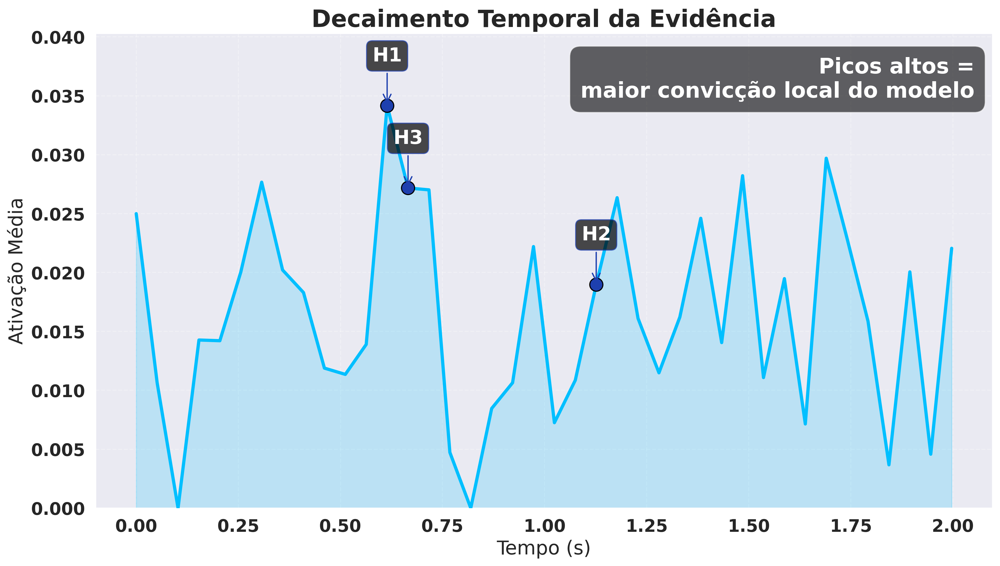

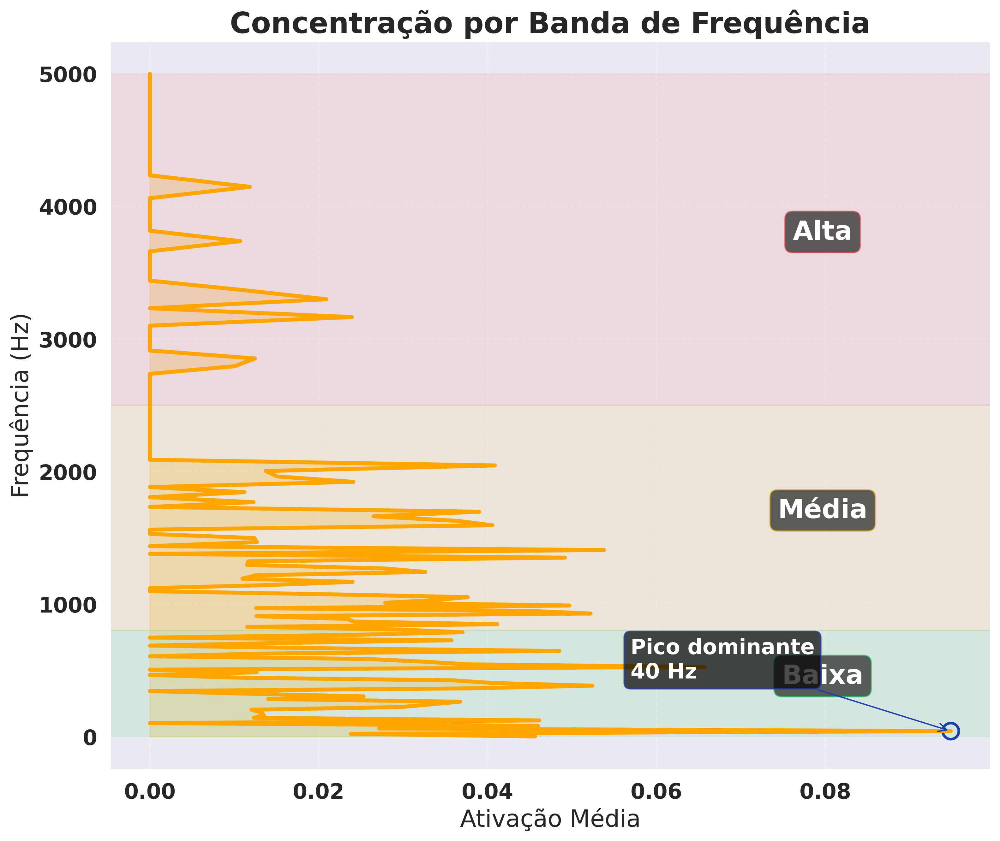


🎉 Finalmente resolvido, Julio! H1 desobstruiu a linha e nada mais vaza no topo.


In [58]:
# =========================================================
# 🏆 VERSÃO DEFINITIVA XAI | ZERO CORTES E ZERO SOBREPOSIÇÃO
# Papel: Gerar 4 figuras individuais com respiro no topo (ylim)
# =========================================================
import matplotlib.patches as patches


print("🚀 Gerando diagnósticos XAI blindados... Ajustando limites verticais.")

# --- CONFIGURAÇÃO DE ESTILO JULIO MAX ---
plt.rcParams['figure.dpi'] = 300
plt.rcParams['font.weight'] = 'bold'
F_TITLE, F_LABEL, F_TICKS, F_ANNOT = 22, 18, 16, 20
COR_DESTAQUE = '#1e40af' # Azul Marinho Escuro

# 1. VISÃO GERAL XAI (SEM MUDANÇAS ESTRUTURAIS)
fig1, ax1 = plt.subplots(figsize=(15, 10))
librosa.display.specshow(mel_db_anomaly, sr=sr_visual, hop_length=hop_visual, x_axis='time', y_axis='mel', ax=ax1, cmap='gray', alpha=0.3)
img1 = librosa.display.specshow(xai_activation, sr=sr_visual, hop_length=hop_visual, x_axis='time', y_axis='mel', ax=ax1, cmap='inferno', alpha=0.92)
ax1.set_title('Visão Geral XAI | Onde a IA encontrou evidência', fontsize=F_TITLE, fontweight='bold')
ax1.set_xlabel('Tempo (s)', fontsize=F_LABEL)
ax1.set_ylabel('Frequência (Mel)', fontsize=F_LABEL)
ax1.tick_params(labelsize=F_TICKS)
if zoom_rect:
    rect = patches.Rectangle((x0, y0), x1-x0, y1-y0, linewidth=3.5, edgecolor=COR_DESTAQUE, facecolor='none', linestyle='--')
    ax1.add_patch(rect)
for i, hotspot in enumerate(xai_hotspots, start=1):
    h_t, h_f = hotspot_to_plot_coords(xai_activation, hotspot, sr=sr_visual, hop_length=hop_visual)
    ax1.scatter([h_t], [h_f], s=260, facecolors='none', edgecolors=COR_DESTAQUE, linewidths=2)
    ax1.annotate(f'H{i}', xy=(h_t, h_f), xytext=(h_t+0.05, h_f+100), fontsize=F_ANNOT-4, color='white', weight='bold',
                 arrowprops=dict(arrowstyle='->', color=COR_DESTAQUE, lw=1.2),
                 bbox=dict(boxstyle='round', fc='black', ec=COR_DESTAQUE, alpha=0.5))
plt.colorbar(img1, ax=ax1, label='Intensidade da Anomalia')
plt.savefig('xai_1_visao_geral.png', dpi=300, bbox_inches='tight')
plt.show()

# 2. ZOOM CRÍTICO (CORREÇÃO DE SOBREPOSIÇÃO NO H1 VIA YLIM)
fig2, ax2 = plt.subplots(figsize=(12, 10))
librosa.display.specshow(mel_db_anomaly, sr=sr_visual, hop_length=hop_visual, x_axis='time', y_axis='mel', ax=ax2, cmap='gray', alpha=0.3)
img2 = librosa.display.specshow(xai_activation, sr=sr_visual, hop_length=hop_visual, x_axis='time', y_axis='mel', ax=ax2, cmap='inferno', alpha=0.92)

# --- AJUSTE DE RESPIRO NO TOPO DO ZOOM (YLIM) ---
ax2.set_xlim(x0, x1)
# Subimos o limite superior (y1) em 15% para dar teto ao H1
ax2.set_ylim(y0, y1 * 1.15)

ax2.set_title('Zoom XAI | Região Crítica', fontsize=F_TITLE, fontweight='bold')
ax2.set_xlabel('Tempo (s)', fontsize=F_LABEL)
ax2.set_ylabel('Frequência (Mel)', fontsize=F_LABEL)
ax2.tick_params(labelsize=F_TICKS)

for i, hotspot in enumerate(xai_hotspots, start=1):
    h_t, h_f = hotspot_to_plot_coords(xai_activation, hotspot, sr=sr_visual, hop_length=hop_visual)
    ax2.scatter([h_t], [h_f], s=400, facecolors='none', edgecolors=COR_DESTAQUE, linewidths=3)

    # Voltamos ao padrão de texto ACIMA do ponto, pois agora há teto.
    # Apenas mantemos o espelhamento horizontal para não vazar pra direita.
    ha_align = 'right' if h_t > (x0 + (x1-x0)/2) else 'left'

    ax2.annotate(f'H{i}', xy=(h_t, h_f), xytext=(h_t, h_f + 150), fontsize=F_ANNOT, color='white', weight='bold',
                 arrowprops=dict(arrowstyle='->', color=COR_DESTAQUE, lw=1.5, connectionstyle="arc3,rad=0.1"),
                 bbox=dict(boxstyle='round,pad=0.3', fc='black', ec=COR_DESTAQUE, alpha=0.8), ha=ha_align)
plt.savefig('xai_2_zoom_critico.png', dpi=300, bbox_inches='tight')
plt.show()

# 3. DECAIMENTO TEMPORAL (CORREÇÃO DE SOBREPOSIÇÃO NO H1 VIA YLIM)
fig3, ax3 = plt.subplots(figsize=(15, 8))
ax3.plot(time_axis, time_profile, color='deepskyblue', linewidth=3, zorder=10)
ax3.fill_between(time_axis, 0, time_profile, color='deepskyblue', alpha=0.2)
ax3.set_title('Decaimento Temporal da Evidência', fontsize=F_TITLE, fontweight='bold')
ax3.set_xlabel('Tempo (s)', fontsize=F_LABEL)
ax3.set_ylabel('Ativação Média', fontsize=F_LABEL)
ax3.tick_params(labelsize=F_TICKS)
ax3.grid(True, linestyle='--', alpha=0.3)

# --- AJUSTE DE RESPIRO NO TOPO DO DECAIMENTO (YLIM) ---
# Subimos o limite superior (max) em 18% para dar teto ao H1 e à caixa grande
y_max_profile = max(time_profile) if len(time_profile) > 0 else 1.0
ax3.set_ylim(0, y_max_profile * 1.18)

for i, hotspot in enumerate(xai_hotspots, start=1):
    h_t, _ = hotspot_to_plot_coords(xai_activation, hotspot, sr=sr_visual, hop_length=hop_visual)
    idx = np.argmin(np.abs(time_axis - h_t))
    val = time_profile[idx]
    ax3.scatter([h_t], [val], s=150, color=COR_DESTAQUE, edgecolor='black', zorder=20)

    # Voltamos ao padrão de texto ACIMA do ponto, pois agora há teto.
    ax3.annotate(f'H{i}', xy=(h_t, val), xytext=(h_t, val + y_max_profile*0.1), fontsize=F_ANNOT-2, color='white', weight='bold',
                 arrowprops=dict(arrowstyle='->', color=COR_DESTAQUE, lw=1.2),
                 bbox=dict(boxstyle='round', fc='black', ec=COR_DESTAQUE, alpha=0.7), va='bottom', ha='center', zorder=25)

# TEXTO EXPLICATIVO ORIGINAL
txt_explicativo = "Picos altos =\nmaior convicção local do modelo"
ax3.annotate(txt_explicativo,
             xy=(0.98, 0.95), xycoords='axes fraction', fontsize=F_ANNOT, weight='bold',
             bbox=dict(boxstyle='round,pad=0.5', fc='black', ec='white', alpha=0.6), color='white', ha='right', va='top', zorder=30)
plt.savefig('xai_3_decaimento.png', dpi=300, bbox_inches='tight')
plt.show()

# 4. FREQUÊNCIA (SEM MUDANÇAS)
fig4, ax4 = plt.subplots(figsize=(12, 10))
ax4.plot(band_profile, mel_freqs, color='orange', linewidth=3)
ax4.fill_betweenx(mel_freqs, 0, band_profile, color='orange', alpha=0.2)
ax4.set_title('Concentração por Banda de Frequência', fontsize=F_TITLE, fontweight='bold')
ax4.set_xlabel('Ativação Média', fontsize=F_LABEL)
ax4.set_ylabel('Frequência (Hz)', fontsize=F_LABEL)
ax4.tick_params(labelsize=F_TICKS)
ax4.grid(True, linestyle='--', alpha=0.3)
for label, f0, f1, color in freq_regions:
    ax4.axhspan(f0, f1, color=color, alpha=0.1)
    ax4.text(ax4.get_xlim()[1]*0.8, (f0+f1)/2, label, fontsize=F_ANNOT, weight='bold',
             bbox=dict(boxstyle='round', fc='black', ec=color, alpha=0.6), color='white', ha='center')
peak_idx = np.argmax(band_profile)
peak_f = mel_freqs[peak_idx]
peak_v = band_profile[peak_idx]
ax4.scatter([peak_v], [peak_f], s=150, facecolors='none', edgecolors=COR_DESTAQUE, linewidths=2)
ax4.annotate(f'Pico dominante\n{peak_f:.0f} Hz', xy=(peak_v, peak_f),
             xytext=(peak_v*0.6, peak_f+400), fontsize=F_ANNOT-4, color='white', weight='bold',
             arrowprops=dict(arrowstyle='->', color=COR_DESTAQUE),
             bbox=dict(boxstyle='round', fc='black', ec=COR_DESTAQUE, alpha=0.7))
plt.savefig('xai_4_frequencia.png', dpi=300, bbox_inches='tight')
plt.show()

print("\n🎉 Finalmente resolvido, Julio! H1 desobstruiu a linha e nada mais vaza no topo.")

# Bloco 10 | Frentes 5 a 11: avaliação estrita, robustez real e entrega final

Esta é a seção mais importante do notebook final. Aqui entram, de forma acumulativa:

- `Frente 5`: ranking estrito por `pAUC@0.1`, `AUC-ROC`, `F1-Score` e `Score DCASE Proxy`;
- `Frente 6`: split por arquivo, eliminando vazamento entre janelas irmãs;
- `Frente 7`: `Outlier Exposure Real` com dados externos sem contaminar o teste cego;
- `Frente 8`: baselines leves para medir ganho incremental real;
- `Frentes 8.2, 8.3 e 8.4`: LSTM-AE, VAE e STFT log 64x64 com lógica controlada de promoção;
- `Frente 9`: diagnóstico cego por arquivo e leitura de margem ao limiar;
- `Frente 9.2`: augmentação leve e pré-treino curto;
- `Frente 10`: XAI fiel do campeão realmente refitado;
- `Frente 11`: perfil Edge/TinyML com exportação e parecer de prontidão.

**Perguntas que esta seção responde.**
1. Quem ganha no benchmark?
2. Quem se sustenta melhor no teste cego?
3. Por que o campeão decide assim?
4. O campeão cabe no mundo edge?


⚙️ Iniciando ETAPA 1: A Força Bruta (Construção das Matrizes dos 6 Experimentos + Frente 4 Mixup + Frente 8.4 STFT)...
🧪 Frente DSP padrão desta execução: HHT + UKF
🔬 A Frente 5 pode avaliar apenas a frente ativa ou comparar várias frentes DSP na mesma rodada.

🧱 Frente 6 | Protocolo de avaliação industrial
   -> Modo selecionado: holdout agrupado por arquivo de origem

🛰️ Frente 7 | Outlier Exposure real
   -> Inativa nesta execução. Para ativar, aponte `AAD_OE_DIRS` para diretórios externos reais ou `AAD_OE_DCASE_ROOTS` para a raiz do DCASE.

🖼️ Frente 8.4 | Exp 6 STFT Log 64x64
   -> Status: ATIVA | n_fft=512 | hop=128 | tensor=64x64

🧾 Plano de benchmark DSP para a Frente 5:


,Frente DSP (ID),Frente DSP,Status
0,hht_ukf,HHT + UKF,ativa e benchmarkada



🧠 Construindo dataset estrutural para a frente DSP: HHT + UKF
   -> Reaproveitando os sinais já processados na seção de DSP.
   -> Fatiando áudios pós-DSP com janela deslizante...


Fatiando Janelas: 100%|██████████| 1000/1000 [00:00<00:00, 102617.96áudio/s]



🧱 Frente 6 ativa: treino/teste separados por arquivo de origem.


,Split,Classe,Arquivos,Janelas
0,Teste,Anômalo,150,150
1,Teste,Normal,150,150
2,Treino,Anômalo,350,350
3,Treino,Normal,350,350


   -> Extraindo features estruturais para 1000 fatias...


Extraindo Experimentos | HHT + UKF: 100%|██████████| 1000/1000 [03:13<00:00,  5.17fatia/s]



[Prévia Didática] Frente 4 Mixup na frente DSP de referência...


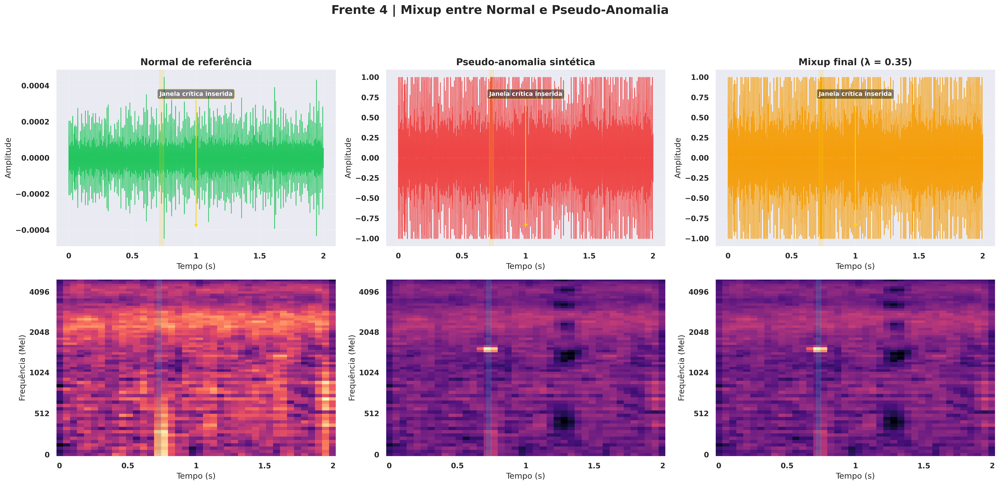

,Sinal,Leitura
0,Normal,Referência da máquina sem defeito explícito
1,Pseudo-anomalia,"Evento sintético entre 0.713s e 0.747s, com po..."
2,Mixup,Combinação convexa com λ=0.35; serve para ensi...


Extraindo Experimentos Mixup | HHT + UKF: 100%|██████████| 70/70 [00:15<00:00,  4.66fatia/s]

   -> Frente HHT + UKF pronta: 1000 janelas | Mixup treino: 70 | OE real: 0


,Amostra,Indice_Base,Lambda,Evento (s),Portadora (Hz),Estratégia
0,1,145,0.4735,1.897-1.967,1128.3,burst + inversão local
1,2,114,0.8500,1.278-1.347,1447.6,burst + deslocamento local
2,3,166,0.3598,0.176-0.216,1803.1,burst + embaralhamento local
3,4,150,0.3500,0.745-0.804,1666.3,burst + deslocamento local
4,5,254,0.3500,0.969-1.033,1086.6,burst + embaralhamento local
5,6,238,0.3500,1.820-1.894,1276.9,burst + embaralhamento local
6,7,164,0.3500,0.051-0.129,2281.3,burst + embaralhamento local
7,8,281,0.7468,0.379-0.435,307.7,burst + embaralhamento local
8,9,123,0.3500,0.657-0.707,1673.4,burst + deslocamento local
9,10,263,0.3500,0.150-0.235,1879.7,burst + inversão local



📌 Resumo das frentes DSP preparadas para a Frente 5/6:


,Frente DSP (ID),Frente DSP,Janelas totais,Janelas treino,Janelas teste,Arquivos treino,Arquivos teste,Janelas Mixup (treino),Janelas OE real,Vazamento por arquivo,É a frente ativa?
0,hht_ukf,HHT + UKF,1000,700,300,700,300,70,0,0,True



🧾 Auditoria consolidada da Frente 6:


,Split,Classe,Arquivos,Janelas
0,Teste,Anômalo,150,150
1,Teste,Normal,150,150
2,Treino,Anômalo,350,350
3,Treino,Normal,350,350



✅ ETAPA 1 CONCLUÍDA em 222.58 segundos!
------------------------------------------------------------------------
Frentes DSP avaliadas nesta rodada: HHT + UKF
Frente DSP de referência para células legadas: HHT + UKF
Janelas de treino: 700 | Janelas de teste: 300
Protocolo da Frente 6: holdout agrupado por arquivo de origem
Arquivos compartilhados entre treino e teste: 0
Modo multipista DSP: frente única
Frente 4 Mixup ativa: True
Configuração Mixup: razão=0.20 | alpha=0.40 | alvo FPR=0.10
🧹 As features ficaram organizadas por frente DSP em `experimentos_por_frente` para o benchmark comparativo.


In [59]:
# =========================================================
# FINAL NOTEBOOK | Etapa 1 do benchmark
# Papel deste bloco:
# - constrói as matrizes dos seis experimentos
# - organiza as frentes DSP para o super loop
# =========================================================
print("⚙️ Iniciando ETAPA 1: A Força Bruta (Construção das Matrizes dos 6 Experimentos + Frente 4 Mixup + Frente 8.4 STFT)...")
print(f"🧪 Frente DSP padrão desta execução: {globals().get('DSP_FRONT_ATIVO_LABEL', 'DSP ativa')}")
print("🔬 A Frente 5 pode avaliar apenas a frente ativa ou comparar várias frentes DSP na mesma rodada.")

# Reforço de contexto para permitir reexecução isolada desta etapa.
import gc
import os
import time
from pathlib import Path

import librosa
import numpy as np
import pandas as pd
import pywt
import scipy.stats as stats
from scipy.ndimage import zoom
from sklearn.decomposition import NMF
from sklearn.model_selection import train_test_split

SR_TARGET = int(globals().get('SR_TARGET', 10000))
CPU_THREADS = int(globals().get('CPU_THREADS', max(1, (os.cpu_count() or 2) - 1)))
MIXUP_ENABLED = bool(globals().get('MIXUP_ENABLED', True))
MIXUP_RATIO = float(globals().get('MIXUP_RATIO', 0.20))
MIXUP_ALPHA = float(globals().get('MIXUP_ALPHA', 0.40))
MIXUP_MAX_SAMPLES = int(globals().get('MIXUP_MAX_SAMPLES', 800))
MIXUP_SEED = int(globals().get('MIXUP_SEED', 42))
MIXUP_TARGET_FPR = float(globals().get('MIXUP_TARGET_FPR', 0.10))
DSP_PROCESS_MAX_LEN = int(globals().get('DSP_MAX_LEN', 20000))

required_symbols_etapa1 = [
    'X_train', 'y_train', 'DSP_FRONT_OPTIONS', 'DSP_FRONT_LABELS', 'process_signals_with_front',
    'build_signal_metadata', 'apply_sliding_window_to_list', 'rpca_ialm', 'create_mixup_dataset',
    'create_pseudo_anomaly', 'mixup_audio_pair', 'plot_mixup_preview',
]
missing_symbols_etapa1 = [name for name in required_symbols_etapa1 if name not in globals()]
if missing_symbols_etapa1:
    raise RuntimeError(
        'A ETAPA 1 depende das células anteriores de preparação e DSP. '
        f'Execute o notebook em ordem até a seção de DSP antes de rerodar esta etapa. Faltando: {missing_symbols_etapa1}'
    )

FRONT84_ENABLE_STFT = os.getenv('AAD_FRONT84_ENABLE_STFT', '1').strip().lower() in {'1', 'true', 'yes', 'sim'}
FRONT84_EXPERIMENT_NAME = 'Exp 6 (STFT Log 64x64)'
FRONT84_STFT_NFFT = int(os.getenv('AAD_FRONT84_STFT_NFFT', '512'))
FRONT84_STFT_HOP = int(os.getenv('AAD_FRONT84_STFT_HOP', '128'))

EXPERIMENT_TYPES = {
    'Exp 1 (Mel + RPCA)': 'imagem',
    'Exp 2 (MFCC Dinâmico)': 'vetor',
    'Exp 3 (CWT + RPCA)': 'imagem',
    'Exp 4 (Híbrido Antigo)': 'vetor',
    'Exp 5 (Híbrido NMF)': 'vetor',
}
if FRONT84_ENABLE_STFT:
    EXPERIMENT_TYPES[FRONT84_EXPERIMENT_NAME] = 'imagem'


def prepare_mel_pair(audio_segment, sr=SR_TARGET, n_mels=64, n_fft=2048, hop_length=512, target_time=64):
    mel_power = librosa.feature.melspectrogram(y=audio_segment, sr=sr, n_fft=n_fft, hop_length=hop_length, n_mels=n_mels)
    mel_db = librosa.power_to_db(mel_power, ref=np.max)

    if mel_db.shape[1] > target_time:
        mel_db = mel_db[:, :target_time]
        mel_power = mel_power[:, :target_time]
    else:
        mel_db = np.pad(mel_db, ((0, 0), (0, target_time - mel_db.shape[1])))
        mel_power = np.pad(mel_power, ((0, 0), (0, target_time - mel_power.shape[1])))

    return mel_db.astype(np.float32), mel_power.astype(np.float32)


def prepare_stft_log_image(audio_segment, sr=SR_TARGET, n_fft=512, hop_length=128, target_shape=(64, 64)):
    stft_complex = librosa.stft(y=audio_segment, n_fft=n_fft, hop_length=hop_length, win_length=n_fft, center=True)
    stft_power = np.abs(stft_complex) ** 2
    robust_ref = float(np.percentile(stft_power, 95)) if stft_power.size > 0 else 1.0
    robust_ref = max(robust_ref, 1e-12)
    stft_log = librosa.power_to_db(stft_power + 1e-12, ref=robust_ref)
    stft_log = np.clip(stft_log, -80.0, 0.0)

    zoom_factors = (
        target_shape[0] / max(stft_log.shape[0], 1),
        target_shape[1] / max(stft_log.shape[1], 1),
    )
    stft_resized = zoom(stft_log, zoom_factors, order=1)
    stft_resized = stft_resized[: target_shape[0], : target_shape[1]]

    pad_h = max(0, target_shape[0] - stft_resized.shape[0])
    pad_w = max(0, target_shape[1] - stft_resized.shape[1])
    if pad_h > 0 or pad_w > 0:
        stft_resized = np.pad(stft_resized, ((0, pad_h), (0, pad_w)))

    return stft_resized.astype(np.float32)


def extract_all_experiment_features(audio_segment, sr=SR_TARGET):
    audio_segment = np.asarray(audio_segment, dtype=np.float32)
    mel_db, mel_power = prepare_mel_pair(audio_segment, sr=sr)
    _, S_mel = rpca_ialm(mel_db, max_iter=50)

    mfcc = librosa.feature.mfcc(y=audio_segment, sr=sr, n_mfcc=13)
    mfcc_delta = librosa.feature.delta(mfcc, width=3)
    mfcc_delta2 = librosa.feature.delta(mfcc, order=2, width=3)

    mfcc_features = np.concatenate([
        np.mean(mfcc, axis=1), np.std(mfcc, axis=1),
        np.mean(mfcc_delta, axis=1), np.std(mfcc_delta, axis=1),
        np.mean(mfcc_delta2, axis=1), np.std(mfcc_delta2, axis=1)
    ]).astype(np.float32)

    scales = np.geomspace(1, 64, num=64)
    coef, _ = pywt.cwt(audio_segment, scales, 'morl', sampling_period=1 / sr)
    cwt_db = librosa.amplitude_to_db(np.abs(coef), ref=np.max)
    if cwt_db.shape[1] > 64:
        cwt_resized = cwt_db[:, :64]
    else:
        cwt_resized = np.pad(cwt_db, ((0, 0), (0, 64 - cwt_db.shape[1])))
    _, S_cwt = rpca_ialm(cwt_resized, max_iter=50)

    stft_log_img = None
    if FRONT84_ENABLE_STFT:
        stft_log_img = prepare_stft_log_image(
            audio_segment,
            sr=sr,
            n_fft=FRONT84_STFT_NFFT,
            hop_length=FRONT84_STFT_HOP,
            target_shape=(64, 64),
        )

    rms = librosa.feature.rms(y=audio_segment)[0]
    kurtosis_val = stats.kurtosis(audio_segment)
    skewness_val = stats.skew(audio_segment)

    try:
        nmf_model = NMF(n_components=5, init='nndsvda', max_iter=200, random_state=42)
        W = nmf_model.fit_transform(mel_power)
        H = nmf_model.components_
        mel_reconstructed = np.dot(W, H)
        nmf_error = np.mean((mel_power - mel_reconstructed) ** 2)
    except Exception:
        nmf_error = 0.0

    feature_map = {
        'Exp 1 (Mel + RPCA)': S_mel[np.newaxis, ...].astype(np.float32),
        'Exp 2 (MFCC Dinâmico)': mfcc_features,
        'Exp 3 (CWT + RPCA)': S_cwt[np.newaxis, ...].astype(np.float32),
        'Exp 4 (Híbrido Antigo)': np.concatenate([
            mfcc_features,
            [np.mean(rms), np.std(rms), kurtosis_val, skewness_val, np.mean(S_mel)]
        ]).astype(np.float32),
        'Exp 5 (Híbrido NMF)': np.concatenate([
            mfcc_features,
            [np.mean(rms), np.std(rms), kurtosis_val, skewness_val, nmf_error]
        ]).astype(np.float32),
    }
    if FRONT84_ENABLE_STFT and stft_log_img is not None:
        feature_map[FRONT84_EXPERIMENT_NAME] = stft_log_img[np.newaxis, ...].astype(np.float32)
    return feature_map


def build_experiment_feature_bank(audio_segments, desc):
    feature_bank = {name: [] for name in EXPERIMENT_TYPES}
    for audio_segment in tqdm(audio_segments, desc=desc, unit='fatia'):
        feature_map = extract_all_experiment_features(audio_segment, sr=SR_TARGET)
        for exp_name in feature_bank:
            feature_bank[exp_name].append(feature_map[exp_name])

    for exp_name in feature_bank:
        feature_bank[exp_name] = np.array(feature_bank[exp_name], dtype=np.float32)
    return feature_bank


def empty_like_feature_bank(reference_bank):
    return {
        exp_name: np.empty((0,) + reference_bank[exp_name].shape[1:], dtype=np.float32)
        for exp_name in reference_bank
    }


def cap_exposure_windows_by_group(X_windows, metadata_df, max_windows, seed=42):
    X_windows = np.asarray(X_windows, dtype=np.float32)
    metadata_df = metadata_df.reset_index(drop=True).copy()

    if max_windows is None or max_windows <= 0 or len(X_windows) <= max_windows:
        return X_windows, metadata_df

    if metadata_df.empty or 'group_id' not in metadata_df.columns:
        chosen = np.arange(len(X_windows))
        rng = np.random.default_rng(seed)
        rng.shuffle(chosen)
        chosen = np.sort(chosen[:max_windows])
        return X_windows[chosen], metadata_df.iloc[chosen].reset_index(drop=True)

    rng = np.random.default_rng(seed)
    selected_idx = []
    unique_groups = metadata_df['group_id'].drop_duplicates().tolist()
    per_group_cap = max(1, int(np.ceil(max_windows / max(len(unique_groups), 1))))

    for group_id in unique_groups:
        group_idx = metadata_df.index[metadata_df['group_id'] == group_id].to_numpy(dtype=np.int64)
        if len(group_idx) > per_group_cap:
            chosen = rng.choice(group_idx, size=per_group_cap, replace=False)
        else:
            chosen = group_idx
        selected_idx.extend(chosen.tolist())

    if len(selected_idx) > max_windows:
        selected_idx = rng.choice(np.asarray(selected_idx, dtype=np.int64), size=max_windows, replace=False).tolist()

    selected_idx = np.asarray(sorted(set(int(idx) for idx in selected_idx)), dtype=np.int64)
    return X_windows[selected_idx], metadata_df.iloc[selected_idx].reset_index(drop=True)


COMPARE_ALL_DSP_FRONTS = os.getenv('AAD_COMPARE_ALL_DSP_FRONTS', '0').strip().lower() in {'1', 'true', 'yes', 'sim'}
CUSTOM_BENCHMARK_FRONTS = [
    item.strip().lower()
    for item in os.getenv('AAD_DSP_BENCHMARK_FRONTS', '').split(',')
    if item.strip()
]

if CUSTOM_BENCHMARK_FRONTS:
    invalid_fronts = [front for front in CUSTOM_BENCHMARK_FRONTS if front not in DSP_FRONT_OPTIONS]
    if invalid_fronts:
        raise ValueError(
            f"Frentes DSP inválidas em AAD_DSP_BENCHMARK_FRONTS: {invalid_fronts}. "
            f"Use apenas {list(DSP_FRONT_OPTIONS.keys())}."
        )
    BENCHMARK_DSP_FRONTS = CUSTOM_BENCHMARK_FRONTS
elif COMPARE_ALL_DSP_FRONTS:
    BENCHMARK_DSP_FRONTS = ['hht', 'ukf', 'hht_ukf']
else:
    BENCHMARK_DSP_FRONTS = [globals().get('DSP_FRONT_ATIVO', 'hht')]

BENCHMARK_DSP_FRONTS = list(dict.fromkeys(BENCHMARK_DSP_FRONTS))
FRONT_DSP_REFERENCIA = globals().get('DSP_FRONT_ATIVO', BENCHMARK_DSP_FRONTS[0])
if FRONT_DSP_REFERENCIA not in BENCHMARK_DSP_FRONTS:
    FRONT_DSP_REFERENCIA = BENCHMARK_DSP_FRONTS[0]

FRONT6_PROTOCOL_MODE = os.getenv('AAD_FRONT6_PROTOCOL_MODE', 'grouped_file').strip().lower()
FRONT6_TEST_SIZE = float(os.getenv('AAD_FRONT6_TEST_SIZE', '0.30'))
FRONT6_RANDOM_STATE = int(os.getenv('AAD_FRONT6_RANDOM_STATE', '42'))
FRONT6_PROTOCOL_ACTIVE = FRONT6_PROTOCOL_MODE != 'legacy_window'
FRONT6_PROTOCOL_LABEL = 'holdout agrupado por arquivo de origem' if FRONT6_PROTOCOL_ACTIVE else 'split legado aleatório por janela'
FRONT6_GROUPING_LABEL = 'arquivo de origem'
FRONT6_PROTOCOL_REPORT = {}
FRONT6_WINDOW_REFERENCE = None
FRONT6_SHARED_GROUPS_COUNT = np.nan

OE_REAL_AVAILABLE = bool(globals().get('OE_REAL_ENABLED', False) and len(globals().get('X_oe_real', [])) > 0)
OE_REAL_MAX_WINDOWS = int(globals().get('OE_REAL_MAX_WINDOWS', 0))
OE_REAL_SEED = int(globals().get('OE_REAL_SEED', 42))

print("\n🧱 Frente 6 | Protocolo de avaliação industrial")
print(f"   -> Modo selecionado: {FRONT6_PROTOCOL_LABEL}")
if not FRONT6_PROTOCOL_ACTIVE:
    print("   -> Aviso: modo legado ativado; isso pode reintroduzir vazamento entre janelas irmãs.")

print("\n🛰️ Frente 7 | Outlier Exposure real")
if OE_REAL_AVAILABLE:
    print(f"   -> Fontes externas detectadas: {len(globals().get('X_oe_real', []))} sinais | teto de janelas por frente: {OE_REAL_MAX_WINDOWS}")
else:
    print("   -> Inativa nesta execução. Para ativar, aponte `AAD_OE_DIRS` para diretórios externos reais ou `AAD_OE_DCASE_ROOTS` para a raiz do DCASE.")

print("\n🖼️ Frente 8.4 | Exp 6 STFT Log 64x64")
print(f"   -> Status: {'ATIVA' if FRONT84_ENABLE_STFT else 'desligada'} | n_fft={FRONT84_STFT_NFFT} | hop={FRONT84_STFT_HOP} | tensor=64x64")

print("\n🧾 Plano de benchmark DSP para a Frente 5:")
display(pd.DataFrame([
    {
        'Frente DSP (ID)': front_name,
        'Frente DSP': DSP_FRONT_LABELS.get(front_name, front_name),
        'Status': 'ativa e benchmarkada' if front_name == globals().get('DSP_FRONT_ATIVO') else 'benchmarkada',
    }
    for front_name in BENCHMARK_DSP_FRONTS
]))

start_time = time.time()
experimentos_por_frente = {}
front_dataset_cache = {}
front_summary_rows = []
benchmark_train_idx = None
benchmark_test_idx = None
y_win = None
mixup_preview_done = False

for front_name in BENCHMARK_DSP_FRONTS:
    front_label = DSP_FRONT_LABELS.get(front_name, front_name)
    print("\n" + "=" * 88)
    print(f"🧠 Construindo dataset estrutural para a frente DSP: {front_label}")
    print("=" * 88)

    if front_name == globals().get('DSP_FRONT_ATIVO') and 'X_train_dsp_signals' in globals():
        dsp_signals = [np.asarray(sig, dtype=np.float32) for sig in X_train_dsp_signals]
        dsp_labels = np.asarray(globals().get('y_train_dsp', y_train), dtype=np.int64)
        print("   -> Reaproveitando os sinais já processados na seção de DSP.")
    else:
        front_cache_key = build_dsp_cache_key(X_train, y_train, front_name, SR_TARGET, DSP_PROCESS_MAX_LEN) if 'build_dsp_cache_key' in globals() else None
        front_payload = None
        front_cache_origin = None
        if front_cache_key is not None and 'load_dsp_cache_payload' in globals():
            front_payload, front_cache_origin = load_dsp_cache_payload(front_cache_key)

        if front_payload is not None:
            dsp_signals = [np.asarray(sig, dtype=np.float32) for sig in front_payload['signals']]
            dsp_labels = np.asarray(front_payload['labels'], dtype=np.int64)
            print(f"   -> Cache DSP reaproveitado para {front_label}: {front_cache_origin}")
        else:
            dsp_signals = process_signals_with_front(
                X_train,
                front_name,
                sr=SR_TARGET,
                max_len=DSP_PROCESS_MAX_LEN,
                desc_prefix='Filtrando Sinais para Benchmark'
            )
            dsp_labels = np.asarray(y_train, dtype=np.int64)
            if front_cache_key is not None and 'save_dsp_cache_payload' in globals():
                save_dsp_cache_payload(
                    front_cache_key,
                    {
                        'front_name': front_name,
                        'front_label': front_label,
                        'sr': int(SR_TARGET),
                        'max_len': int(DSP_PROCESS_MAX_LEN),
                        'signals': dsp_signals,
                        'labels': dsp_labels,
                    },
                )

    signal_metadata_front = build_signal_metadata(
        file_names=globals().get('train_file_names'),
        labels=dsp_labels,
        groups=globals().get('train_source_groups'),
        folders=globals().get('train_source_folders'),
    )

    print("   -> Fatiando áudios pós-DSP com janela deslizante...")
    X_win_front, y_win_front, window_metadata_front = apply_sliding_window_to_list(
        dsp_signals,
        dsp_labels,
        sr=SR_TARGET,
        window_size=2.0,
        metadata_list=signal_metadata_front,
        return_metadata=True,
    )
    window_metadata_front['front_name'] = front_name
    window_metadata_front['front_label'] = front_label

    if y_win is None:
        y_win = y_win_front
        reference_cols = ['group_id', 'source_index', 'window_index', 'start_sample', 'end_sample']
        FRONT6_WINDOW_REFERENCE = window_metadata_front[reference_cols].copy()

        if FRONT6_PROTOCOL_ACTIVE:
            FRONT6_PROTOCOL_REPORT = build_grouped_protocol_split(
                window_metadata_front,
                test_size=FRONT6_TEST_SIZE,
                random_state=FRONT6_RANDOM_STATE,
                group_col='group_id',
                label_col='class_label',
            )
            benchmark_train_idx = FRONT6_PROTOCOL_REPORT['train_idx']
            benchmark_test_idx = FRONT6_PROTOCOL_REPORT['test_idx']
            FRONT6_SHARED_GROUPS_COUNT = int(FRONT6_PROTOCOL_REPORT['shared_group_count'])
            if FRONT6_SHARED_GROUPS_COUNT != 0:
                raise RuntimeError("A Frente 6 detectou vazamento de arquivos entre treino e teste.")

            print("\n🧱 Frente 6 ativa: treino/teste separados por arquivo de origem.")
            display(FRONT6_PROTOCOL_REPORT['summary_table'])
        else:
            benchmark_train_idx, benchmark_test_idx = train_test_split(
                np.arange(len(y_win_front)),
                test_size=FRONT6_TEST_SIZE,
                random_state=FRONT6_RANDOM_STATE,
                stratify=y_win_front,
            )
            FRONT6_PROTOCOL_REPORT = {
                'summary_table': pd.DataFrame(),
                'audit_table': pd.DataFrame(),
                'train_groups': [],
                'test_groups': [],
                'shared_group_count': np.nan,
                'protocol_label': FRONT6_PROTOCOL_LABEL,
                'grouping_label': FRONT6_GROUPING_LABEL,
            }
            FRONT6_SHARED_GROUPS_COUNT = np.nan

        y_train_benchmark = y_win[benchmark_train_idx]
        y_test_benchmark = y_win[benchmark_test_idx]
    else:
        if len(y_win_front) != len(y_win) or not np.array_equal(y_win_front, y_win):
            raise RuntimeError(
                "As frentes DSP geraram conjuntos de janelas incompatíveis. "
                "Revise o pré-processamento antes do benchmarking conjunto."
            )

        reference_cols = ['group_id', 'source_index', 'window_index', 'start_sample', 'end_sample']
        current_reference = window_metadata_front[reference_cols].copy()
        if FRONT6_WINDOW_REFERENCE is not None and not current_reference.reset_index(drop=True).equals(FRONT6_WINDOW_REFERENCE.reset_index(drop=True)):
            raise RuntimeError(
                "A Frente 6 detectou desalinhamento entre as janelas das diferentes frentes DSP. "
                "Revise o pré-processamento antes do benchmarking conjunto."
            )

    print(f"   -> Extraindo features estruturais para {len(X_win_front)} fatias...")
    full_feature_bank = build_experiment_feature_bank(X_win_front, f"Extraindo Experimentos | {front_label}")

    if not mixup_preview_done:
        print("\n[Prévia Didática] Frente 4 Mixup na frente DSP de referência...")
        normal_segments_preview = X_win_front[y_win_front == 0]
        df_mixup_preview = pd.DataFrame()

        if MIXUP_ENABLED and len(normal_segments_preview) > 0:
            preview_rms = np.array([np.sqrt(np.mean(seg ** 2)) for seg in normal_segments_preview[: min(64, len(normal_segments_preview))]])
            preview_idx = int(np.argmax(preview_rms)) if preview_rms.size > 0 else 0
            preview_base = normal_segments_preview[preview_idx]
            preview_pseudo, preview_meta = create_pseudo_anomaly(
                preview_base,
                sr=SR_TARGET,
                rng=np.random.default_rng(MIXUP_SEED + 7),
                return_metadata=True,
            )
            preview_mixup, preview_lambda = mixup_audio_pair(
                preview_base,
                preview_pseudo,
                alpha=MIXUP_ALPHA,
                rng=np.random.default_rng(MIXUP_SEED + 19),
            )

            plot_mixup_preview(preview_base, preview_pseudo, preview_mixup, preview_meta, preview_lambda, sr=SR_TARGET)

            df_mixup_preview = pd.DataFrame([
                {
                    'Sinal': 'Normal',
                    'Leitura': 'Referência da máquina sem defeito explícito',
                },
                {
                    'Sinal': 'Pseudo-anomalia',
                    'Leitura': f"Evento sintético entre {preview_meta['event_start_s']:.3f}s e {preview_meta['event_end_s']:.3f}s, com portadora em {preview_meta['carrier_freq_hz']:.1f} Hz",
                },
                {
                    'Sinal': 'Mixup',
                    'Leitura': f"Combinação convexa com λ={preview_lambda:.2f}; serve para ensinar ao modelo zonas intermediárias entre normal e falha",
                },
            ])
            display(df_mixup_preview)
        else:
            print("Mixup desativado ou sem janelas normais suficientes para a visualização.")

        mixup_preview_done = True

    X_mixup_audio_train = np.empty((0,), dtype=np.float32)
    df_mixup_train = pd.DataFrame()
    mixup_feature_bank = empty_like_feature_bank(full_feature_bank)

    if MIXUP_ENABLED:
        X_train_audio = X_win_front[benchmark_train_idx]
        X_train_audio_normal = X_train_audio[y_train_benchmark == 0]
        X_mixup_audio_train, _, df_mixup_train = create_mixup_dataset(
            X_train_audio_normal,
            sr=SR_TARGET,
            mixup_ratio=MIXUP_RATIO,
            alpha=MIXUP_ALPHA,
            max_samples=MIXUP_MAX_SAMPLES,
            seed=MIXUP_SEED,
        )

        if len(X_mixup_audio_train) > 0:
            mixup_feature_bank = build_experiment_feature_bank(
                X_mixup_audio_train,
                f"Extraindo Experimentos Mixup | {front_label}",
            )

    oe_real_feature_bank = empty_like_feature_bank(full_feature_bank)
    oe_real_window_count = 0

    if OE_REAL_AVAILABLE:
        print("   -> Frente 7: processando fontes reais de outlier exposure...")
        oe_dsp_signals = process_signals_with_front(
            globals().get('X_oe_real', []),
            front_name,
            sr=SR_TARGET,
            max_len=20000,
            desc_prefix='Filtrando OE Real'
        )
        oe_labels = np.ones(len(oe_dsp_signals), dtype=np.int64)
        oe_metadata = build_signal_metadata(
            file_names=globals().get('oe_real_file_names'),
            labels=oe_labels,
            groups=globals().get('oe_real_source_groups'),
            folders=globals().get('oe_real_source_folders'),
        )
        X_oe_real_audio, _, oe_window_metadata = apply_sliding_window_to_list(
            oe_dsp_signals,
            oe_labels,
            sr=SR_TARGET,
            window_size=2.0,
            metadata_list=oe_metadata,
            return_metadata=True,
        )
        X_oe_real_audio, oe_window_metadata = cap_exposure_windows_by_group(
            X_oe_real_audio,
            oe_window_metadata,
            max_windows=OE_REAL_MAX_WINDOWS,
            seed=OE_REAL_SEED + 11,
        )
        oe_real_window_count = int(len(X_oe_real_audio))

        if oe_real_window_count > 0:
            oe_real_feature_bank = build_experiment_feature_bank(
                X_oe_real_audio,
                f"Extraindo Experimentos OE Real | {front_label}",
            )
        else:
            print("      -> Nenhuma janela OE real permaneceu após o cap de memória.")

        del oe_dsp_signals, X_oe_real_audio, oe_window_metadata
        gc.collect()

    experimentos_front = {
        'Exp 1 (Mel + RPCA)': {
            'tipo': 'imagem',
            'X': full_feature_bank['Exp 1 (Mel + RPCA)'],
            'X_mixup_train': mixup_feature_bank.get('Exp 1 (Mel + RPCA)'),
            'X_oe_real_train': oe_real_feature_bank.get('Exp 1 (Mel + RPCA)'),
        },
        'Exp 2 (MFCC Dinâmico)': {
            'tipo': 'vetor',
            'X': full_feature_bank['Exp 2 (MFCC Dinâmico)'],
            'X_mixup_train': mixup_feature_bank.get('Exp 2 (MFCC Dinâmico)'),
            'X_oe_real_train': oe_real_feature_bank.get('Exp 2 (MFCC Dinâmico)'),
        },
        'Exp 3 (CWT + RPCA)': {
            'tipo': 'imagem',
            'X': full_feature_bank['Exp 3 (CWT + RPCA)'],
            'X_mixup_train': mixup_feature_bank.get('Exp 3 (CWT + RPCA)'),
            'X_oe_real_train': oe_real_feature_bank.get('Exp 3 (CWT + RPCA)'),
        },
        'Exp 4 (Híbrido Antigo)': {
            'tipo': 'vetor',
            'X': full_feature_bank['Exp 4 (Híbrido Antigo)'],
            'X_mixup_train': mixup_feature_bank.get('Exp 4 (Híbrido Antigo)'),
            'X_oe_real_train': oe_real_feature_bank.get('Exp 4 (Híbrido Antigo)'),
        },
        'Exp 5 (Híbrido NMF)': {
            'tipo': 'vetor',
            'X': full_feature_bank['Exp 5 (Híbrido NMF)'],
            'X_mixup_train': mixup_feature_bank.get('Exp 5 (Híbrido NMF)'),
            'X_oe_real_train': oe_real_feature_bank.get('Exp 5 (Híbrido NMF)'),
        },
    }
    if FRONT84_ENABLE_STFT:
        experimentos_front[FRONT84_EXPERIMENT_NAME] = {
            'tipo': 'imagem',
            'X': full_feature_bank[FRONT84_EXPERIMENT_NAME],
            'X_mixup_train': mixup_feature_bank.get(FRONT84_EXPERIMENT_NAME),
            'X_oe_real_train': oe_real_feature_bank.get(FRONT84_EXPERIMENT_NAME),
        }
    experimentos_por_frente[front_name] = experimentos_front

    front_dataset_cache[front_name] = {
        'front_name': front_name,
        'front_label': front_label,
        'signals': dsp_signals,
        'labels': dsp_labels,
        'window_count': int(len(y_win_front)),
        'mixup_count': int(len(X_mixup_audio_train)),
        'oe_real_count': int(oe_real_window_count),
        'train_window_count': int(len(benchmark_train_idx)),
        'test_window_count': int(len(benchmark_test_idx)),
        'train_group_count': int(len(FRONT6_PROTOCOL_REPORT.get('train_groups', []))) if FRONT6_PROTOCOL_ACTIVE else np.nan,
        'test_group_count': int(len(FRONT6_PROTOCOL_REPORT.get('test_groups', []))) if FRONT6_PROTOCOL_ACTIVE else np.nan,
    }

    front_summary_rows.append({
        'Frente DSP (ID)': front_name,
        'Frente DSP': front_label,
        'Janelas totais': int(len(y_win_front)),
        'Janelas treino': int(len(benchmark_train_idx)),
        'Janelas teste': int(len(benchmark_test_idx)),
        'Arquivos treino': int(len(FRONT6_PROTOCOL_REPORT.get('train_groups', []))) if FRONT6_PROTOCOL_ACTIVE else np.nan,
        'Arquivos teste': int(len(FRONT6_PROTOCOL_REPORT.get('test_groups', []))) if FRONT6_PROTOCOL_ACTIVE else np.nan,
        'Janelas Mixup (treino)': int(len(X_mixup_audio_train)),
        'Janelas OE real': int(oe_real_window_count),
        'Vazamento por arquivo': int(FRONT6_SHARED_GROUPS_COUNT) if np.isfinite(FRONT6_SHARED_GROUPS_COUNT) else np.nan,
        'É a frente ativa?': front_name == globals().get('DSP_FRONT_ATIVO'),
    })

    print(f"   -> Frente {front_label} pronta: {len(y_win_front)} janelas | Mixup treino: {len(X_mixup_audio_train)} | OE real: {oe_real_window_count}")
    if front_name == FRONT_DSP_REFERENCIA and not df_mixup_train.empty:
        display(df_mixup_train.head(10))

    del X_win_front, full_feature_bank, mixup_feature_bank, oe_real_feature_bank
    gc.collect()

df_front_benchmark = pd.DataFrame(front_summary_rows)
if not df_front_benchmark.empty:
    print("\n📌 Resumo das frentes DSP preparadas para a Frente 5/6:")
    display(df_front_benchmark)

if FRONT6_PROTOCOL_ACTIVE and FRONT6_PROTOCOL_REPORT.get('summary_table') is not None and not FRONT6_PROTOCOL_REPORT['summary_table'].empty:
    print("\n🧾 Auditoria consolidada da Frente 6:")
    display(FRONT6_PROTOCOL_REPORT['summary_table'])

experimentos = experimentos_por_frente[FRONT_DSP_REFERENCIA]
X_train_dsp = front_dataset_cache[FRONT_DSP_REFERENCIA]['signals']
X_train_dsp_signals = X_train_dsp
y_train_dsp = front_dataset_cache[FRONT_DSP_REFERENCIA]['labels']
X_train_hht = X_train_dsp_signals
y_train_hht = y_train_dsp

print(f"\n✅ ETAPA 1 CONCLUÍDA em {time.time() - start_time:.2f} segundos!")
print("-" * 72)
print(f"Frentes DSP avaliadas nesta rodada: {', '.join([DSP_FRONT_LABELS.get(front, front) for front in BENCHMARK_DSP_FRONTS])}")
print(f"Frente DSP de referência para células legadas: {DSP_FRONT_LABELS.get(FRONT_DSP_REFERENCIA, FRONT_DSP_REFERENCIA)}")
print(f"Janelas de treino: {len(benchmark_train_idx)} | Janelas de teste: {len(benchmark_test_idx)}")
print(f"Protocolo da Frente 6: {FRONT6_PROTOCOL_LABEL}")
if np.isfinite(FRONT6_SHARED_GROUPS_COUNT):
    print(f"Arquivos compartilhados entre treino e teste: {int(FRONT6_SHARED_GROUPS_COUNT)}")
print(f"Modo multipista DSP: {'ATIVO' if len(BENCHMARK_DSP_FRONTS) > 1 else 'frente única'}")
print(f"Frente 4 Mixup ativa: {MIXUP_ENABLED}")
if MIXUP_ENABLED:
    mixup_target_fpr_display = float(globals().get('THRESHOLD_TARGET_FPR', globals().get('MIXUP_TARGET_FPR', 0.10)))
print(f"Configuração Mixup: razão={MIXUP_RATIO:.2f} | alpha={MIXUP_ALPHA:.2f} | alvo FPR={mixup_target_fpr_display:.2f}")
print("🧹 As features ficaram organizadas por frente DSP em `experimentos_por_frente` para o benchmark comparativo.")

# Geração e salvamento dos graficos

🚀 Gerando figuras Mixup em alta resolução (com janela em todos)...


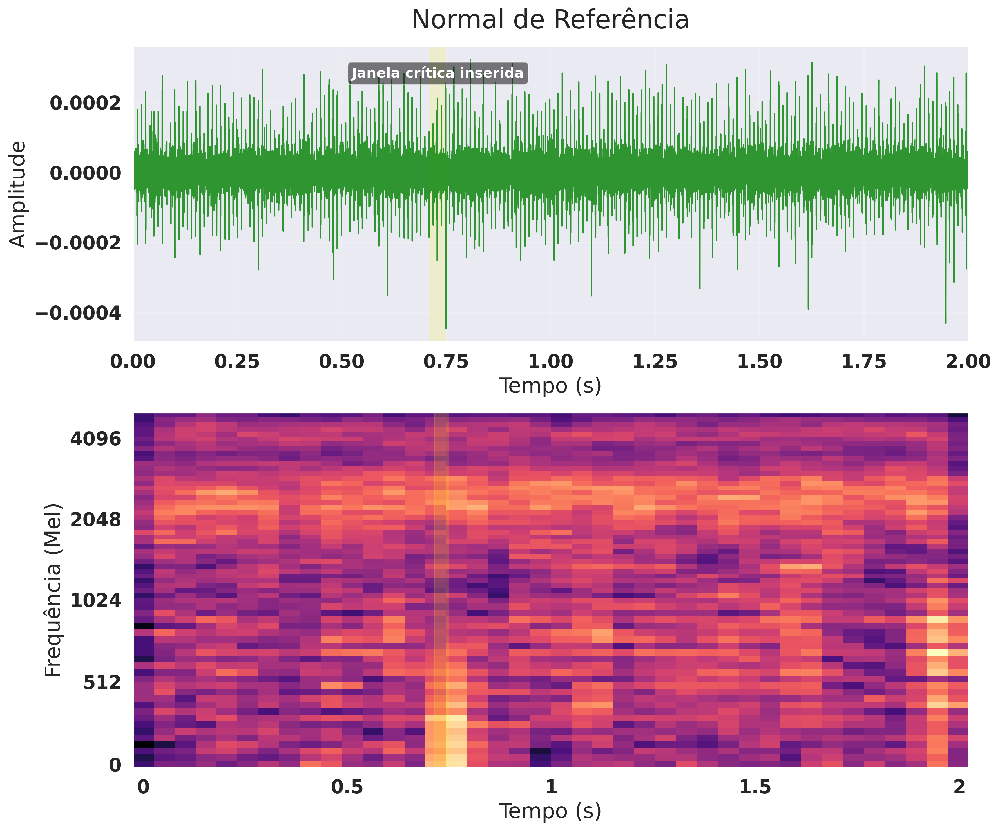

✅ Salvo: fig_mixup_1_normal.png


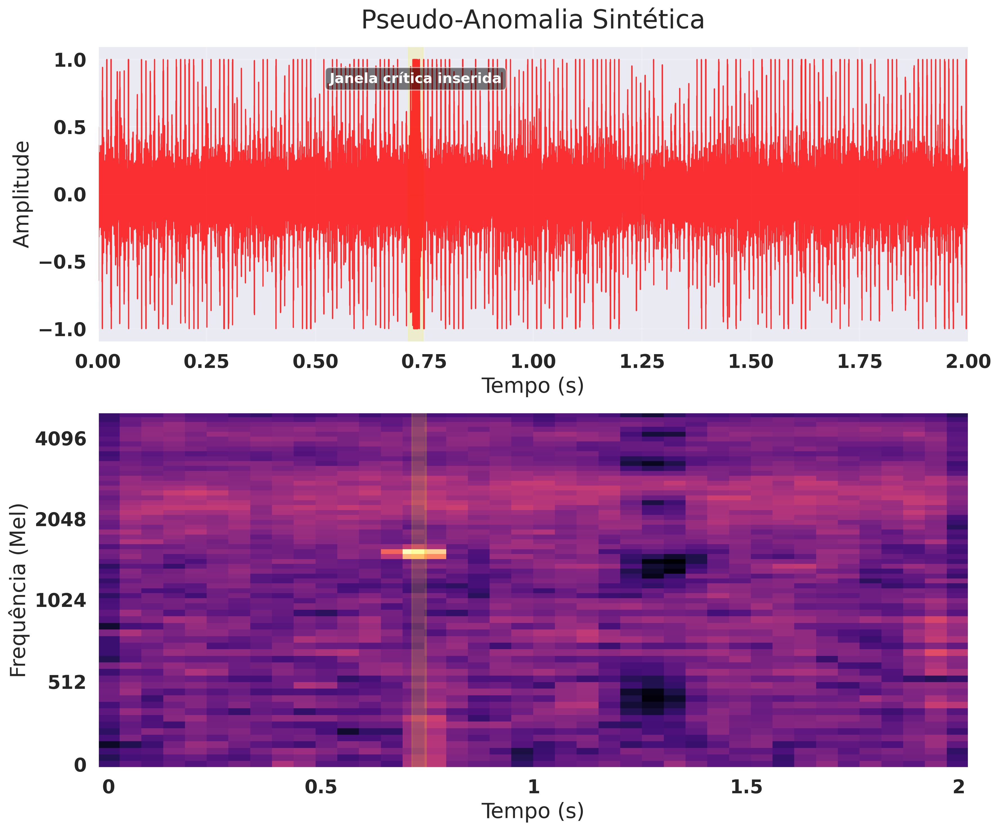

✅ Salvo: fig_mixup_2_pseudo.png


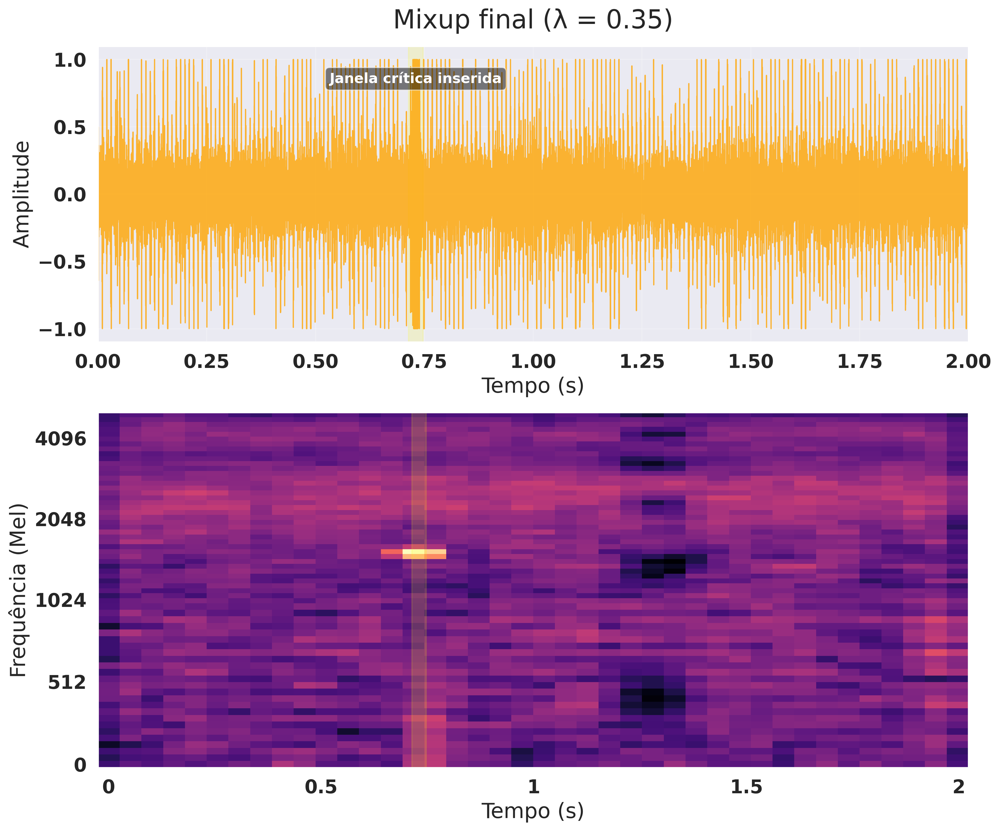

✅ Salvo: fig_mixup_3_final.png

🎉 Feito, Julio! Agora o gráfico normal também tem a marcação da janela.


In [61]:
# =========================================================
# 🖼️ GERADOR DE FIGURAS MIXUP | FIDELIDADE TOTAL AO ORIGINAL
# Papel: Salvar 3 arquivos com marcação de janela em TODOS
# =========================================================

print("🚀 Gerando figuras Mixup em alta resolução (com janela em todos)...")

# --- CONFIGURAÇÃO DE ESTILO JULIO ---
plt.rcParams['figure.dpi'] = 300
plt.rcParams['font.weight'] = 'bold'
F_TITLE, F_LABEL, F_TICKS = 22, 18, 16

# Lista para iterar e gerar os arquivos
configs = [
    (preview_base, "Normal de Referência", "fig_mixup_1_normal.png", "green"),
    (preview_pseudo, "Pseudo-Anomalia Sintética", "fig_mixup_2_pseudo.png", "red"),
    (preview_mixup, f"Mixup final (λ = {preview_lambda:.2f})", "fig_mixup_3_final.png", "orange")
]

for signal, title, filename, color in configs:
    fig, (ax_t, ax_m) = plt.subplots(2, 1, figsize=(12, 10), gridspec_kw={'height_ratios': [1, 1.2]})

    # 1. Gráfico de Amplitude (Tempo)
    t = np.linspace(0, 2.0, len(signal))
    ax_t.plot(t, signal, color=color, linewidth=1.0, alpha=0.8)
    ax_t.set_title(title, fontsize=F_TITLE, pad=15)
    ax_t.set_ylabel('Amplitude', fontsize=F_LABEL)
    ax_t.set_xlabel('Tempo (s)', fontsize=F_LABEL)
    ax_t.tick_params(labelsize=F_TICKS)
    ax_t.grid(True, alpha=0.2)
    ax_t.set_xlim(0, 2.0)

    # 2. Espectrograma de Mel
    S = librosa.feature.melspectrogram(y=signal, sr=SR_TARGET, n_fft=2048, hop_length=512, n_mels=64)
    S_db = librosa.power_to_db(S, ref=np.max)

    img = librosa.display.specshow(S_db, sr=SR_TARGET, hop_length=512, x_axis='time', y_axis='mel',
                                   ax=ax_m, cmap='magma')

    ax_m.set_ylabel('Frequência (Mel)', fontsize=F_LABEL)
    ax_m.set_xlabel('Tempo (s)', fontsize=F_LABEL)
    ax_m.tick_params(labelsize=F_TICKS)

    # --- MARCAÇÃO DA JANELA CRÍTICA (PRESENTE EM TODOS AGORA) ---
    ev_start = preview_meta['event_start_s']
    ev_end = preview_meta['event_end_s']

    # Linha amarela e área sombreada
    ax_t.axvspan(ev_start, ev_end, color='yellow', alpha=0.15)
    ax_m.axvspan(ev_start, ev_end, color='yellow', alpha=0.15)

    # Legenda da janela (caixinha preta com borda branca/amarela)
    # Colocamos no ax_t para ficar idêntico ao original
    ax_t.text((ev_start+ev_end)/2, ax_t.get_ylim()[1]*0.75, "Janela crítica inserida",
              color='white', ha='center', fontsize=12, fontweight='bold',
              bbox=dict(facecolor='black', alpha=0.5, boxstyle='round,pad=0.3', edgecolor='white'))

    plt.tight_layout()
    plt.savefig(filename, dpi=300, bbox_inches='tight')
    plt.show()
    print(f"✅ Salvo: {filename}")

print("\n🎉 Feito, Julio! Agora o gráfico normal também tem a marcação da janela.")

## Bloco 10.1 | Treinamento dos modelos com cuidado de memória

Esta subetapa foi mantida com foco em estabilidade operacional.

**Princípios adotados.**
- respeitar o limite de RAM da sessão;
- construir e liberar artefatos por etapa;
- evitar carregar mais representações do que o necessário ao mesmo tempo.


In [63]:
# =========================================================
# FINAL NOTEBOOK | Etapa 2 do benchmark
# Papel deste bloco:
# - treina os modelos
# - usa GPU quando disponível
# - gera o DataFrame comparativo final
# =========================================================
print(f"⚙️ Iniciando ETAPA 2: O Super Loop de Benchmarking (Treinando IAs para os {len(EXPERIMENT_TYPES)} Experimentos + DCASE Proxy)...")

# Reforço de contexto para permitir reexecução isolada do benchmarking.
import gc
import os
import time

import numpy as np
import pandas as pd
import scipy.stats as stats
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from sklearn.ensemble import IsolationForest
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve
from sklearn.mixture import GaussianMixture
from torch.utils.data import DataLoader, TensorDataset
from xgboost import XGBClassifier

CPU_THREADS = int(globals().get('CPU_THREADS', max(1, (os.cpu_count() or 2) - 1)))
BATCH_SIZE = int(globals().get('BATCH_SIZE', 16))
EPOCHS_GRU = int(globals().get('EPOCHS_GRU', 12))
EPOCHS_AST = int(globals().get('EPOCHS_AST', 12))
EMBED_POOL = int(globals().get('EMBED_POOL', 2))
THRESHOLD_TARGET_FPR = float(globals().get('THRESHOLD_TARGET_FPR', globals().get('MIXUP_TARGET_FPR', 0.10)))

required_symbols_etapa2 = ['EXPERIMENT_TYPES', 'experimentos_por_frente', 'front_dataset_cache', 'y_win']
missing_symbols_etapa2 = [name for name in required_symbols_etapa2 if name not in globals()]
if missing_symbols_etapa2:
    raise RuntimeError(
        'A ETAPA 2 depende da ETAPA 1 e das células anteriores de preparação. '
        f'Execute o notebook em ordem antes de rerodar o benchmarking. Faltando: {missing_symbols_etapa2}'
    )

MODELOS_SUPERVISIONADOS = {'XGBoost', 'GRU'}
MODELOS_FRENTE8 = {'Isolation Forest (Não-Sup.)', 'Mahalanobis (Não-Sup.)'}
MODELOS_FRENTE82 = {'LSTM-AE (Não-Sup.)'}
MODELOS_FRENTE83 = {'VAE (Não-Sup.)'}
MODELOS_NAO_SUPERVISIONADOS = {'GMM (Não-Sup.)', 'Tiny-AST', 'CNN + GMM (Não-Sup.)'} | MODELOS_FRENTE8 | MODELOS_FRENTE82 | MODELOS_FRENTE83


def get_best_device():
    runtime_info = globals().get('RUNTIME_DEVICE_INFO', {})
    preferred = str(runtime_info.get('device_type', 'cpu')).lower()
    if preferred == 'cuda' and torch.cuda.is_available():
        return torch.device("cuda")
    if preferred == 'mps' and hasattr(torch.backends, "mps") and torch.backends.mps.is_available():
        return torch.device("mps")
    if torch.cuda.is_available():
        return torch.device("cuda")
    if hasattr(torch.backends, "mps") and torch.backends.mps.is_available():
        return torch.device("mps")
    return torch.device("cpu")


def clear_runtime_memory():
    gc.collect()
    if torch.cuda.is_available():
        torch.cuda.empty_cache()
    if hasattr(torch, 'mps') and hasattr(torch.mps, 'empty_cache'):
        try:
            torch.mps.empty_cache()
        except Exception:
            pass


def build_xgb_classifier(use_gpu=False):
    params = {
        'n_estimators': 120,
        'max_depth': 4,
        'learning_rate': 0.08,
        'random_state': 42,
        'n_jobs': CPU_THREADS,
        'eval_metric': 'logloss',
    }
    if use_gpu:
        try:
            return XGBClassifier(**params, tree_method='hist', device='cuda')
        except TypeError:
            try:
                return XGBClassifier(**params, tree_method='gpu_hist', predictor='gpu_predictor')
            except TypeError:
                pass
    return XGBClassifier(**params, tree_method='hist')


def fit_xgb_with_runtime(X_train_array, y_train_array):
    prefer_gpu = bool(os.getenv('AAD_XGB_USE_GPU', '1').strip().lower() in {'1', 'true', 'yes', 'sim'}) and get_best_device().type == 'cuda'
    if prefer_gpu:
        try:
            model = build_xgb_classifier(use_gpu=True)
            model.fit(X_train_array, y_train_array)
            setattr(model, '_aad_runtime_label', 'CUDA')
            return model
        except Exception as exc:
            print(f"    -> XGBoost CUDA indisponível nesta sessão ({exc}). Recuando para CPU hist.")

    model = build_xgb_classifier(use_gpu=False)
    model.fit(X_train_array, y_train_array)
    setattr(model, '_aad_runtime_label', 'CPU')
    return model


def harmonic_mean_safe(values):
    values = np.asarray(values, dtype=np.float64)
    if values.size == 0 or np.any(values <= 0):
        return 0.0
    return float(len(values) / np.sum(1.0 / values))


def normalize_scores(scores):
    scores = np.asarray(scores, dtype=np.float32)
    if scores.size == 0:
        return np.asarray([], dtype=np.float32)
    score_min = float(np.min(scores))
    score_max = float(np.max(scores))
    if not np.isfinite(score_min) or not np.isfinite(score_max):
        return np.zeros_like(scores, dtype=np.float32)
    if abs(score_max - score_min) < 1e-9:
        return np.zeros_like(scores, dtype=np.float32)
    return ((scores - score_min) / (score_max - score_min + 1e-9)).astype(np.float32)


def calc_dcase_pauc(y_true, y_score, max_fpr=0.1):
    y_true = np.asarray(y_true, dtype=np.int64)
    y_score = np.asarray(y_score, dtype=np.float32)
    if y_true.size == 0 or len(np.unique(y_true)) < 2:
        return 0.0

    fpr, tpr, _ = roc_curve(y_true, y_score)
    if np.max(fpr) < max_fpr:
        fpr = np.append(fpr, max_fpr)
        tpr = np.append(tpr, tpr[-1])
    else:
        interp_tpr = float(np.interp(max_fpr, fpr, tpr))
        mask = fpr < max_fpr
        fpr = np.concatenate([fpr[mask], [max_fpr]])
        tpr = np.concatenate([tpr[mask], [interp_tpr]])

    area = np.trapz(tpr, fpr)
    return float(area / max_fpr)


def calc_metrics(y_true, y_pred, y_score=None):
    auc_input = np.asarray(y_score if y_score is not None else y_pred, dtype=np.float32)
    auc = roc_auc_score(y_true, auc_input) if len(np.unique(y_true)) > 1 else 0.0
    pauc = calc_dcase_pauc(y_true, auc_input, max_fpr=0.1)
    return {
        'Acurácia': accuracy_score(y_true, y_pred),
        'Precisão': precision_score(y_true, y_pred, zero_division=0),
        'Recall': recall_score(y_true, y_pred, zero_division=0),
        'F1-Score': f1_score(y_true, y_pred, zero_division=0),
        'AUC-ROC': auc,
        'pAUC@0.1': pauc,
        'Score DCASE Proxy': harmonic_mean_safe([max(auc, 1e-9), max(pauc, 1e-9)]),
    }


def predict_gru_batches(model, X_array, batch_size, device):
    preds, probs = [], []
    loader = DataLoader(TensorDataset(torch.from_numpy(X_array)), batch_size=batch_size, shuffle=False)
    model.eval()
    with torch.no_grad():
        for (batch_x,) in loader:
            logits = model(batch_x.to(device))
            prob = torch.softmax(logits, dim=1)[:, 1]
            preds.append(torch.argmax(logits, dim=1).cpu().numpy())
            probs.append(prob.cpu().numpy())
    return np.concatenate(preds), np.concatenate(probs)


def reconstruction_errors(model, X_array, batch_size, device):
    errs = []
    loader = DataLoader(TensorDataset(torch.from_numpy(X_array)), batch_size=batch_size, shuffle=False)
    model.eval()
    with torch.no_grad():
        for (batch_x,) in loader:
            batch_x = batch_x.to(device)
            recons = model(batch_x)
            batch_err = torch.mean((recons - batch_x) ** 2, dim=[1, 2, 3]).cpu().numpy()
            errs.append(batch_err)
    return np.concatenate(errs)


def extract_embeddings(model, X_array, batch_size, device, embed_pool):
    embeds = []
    loader = DataLoader(TensorDataset(torch.from_numpy(X_array)), batch_size=batch_size, shuffle=False)
    model.eval()
    with torch.no_grad():
        for (batch_x,) in loader:
            batch_x = batch_x.to(device)
            enc = model.conv_encoder(batch_x)
            enc = F.adaptive_avg_pool2d(enc, output_size=(embed_pool, embed_pool))
            embeds.append(enc.flatten(1).cpu().numpy().astype(np.float32))
    return np.concatenate(embeds, axis=0)




def front92_pick_subset(X_array, max_samples=None, seed=42):
    X_array = np.asarray(X_array, dtype=np.float32)
    if max_samples is None or max_samples <= 0 or len(X_array) <= max_samples:
        return X_array

    rng = np.random.default_rng(seed)
    chosen = np.sort(rng.choice(len(X_array), size=max_samples, replace=False))
    return np.ascontiguousarray(X_array[chosen], dtype=np.float32)


def maybe_apply_front92_transfer_init(model, verbose=False):
    if not FRONT92_ENABLE or not FRONT92_ENABLE_TRANSFER:
        setattr(model, '_front92_transfer', False)
        return model

    target_conv = None
    if hasattr(model, 'conv_encoder') and isinstance(model.conv_encoder, nn.Sequential):
        for layer in model.conv_encoder:
            if isinstance(layer, nn.Conv2d):
                target_conv = layer
                break
    if target_conv is None and hasattr(model, 'encoder') and isinstance(model.encoder, nn.Sequential):
        for layer in model.encoder:
            if isinstance(layer, nn.Conv2d):
                target_conv = layer
                break
    if target_conv is None:
        setattr(model, '_front92_transfer', False)
        return model

    try:
        from torchvision.models import resnet18, ResNet18_Weights

        backbone = resnet18(weights=ResNet18_Weights.DEFAULT)
        kernel = backbone.conv1.weight.detach().mean(dim=1, keepdim=True)
        kernel = F.interpolate(kernel, size=target_conv.weight.shape[-2:], mode='bilinear', align_corners=False)

        if kernel.shape[0] < target_conv.out_channels:
            repeat_factor = int(np.ceil(target_conv.out_channels / kernel.shape[0]))
            kernel = kernel.repeat(repeat_factor, 1, 1, 1)
        kernel = kernel[:target_conv.out_channels]

        with torch.no_grad():
            target_conv.weight.copy_(kernel.to(target_conv.weight.device, dtype=target_conv.weight.dtype))
            if target_conv.bias is not None:
                target_conv.bias.zero_()

        del backbone
        clear_runtime_memory()
        setattr(model, '_front92_transfer', True)
        if verbose:
            print(f"     -> Frente 9.2 | Transfer leve aplicado via {FRONT92_TRANSFER_SOURCE} na primeira convolução.")
    except Exception as exc:
        setattr(model, '_front92_transfer', False)
        if verbose:
            print(f"     -> Frente 9.2 | Transfer leve indisponível ({exc}). Seguindo sem transfer.")

    return model


def apply_front92_image_augmentation(batch_x, aug_prob=None):
    if not FRONT92_ENABLE or not FRONT92_ENABLE_SPECAUG:
        return batch_x

    batch_x = batch_x.clone()
    aug_prob = FRONT92_AUG_PROB if aug_prob is None else float(aug_prob)
    batch_size = int(batch_x.shape[0])

    if FRONT92_GAIN_JITTER > 0:
        gain = 1.0 + ((torch.rand(batch_size, 1, 1, 1, device=batch_x.device) - 0.5) * 2.0 * FRONT92_GAIN_JITTER)
        mask_gain = (torch.rand(batch_size, 1, 1, 1, device=batch_x.device) < aug_prob).float()
        batch_x = batch_x * (1.0 + mask_gain * (gain - 1.0))

    for i in range(batch_size):
        if torch.rand((), device=batch_x.device) >= aug_prob:
            continue

        fill_value = batch_x[i].mean()

        if FRONT92_MAX_SHIFT > 0:
            shift = int(torch.randint(-FRONT92_MAX_SHIFT, FRONT92_MAX_SHIFT + 1, (1,), device=batch_x.device).item())
            if shift != 0:
                batch_x[i] = torch.roll(batch_x[i], shifts=shift, dims=-1)

        for _ in range(max(0, FRONT92_TIME_MASKS)):
            if FRONT92_MAX_TIME_BINS <= 0:
                break
            width = int(torch.randint(0, FRONT92_MAX_TIME_BINS + 1, (1,), device=batch_x.device).item())
            if width <= 0 or width >= batch_x.shape[-1]:
                continue
            start = int(torch.randint(0, max(1, batch_x.shape[-1] - width + 1), (1,), device=batch_x.device).item())
            batch_x[i, :, :, start:start + width] = fill_value

        for _ in range(max(0, FRONT92_FREQ_MASKS)):
            if FRONT92_MAX_FREQ_BINS <= 0:
                break
            width = int(torch.randint(0, FRONT92_MAX_FREQ_BINS + 1, (1,), device=batch_x.device).item())
            if width <= 0 or width >= batch_x.shape[-2]:
                continue
            start = int(torch.randint(0, max(1, batch_x.shape[-2] - width + 1), (1,), device=batch_x.device).item())
            batch_x[i, :, start:start + width, :] = fill_value

    return batch_x


def apply_front92_sequence_augmentation(batch_x, aug_prob=None):
    if not FRONT92_ENABLE or not FRONT92_ENABLE_SPECAUG:
        return batch_x

    batch_x = batch_x.clone()
    aug_prob = FRONT92_AUG_PROB if aug_prob is None else float(aug_prob)
    batch_size = int(batch_x.shape[0])

    if FRONT92_GAIN_JITTER > 0:
        gain = 1.0 + ((torch.rand(batch_size, 1, 1, device=batch_x.device) - 0.5) * 2.0 * FRONT92_GAIN_JITTER)
        mask_gain = (torch.rand(batch_size, 1, 1, device=batch_x.device) < aug_prob).float()
        batch_x = batch_x * (1.0 + mask_gain * (gain - 1.0))

    for i in range(batch_size):
        if torch.rand((), device=batch_x.device) >= aug_prob:
            continue

        fill_value = batch_x[i].mean()

        if FRONT92_MAX_SHIFT > 0:
            shift = int(torch.randint(-FRONT92_MAX_SHIFT, FRONT92_MAX_SHIFT + 1, (1,), device=batch_x.device).item())
            if shift != 0:
                batch_x[i] = torch.roll(batch_x[i], shifts=shift, dims=0)

        for _ in range(max(0, FRONT92_TIME_MASKS)):
            if FRONT92_MAX_TIME_BINS <= 0:
                break
            width = int(torch.randint(0, FRONT92_MAX_TIME_BINS + 1, (1,), device=batch_x.device).item())
            if width <= 0 or width >= batch_x.shape[1]:
                continue
            start = int(torch.randint(0, max(1, batch_x.shape[1] - width + 1), (1,), device=batch_x.device).item())
            batch_x[i, start:start + width, :] = fill_value

        for _ in range(max(0, FRONT92_FREQ_MASKS)):
            if FRONT92_MAX_FREQ_BINS <= 0:
                break
            width = int(torch.randint(0, FRONT92_MAX_FREQ_BINS + 1, (1,), device=batch_x.device).item())
            if width <= 0 or width >= batch_x.shape[2]:
                continue
            start = int(torch.randint(0, max(1, batch_x.shape[2] - width + 1), (1,), device=batch_x.device).item())
            batch_x[i, :, start:start + width] = fill_value

    return batch_x


def maybe_front92_pretrain_image_model(model, X_norm, batch_size, device, lr, weight_decay, beta=0.002):
    model = maybe_apply_front92_transfer_init(model, verbose=False)
    transfer_used = bool(getattr(model, '_front92_transfer', False))

    if not FRONT92_ENABLE_PRETRAIN or not FRONT92_ENABLE or FRONT92_PRETRAIN_EPOCHS <= 0 or len(X_norm) == 0:
        setattr(model, '_front92_pretrained', False)
        setattr(model, '_front92_transfer', transfer_used)
        return model

    subset = front92_pick_subset(X_norm, max_samples=FRONT92_PRETRAIN_MAX_SAMPLES, seed=FRONT92_SEED + 11)
    loader = DataLoader(TensorDataset(torch.from_numpy(subset)), batch_size=batch_size, shuffle=True)
    opt = optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)

    model.train()
    for _ in range(FRONT92_PRETRAIN_EPOCHS):
        for (batch_x,) in loader:
            batch_clean = batch_x.to(device)
            batch_aug = apply_front92_image_augmentation(batch_clean)
            opt.zero_grad()

            if isinstance(model, ConvVAE):
                recons, mu, logvar = model(batch_aug)
                recon_loss = F.mse_loss(recons, batch_clean, reduction='mean')
                kl_loss = -0.5 * torch.mean(1 + logvar - mu.pow(2) - logvar.exp())
                loss = recon_loss + (max(float(beta), 1e-6) * 0.5 * kl_loss)
            else:
                recons = model(batch_aug)
                loss = F.mse_loss(recons, batch_clean, reduction='mean')

            loss.backward()
            opt.step()

    setattr(model, '_front92_pretrained', True)
    setattr(model, '_front92_transfer', transfer_used)
    return model


def maybe_front92_pretrain_sequence_model(model, X_norm, batch_size, device, lr, weight_decay):
    if not FRONT92_ENABLE_PRETRAIN or not FRONT92_ENABLE or FRONT92_PRETRAIN_EPOCHS <= 0 or len(X_norm) == 0:
        setattr(model, '_front92_pretrained', False)
        setattr(model, '_front92_transfer', False)
        return model

    subset = front92_pick_subset(X_norm, max_samples=FRONT92_PRETRAIN_MAX_SAMPLES, seed=FRONT92_SEED + 21)
    loader = DataLoader(TensorDataset(torch.from_numpy(subset)), batch_size=batch_size, shuffle=True)
    opt = optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)
    crit = nn.MSELoss()

    model.train()
    for _ in range(FRONT92_PRETRAIN_EPOCHS):
        for (batch_x,) in loader:
            batch_clean = batch_x.to(device)
            batch_aug = apply_front92_sequence_augmentation(batch_clean)
            opt.zero_grad()
            recons = model(batch_aug)
            loss = crit(recons, batch_clean)
            loss.backward()
            opt.step()

    setattr(model, '_front92_pretrained', True)
    setattr(model, '_front92_transfer', False)
    return model





def front92_pick_subset(X_array, max_samples=None, seed=42):
    X_array = np.asarray(X_array, dtype=np.float32)
    if max_samples is None or max_samples <= 0 or len(X_array) <= max_samples:
        return X_array

    rng = np.random.default_rng(seed)
    chosen = np.sort(rng.choice(len(X_array), size=max_samples, replace=False))
    return np.ascontiguousarray(X_array[chosen], dtype=np.float32)


def maybe_apply_front92_transfer_init(model, verbose=False):
    if not FRONT92_ENABLE or not FRONT92_ENABLE_TRANSFER:
        setattr(model, '_front92_transfer', False)
        return model

    target_conv = None
    if hasattr(model, 'conv_encoder') and isinstance(model.conv_encoder, nn.Sequential):
        for layer in model.conv_encoder:
            if isinstance(layer, nn.Conv2d):
                target_conv = layer
                break
    if target_conv is None and hasattr(model, 'encoder') and isinstance(model.encoder, nn.Sequential):
        for layer in model.encoder:
            if isinstance(layer, nn.Conv2d):
                target_conv = layer
                break
    if target_conv is None:
        setattr(model, '_front92_transfer', False)
        return model

    try:
        from torchvision.models import resnet18, ResNet18_Weights

        backbone = resnet18(weights=ResNet18_Weights.DEFAULT)
        kernel = backbone.conv1.weight.detach().mean(dim=1, keepdim=True)
        kernel = F.interpolate(kernel, size=target_conv.weight.shape[-2:], mode='bilinear', align_corners=False)

        if kernel.shape[0] < target_conv.out_channels:
            repeat_factor = int(np.ceil(target_conv.out_channels / kernel.shape[0]))
            kernel = kernel.repeat(repeat_factor, 1, 1, 1)
        kernel = kernel[:target_conv.out_channels]

        with torch.no_grad():
            target_conv.weight.copy_(kernel.to(target_conv.weight.device, dtype=target_conv.weight.dtype))
            if target_conv.bias is not None:
                target_conv.bias.zero_()

        del backbone
        clear_runtime_memory()
        setattr(model, '_front92_transfer', True)
        if verbose:
            print(f"     -> Frente 9.2 | Transfer leve aplicado via {FRONT92_TRANSFER_SOURCE} na primeira convolução.")
    except Exception as exc:
        setattr(model, '_front92_transfer', False)
        if verbose:
            print(f"     -> Frente 9.2 | Transfer leve indisponível ({exc}). Seguindo sem transfer.")

    return model


def apply_front92_image_augmentation(batch_x, aug_prob=None):
    if not FRONT92_ENABLE or not FRONT92_ENABLE_SPECAUG:
        return batch_x

    batch_x = batch_x.clone()
    aug_prob = FRONT92_AUG_PROB if aug_prob is None else float(aug_prob)
    batch_size = int(batch_x.shape[0])

    if FRONT92_GAIN_JITTER > 0:
        gain = 1.0 + ((torch.rand(batch_size, 1, 1, 1, device=batch_x.device) - 0.5) * 2.0 * FRONT92_GAIN_JITTER)
        mask_gain = (torch.rand(batch_size, 1, 1, 1, device=batch_x.device) < aug_prob).float()
        batch_x = batch_x * (1.0 + mask_gain * (gain - 1.0))

    for i in range(batch_size):
        if torch.rand((), device=batch_x.device) >= aug_prob:
            continue

        fill_value = batch_x[i].mean()

        if FRONT92_MAX_SHIFT > 0:
            shift = int(torch.randint(-FRONT92_MAX_SHIFT, FRONT92_MAX_SHIFT + 1, (1,), device=batch_x.device).item())
            if shift != 0:
                batch_x[i] = torch.roll(batch_x[i], shifts=shift, dims=-1)

        for _ in range(max(0, FRONT92_TIME_MASKS)):
            if FRONT92_MAX_TIME_BINS <= 0:
                break
            width = int(torch.randint(0, FRONT92_MAX_TIME_BINS + 1, (1,), device=batch_x.device).item())
            if width <= 0 or width >= batch_x.shape[-1]:
                continue
            start = int(torch.randint(0, max(1, batch_x.shape[-1] - width + 1), (1,), device=batch_x.device).item())
            batch_x[i, :, :, start:start + width] = fill_value

        for _ in range(max(0, FRONT92_FREQ_MASKS)):
            if FRONT92_MAX_FREQ_BINS <= 0:
                break
            width = int(torch.randint(0, FRONT92_MAX_FREQ_BINS + 1, (1,), device=batch_x.device).item())
            if width <= 0 or width >= batch_x.shape[-2]:
                continue
            start = int(torch.randint(0, max(1, batch_x.shape[-2] - width + 1), (1,), device=batch_x.device).item())
            batch_x[i, :, start:start + width, :] = fill_value

    return batch_x


def apply_front92_sequence_augmentation(batch_x, aug_prob=None):
    if not FRONT92_ENABLE or not FRONT92_ENABLE_SPECAUG:
        return batch_x

    batch_x = batch_x.clone()
    aug_prob = FRONT92_AUG_PROB if aug_prob is None else float(aug_prob)
    batch_size = int(batch_x.shape[0])

    if FRONT92_GAIN_JITTER > 0:
        gain = 1.0 + ((torch.rand(batch_size, 1, 1, device=batch_x.device) - 0.5) * 2.0 * FRONT92_GAIN_JITTER)
        mask_gain = (torch.rand(batch_size, 1, 1, device=batch_x.device) < aug_prob).float()
        batch_x = batch_x * (1.0 + mask_gain * (gain - 1.0))

    for i in range(batch_size):
        if torch.rand((), device=batch_x.device) >= aug_prob:
            continue

        fill_value = batch_x[i].mean()

        if FRONT92_MAX_SHIFT > 0:
            shift = int(torch.randint(-FRONT92_MAX_SHIFT, FRONT92_MAX_SHIFT + 1, (1,), device=batch_x.device).item())
            if shift != 0:
                batch_x[i] = torch.roll(batch_x[i], shifts=shift, dims=0)

        for _ in range(max(0, FRONT92_TIME_MASKS)):
            if FRONT92_MAX_TIME_BINS <= 0:
                break
            width = int(torch.randint(0, FRONT92_MAX_TIME_BINS + 1, (1,), device=batch_x.device).item())
            if width <= 0 or width >= batch_x.shape[1]:
                continue
            start = int(torch.randint(0, max(1, batch_x.shape[1] - width + 1), (1,), device=batch_x.device).item())
            batch_x[i, start:start + width, :] = fill_value

        for _ in range(max(0, FRONT92_FREQ_MASKS)):
            if FRONT92_MAX_FREQ_BINS <= 0:
                break
            width = int(torch.randint(0, FRONT92_MAX_FREQ_BINS + 1, (1,), device=batch_x.device).item())
            if width <= 0 or width >= batch_x.shape[2]:
                continue
            start = int(torch.randint(0, max(1, batch_x.shape[2] - width + 1), (1,), device=batch_x.device).item())
            batch_x[i, :, start:start + width] = fill_value

    return batch_x


def maybe_front92_pretrain_image_model(model, X_norm, batch_size, device, lr, weight_decay, beta=0.002):
    model = maybe_apply_front92_transfer_init(model, verbose=False)
    transfer_used = bool(getattr(model, '_front92_transfer', False))

    if not FRONT92_ENABLE_PRETRAIN or not FRONT92_ENABLE or FRONT92_PRETRAIN_EPOCHS <= 0 or len(X_norm) == 0:
        setattr(model, '_front92_pretrained', False)
        setattr(model, '_front92_transfer', transfer_used)
        return model

    subset = front92_pick_subset(X_norm, max_samples=FRONT92_PRETRAIN_MAX_SAMPLES, seed=FRONT92_SEED + 11)
    loader = DataLoader(TensorDataset(torch.from_numpy(subset)), batch_size=batch_size, shuffle=True)
    opt = optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)

    model.train()
    for _ in range(FRONT92_PRETRAIN_EPOCHS):
        for (batch_x,) in loader:
            batch_clean = batch_x.to(device)
            batch_aug = apply_front92_image_augmentation(batch_clean)
            opt.zero_grad()

            if isinstance(model, ConvVAE):
                recons, mu, logvar = model(batch_aug)
                recon_loss = F.mse_loss(recons, batch_clean, reduction='mean')
                kl_loss = -0.5 * torch.mean(1 + logvar - mu.pow(2) - logvar.exp())
                loss = recon_loss + (max(float(beta), 1e-6) * 0.5 * kl_loss)
            else:
                recons = model(batch_aug)
                loss = F.mse_loss(recons, batch_clean, reduction='mean')

            loss.backward()
            opt.step()

    setattr(model, '_front92_pretrained', True)
    setattr(model, '_front92_transfer', transfer_used)
    return model


def maybe_front92_pretrain_sequence_model(model, X_norm, batch_size, device, lr, weight_decay):
    if not FRONT92_ENABLE_PRETRAIN or not FRONT92_ENABLE or FRONT92_PRETRAIN_EPOCHS <= 0 or len(X_norm) == 0:
        setattr(model, '_front92_pretrained', False)
        setattr(model, '_front92_transfer', False)
        return model

    subset = front92_pick_subset(X_norm, max_samples=FRONT92_PRETRAIN_MAX_SAMPLES, seed=FRONT92_SEED + 21)
    loader = DataLoader(TensorDataset(torch.from_numpy(subset)), batch_size=batch_size, shuffle=True)
    opt = optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)
    crit = nn.MSELoss()

    model.train()
    for _ in range(FRONT92_PRETRAIN_EPOCHS):
        for (batch_x,) in loader:
            batch_clean = batch_x.to(device)
            batch_aug = apply_front92_sequence_augmentation(batch_clean)
            opt.zero_grad()
            recons = model(batch_aug)
            loss = crit(recons, batch_clean)
            loss.backward()
            opt.step()

    setattr(model, '_front92_pretrained', True)
    setattr(model, '_front92_transfer', False)
    return model





def front92_pick_subset(X_array, max_samples=None, seed=42):
    X_array = np.asarray(X_array, dtype=np.float32)
    if max_samples is None or max_samples <= 0 or len(X_array) <= max_samples:
        return X_array

    rng = np.random.default_rng(seed)
    chosen = np.sort(rng.choice(len(X_array), size=max_samples, replace=False))
    return np.ascontiguousarray(X_array[chosen], dtype=np.float32)


def maybe_apply_front92_transfer_init(model, verbose=False):
    if not FRONT92_ENABLE or not FRONT92_ENABLE_TRANSFER:
        setattr(model, '_front92_transfer', False)
        return model

    target_conv = None
    if hasattr(model, 'conv_encoder') and isinstance(model.conv_encoder, nn.Sequential):
        for layer in model.conv_encoder:
            if isinstance(layer, nn.Conv2d):
                target_conv = layer
                break
    if target_conv is None and hasattr(model, 'encoder') and isinstance(model.encoder, nn.Sequential):
        for layer in model.encoder:
            if isinstance(layer, nn.Conv2d):
                target_conv = layer
                break
    if target_conv is None:
        setattr(model, '_front92_transfer', False)
        return model

    try:
        from torchvision.models import resnet18, ResNet18_Weights

        backbone = resnet18(weights=ResNet18_Weights.DEFAULT)
        kernel = backbone.conv1.weight.detach().mean(dim=1, keepdim=True)
        kernel = F.interpolate(kernel, size=target_conv.weight.shape[-2:], mode='bilinear', align_corners=False)

        if kernel.shape[0] < target_conv.out_channels:
            repeat_factor = int(np.ceil(target_conv.out_channels / kernel.shape[0]))
            kernel = kernel.repeat(repeat_factor, 1, 1, 1)
        kernel = kernel[:target_conv.out_channels]

        with torch.no_grad():
            target_conv.weight.copy_(kernel.to(target_conv.weight.device, dtype=target_conv.weight.dtype))
            if target_conv.bias is not None:
                target_conv.bias.zero_()

        del backbone
        clear_runtime_memory()
        setattr(model, '_front92_transfer', True)
        if verbose:
            print(f"     -> Frente 9.2 | Transfer leve aplicado via {FRONT92_TRANSFER_SOURCE} na primeira convolução.")
    except Exception as exc:
        setattr(model, '_front92_transfer', False)
        if verbose:
            print(f"     -> Frente 9.2 | Transfer leve indisponível ({exc}). Seguindo sem transfer.")

    return model


def apply_front92_image_augmentation(batch_x, aug_prob=None):
    if not FRONT92_ENABLE or not FRONT92_ENABLE_SPECAUG:
        return batch_x

    batch_x = batch_x.clone()
    aug_prob = FRONT92_AUG_PROB if aug_prob is None else float(aug_prob)
    batch_size = int(batch_x.shape[0])

    if FRONT92_GAIN_JITTER > 0:
        gain = 1.0 + ((torch.rand(batch_size, 1, 1, 1, device=batch_x.device) - 0.5) * 2.0 * FRONT92_GAIN_JITTER)
        mask_gain = (torch.rand(batch_size, 1, 1, 1, device=batch_x.device) < aug_prob).float()
        batch_x = batch_x * (1.0 + mask_gain * (gain - 1.0))

    for i in range(batch_size):
        if torch.rand((), device=batch_x.device) >= aug_prob:
            continue

        fill_value = batch_x[i].mean()

        if FRONT92_MAX_SHIFT > 0:
            shift = int(torch.randint(-FRONT92_MAX_SHIFT, FRONT92_MAX_SHIFT + 1, (1,), device=batch_x.device).item())
            if shift != 0:
                batch_x[i] = torch.roll(batch_x[i], shifts=shift, dims=-1)

        for _ in range(max(0, FRONT92_TIME_MASKS)):
            if FRONT92_MAX_TIME_BINS <= 0:
                break
            width = int(torch.randint(0, FRONT92_MAX_TIME_BINS + 1, (1,), device=batch_x.device).item())
            if width <= 0 or width >= batch_x.shape[-1]:
                continue
            start = int(torch.randint(0, max(1, batch_x.shape[-1] - width + 1), (1,), device=batch_x.device).item())
            batch_x[i, :, :, start:start + width] = fill_value

        for _ in range(max(0, FRONT92_FREQ_MASKS)):
            if FRONT92_MAX_FREQ_BINS <= 0:
                break
            width = int(torch.randint(0, FRONT92_MAX_FREQ_BINS + 1, (1,), device=batch_x.device).item())
            if width <= 0 or width >= batch_x.shape[-2]:
                continue
            start = int(torch.randint(0, max(1, batch_x.shape[-2] - width + 1), (1,), device=batch_x.device).item())
            batch_x[i, :, start:start + width, :] = fill_value

    return batch_x


def apply_front92_sequence_augmentation(batch_x, aug_prob=None):
    if not FRONT92_ENABLE or not FRONT92_ENABLE_SPECAUG:
        return batch_x

    batch_x = batch_x.clone()
    aug_prob = FRONT92_AUG_PROB if aug_prob is None else float(aug_prob)
    batch_size = int(batch_x.shape[0])

    if FRONT92_GAIN_JITTER > 0:
        gain = 1.0 + ((torch.rand(batch_size, 1, 1, device=batch_x.device) - 0.5) * 2.0 * FRONT92_GAIN_JITTER)
        mask_gain = (torch.rand(batch_size, 1, 1, device=batch_x.device) < aug_prob).float()
        batch_x = batch_x * (1.0 + mask_gain * (gain - 1.0))

    for i in range(batch_size):
        if torch.rand((), device=batch_x.device) >= aug_prob:
            continue

        fill_value = batch_x[i].mean()

        if FRONT92_MAX_SHIFT > 0:
            shift = int(torch.randint(-FRONT92_MAX_SHIFT, FRONT92_MAX_SHIFT + 1, (1,), device=batch_x.device).item())
            if shift != 0:
                batch_x[i] = torch.roll(batch_x[i], shifts=shift, dims=0)

        for _ in range(max(0, FRONT92_TIME_MASKS)):
            if FRONT92_MAX_TIME_BINS <= 0:
                break
            width = int(torch.randint(0, FRONT92_MAX_TIME_BINS + 1, (1,), device=batch_x.device).item())
            if width <= 0 or width >= batch_x.shape[1]:
                continue
            start = int(torch.randint(0, max(1, batch_x.shape[1] - width + 1), (1,), device=batch_x.device).item())
            batch_x[i, start:start + width, :] = fill_value

        for _ in range(max(0, FRONT92_FREQ_MASKS)):
            if FRONT92_MAX_FREQ_BINS <= 0:
                break
            width = int(torch.randint(0, FRONT92_MAX_FREQ_BINS + 1, (1,), device=batch_x.device).item())
            if width <= 0 or width >= batch_x.shape[2]:
                continue
            start = int(torch.randint(0, max(1, batch_x.shape[2] - width + 1), (1,), device=batch_x.device).item())
            batch_x[i, :, start:start + width] = fill_value

    return batch_x


def maybe_front92_pretrain_image_model(model, X_norm, batch_size, device, lr, weight_decay, beta=0.002):
    model = maybe_apply_front92_transfer_init(model, verbose=False)
    transfer_used = bool(getattr(model, '_front92_transfer', False))

    if not FRONT92_ENABLE_PRETRAIN or not FRONT92_ENABLE or FRONT92_PRETRAIN_EPOCHS <= 0 or len(X_norm) == 0:
        setattr(model, '_front92_pretrained', False)
        setattr(model, '_front92_transfer', transfer_used)
        return model

    subset = front92_pick_subset(X_norm, max_samples=FRONT92_PRETRAIN_MAX_SAMPLES, seed=FRONT92_SEED + 11)
    loader = DataLoader(TensorDataset(torch.from_numpy(subset)), batch_size=batch_size, shuffle=True)
    opt = optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)

    model.train()
    for _ in range(FRONT92_PRETRAIN_EPOCHS):
        for (batch_x,) in loader:
            batch_clean = batch_x.to(device)
            batch_aug = apply_front92_image_augmentation(batch_clean)
            opt.zero_grad()

            if isinstance(model, ConvVAE):
                recons, mu, logvar = model(batch_aug)
                recon_loss = F.mse_loss(recons, batch_clean, reduction='mean')
                kl_loss = -0.5 * torch.mean(1 + logvar - mu.pow(2) - logvar.exp())
                loss = recon_loss + (max(float(beta), 1e-6) * 0.5 * kl_loss)
            else:
                recons = model(batch_aug)
                loss = F.mse_loss(recons, batch_clean, reduction='mean')

            loss.backward()
            opt.step()

    setattr(model, '_front92_pretrained', True)
    setattr(model, '_front92_transfer', transfer_used)
    return model


def maybe_front92_pretrain_sequence_model(model, X_norm, batch_size, device, lr, weight_decay):
    if not FRONT92_ENABLE_PRETRAIN or not FRONT92_ENABLE or FRONT92_PRETRAIN_EPOCHS <= 0 or len(X_norm) == 0:
        setattr(model, '_front92_pretrained', False)
        setattr(model, '_front92_transfer', False)
        return model

    subset = front92_pick_subset(X_norm, max_samples=FRONT92_PRETRAIN_MAX_SAMPLES, seed=FRONT92_SEED + 21)
    loader = DataLoader(TensorDataset(torch.from_numpy(subset)), batch_size=batch_size, shuffle=True)
    opt = optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)
    crit = nn.MSELoss()

    model.train()
    for _ in range(FRONT92_PRETRAIN_EPOCHS):
        for (batch_x,) in loader:
            batch_clean = batch_x.to(device)
            batch_aug = apply_front92_sequence_augmentation(batch_clean)
            opt.zero_grad()
            recons = model(batch_aug)
            loss = crit(recons, batch_clean)
            loss.backward()
            opt.step()

    setattr(model, '_front92_pretrained', True)
    setattr(model, '_front92_transfer', False)
    return model



def train_tinyast_autoencoder(
    model,
    X_norm,
    X_oe_real=None,
    batch_size=32,
    epochs=12,
    device=None,
    lr=0.001,
    weight_decay=1e-4,
    oe_weight=0.0,
    oe_margin=0.08,
):
    if device is None:
        device = torch.device('cpu')

    model = maybe_front92_pretrain_image_model(
        model,
        X_norm,
        batch_size=batch_size,
        device=device,
        lr=lr,
        weight_decay=weight_decay,
        beta=0.002,
    )

    opt = optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)
    crit = nn.MSELoss()
    loader_norm = DataLoader(TensorDataset(torch.from_numpy(X_norm)), batch_size=batch_size, shuffle=True)

    use_oe = X_oe_real is not None and len(X_oe_real) > 0 and oe_weight > 0
    loader_oe = None
    if use_oe:
        loader_oe = DataLoader(TensorDataset(torch.from_numpy(X_oe_real)), batch_size=batch_size, shuffle=True)

    model.train()
    for _ in range(epochs):
        oe_iter = iter(loader_oe) if loader_oe is not None else None
        for (batch_x,) in loader_norm:
            batch_clean = batch_x.to(device)
            batch_input = apply_front92_image_augmentation(batch_clean)
            opt.zero_grad()
            recons = model(batch_input)
            loss = crit(recons, batch_clean)

            if oe_iter is not None:
                try:
                    (oe_batch,) = next(oe_iter)
                except StopIteration:
                    oe_iter = iter(loader_oe)
                    (oe_batch,) = next(oe_iter)

                oe_batch = oe_batch.to(device)
                oe_recons = model(oe_batch)
                oe_err = torch.mean((oe_recons - oe_batch) ** 2, dim=[1, 2, 3])
                loss = loss + (oe_weight * torch.relu(oe_margin - oe_err).mean())

            loss.backward()
            opt.step()

    return model

def reconstruction_errors_lstm(model, X_array, batch_size, device):
    errs = []
    loader = DataLoader(TensorDataset(torch.from_numpy(X_array)), batch_size=batch_size, shuffle=False)
    model.eval()
    with torch.no_grad():
        for (batch_x,) in loader:
            batch_x = batch_x.to(device)
            recons = model(batch_x)
            batch_err = torch.mean((recons - batch_x) ** 2, dim=[1, 2]).cpu().numpy()
            errs.append(batch_err)
    return np.concatenate(errs)





def train_lstm_autoencoder(
    model,
    X_norm,
    X_oe_real=None,
    batch_size=32,
    epochs=8,
    device=None,
    lr=0.001,
    weight_decay=1e-4,
    oe_weight=0.0,
    oe_margin=0.08,
):
    if device is None:
        device = torch.device('cpu')

    model = maybe_front92_pretrain_sequence_model(
        model,
        X_norm,
        batch_size=batch_size,
        device=device,
        lr=lr,
        weight_decay=weight_decay,
    )

    opt = optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)
    crit = nn.MSELoss()
    loader_norm = DataLoader(TensorDataset(torch.from_numpy(X_norm)), batch_size=batch_size, shuffle=True)

    use_oe = X_oe_real is not None and len(X_oe_real) > 0 and oe_weight > 0
    loader_oe = None
    if use_oe:
        loader_oe = DataLoader(TensorDataset(torch.from_numpy(X_oe_real)), batch_size=batch_size, shuffle=True)

    model.train()
    for _ in range(epochs):
        oe_iter = iter(loader_oe) if loader_oe is not None else None
        for (batch_x,) in loader_norm:
            batch_clean = batch_x.to(device)
            batch_input = apply_front92_sequence_augmentation(batch_clean)
            opt.zero_grad()
            recons = model(batch_input)
            loss = crit(recons, batch_clean)

            if oe_iter is not None:
                try:
                    (oe_batch,) = next(oe_iter)
                except StopIteration:
                    oe_iter = iter(loader_oe)
                    (oe_batch,) = next(oe_iter)

                oe_batch = oe_batch.to(device)
                oe_recons = model(oe_batch)
                oe_err = torch.mean((oe_recons - oe_batch) ** 2, dim=[1, 2])
                loss = loss + (oe_weight * torch.relu(oe_margin - oe_err).mean())

            loss.backward()
            opt.step()

    return model

def reconstruction_errors_vae(model, X_array, batch_size, device):
    errs = []
    loader = DataLoader(TensorDataset(torch.from_numpy(X_array)), batch_size=batch_size, shuffle=False)
    model.eval()
    with torch.no_grad():
        for (batch_x,) in loader:
            batch_x = batch_x.to(device)
            recons, _, _ = model(batch_x, deterministic=True)
            batch_err = torch.mean((recons - batch_x) ** 2, dim=[1, 2, 3]).cpu().numpy()
            errs.append(batch_err)
    return np.concatenate(errs)





def train_vae_autoencoder(
    model,
    X_norm,
    X_oe_real=None,
    batch_size=32,
    epochs=6,
    device=None,
    lr=0.001,
    weight_decay=1e-4,
    beta=0.002,
    oe_weight=0.0,
    oe_margin=0.08,
):
    if device is None:
        device = torch.device('cpu')

    model = maybe_front92_pretrain_image_model(
        model,
        X_norm,
        batch_size=batch_size,
        device=device,
        lr=lr,
        weight_decay=weight_decay,
        beta=beta,
    )

    opt = optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)
    loader_norm = DataLoader(TensorDataset(torch.from_numpy(X_norm)), batch_size=batch_size, shuffle=True)

    use_oe = X_oe_real is not None and len(X_oe_real) > 0 and oe_weight > 0
    loader_oe = None
    if use_oe:
        loader_oe = DataLoader(TensorDataset(torch.from_numpy(X_oe_real)), batch_size=batch_size, shuffle=True)

    model.train()
    for _ in range(epochs):
        oe_iter = iter(loader_oe) if loader_oe is not None else None
        for (batch_x,) in loader_norm:
            batch_clean = batch_x.to(device)
            batch_input = apply_front92_image_augmentation(batch_clean)
            opt.zero_grad()
            recons, mu, logvar = model(batch_input)
            recon_loss = F.mse_loss(recons, batch_clean, reduction='mean')
            kl_loss = -0.5 * torch.mean(1 + logvar - mu.pow(2) - logvar.exp())
            loss = recon_loss + (beta * kl_loss)

            if oe_iter is not None:
                try:
                    (oe_batch,) = next(oe_iter)
                except StopIteration:
                    oe_iter = iter(loader_oe)
                    (oe_batch,) = next(oe_iter)

                oe_batch = oe_batch.to(device)
                oe_recons, _, _ = model(oe_batch)
                oe_err = torch.mean((oe_recons - oe_batch) ** 2, dim=[1, 2, 3])
                loss = loss + (oe_weight * torch.relu(oe_margin - oe_err).mean())

            loss.backward()
            opt.step()

    return model

def merge_auxiliary_exposure_scores(*score_sources):
    arrays = []
    labels = []
    for label, values in score_sources:
        values = np.asarray(values if values is not None else [], dtype=np.float32)
        if values.size > 0:
            arrays.append(values)
            labels.append(label)

    if len(arrays) == 0:
        return np.empty((0,), dtype=np.float32), ''
    return np.concatenate(arrays, axis=0), '+'.join(labels)


def fit_mahalanobis_reference(X_ref, reg=1e-3):
    X_ref = np.asarray(X_ref, dtype=np.float32)
    if X_ref.ndim != 2:
        X_ref = X_ref.reshape(len(X_ref), -1)

    mean_vec = np.mean(X_ref, axis=0)
    cov = np.cov(X_ref, rowvar=False)
    if np.ndim(cov) == 0:
        cov = np.array([[float(cov)]], dtype=np.float64)
    cov = np.asarray(cov, dtype=np.float64)
    cov = cov + (np.eye(cov.shape[0], dtype=np.float64) * float(reg))
    precision = np.linalg.pinv(cov)
    return mean_vec.astype(np.float32), precision.astype(np.float32)


def mahalanobis_scores(X, mean_vec, precision):
    X = np.asarray(X, dtype=np.float32)
    if X.ndim != 2:
        X = X.reshape(len(X), -1)
    delta = X - np.asarray(mean_vec, dtype=np.float32)
    raw = np.einsum('bi,ij,bj->b', delta, np.asarray(precision, dtype=np.float32), delta)
    return np.sqrt(np.maximum(raw, 0.0)).astype(np.float32)


def calibrate_threshold_with_mixup(normal_scores, pseudo_scores, target_fpr=0.10):
    normal_scores = np.asarray(normal_scores, dtype=np.float32)
    pseudo_scores = np.asarray(pseudo_scores, dtype=np.float32)

    if normal_scores.size == 0:
        return 0.0
    if pseudo_scores.size == 0:
        return float(np.percentile(normal_scores, 95))

    candidates = np.unique(np.concatenate([
        np.quantile(normal_scores, np.linspace(0.70, 0.995, 40)),
        np.quantile(pseudo_scores, np.linspace(0.05, 0.95, 40)),
    ]))

    default_thr = float(np.percentile(normal_scores, 95))
    best_thr = default_thr
    best_signature = (-1, -np.inf, -np.inf)

    for thr in candidates:
        fpr = float(np.mean(normal_scores > thr))
        tpr = float(np.mean(pseudo_scores > thr))

        if fpr <= target_fpr:
            signature = (1, tpr, -fpr)
        else:
            signature = (0, -abs(fpr - target_fpr), tpr)

        if signature > best_signature:
            best_signature = signature
            best_thr = float(thr)

    return best_thr


def fit_gamma_threshold(normal_scores, target_fpr=0.10):
    normal_scores = np.asarray(normal_scores, dtype=np.float64)
    if normal_scores.size == 0:
        return {
            'threshold': 0.0,
            'shape': np.nan,
            'loc': np.nan,
            'scale': np.nan,
            'offset': 0.0,
            'empirical_fpr': np.nan,
        }

    offset = float(max(0.0, -np.min(normal_scores) + 1e-6))
    shifted = np.clip(normal_scores + offset, 1e-9, None)

    try:
        shape_param, loc_param, scale_param = stats.gamma.fit(shifted, floc=0)
        threshold_shifted = stats.gamma.ppf(1.0 - target_fpr, shape_param, loc=loc_param, scale=scale_param)
    except Exception:
        shape_param, loc_param, scale_param = np.nan, 0.0, np.nan
        threshold_shifted = np.percentile(shifted, 100 * (1.0 - target_fpr))

    threshold = float(threshold_shifted - offset)
    empirical_fpr = float(np.mean(normal_scores > threshold))
    return {
        'threshold': threshold,
        'shape': float(shape_param) if np.isfinite(shape_param) else np.nan,
        'loc': float(loc_param) if np.isfinite(loc_param) else np.nan,
        'scale': float(scale_param) if np.isfinite(scale_param) else np.nan,
        'offset': offset,
        'empirical_fpr': empirical_fpr,
    }


def compose_strict_threshold(normal_scores, pseudo_scores=None, target_fpr=0.10, pseudo_label='mixup'):
    normal_scores = np.asarray(normal_scores, dtype=np.float32)
    pseudo_scores = np.asarray(pseudo_scores if pseudo_scores is not None else [], dtype=np.float32)

    gamma_info = fit_gamma_threshold(normal_scores, target_fpr=target_fpr)
    empirical_threshold = float(np.percentile(normal_scores, 100 * (1.0 - target_fpr))) if normal_scores.size > 0 else 0.0
    aux_threshold = float(calibrate_threshold_with_mixup(normal_scores, pseudo_scores, target_fpr=target_fpr)) if pseudo_scores.size > 0 else np.nan

    candidates = [gamma_info['threshold'], empirical_threshold]
    if np.isfinite(aux_threshold):
        candidates.append(aux_threshold)

    final_threshold = float(np.nanmax(np.asarray(candidates, dtype=np.float32))) if len(candidates) > 0 else 0.0
    strategy_label = pseudo_label if pseudo_label else 'exposure'
    return {
        'threshold': final_threshold,
        'gamma_threshold': float(gamma_info['threshold']),
        'empirical_threshold': empirical_threshold,
        'mixup_threshold': float(aux_threshold) if np.isfinite(aux_threshold) else np.nan,
        'auxiliary_threshold': float(aux_threshold) if np.isfinite(aux_threshold) else np.nan,
        'gamma_shape': gamma_info['shape'],
        'gamma_scale': gamma_info['scale'],
        'gamma_offset': gamma_info['offset'],
        'gamma_empirical_fpr': gamma_info['empirical_fpr'],
        'target_fpr': float(target_fpr),
        'pseudo_label': strategy_label,
        'strategy': f'max(gamma, empirical, {strategy_label})' if np.isfinite(aux_threshold) else 'max(gamma, empirical)',
    }


def merge_supervised_mixup(X_train, y_train, X_mixup):
    if X_mixup is None or len(X_mixup) == 0:
        return X_train, y_train

    y_mix = np.ones(len(X_mixup), dtype=np.int64)
    X_aug = np.concatenate([np.asarray(X_train, dtype=np.float32), np.asarray(X_mixup, dtype=np.float32)], axis=0)
    y_aug = np.concatenate([np.asarray(y_train, dtype=np.int64), y_mix], axis=0)
    return X_aug, y_aug


def build_curve_key(front_name, nome_exp, modelo):
    return f"{front_name} | {nome_exp} | {modelo}"





def append_result_row(
    resultados,
    front_name,
    front_label,
    nome_exp,
    modelo,
    mets,
    latencia,
    memoria_mb,
    mixup_ativo,
    oe_real_ativo=False,
    oe_real_count=0,
    threshold_info=None,
    y_true=None,
    y_score=None,
    diagnostic_payload=None,
    front92_active=False,
    front92_specaug=False,
    front92_pretrain=False,
    front92_transfer=False,
):
    row = {
        'Frente DSP': front_label,
        'Frente DSP (ID)': front_name,
        'Experimento': nome_exp,
        'Modelo': modelo,
        'Latência (ms)': latencia,
        'Memória (MB)': memoria_mb,
        'Mixup ativo': bool(mixup_ativo),
        'OE real ativo': bool(oe_real_ativo),
        'Amostras OE reais': int(oe_real_count),
        'Protocolo Split': globals().get('FRONT6_PROTOCOL_LABEL', 'split legado por janela'),
        'Agrupamento Frente 6': globals().get('FRONT6_GROUPING_LABEL', 'arquivo de origem'),
        'Vazamento de Arquivos': globals().get('FRONT6_SHARED_GROUPS_COUNT', np.nan),
        'Frente 9.2 ativa': bool(front92_active),
        'SpecAugment 9.2': bool(front92_specaug),
        'Pré-Treino 9.2': bool(front92_pretrain),
        'Transfer Learning 9.2': bool(front92_transfer),
    }
    row.update(mets)
    if threshold_info is not None:
        row.update({
            'Threshold final': threshold_info.get('threshold', np.nan),
            'Threshold gamma': threshold_info.get('gamma_threshold', np.nan),
            'Threshold empírico': threshold_info.get('empirical_threshold', np.nan),
            'Threshold mixup': threshold_info.get('mixup_threshold', np.nan),
            'FPR alvo': threshold_info.get('target_fpr', np.nan),
            'Gamma shape': threshold_info.get('gamma_shape', np.nan),
            'Gamma scale': threshold_info.get('gamma_scale', np.nan),
            'Threshold estratégia': threshold_info.get('strategy', ''),
        })
    resultados.append(row)
    cache_key = build_curve_key(front_name, nome_exp, modelo)
    if y_true is not None and y_score is not None:
        benchmark_curve_cache[cache_key] = {
            'front_name': front_name,
            'front_label': front_label,
            'experiment_name': nome_exp,
            'model_name': modelo,
            'y_true': np.asarray(y_true, dtype=np.int64),
            'y_score': np.asarray(y_score, dtype=np.float32),
        }
    if diagnostic_payload is not None:
        diagnostic_payload = dict(diagnostic_payload)
        diagnostic_payload.update({
            'front92_active': bool(front92_active),
            'front92_specaug': bool(front92_specaug),
            'front92_pretrain': bool(front92_pretrain),
            'front92_transfer': bool(front92_transfer),
        })
        benchmark_diagnostic_cache[cache_key] = diagnostic_payload

device = get_best_device()
runtime_device_info = globals().get('RUNTIME_DEVICE_INFO', {})
print(
    f"🖥️ Device principal do benchmark: {device.type.upper()} | "
    f"nome={runtime_device_info.get('device_name', 'desconhecido')}"
)
print(
    f"🚀 XGBoost em CUDA: {'SIM' if (device.type == 'cuda' and os.getenv('AAD_XGB_USE_GPU', '1').strip().lower() in {'1', 'true', 'yes', 'sim'}) else 'NÃO'} | "
    f"pin_memory={'SIM' if globals().get('TORCH_PIN_MEMORY', False) else 'NÃO'}"
)
BATCH_SIZE = int(os.getenv('AAD_BATCH_SIZE', '16' if device.type == 'mps' else '32'))
EPOCHS_GRU = int(os.getenv('AAD_EPOCHS_GRU', '12'))
EPOCHS_AST = int(os.getenv('AAD_EPOCHS_AST', '12'))
EMBED_POOL = int(os.getenv('AAD_EMBED_POOL', '2'))
METRICA_RANKING_BENCHMARK = 'Score DCASE Proxy'
THRESHOLD_TARGET_FPR = float(globals().get('THRESHOLD_TARGET_FPR', globals().get('MIXUP_TARGET_FPR', 0.10)))
OE_REAL_LOSS_WEIGHT = float(os.getenv('AAD_OE_LOSS_WEIGHT', '0.15'))
OE_REAL_MARGIN = float(os.getenv('AAD_OE_MARGIN', '0.08'))
FRONT8_ENABLE_IFOREST = os.getenv('AAD_FRONT8_ENABLE_IFOREST', '1').strip().lower() in {'1', 'true', 'yes', 'sim'}
FRONT8_ENABLE_MAHAL = os.getenv('AAD_FRONT8_ENABLE_MAHAL', '1').strip().lower() in {'1', 'true', 'yes', 'sim'}
FRONT8_IFOREST_TREES = int(os.getenv('AAD_FRONT8_IFOREST_TREES', '160'))
FRONT8_MAHAL_REG = float(os.getenv('AAD_FRONT8_MAHAL_REG', '1e-3'))
FRONT82_ENABLE_LSTMAE = os.getenv('AAD_FRONT82_ENABLE_LSTMAE', '1').strip().lower() in {'1', 'true', 'yes', 'sim'}
FRONT82_LSTM_HIDDEN = int(os.getenv('AAD_FRONT82_LSTM_HIDDEN', '64'))
FRONT82_LSTM_LAYERS = int(os.getenv('AAD_FRONT82_LSTM_LAYERS', '1'))
FRONT82_EPOCHS = int(os.getenv('AAD_FRONT82_EPOCHS', '8'))
FRONT82_MIN_GAIN = float(os.getenv('AAD_FRONT82_MIN_GAIN', '0.0'))
FRONT83_ENABLE_VAE = os.getenv('AAD_FRONT83_ENABLE_VAE', '1').strip().lower() in {'1', 'true', 'yes', 'sim'}
FRONT83_LATENT_DIM = int(os.getenv('AAD_FRONT83_LATENT_DIM', '24'))
FRONT83_BETA = float(os.getenv('AAD_FRONT83_BETA', '0.002'))
FRONT83_EPOCHS = int(os.getenv('AAD_FRONT83_EPOCHS', '6'))
FRONT83_MIN_GAIN = float(os.getenv('AAD_FRONT83_MIN_GAIN', '0.0'))
FRONT92_ENABLE = os.getenv('AAD_FRONT92_ENABLE', '1').strip().lower() in {'1', 'true', 'yes', 'sim'}
FRONT92_ENABLE_SPECAUG = os.getenv('AAD_FRONT92_ENABLE_SPECAUG', '1').strip().lower() in {'1', 'true', 'yes', 'sim'}
FRONT92_ENABLE_PRETRAIN = os.getenv('AAD_FRONT92_ENABLE_PRETRAIN', '1').strip().lower() in {'1', 'true', 'yes', 'sim'}
FRONT92_ENABLE_TRANSFER = os.getenv('AAD_FRONT92_ENABLE_TRANSFER', '0').strip().lower() in {'1', 'true', 'yes', 'sim'}
FRONT92_TRANSFER_SOURCE = os.getenv('AAD_FRONT92_TRANSFER_SOURCE', 'resnet18').strip().lower()
FRONT92_PRETRAIN_EPOCHS = int(os.getenv('AAD_FRONT92_PRETRAIN_EPOCHS', '2'))
FRONT92_PRETRAIN_MAX_SAMPLES = int(os.getenv('AAD_FRONT92_PRETRAIN_MAX_SAMPLES', '160'))
FRONT92_AUG_PROB = float(os.getenv('AAD_FRONT92_AUG_PROB', '0.60'))
FRONT92_TIME_MASKS = int(os.getenv('AAD_FRONT92_TIME_MASKS', '1'))
FRONT92_FREQ_MASKS = int(os.getenv('AAD_FRONT92_FREQ_MASKS', '1'))
FRONT92_MAX_TIME_BINS = int(os.getenv('AAD_FRONT92_MAX_TIME_BINS', '8'))
FRONT92_MAX_FREQ_BINS = int(os.getenv('AAD_FRONT92_MAX_FREQ_BINS', '8'))
FRONT92_MAX_SHIFT = int(os.getenv('AAD_FRONT92_MAX_SHIFT', '4'))
FRONT92_GAIN_JITTER = float(os.getenv('AAD_FRONT92_GAIN_JITTER', '0.08'))
FRONT92_SEED = int(os.getenv('AAD_FRONT92_SEED', '42'))
FRONT92_ENABLE = os.getenv('AAD_FRONT92_ENABLE', '1').strip().lower() in {'1', 'true', 'yes', 'sim'}
FRONT92_ENABLE_SPECAUG = os.getenv('AAD_FRONT92_ENABLE_SPECAUG', '1').strip().lower() in {'1', 'true', 'yes', 'sim'}
FRONT92_ENABLE_PRETRAIN = os.getenv('AAD_FRONT92_ENABLE_PRETRAIN', '1').strip().lower() in {'1', 'true', 'yes', 'sim'}
FRONT92_ENABLE_TRANSFER = os.getenv('AAD_FRONT92_ENABLE_TRANSFER', '0').strip().lower() in {'1', 'true', 'yes', 'sim'}
FRONT92_TRANSFER_SOURCE = os.getenv('AAD_FRONT92_TRANSFER_SOURCE', 'resnet18').strip().lower()
FRONT92_PRETRAIN_EPOCHS = int(os.getenv('AAD_FRONT92_PRETRAIN_EPOCHS', '2'))
FRONT92_PRETRAIN_MAX_SAMPLES = int(os.getenv('AAD_FRONT92_PRETRAIN_MAX_SAMPLES', '160'))
FRONT92_AUG_PROB = float(os.getenv('AAD_FRONT92_AUG_PROB', '0.60'))
FRONT92_TIME_MASKS = int(os.getenv('AAD_FRONT92_TIME_MASKS', '1'))
FRONT92_FREQ_MASKS = int(os.getenv('AAD_FRONT92_FREQ_MASKS', '1'))
FRONT92_MAX_TIME_BINS = int(os.getenv('AAD_FRONT92_MAX_TIME_BINS', '8'))
FRONT92_MAX_FREQ_BINS = int(os.getenv('AAD_FRONT92_MAX_FREQ_BINS', '8'))
FRONT92_MAX_SHIFT = int(os.getenv('AAD_FRONT92_MAX_SHIFT', '4'))
FRONT92_GAIN_JITTER = float(os.getenv('AAD_FRONT92_GAIN_JITTER', '0.08'))
FRONT92_SEED = int(os.getenv('AAD_FRONT92_SEED', '42'))
FRONT92_ENABLE = os.getenv('AAD_FRONT92_ENABLE', '1').strip().lower() in {'1', 'true', 'yes', 'sim'}
FRONT92_ENABLE_SPECAUG = os.getenv('AAD_FRONT92_ENABLE_SPECAUG', '1').strip().lower() in {'1', 'true', 'yes', 'sim'}
FRONT92_ENABLE_PRETRAIN = os.getenv('AAD_FRONT92_ENABLE_PRETRAIN', '1').strip().lower() in {'1', 'true', 'yes', 'sim'}
FRONT92_ENABLE_TRANSFER = os.getenv('AAD_FRONT92_ENABLE_TRANSFER', '0').strip().lower() in {'1', 'true', 'yes', 'sim'}
FRONT92_TRANSFER_SOURCE = os.getenv('AAD_FRONT92_TRANSFER_SOURCE', 'resnet18').strip().lower()
FRONT92_PRETRAIN_EPOCHS = int(os.getenv('AAD_FRONT92_PRETRAIN_EPOCHS', '2'))
FRONT92_PRETRAIN_MAX_SAMPLES = int(os.getenv('AAD_FRONT92_PRETRAIN_MAX_SAMPLES', '160'))
FRONT92_AUG_PROB = float(os.getenv('AAD_FRONT92_AUG_PROB', '0.60'))
FRONT92_TIME_MASKS = int(os.getenv('AAD_FRONT92_TIME_MASKS', '1'))
FRONT92_FREQ_MASKS = int(os.getenv('AAD_FRONT92_FREQ_MASKS', '1'))
FRONT92_MAX_TIME_BINS = int(os.getenv('AAD_FRONT92_MAX_TIME_BINS', '8'))
FRONT92_MAX_FREQ_BINS = int(os.getenv('AAD_FRONT92_MAX_FREQ_BINS', '8'))
FRONT92_MAX_SHIFT = int(os.getenv('AAD_FRONT92_MAX_SHIFT', '4'))
FRONT92_GAIN_JITTER = float(os.getenv('AAD_FRONT92_GAIN_JITTER', '0.08'))
FRONT92_SEED = int(os.getenv('AAD_FRONT92_SEED', '42'))

print(f"Hardware Acelerador Detectado: {device.type.upper()}")
print(f"Mini-batch configurado em: {BATCH_SIZE}")
print(f"Embeddings do CNN+GMM serão comprimidos para pooling {EMBED_POOL}x{EMBED_POOL}")
print(f"Métrica principal alinhada ao DCASE: {METRICA_RANKING_BENCHMARK} (harmônica entre AUC e pAUC@0.1)")
print(f"Limiar estrito dos modelos não supervisionados: Gamma + FPR alvo <= {THRESHOLD_TARGET_FPR:.2f}")
print(f"Frente 7 | peso de OE real no autoencoder: {OE_REAL_LOSS_WEIGHT:.2f} | margem mínima de erro: {OE_REAL_MARGIN:.3f}")
print(f"Frente 8 | baselines leves vetoriais: IForest={'ON' if FRONT8_ENABLE_IFOREST else 'OFF'} | Mahalanobis={'ON' if FRONT8_ENABLE_MAHAL else 'OFF'} | árvores IF={FRONT8_IFOREST_TREES} | reg Mahalanobis={FRONT8_MAHAL_REG:.4g}")
print(f"Frente 8.2 | LSTM-AE incremental: {'ON' if FRONT82_ENABLE_LSTMAE else 'OFF'} | hidden={FRONT82_LSTM_HIDDEN} | layers={FRONT82_LSTM_LAYERS} | epochs={FRONT82_EPOCHS} | ganho mínimo para promoção={FRONT82_MIN_GAIN:.4f}")
print(f"Frente 8.3 | VAE incremental: {'ON' if FRONT83_ENABLE_VAE else 'OFF'} | latent_dim={FRONT83_LATENT_DIM} | beta={FRONT83_BETA:.4g} | epochs={FRONT83_EPOCHS} | ganho mínimo para promoção={FRONT83_MIN_GAIN:.4f}")
print(f"Frente 8.4 | Exp 6 STFT log 64x64: {'ON' if globals().get('FRONT84_ENABLE_STFT', False) else 'OFF'} | n_fft={int(globals().get('FRONT84_STFT_NFFT', 512))} | hop={int(globals().get('FRONT84_STFT_HOP', 128))}")
print(
    f"Frente 9.2 | Pré-treino e augmentação: {'ON' if FRONT92_ENABLE else 'OFF'} | "
    f"SpecAugment={'ON' if FRONT92_ENABLE_SPECAUG else 'OFF'} | "
    f"pré-treino={'ON' if FRONT92_ENABLE_PRETRAIN else 'OFF'} | "
    f"transfer={'ON' if FRONT92_ENABLE_TRANSFER else 'OFF'} | "
    f"epochs_pre={FRONT92_PRETRAIN_EPOCHS} | cap={FRONT92_PRETRAIN_MAX_SAMPLES}"
)
print(
    f"Frente 9.2 | Pré-treino e augmentação: {'ON' if FRONT92_ENABLE else 'OFF'} | "
    f"SpecAugment={'ON' if FRONT92_ENABLE_SPECAUG else 'OFF'} | "
    f"pré-treino={'ON' if FRONT92_ENABLE_PRETRAIN else 'OFF'} | "
    f"transfer={'ON' if FRONT92_ENABLE_TRANSFER else 'OFF'} | "
    f"epochs_pre={FRONT92_PRETRAIN_EPOCHS} | cap={FRONT92_PRETRAIN_MAX_SAMPLES}"
)
print(
    f"Frente 9.2 | Pré-treino e augmentação: {'ON' if FRONT92_ENABLE else 'OFF'} | "
    f"SpecAugment={'ON' if FRONT92_ENABLE_SPECAUG else 'OFF'} | "
    f"pré-treino={'ON' if FRONT92_ENABLE_PRETRAIN else 'OFF'} | "
    f"transfer={'ON' if FRONT92_ENABLE_TRANSFER else 'OFF'} | "
    f"epochs_pre={FRONT92_PRETRAIN_EPOCHS} | cap={FRONT92_PRETRAIN_MAX_SAMPLES}"
)
if globals().get('FRONT6_PROTOCOL_ACTIVE', False):
    print(f"Frente 6 ativa: {globals().get('FRONT6_PROTOCOL_LABEL', 'holdout agrupado por arquivo de origem')}")
    print(f"Vazamento por arquivo detectado: {int(globals().get('FRONT6_SHARED_GROUPS_COUNT', 0))}")
else:
    print("Frente 6 desativada: benchmark em modo legado por janela.")

if 'experimentos_por_frente' not in globals():
    if 'experimentos' not in globals():
        raise RuntimeError("Execute a etapa de construção das matrizes antes do super loop de benchmarking.")
    front_name_fallback = globals().get('DSP_FRONT_ATIVO', 'hht')
    experimentos_por_frente = {front_name_fallback: experimentos}

if 'BENCHMARK_DSP_FRONTS' not in globals():
    BENCHMARK_DSP_FRONTS = list(experimentos_por_frente.keys())

if 'benchmark_train_idx' not in globals() or 'benchmark_test_idx' not in globals():
    raise RuntimeError("Índices de treino/teste não encontrados. Execute a etapa 1 antes desta célula.")

resultados_finais = []
benchmark_curve_cache = {}
benchmark_diagnostic_cache = {}

for front_name in BENCHMARK_DSP_FRONTS:
    front_label = DSP_FRONT_LABELS.get(front_name, front_name)
    if front_name not in experimentos_por_frente:
        print(f"⚠️ Frente {front_label} não encontrada em `experimentos_por_frente`. Pulando.")
        continue

    print("\n" + "=" * 88)
    print(f"🚦 Frente DSP em avaliação na Frente 5: {front_label}")
    print("=" * 88)

    experimentos_front = experimentos_por_frente[front_name]

    for nome_exp, config in experimentos_front.items():
        print(f"\n>>> Avaliando: {front_label} | {nome_exp}")
        X_data = np.asarray(config['X'], dtype=np.float32)
        X_train = X_data[benchmark_train_idx]
        X_test = X_data[benchmark_test_idx]
        y_train = np.asarray(y_train_benchmark, dtype=np.int64)
        y_test = np.asarray(y_test_benchmark, dtype=np.int64)
        X_mixup_train = np.asarray(config.get('X_mixup_train', np.empty((0,), dtype=np.float32)), dtype=np.float32)
        X_oe_real_train = np.asarray(config.get('X_oe_real_train', np.empty((0,), dtype=np.float32)), dtype=np.float32)
        oe_real_ativo = len(X_oe_real_train) > 0

        if config['tipo'] == 'vetor':
            X_train_sup, y_train_sup = merge_supervised_mixup(X_train, y_train, X_mixup_train)

            if len(np.unique(y_train_sup)) < 2:
                print(f"    -> Aviso: O conjunto supervisionado para '{nome_exp}' contém apenas uma classe. XGBoost será pulado.")
            else:
                print("  -> Treinando XGBoost com fronteira reforçada por Mixup...")
                xgb_model = fit_xgb_with_runtime(X_train_sup, y_train_sup)
                print(f"    -> Backend XGBoost selecionado: {getattr(xgb_model, '_aad_runtime_label', 'CPU')}")

                start_time_model = time.time()
                y_pred = xgb_model.predict(X_test)
                y_score = xgb_model.predict_proba(X_test)[:, 1]
                latencia = ((time.time() - start_time_model) / max(len(X_test), 1)) * 1000
                mets = calc_metrics(y_test, y_pred, y_score)
                append_result_row(
                    resultados_finais,
                    front_name,
                    front_label,
                    nome_exp,
                    'XGBoost',
                    mets,
                    latencia,
                    0.4,
                    len(X_mixup_train) > 0,
                    y_true=y_test,
                    y_score=y_score,
                    diagnostic_payload={
                        'display_label': 'Probabilidade de anomalia',
                        'score_kind': 'probability',
                        'test_scores': np.asarray(y_score, dtype=np.float32),
                        'y_true': np.asarray(y_test, dtype=np.int64),
                        'decision_threshold': 0.5,
                    },
                )

            print("  -> Treinando GMM (Não-Supervisionado)...")
            X_train_unsup = X_train[y_train == 0]

            if len(X_train_unsup) == 0:
                print(f"    -> Aviso: Nenhum dado normal encontrado para GMM em '{nome_exp}'.")
            else:
                gmm = GaussianMixture(n_components=3, covariance_type='diag', reg_covar=1e-6, random_state=42)
                gmm.fit(X_train_unsup)

                start_time_gmm = time.time()
                anom_scores_test = -gmm.score_samples(X_test)
                anom_scores_train = -gmm.score_samples(X_train_unsup)
                pseudo_scores = -gmm.score_samples(X_mixup_train) if len(X_mixup_train) > 0 else np.empty((0,), dtype=np.float32)
                oe_real_scores = -gmm.score_samples(X_oe_real_train) if len(X_oe_real_train) > 0 else np.empty((0,), dtype=np.float32)
                exposure_scores_gmm, exposure_label_gmm = merge_auxiliary_exposure_scores(
                    ('mixup', pseudo_scores),
                    ('oe_real', oe_real_scores),
                )
                threshold_info_gmm = compose_strict_threshold(
                    anom_scores_train,
                    exposure_scores_gmm,
                    target_fpr=THRESHOLD_TARGET_FPR,
                    pseudo_label=exposure_label_gmm,
                )
                threshold_gmm = threshold_info_gmm['threshold']
                preds_gmm = (anom_scores_test > threshold_gmm).astype(int)
                probs_gmm = normalize_scores(anom_scores_test)

                lat_gmm = ((time.time() - start_time_gmm) / max(len(X_test), 1)) * 1000
                mets_gmm = calc_metrics(y_test, preds_gmm, probs_gmm)
                append_result_row(
                    resultados_finais,
                    front_name,
                    front_label,
                    nome_exp,
                    'GMM (Não-Sup.)',
                    mets_gmm,
                    lat_gmm,
                    0.1,
                    len(X_mixup_train) > 0,
                    oe_real_ativo=oe_real_ativo,
                    oe_real_count=len(X_oe_real_train),
                    threshold_info=threshold_info_gmm,
                    y_true=y_test,
                    y_score=probs_gmm,
                    diagnostic_payload={
                        'display_label': 'Score de anomalia GMM',
                        'score_kind': 'neg_log_likelihood',
                        'train_normal_scores': np.asarray(anom_scores_train, dtype=np.float32),
                        'mixup_scores': np.asarray(pseudo_scores, dtype=np.float32),
                        'oe_real_scores': np.asarray(oe_real_scores, dtype=np.float32),
                        'test_scores': np.asarray(anom_scores_test, dtype=np.float32),
                        'y_true': np.asarray(y_test, dtype=np.int64),
                        'decision_threshold': float(threshold_gmm),
                        'threshold_info': threshold_info_gmm,
                    },
                )

                if FRONT8_ENABLE_IFOREST:
                    print("  -> Frente 8 | Treinando Isolation Forest (baseline incremental leve)...")
                    iso = IsolationForest(
                        n_estimators=FRONT8_IFOREST_TREES,
                        contamination='auto',
                        random_state=42,
                        n_jobs=CPU_THREADS,
                    )
                    iso.fit(X_train_unsup)

                    start_time_iso = time.time()
                    iso_scores_test = -iso.score_samples(X_test)
                    iso_scores_train = -iso.score_samples(X_train_unsup)
                    iso_scores_mix = -iso.score_samples(X_mixup_train) if len(X_mixup_train) > 0 else np.empty((0,), dtype=np.float32)
                    iso_scores_oe = -iso.score_samples(X_oe_real_train) if len(X_oe_real_train) > 0 else np.empty((0,), dtype=np.float32)
                    exposure_scores_iso, exposure_label_iso = merge_auxiliary_exposure_scores(
                        ('mixup', iso_scores_mix),
                        ('oe_real', iso_scores_oe),
                    )
                    threshold_info_iso = compose_strict_threshold(
                        iso_scores_train,
                        exposure_scores_iso,
                        target_fpr=THRESHOLD_TARGET_FPR,
                        pseudo_label=exposure_label_iso,
                    )
                    threshold_iso = threshold_info_iso['threshold']
                    preds_iso = (iso_scores_test > threshold_iso).astype(int)
                    probs_iso = normalize_scores(iso_scores_test)

                    lat_iso = ((time.time() - start_time_iso) / max(len(X_test), 1)) * 1000
                    mets_iso = calc_metrics(y_test, preds_iso, probs_iso)
                    append_result_row(
                        resultados_finais,
                        front_name,
                        front_label,
                        nome_exp,
                        'Isolation Forest (Não-Sup.)',
                        mets_iso,
                        lat_iso,
                        0.12,
                        len(X_mixup_train) > 0,
                        oe_real_ativo=oe_real_ativo,
                        oe_real_count=len(X_oe_real_train),
                        threshold_info=threshold_info_iso,
                        y_true=y_test,
                        y_score=probs_iso,
                        diagnostic_payload={
                            'display_label': 'Score de anomalia Isolation Forest',
                            'score_kind': 'iforest_anomaly',
                            'train_normal_scores': np.asarray(iso_scores_train, dtype=np.float32),
                            'mixup_scores': np.asarray(iso_scores_mix, dtype=np.float32),
                            'oe_real_scores': np.asarray(iso_scores_oe, dtype=np.float32),
                            'test_scores': np.asarray(iso_scores_test, dtype=np.float32),
                            'y_true': np.asarray(y_test, dtype=np.int64),
                            'decision_threshold': float(threshold_iso),
                            'threshold_info': threshold_info_iso,
                        },
                    )

                if FRONT8_ENABLE_MAHAL:
                    print("  -> Frente 8 | Treinando Mahalanobis (baseline incremental leve)...")
                    mean_vec, precision = fit_mahalanobis_reference(X_train_unsup, reg=FRONT8_MAHAL_REG)

                    start_time_mahal = time.time()
                    mahal_scores_test = mahalanobis_scores(X_test, mean_vec, precision)
                    mahal_scores_train = mahalanobis_scores(X_train_unsup, mean_vec, precision)
                    mahal_scores_mix = mahalanobis_scores(X_mixup_train, mean_vec, precision) if len(X_mixup_train) > 0 else np.empty((0,), dtype=np.float32)
                    mahal_scores_oe = mahalanobis_scores(X_oe_real_train, mean_vec, precision) if len(X_oe_real_train) > 0 else np.empty((0,), dtype=np.float32)
                    exposure_scores_mahal, exposure_label_mahal = merge_auxiliary_exposure_scores(
                        ('mixup', mahal_scores_mix),
                        ('oe_real', mahal_scores_oe),
                    )
                    threshold_info_mahal = compose_strict_threshold(
                        mahal_scores_train,
                        exposure_scores_mahal,
                        target_fpr=THRESHOLD_TARGET_FPR,
                        pseudo_label=exposure_label_mahal,
                    )
                    threshold_mahal = threshold_info_mahal['threshold']
                    preds_mahal = (mahal_scores_test > threshold_mahal).astype(int)
                    probs_mahal = normalize_scores(mahal_scores_test)

                    lat_mahal = ((time.time() - start_time_mahal) / max(len(X_test), 1)) * 1000
                    mets_mahal = calc_metrics(y_test, preds_mahal, probs_mahal)
                    append_result_row(
                        resultados_finais,
                        front_name,
                        front_label,
                        nome_exp,
                        'Mahalanobis (Não-Sup.)',
                        mets_mahal,
                        lat_mahal,
                        0.05,
                        len(X_mixup_train) > 0,
                        oe_real_ativo=oe_real_ativo,
                        oe_real_count=len(X_oe_real_train),
                        threshold_info=threshold_info_mahal,
                        y_true=y_test,
                        y_score=probs_mahal,
                        diagnostic_payload={
                            'display_label': 'Distância de Mahalanobis',
                            'score_kind': 'mahalanobis_distance',
                            'train_normal_scores': np.asarray(mahal_scores_train, dtype=np.float32),
                            'mixup_scores': np.asarray(mahal_scores_mix, dtype=np.float32),
                            'oe_real_scores': np.asarray(mahal_scores_oe, dtype=np.float32),
                            'test_scores': np.asarray(mahal_scores_test, dtype=np.float32),
                            'y_true': np.asarray(y_test, dtype=np.int64),
                            'decision_threshold': float(threshold_mahal),
                            'threshold_info': threshold_info_mahal,
                        },
                    )

        elif config['tipo'] == 'imagem':
            X_train_img = np.ascontiguousarray(X_train.astype(np.float32))
            X_test_img = np.ascontiguousarray(X_test.astype(np.float32))
            X_train_seq = np.ascontiguousarray(X_train_img.squeeze(1))
            X_test_seq = np.ascontiguousarray(X_test_img.squeeze(1))
            X_train_norm = np.ascontiguousarray(X_train_img[y_train == 0])

            if len(X_mixup_train) > 0:
                X_train_mix_img = np.ascontiguousarray(X_mixup_train.astype(np.float32))
                X_train_mix_seq = np.ascontiguousarray(X_train_mix_img.squeeze(1))
            else:
                X_train_mix_img = np.empty((0,) + X_train_img.shape[1:], dtype=np.float32)
                X_train_mix_seq = np.empty((0,) + X_train_seq.shape[1:], dtype=np.float32)

            if len(X_oe_real_train) > 0:
                X_train_oe_img = np.ascontiguousarray(X_oe_real_train.astype(np.float32))
            else:
                X_train_oe_img = np.empty((0,) + X_train_img.shape[1:], dtype=np.float32)

            X_train_norm_seq = np.ascontiguousarray(X_train_seq[y_train == 0])
            if len(X_train_oe_img) > 0:
                X_train_oe_seq = np.ascontiguousarray(X_train_oe_img.squeeze(1))
            else:
                X_train_oe_seq = np.empty((0,) + X_train_seq.shape[1:], dtype=np.float32)

            X_train_seq_sup, y_train_sup = merge_supervised_mixup(X_train_seq, y_train, X_train_mix_seq)
            front92_active_img = bool(FRONT92_ENABLE)
            front92_spec_img = bool(FRONT92_ENABLE and FRONT92_ENABLE_SPECAUG)
            front92_active_img = bool(FRONT92_ENABLE)
            front92_spec_img = bool(FRONT92_ENABLE and FRONT92_ENABLE_SPECAUG)
            front92_active_img = bool(FRONT92_ENABLE)
            front92_spec_img = bool(FRONT92_ENABLE and FRONT92_ENABLE_SPECAUG)

            if len(np.unique(y_train_sup)) < 2:
                print(f"    -> Aviso: O conjunto supervisionado para '{nome_exp}' contém apenas uma classe. GRU será pulado.")
            else:
                print("  -> Treinando GRU em mini-batches com reforço via Mixup...")
                gru = AnomalyGRU(input_dim=64, hidden_dim=64, num_layers=1, output_dim=2).to(device)
                opt_gru = optim.Adam(gru.parameters(), lr=0.005, weight_decay=1e-4)
                crit_gru = nn.CrossEntropyLoss()
                train_loader_gru = DataLoader(
                    TensorDataset(torch.from_numpy(X_train_seq_sup), torch.from_numpy(y_train_sup.astype(np.int64))),
                    batch_size=BATCH_SIZE,
                    shuffle=True
                )

                gru.train()
                for _ in range(EPOCHS_GRU):
                    for batch_x, batch_y in train_loader_gru:
                        batch_x = batch_x.to(device)
                        batch_y = batch_y.to(device)
                        opt_gru.zero_grad()
                        batch_x_in = apply_front92_sequence_augmentation(batch_x) if front92_spec_img else batch_x
                        logits = gru(batch_x_in)
                        loss = crit_gru(logits, batch_y)
                        loss.backward()
                        opt_gru.step()

                start_time_model = time.time()
                preds_gru, probs_gru = predict_gru_batches(gru, X_test_seq, BATCH_SIZE, device)
                lat_gru = ((time.time() - start_time_model) / max(len(X_test), 1)) * 1000
                mets_gru = calc_metrics(y_test, preds_gru, probs_gru)
                append_result_row(
                    resultados_finais,
                    front_name,
                    front_label,
                    nome_exp,
                    'GRU',
                    mets_gru,
                    lat_gru,
                    1.5,
                    len(X_train_mix_seq) > 0,
                    y_true=y_test,
                    y_score=probs_gru,
                    diagnostic_payload={
                        'display_label': 'Probabilidade de anomalia',
                        'score_kind': 'probability',
                        'test_scores': np.asarray(probs_gru, dtype=np.float32),
                        'y_true': np.asarray(y_test, dtype=np.int64),
                        'decision_threshold': 0.5,
                    },
                    front92_active=front92_active_img,
                    front92_specaug=front92_spec_img,
                    front92_pretrain=False,
                    front92_transfer=False,
                )
                del gru, train_loader_gru
                clear_runtime_memory()

            if len(X_train_norm) == 0:
                print(f"    -> Aviso: Nenhum dado normal encontrado para '{nome_exp}'. Frentes 8.2, 8.3, Tiny-AST e CNN+GMM serão pulados.")
            else:
                if FRONT82_ENABLE_LSTMAE:
                    print("  -> Frente 8.2 | Treinando LSTM-AE incremental em mini-batches...")
                    lstm_ae = LSTMAE(
                        input_dim=X_train_seq.shape[-1],
                        hidden_dim=FRONT82_LSTM_HIDDEN,
                        num_layers=FRONT82_LSTM_LAYERS,
                    ).to(device)
                    lstm_ae = train_lstm_autoencoder(
                        lstm_ae,
                        X_train_norm_seq,
                        X_oe_real=X_train_oe_seq if len(X_train_oe_seq) > 0 else None,
                        batch_size=BATCH_SIZE,
                        epochs=FRONT82_EPOCHS,
                        device=device,
                        lr=0.001,
                        weight_decay=1e-4,
                        oe_weight=OE_REAL_LOSS_WEIGHT if len(X_train_oe_seq) > 0 else 0.0,
                        oe_margin=OE_REAL_MARGIN,
                    )

                    err_tr_lstm = reconstruction_errors_lstm(lstm_ae, X_train_norm_seq, BATCH_SIZE, device)
                    err_mix_lstm = reconstruction_errors_lstm(lstm_ae, X_train_mix_seq, BATCH_SIZE, device) if len(X_train_mix_seq) > 0 else np.empty((0,), dtype=np.float32)
                    err_oe_lstm = reconstruction_errors_lstm(lstm_ae, X_train_oe_seq, BATCH_SIZE, device) if len(X_train_oe_seq) > 0 else np.empty((0,), dtype=np.float32)
                    exposure_scores_lstm, exposure_label_lstm = merge_auxiliary_exposure_scores(
                        ('mixup', err_mix_lstm),
                        ('oe_real', err_oe_lstm),
                    )
                    threshold_info_lstm = compose_strict_threshold(
                        err_tr_lstm,
                        exposure_scores_lstm,
                        target_fpr=THRESHOLD_TARGET_FPR,
                        pseudo_label=exposure_label_lstm,
                    )
                    thresh_lstm = threshold_info_lstm['threshold']

                    start_time_lstm = time.time()
                    err_ts_lstm = reconstruction_errors_lstm(lstm_ae, X_test_seq, BATCH_SIZE, device)
                    preds_lstm = (err_ts_lstm > thresh_lstm).astype(int)
                    probs_lstm = normalize_scores(err_ts_lstm)
                    lat_lstm = ((time.time() - start_time_lstm) / max(len(X_test_seq), 1)) * 1000

                    mets_lstm = calc_metrics(y_test, preds_lstm, probs_lstm)
                    append_result_row(
                        resultados_finais,
                        front_name,
                        front_label,
                        nome_exp,
                        'LSTM-AE (Não-Sup.)',
                        mets_lstm,
                        lat_lstm,
                        2.6,
                        len(X_train_mix_seq) > 0,
                        oe_real_ativo=oe_real_ativo,
                        oe_real_count=len(X_train_oe_seq),
                        threshold_info=threshold_info_lstm,
                        y_true=y_test,
                        y_score=probs_lstm,
                        diagnostic_payload={
                            'display_label': 'Erro de reconstrução LSTM-AE',
                            'score_kind': 'lstm_reconstruction_error',
                            'train_normal_scores': np.asarray(err_tr_lstm, dtype=np.float32),
                            'mixup_scores': np.asarray(err_mix_lstm, dtype=np.float32),
                            'oe_real_scores': np.asarray(err_oe_lstm, dtype=np.float32),
                            'test_scores': np.asarray(err_ts_lstm, dtype=np.float32),
                            'y_true': np.asarray(y_test, dtype=np.int64),
                            'decision_threshold': float(thresh_lstm),
                            'threshold_info': threshold_info_lstm,
                        },
                        front92_active=front92_active_img,
                        front92_specaug=front92_spec_img,
                        front92_pretrain=bool(getattr(lstm_ae, '_front92_pretrained', False)),
                        front92_transfer=bool(getattr(lstm_ae, '_front92_transfer', False)),
                    )
                    del lstm_ae
                    clear_runtime_memory()

                if FRONT83_ENABLE_VAE:
                    print("  -> Frente 8.3 | Treinando VAE incremental em mini-batches...")
                    vae = ConvVAE(
                        input_channels=int(X_train_img.shape[1]),
                        input_h=int(X_train_img.shape[-2]),
                        input_w=int(X_train_img.shape[-1]),
                        latent_dim=FRONT83_LATENT_DIM,
                        base_channels=16,
                    ).to(device)
                    vae = train_vae_autoencoder(
                        vae,
                        X_train_norm,
                        X_oe_real=X_train_oe_img if len(X_train_oe_img) > 0 else None,
                        batch_size=BATCH_SIZE,
                        epochs=FRONT83_EPOCHS,
                        device=device,
                        lr=0.001,
                        weight_decay=1e-4,
                        beta=FRONT83_BETA,
                        oe_weight=OE_REAL_LOSS_WEIGHT if len(X_train_oe_img) > 0 else 0.0,
                        oe_margin=OE_REAL_MARGIN,
                    )

                    err_tr_vae = reconstruction_errors_vae(vae, X_train_norm, BATCH_SIZE, device)
                    err_mix_vae = reconstruction_errors_vae(vae, X_train_mix_img, BATCH_SIZE, device) if len(X_train_mix_img) > 0 else np.empty((0,), dtype=np.float32)
                    err_oe_vae = reconstruction_errors_vae(vae, X_train_oe_img, BATCH_SIZE, device) if len(X_train_oe_img) > 0 else np.empty((0,), dtype=np.float32)
                    exposure_scores_vae, exposure_label_vae = merge_auxiliary_exposure_scores(
                        ('mixup', err_mix_vae),
                        ('oe_real', err_oe_vae),
                    )
                    threshold_info_vae = compose_strict_threshold(
                        err_tr_vae,
                        exposure_scores_vae,
                        target_fpr=THRESHOLD_TARGET_FPR,
                        pseudo_label=exposure_label_vae,
                    )
                    thresh_vae = threshold_info_vae['threshold']

                    start_time_vae = time.time()
                    err_ts_vae = reconstruction_errors_vae(vae, X_test_img, BATCH_SIZE, device)
                    preds_vae = (err_ts_vae > thresh_vae).astype(int)
                    probs_vae = normalize_scores(err_ts_vae)
                    lat_vae = ((time.time() - start_time_vae) / max(len(X_test_img), 1)) * 1000

                    mets_vae = calc_metrics(y_test, preds_vae, probs_vae)
                    append_result_row(
                        resultados_finais,
                        front_name,
                        front_label,
                        nome_exp,
                        'VAE (Não-Sup.)',
                        mets_vae,
                        lat_vae,
                        3.1,
                        len(X_train_mix_img) > 0,
                        oe_real_ativo=oe_real_ativo,
                        oe_real_count=len(X_train_oe_img),
                        threshold_info=threshold_info_vae,
                        y_true=y_test,
                        y_score=probs_vae,
                        diagnostic_payload={
                            'display_label': 'Erro de reconstrução VAE',
                            'score_kind': 'vae_reconstruction_error',
                            'train_normal_scores': np.asarray(err_tr_vae, dtype=np.float32),
                            'mixup_scores': np.asarray(err_mix_vae, dtype=np.float32),
                            'oe_real_scores': np.asarray(err_oe_vae, dtype=np.float32),
                            'test_scores': np.asarray(err_ts_vae, dtype=np.float32),
                            'y_true': np.asarray(y_test, dtype=np.int64),
                            'decision_threshold': float(thresh_vae),
                            'threshold_info': threshold_info_vae,
                        },
                        front92_active=front92_active_img,
                        front92_specaug=front92_spec_img,
                        front92_pretrain=bool(getattr(vae, '_front92_pretrained', False)),
                        front92_transfer=bool(getattr(vae, '_front92_transfer', False)),
                    )
                    del vae
                    clear_runtime_memory()

                print("  -> Treinando Tiny-AST (Reconstrução) em mini-batches...")
                ast = TinyAST(num_mels=64, time_steps=64).to(device)
                ast = train_tinyast_autoencoder(
                    ast,
                    X_train_norm,
                    X_oe_real=X_train_oe_img if len(X_train_oe_img) > 0 else None,
                    batch_size=BATCH_SIZE,
                    epochs=EPOCHS_AST,
                    device=device,
                    lr=0.001,
                    weight_decay=1e-4,
                    oe_weight=OE_REAL_LOSS_WEIGHT if len(X_train_oe_img) > 0 else 0.0,
                    oe_margin=OE_REAL_MARGIN,
                )

                err_tr = reconstruction_errors(ast, X_train_norm, BATCH_SIZE, device)
                err_mix = reconstruction_errors(ast, X_train_mix_img, BATCH_SIZE, device) if len(X_train_mix_img) > 0 else np.empty((0,), dtype=np.float32)
                err_oe = reconstruction_errors(ast, X_train_oe_img, BATCH_SIZE, device) if len(X_train_oe_img) > 0 else np.empty((0,), dtype=np.float32)
                exposure_scores_ast, exposure_label_ast = merge_auxiliary_exposure_scores(
                    ('mixup', err_mix),
                    ('oe_real', err_oe),
                )
                threshold_info_ast = compose_strict_threshold(
                    err_tr,
                    exposure_scores_ast,
                    target_fpr=THRESHOLD_TARGET_FPR,
                    pseudo_label=exposure_label_ast,
                )
                thresh_ast = threshold_info_ast['threshold']

                start_time_model = time.time()
                err_ts = reconstruction_errors(ast, X_test_img, BATCH_SIZE, device)
                preds_ast = (err_ts > thresh_ast).astype(int)
                probs_ast = normalize_scores(err_ts)
                lat_ast = ((time.time() - start_time_model) / max(len(X_test), 1)) * 1000

                mets_ast = calc_metrics(y_test, preds_ast, probs_ast)
                append_result_row(
                    resultados_finais,
                    front_name,
                    front_label,
                    nome_exp,
                    'Tiny-AST',
                    mets_ast,
                    lat_ast,
                    4.2,
                    len(X_train_mix_img) > 0,
                    oe_real_ativo=oe_real_ativo,
                    oe_real_count=len(X_train_oe_img),
                    threshold_info=threshold_info_ast,
                    y_true=y_test,
                    y_score=probs_ast,
                    diagnostic_payload={
                        'display_label': 'Erro de reconstrução',
                        'score_kind': 'reconstruction_error',
                        'train_normal_scores': np.asarray(err_tr, dtype=np.float32),
                        'mixup_scores': np.asarray(err_mix, dtype=np.float32),
                        'oe_real_scores': np.asarray(err_oe, dtype=np.float32),
                        'test_scores': np.asarray(err_ts, dtype=np.float32),
                        'y_true': np.asarray(y_test, dtype=np.int64),
                        'decision_threshold': float(thresh_ast),
                        'threshold_info': threshold_info_ast,
                    },
                    front92_active=front92_active_img,
                    front92_specaug=front92_spec_img,
                    front92_pretrain=bool(getattr(ast, '_front92_pretrained', False)),
                    front92_transfer=bool(getattr(ast, '_front92_transfer', False)),
                )

                print("  -> Treinando Híbrido: CNN + GMM (embeddings comprimidos + covariance='diag')...")
                embeds_train = extract_embeddings(ast, X_train_norm, BATCH_SIZE, device, EMBED_POOL)
                embeds_test = extract_embeddings(ast, X_test_img, BATCH_SIZE, device, EMBED_POOL)
                embeds_mix = extract_embeddings(ast, X_train_mix_img, BATCH_SIZE, device, EMBED_POOL) if len(X_train_mix_img) > 0 else np.empty((0, embeds_train.shape[1]), dtype=np.float32)
                embeds_oe = extract_embeddings(ast, X_train_oe_img, BATCH_SIZE, device, EMBED_POOL) if len(X_train_oe_img) > 0 else np.empty((0, embeds_train.shape[1]), dtype=np.float32)

                gmm_ast = GaussianMixture(n_components=3, covariance_type='diag', reg_covar=1e-6, random_state=42)
                gmm_ast.fit(embeds_train)

                start_time_gmm_ast = time.time()
                scores_test_ast = -gmm_ast.score_samples(embeds_test)
                scores_train_ast = -gmm_ast.score_samples(embeds_train)
                scores_mix_ast = -gmm_ast.score_samples(embeds_mix) if len(embeds_mix) > 0 else np.empty((0,), dtype=np.float32)
                scores_oe_ast = -gmm_ast.score_samples(embeds_oe) if len(embeds_oe) > 0 else np.empty((0,), dtype=np.float32)
                exposure_scores_gmm_ast, exposure_label_gmm_ast = merge_auxiliary_exposure_scores(
                    ('mixup', scores_mix_ast),
                    ('oe_real', scores_oe_ast),
                )
                threshold_info_gmm_ast = compose_strict_threshold(
                    scores_train_ast,
                    exposure_scores_gmm_ast,
                    target_fpr=THRESHOLD_TARGET_FPR,
                    pseudo_label=exposure_label_gmm_ast,
                )
                thresh_gmm_ast = threshold_info_gmm_ast['threshold']
                preds_gmm_ast = (scores_test_ast > thresh_gmm_ast).astype(int)
                probs_gmm_ast = normalize_scores(scores_test_ast)
                lat_gmm_ast = ((time.time() - start_time_gmm_ast) / max(len(X_test), 1)) * 1000

                mets_gmm_ast = calc_metrics(y_test, preds_gmm_ast, probs_gmm_ast)
                append_result_row(
                    resultados_finais,
                    front_name,
                    front_label,
                    nome_exp,
                    'CNN + GMM (Não-Sup.)',
                    mets_gmm_ast,
                    lat_gmm_ast,
                    4.3,
                    len(X_train_mix_img) > 0,
                    oe_real_ativo=oe_real_ativo,
                    oe_real_count=len(X_train_oe_img),
                    threshold_info=threshold_info_gmm_ast,
                    y_true=y_test,
                    y_score=probs_gmm_ast,
                    diagnostic_payload={
                        'display_label': 'Score de anomalia no embedding',
                        'score_kind': 'embedding_gmm',
                        'train_normal_scores': np.asarray(scores_train_ast, dtype=np.float32),
                        'mixup_scores': np.asarray(scores_mix_ast, dtype=np.float32),
                        'oe_real_scores': np.asarray(scores_oe_ast, dtype=np.float32),
                        'test_scores': np.asarray(scores_test_ast, dtype=np.float32),
                        'y_true': np.asarray(y_test, dtype=np.int64),
                        'decision_threshold': float(thresh_gmm_ast),
                        'threshold_info': threshold_info_gmm_ast,
                    },
                    front92_active=front92_active_img,
                    front92_specaug=front92_spec_img,
                    front92_pretrain=bool(getattr(ast, '_front92_pretrained', False)),
                    front92_transfer=bool(getattr(ast, '_front92_transfer', False)),
                )

                # Limpeza robusta (células Jupyter rodam no escopo global; usar globals().pop evita NameError).
                _g = globals()
                for _name in (
                    'ast',
                    'train_loader_ast',
                    'embeds_train',
                    'embeds_test',
                    'embeds_mix',
                    'gmm_ast',
                    'err_tr',
                    'err_ts',
                    'scores_test_ast',
                    'scores_train_ast',
                    'scores_mix_ast',
                ):
                    _g.pop(_name, None)
                clear_runtime_memory()

        clear_runtime_memory()

df_bench = pd.DataFrame(resultados_finais)
print("\n✅ SUPER LOOP CONCLUÍDO! Visualize os resultados com: display(df_bench)")

⚙️ Iniciando ETAPA 2: O Super Loop de Benchmarking (Treinando IAs para os 6 Experimentos + DCASE Proxy)...
🖥️ Device principal do benchmark: CPU | nome=CPU
🚀 XGBoost em CUDA: NÃO | pin_memory=NÃO
Hardware Acelerador Detectado: CPU
Mini-batch configurado em: 32
Embeddings do CNN+GMM serão comprimidos para pooling 2x2
Métrica principal alinhada ao DCASE: Score DCASE Proxy (harmônica entre AUC e pAUC@0.1)
Limiar estrito dos modelos não supervisionados: Gamma + FPR alvo <= 0.10
Frente 7 | peso de OE real no autoencoder: 0.15 | margem mínima de erro: 0.080
Frente 8 | baselines leves vetoriais: IForest=ON | Mahalanobis=ON | árvores IF=160 | reg Mahalanobis=0.001
Frente 8.2 | LSTM-AE incremental: ON | hidden=64 | layers=1 | epochs=8 | ganho mínimo para promoção=0.0000
Frente 8.3 | VAE incremental: ON | latent_dim=24 | beta=0.002 | epochs=6 | ganho mínimo para promoção=0.0000
Frente 8.4 | Exp 6 STFT log 64x64: ON | n_fft=512 | hop=128
Frente 9.2 | Pré-treino e augmentação: ON | SpecAugment=ON 

## Bloco 11 | Leitura executiva do benchmark

Os gráficos desta seção foram organizados para um relatório final mais profissional.

**Roteiro de leitura.**
- ranking geral e melhores frentes DSP;
- separação entre supervisionados e não supervisionados;
- calibração dos limiares;
- impacto de OE, pré-treino, promoção condicional e custo edge;
- evolução acumulativa das frentes para fechamento do trabalho.



 🏆 TABELA COMPARATIVA DE PERFORMANCE (ORDENADA POR SCORE DCASE PROXY)


,Frente DSP,Frente DSP (ID),Experimento,Modelo,Latência (ms),Memória (MB),Mixup ativo,OE real ativo,Amostras OE reais,Protocolo Split,Agrupamento Frente 6,Vazamento de Arquivos,Frente 9.2 ativa,SpecAugment 9.2,Pré-Treino 9.2,Transfer Learning 9.2,Acurácia,Precisão,Recall,F1-Score,AUC-ROC,pAUC@0.1,Score DCASE Proxy,Threshold final,Threshold gamma,Threshold empírico,Threshold mixup,FPR alvo,Gamma shape,Gamma scale,Threshold estratégia,Configuração
0,HHT + UKF,hht_ukf,Exp 4 (Híbrido Antigo),XGBoost,0.0162,0.4000,True,False,0,holdout agrupado por arquivo de origem,arquivo de origem,0,False,False,False,False,0.9567,0.9536,0.9600,0.9568,0.9947,0.9482,0.9709,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0,HHT + UKF | E4 | Híbrido | XGB
1,HHT + UKF,hht_ukf,Exp 5 (Híbrido NMF),XGBoost,0.0162,0.4000,True,False,0,holdout agrupado por arquivo de origem,arquivo de origem,0,False,False,False,False,0.9567,0.9536,0.9600,0.9568,0.9943,0.9458,0.9694,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0,HHT + UKF | E5 | NMF | XGB
2,HHT + UKF,hht_ukf,Exp 2 (MFCC Dinâmico),XGBoost,0.0692,0.4000,True,False,0,holdout agrupado por arquivo de origem,arquivo de origem,0,False,False,False,False,0.9500,0.9470,0.9533,0.9502,0.9876,0.8782,0.9297,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0,HHT + UKF | E2 | MFCC | XGB
3,HHT + UKF,hht_ukf,Exp 5 (Híbrido NMF),GMM (Não-Sup.),0.0145,0.1000,True,False,0,holdout agrupado por arquivo de origem,arquivo de origem,0,False,False,False,False,0.6700,0.9636,0.3533,0.5171,0.8746,0.5560,0.6798,69.4983,36.5439,32.8157,69.4983,0.1000,3.1273,6.6462,"max(gamma, empirical, mixup)",HHT + UKF | E5 | NMF | GMM
4,HHT + UKF,hht_ukf,Exp 6 (STFT Log 64x64),GRU,0.2015,1.5000,True,False,0,holdout agrupado por arquivo de origem,arquivo de origem,0,True,True,False,False,0.8600,0.8462,0.8800,0.8627,0.9304,0.5356,0.6798,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0,HHT + UKF | E6 | STFT | GRU
5,HHT + UKF,hht_ukf,Exp 4 (Híbrido Antigo),GMM (Não-Sup.),0.0158,0.1000,True,False,0,holdout agrupado por arquivo de origem,arquivo de origem,0,False,False,False,False,0.6667,0.9630,0.3467,0.5098,0.8732,0.5547,0.6784,72.3680,38.7853,35.6739,72.3680,0.1000,4.3113,5.4677,"max(gamma, empirical, mixup)",HHT + UKF | E4 | Híbrido | GMM
6,HHT + UKF,hht_ukf,Exp 2 (MFCC Dinâmico),Mahalanobis (Não-Sup.),0.0493,0.0500,True,False,0,holdout agrupado por arquivo de origem,arquivo de origem,0,False,False,False,False,0.7933,0.8056,0.7733,0.7891,0.8986,0.5418,0.6760,11.4156,10.1286,10.1001,11.4156,0.1000,53.2549,0.1613,"max(gamma, empirical, mixup)",HHT + UKF | E2 | MFCC | Mahal
7,HHT + UKF,hht_ukf,Exp 6 (STFT Log 64x64),Tiny-AST,3.8504,4.2000,True,False,0,holdout agrupado por arquivo de origem,arquivo de origem,0,True,True,True,False,0.7867,0.8707,0.6733,0.7594,0.8468,0.5596,0.6738,20.2643,20.2426,20.2291,20.2643,0.1000,539.4767,0.0355,"max(gamma, empirical, mixup)",HHT + UKF | E6 | STFT | AST
8,HHT + UKF,hht_ukf,Exp 5 (Híbrido NMF),Mahalanobis (Não-Sup.),0.0574,0.0500,True,False,0,holdout agrupado por arquivo de origem,arquivo de origem,0,False,False,False,False,0.7867,0.7905,0.7800,0.7852,0.8976,0.5204,0.6589,11.4668,10.2929,10.1957,11.4668,0.1000,48.6225,0.1782,"max(gamma, empirical, mixup)",HHT + UKF | E5 | NMF | Mahal
9,HHT + UKF,hht_ukf,Exp 4 (Híbrido Antigo),Mahalanobis (Não-Sup.),0.0533,0.0500,True,False,0,holdout agrupado por arquivo de origem,arquivo de origem,0,False,False,False,False,0.7867,0.7905,0.7800,0.7852,0.8981,0.5196,0.6583,11.4704,10.2965,10.1967,11.4704,0.1000,48.6609,0.1782,"max(gamma, empirical, mixup)",HHT + UKF | E4 | Híbrido | Mahal


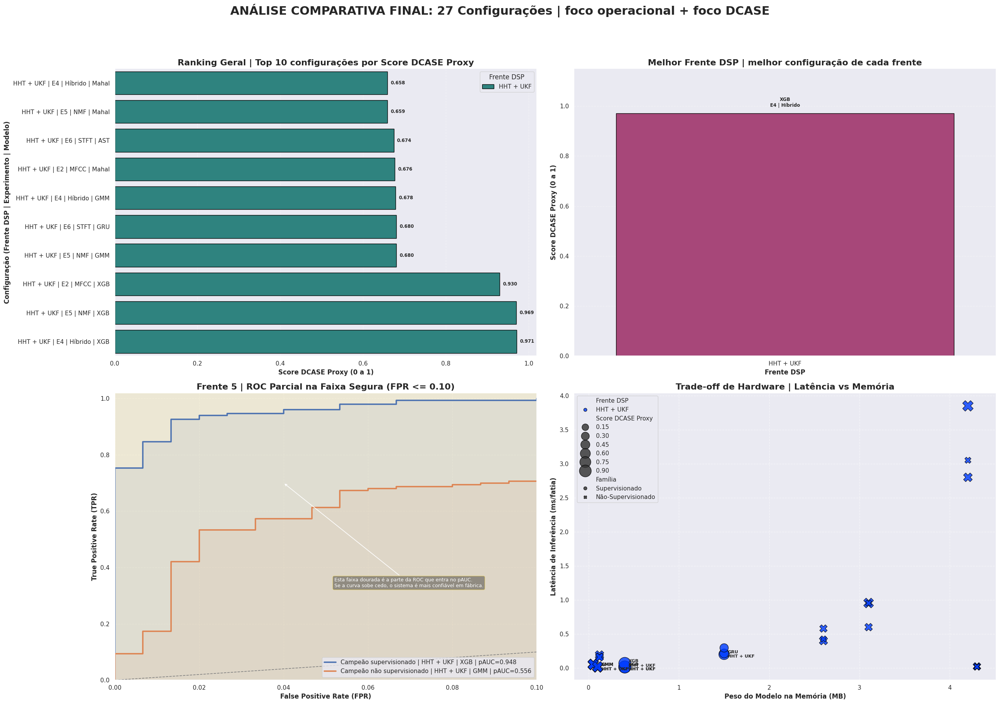

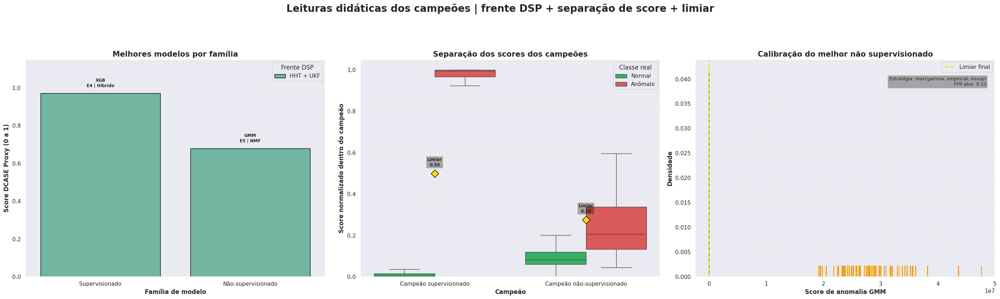

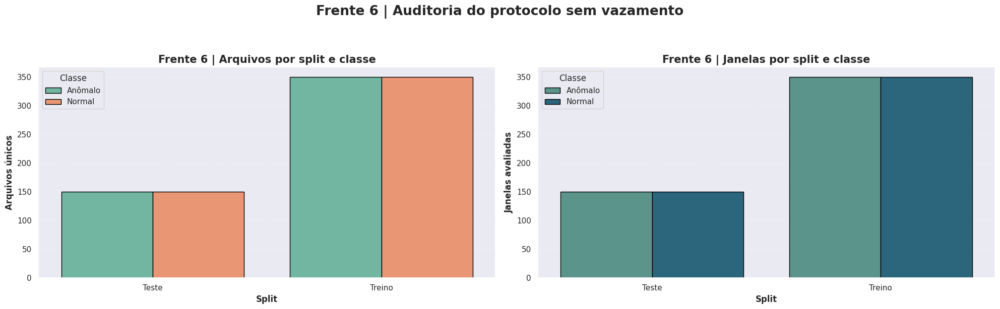

🧱 Frente 6: arquivos compartilhados entre treino e teste = 0
Leitura: se esse número é zero, o benchmark não está se beneficiando de janelas irmãs do mesmo arquivo nos dois lados.

🧪 Frente 8 | Relatório incremental dos baselines não supervisionados leves


,Frente DSP,Experimento,Modelo,Score DCASE Proxy,F1-Score,pAUC@0.1,Latência (ms),Memória (MB)
0,HHT + UKF,Exp 2 (MFCC Dinâmico),Mahalanobis (Não-Sup.),0.675985,0.789116,0.541778,0.049312,0.05
1,HHT + UKF,Exp 5 (Híbrido NMF),Mahalanobis (Não-Sup.),0.658878,0.785235,0.520444,0.057422,0.05
2,HHT + UKF,Exp 4 (Híbrido Antigo),Mahalanobis (Não-Sup.),0.658285,0.785235,0.519556,0.053271,0.05
3,HHT + UKF,Exp 2 (MFCC Dinâmico),Isolation Forest (Não-Sup.),0.398278,0.547826,0.278000,0.191370,0.12
4,HHT + UKF,Exp 5 (Híbrido NMF),Isolation Forest (Não-Sup.),0.318329,0.540084,0.206222,0.163786,0.12
5,HHT + UKF,Exp 4 (Híbrido Antigo),Isolation Forest (Não-Sup.),0.304199,0.536170,0.195111,0.161138,0.12


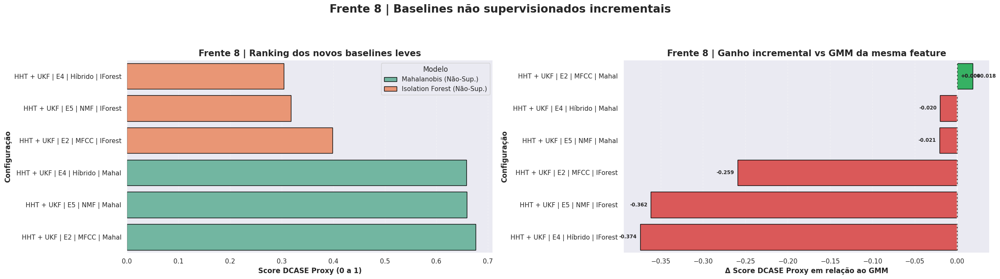


🧪 Frente 8.2 | Relatório incremental do LSTM-AE com promoção condicional


,Frente DSP,Experimento,Modelo,Score DCASE Proxy,F1-Score,pAUC@0.1,Latência (ms),Memória (MB)
0,HHT + UKF,Exp 6 (STFT Log 64x64),LSTM-AE (Não-Sup.),0.350745,0.461538,0.259556,0.401218,2.6
1,HHT + UKF,Exp 1 (Mel + RPCA),LSTM-AE (Não-Sup.),0.248348,0.157576,0.152889,0.580316,2.6
2,HHT + UKF,Exp 3 (CWT + RPCA),LSTM-AE (Não-Sup.),0.109861,0.025974,0.061778,0.427403,2.6


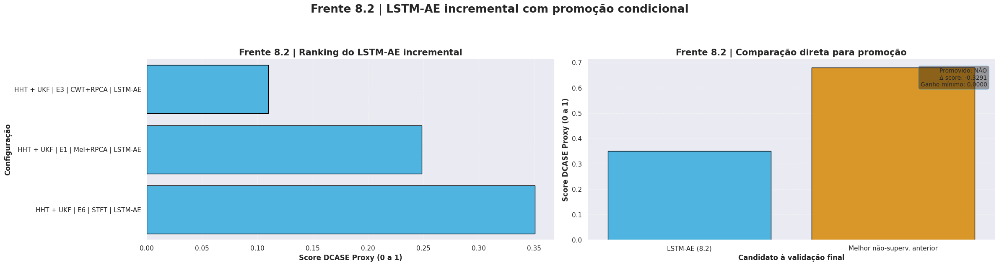


🧪 Frente 8.3 | Relatório incremental do VAE com promoção condicional


,Frente DSP,Experimento,Modelo,Score DCASE Proxy,F1-Score,pAUC@0.1,Latência (ms),Memória (MB)
0,HHT + UKF,Exp 6 (STFT Log 64x64),VAE (Não-Sup.),0.559305,0.633745,0.438667,0.955127,3.1
1,HHT + UKF,Exp 1 (Mel + RPCA),VAE (Não-Sup.),0.264513,0.124224,0.164000,0.600670,3.1
2,HHT + UKF,Exp 3 (CWT + RPCA),VAE (Não-Sup.),0.106393,0.025806,0.059556,0.953825,3.1


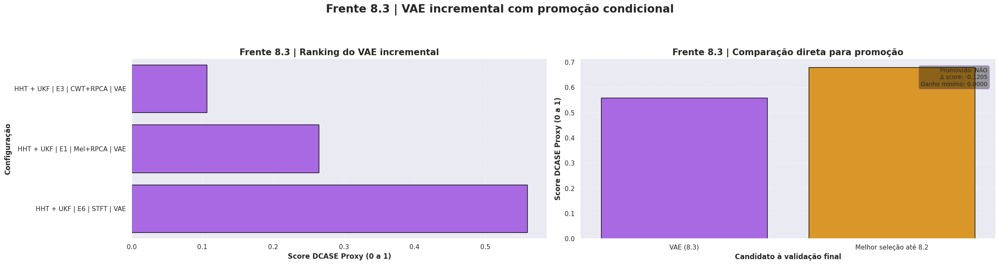


🧪 Frente 9.2 | Relatório de pré-treino leve e augmentação


,Frente DSP,Experimento,Modelo,Score DCASE Proxy,F1-Score,pAUC@0.1,SpecAugment 9.2,Pré-Treino 9.2,Transfer Learning 9.2
0,HHT + UKF,Exp 6 (STFT Log 64x64),GRU,0.679792,0.862745,0.535556,True,False,False
1,HHT + UKF,Exp 6 (STFT Log 64x64),Tiny-AST,0.673843,0.759398,0.559556,True,True,False
2,HHT + UKF,Exp 6 (STFT Log 64x64),VAE (Não-Sup.),0.559305,0.633745,0.438667,True,True,False
3,HHT + UKF,Exp 3 (CWT + RPCA),GRU,0.429032,0.653465,0.299556,True,False,False
4,HHT + UKF,Exp 1 (Mel + RPCA),Tiny-AST,0.403245,0.776596,0.267333,True,True,False
5,HHT + UKF,Exp 1 (Mel + RPCA),GRU,0.364421,0.761290,0.233778,True,False,False
6,HHT + UKF,Exp 6 (STFT Log 64x64),LSTM-AE (Não-Sup.),0.350745,0.461538,0.259556,True,True,False
7,HHT + UKF,Exp 6 (STFT Log 64x64),CNN + GMM (Não-Sup.),0.284077,0.401869,0.181556,True,True,False


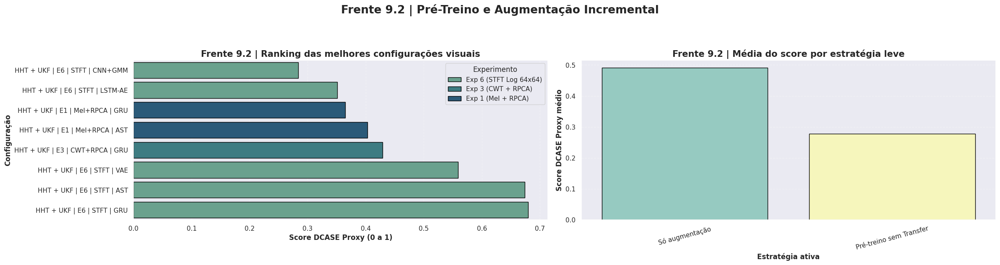


🧪 Frente 9.2 | Relatório de pré-treino leve e augmentação


,Frente DSP,Experimento,Modelo,Score DCASE Proxy,F1-Score,pAUC@0.1,SpecAugment 9.2,Pré-Treino 9.2,Transfer Learning 9.2
0,HHT + UKF,Exp 6 (STFT Log 64x64),GRU,0.679792,0.862745,0.535556,True,False,False
1,HHT + UKF,Exp 6 (STFT Log 64x64),Tiny-AST,0.673843,0.759398,0.559556,True,True,False
2,HHT + UKF,Exp 6 (STFT Log 64x64),VAE (Não-Sup.),0.559305,0.633745,0.438667,True,True,False
3,HHT + UKF,Exp 3 (CWT + RPCA),GRU,0.429032,0.653465,0.299556,True,False,False
4,HHT + UKF,Exp 1 (Mel + RPCA),Tiny-AST,0.403245,0.776596,0.267333,True,True,False
5,HHT + UKF,Exp 1 (Mel + RPCA),GRU,0.364421,0.761290,0.233778,True,False,False
6,HHT + UKF,Exp 6 (STFT Log 64x64),LSTM-AE (Não-Sup.),0.350745,0.461538,0.259556,True,True,False
7,HHT + UKF,Exp 6 (STFT Log 64x64),CNN + GMM (Não-Sup.),0.284077,0.401869,0.181556,True,True,False


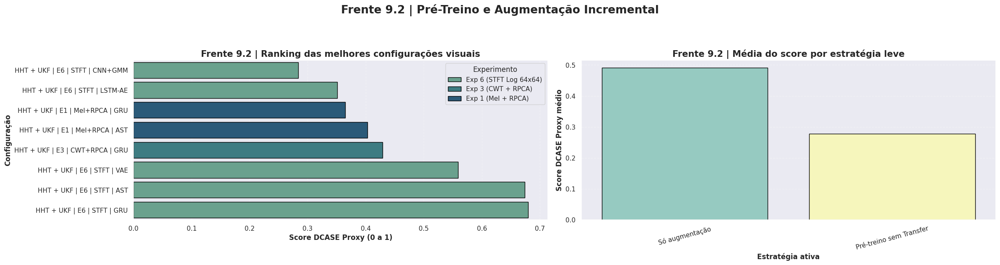


🧪 Frente 9.2 | Relatório de pré-treino leve e augmentação


,Frente DSP,Experimento,Modelo,Score DCASE Proxy,F1-Score,pAUC@0.1,SpecAugment 9.2,Pré-Treino 9.2,Transfer Learning 9.2
0,HHT + UKF,Exp 6 (STFT Log 64x64),GRU,0.679792,0.862745,0.535556,True,False,False
1,HHT + UKF,Exp 6 (STFT Log 64x64),Tiny-AST,0.673843,0.759398,0.559556,True,True,False
2,HHT + UKF,Exp 6 (STFT Log 64x64),VAE (Não-Sup.),0.559305,0.633745,0.438667,True,True,False
3,HHT + UKF,Exp 3 (CWT + RPCA),GRU,0.429032,0.653465,0.299556,True,False,False
4,HHT + UKF,Exp 1 (Mel + RPCA),Tiny-AST,0.403245,0.776596,0.267333,True,True,False
5,HHT + UKF,Exp 1 (Mel + RPCA),GRU,0.364421,0.761290,0.233778,True,False,False
6,HHT + UKF,Exp 6 (STFT Log 64x64),LSTM-AE (Não-Sup.),0.350745,0.461538,0.259556,True,True,False
7,HHT + UKF,Exp 6 (STFT Log 64x64),CNN + GMM (Não-Sup.),0.284077,0.401869,0.181556,True,True,False


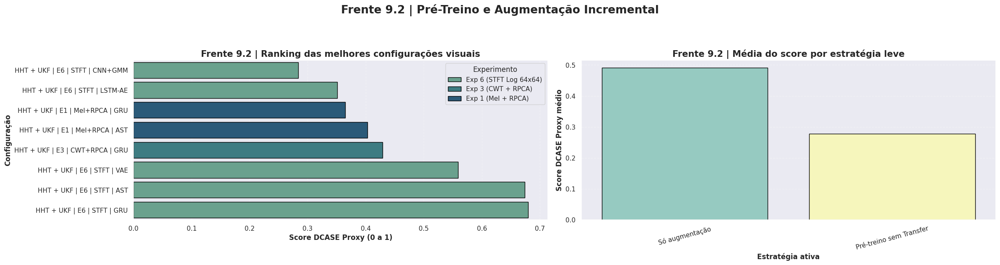


📌 Melhores configurações por frente DSP:


,Frente DSP,Experimento,Modelo,Score DCASE Proxy,F1-Score,pAUC@0.1,Latência (ms)
0,HHT + UKF,Exp 4 (Híbrido Antigo),XGBoost,0.97091,0.956811,0.948222,0.016174



 💡 PARECER TÉCNICO FINAL
 Ranking principal adotado: Score DCASE Proxy.
 Melhor configuração global: 'HHT + UKF | Exp 4 (Híbrido Antigo) | XGBoost'.
 F1-Score: 0.9568 | AUC-ROC: 0.9947 | pAUC@0.1: 0.9482
 Leitura: se o pAUC sobe, o sistema está mais robusto na região de baixo falso alarme, que é justamente o foco do DCASE.
 Frente 7: OE real inativo | amostras auxiliares = 0
 Frente 8.2: promoção para a validação final = NÃO | Δ score vs melhor não-supervisionado anterior = -0.3291
 Frente 8.3: promoção para a validação final = NÃO | Δ score vs melhor seleção até 8.2 = -0.1205
 Frente 10: a explicação fiel dos campeões será gerada na validação final, com atribuição por atributo para vetores e saliência por gradiente para modelos visuais.
 Frente 11: os campeões também serão perfilados para edge, com exportação leve e parecer de prontidão para TinyML.
 Campeões: a separação de scores ajuda a ver se normal e anômalo ficaram realmente apartados, e não apenas bem ranqueados por acaso.

📚 

,Etapa,Ordem,Frente,Status,Objetivo,Configuração líder,Observação,Acurácia,Precisão,Recall,F1-Score,AUC-ROC,pAUC@0.1,Score DCASE Proxy,Latência (ms),Memória (MB),Tempo DSP (s)
0,1,1.000000,Frente 1 - Regularização L2 + Gamma,Ativa,Base estatística do não supervisionado com limiar robusto.,HHT + UKF | E5 | NMF | GMM,Leitura referencial a partir do melhor não supervisionado com limiar calibrado.,0.6700,0.9636,0.3533,0.5171,0.8746,0.5560,0.6798,0.0145,0.1000,nan
1,2,2.000000,Frente 2 - CNN + GMM,Ativa,Arquitetura serial para embeddings visuais + detector probabilístico.,HHT + UKF | E6 | STFT | CNN+GMM,Modelo líder: CNN + GMM (Não-Sup.) | experimento: Exp 6 (STFT Log 64x64),0.5733,0.6719,0.2867,0.4019,0.6526,0.1816,0.2841,0.0234,4.3000,nan
2,3,3.000000,Frente 3 - DSP (HHT / UKF / HHT+UKF),Ativa,Saneamento acústico antes da extração de features.,HHT + UKF | E4 | Híbrido | XGB,DSP ativa nesta rodada: HHT + UKF | cache=MISS | tempo=10130.60s,0.9567,0.9536,0.9600,0.9568,0.9947,0.9482,0.9709,0.0162,0.4000,10130.60
3,4,4.000000,Frente 4 - Mixup,Ativa,Augmentação supervisionada e endurecimento incremental.,HHT + UKF | E4 | Híbrido | XGB,Modelo líder: XGBoost | experimento: Exp 4 (Híbrido Antigo),0.9567,0.9536,0.9600,0.9568,0.9947,0.9482,0.9709,0.0162,0.4000,nan
4,5,5.000000,Frente 5 - Avaliação Estrita,Ativa,"Ranking principal por pAUC@0.1, AUC e Score DCASE Proxy.",HHT + UKF | E4 | Híbrido | XGB,Modelo líder: XGBoost | experimento: Exp 4 (Híbrido Antigo),0.9567,0.9536,0.9600,0.9568,0.9947,0.9482,0.9709,0.0162,0.4000,nan
5,6,6.000000,Frente 6 - Protocolo Industrial,Ativa,Split por arquivo para evitar vazamento entre janelas irmãs.,HHT + UKF | E4 | Híbrido | XGB,Split por arquivo: ATIVO | arquivos compartilhados treino/teste=0,0.9567,0.9536,0.9600,0.9568,0.9947,0.9482,0.9709,0.0162,0.4000,nan
6,7,7.000000,Frente 7 - OE Real Acumulativo via DCASE,Inativa nesta execução,Exposição a exemplos reais fora da distribuição.,Sem configuração elegível nesta execução,Nenhuma configuração com OE real foi gerada nesta rodada.,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
7,8,8.000000,Frente 8 - Baselines Não Supervisionados Incrementais,Ativa,"Comparação entre GMM, Isolation Forest e Mahalanobis.",HHT + UKF | E2 | MFCC | Mahal,Modelo líder: Mahalanobis (Não-Sup.) | experimento: Exp 2 (MFCC Dinâmico),0.7933,0.8056,0.7733,0.7891,0.8986,0.5418,0.6760,0.0493,0.0500,nan
8,8.2,8.200000,Frente 8.2 - LSTM-AE com promoção,Monitorada,Autoencoder sequencial promovido apenas se houver ganho real.,HHT + UKF | E6 | STFT | LSTM-AE,Promoção=NÃO | Δ score=-0.3291,0.6033,0.7183,0.3400,0.4615,0.5407,0.2596,0.3507,0.4012,2.6000,nan
9,8.3,8.300000,Frente 8.3 - VAE com promoção,Monitorada,Autoencoder variacional promovido apenas se houver ganho real.,HHT + UKF | E6 | STFT | VAE,Promoção=NÃO | Δ score=-0.1205,0.7033,0.8280,0.5133,0.6337,0.7715,0.4387,0.5593,0.9551,3.1000,nan


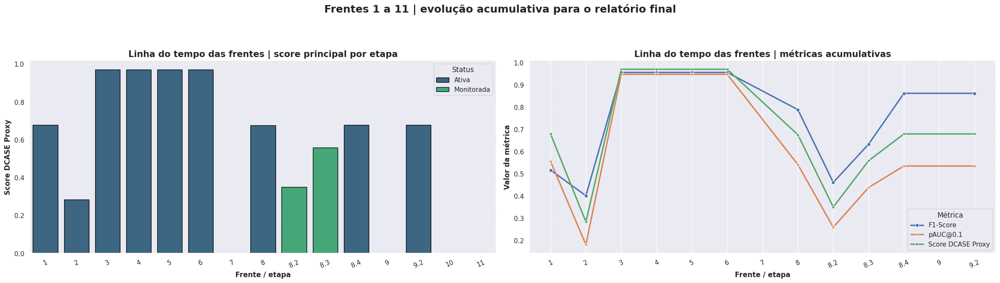

In [ ]:
# =========================================================
# FINAL NOTEBOOK | Visualização executiva do benchmark
# Papel deste bloco:
# - resume o leaderboard
# - organiza gráficos e relatório evolutivo das frentes
# =========================================================
# =========================================================
# 📊 VISUALIZAÇÃO FINAL: O veredito do Benchmarking (6 Experimentos + DCASE Proxy)
# =========================================================

if 'Memória (MB)' not in df_bench.columns:
    df_bench['Memória (MB)'] = 0.5
df_bench.fillna(0, inplace=True)

if df_bench.empty:
    print("\n" + "=" * 80)
    print(" ⚠️ AVISO: Nenhum resultado de benchmarking disponível para visualização.")
    print(" Por favor, verifique se o conjunto de dados de treino contém ambas as classes (Normal e Anomalia)")
    print(" para que os modelos supervisionados e não-supervisionados possam ser treinados.")
    print("=" * 80)
else:
    ranking_metric = METRICA_RANKING_BENCHMARK if 'METRICA_RANKING_BENCHMARK' in globals() and METRICA_RANKING_BENCHMARK in df_bench.columns else 'F1-Score'
    front_id_col = 'Frente DSP (ID)' if 'Frente DSP (ID)' in df_bench.columns else 'Frente DSP'
    front_label_col = 'Frente DSP' if 'Frente DSP' in df_bench.columns else front_id_col

    experiment_short_map = {
        'Exp 1 (Mel + RPCA)': 'E1 | Mel+RPCA',
        'Exp 2 (MFCC Dinâmico)': 'E2 | MFCC',
        'Exp 3 (CWT + RPCA)': 'E3 | CWT+RPCA',
        'Exp 4 (Híbrido Antigo)': 'E4 | Híbrido',
        'Exp 5 (Híbrido NMF)': 'E5 | NMF',
        'Exp 6 (STFT Log 64x64)': 'E6 | STFT',
    }
    model_short_map = {
        'XGBoost': 'XGB',
        'GRU': 'GRU',
        'GMM (Não-Sup.)': 'GMM',
        'Tiny-AST': 'AST',
        'CNN + GMM (Não-Sup.)': 'CNN+GMM',
        'Isolation Forest (Não-Sup.)': 'IForest',
        'Mahalanobis (Não-Sup.)': 'Mahal',
        'LSTM-AE (Não-Sup.)': 'LSTM-AE',
        'VAE (Não-Sup.)': 'VAE',
    }

    def compact_experiment_name(exp_name):
        return experiment_short_map.get(exp_name, exp_name)

    def compact_model_name(model_name):
        return model_short_map.get(model_name, model_name)

    def build_config_label(row):
        return f"{row[front_label_col]} | {compact_experiment_name(row['Experimento'])} | {compact_model_name(row['Modelo'])}"

    def normalize_local_scores(scores):
        scores = np.asarray(scores, dtype=np.float32)
        return (scores - scores.min()) / (scores.max() - scores.min() + 1e-9)

    df_sorted = df_bench.sort_values(by=ranking_metric, ascending=False).reset_index(drop=True)
    df_sorted['Configuração'] = df_sorted.apply(build_config_label, axis=1)

    print("\n" + "=" * 80)
    print(f" 🏆 TABELA COMPARATIVA DE PERFORMANCE (ORDENADA POR {ranking_metric.upper()})")
    print("=" * 80)

    subset_metrics = [m for m in ['Acurácia', 'Precisão', 'Recall', 'F1-Score', 'AUC-ROC', 'pAUC@0.1', 'Score DCASE Proxy'] if m in df_sorted.columns]
    display(
        df_sorted.style
        .background_gradient(cmap='Greens', subset=subset_metrics)
        .background_gradient(cmap='Oranges', subset=['Latência (ms)', 'Memória (MB)'])
        .format(precision=4)
    )

    best_supervisionado = df_sorted[df_sorted['Modelo'].isin(MODELOS_SUPERVISIONADOS)].head(1)
    best_nao_supervisionado = df_sorted[df_sorted['Modelo'].isin(MODELOS_NAO_SUPERVISIONADOS)].head(1)
    front8_models = globals().get('MODELOS_FRENTE8', {'Isolation Forest (Não-Sup.)', 'Mahalanobis (Não-Sup.)'})
    front82_models = globals().get('MODELOS_FRENTE82', {'LSTM-AE (Não-Sup.)'})
    front_best_rows = df_sorted.drop_duplicates(subset=[front_id_col]).reset_index(drop=True)
    top_configs = df_sorted.head(min(10, len(df_sorted))).copy()
    df_front8 = df_sorted[df_sorted['Modelo'].isin(front8_models)].copy()
    df_front82 = df_sorted[df_sorted['Modelo'].isin(front82_models)].copy()
    front83_models = globals().get('MODELOS_FRENTE83', {'VAE (Não-Sup.)'})
    df_front83 = df_sorted[df_sorted['Modelo'].isin(front83_models)].copy()

    selected_unsup_models = set(MODELOS_NAO_SUPERVISIONADOS) - set(front82_models) - set(front83_models)
    baseline_unsup_without_front82 = df_sorted[df_sorted['Modelo'].isin(selected_unsup_models)].head(1)
    best_front82 = df_front82.head(1)
    front82_promoted = False
    front82_delta = np.nan
    if not best_front82.empty:
        if baseline_unsup_without_front82.empty:
            front82_promoted = True
        else:
            front82_delta = float(best_front82.iloc[0][ranking_metric] - baseline_unsup_without_front82.iloc[0][ranking_metric])
            front82_promoted = bool(front82_delta > float(globals().get('FRONT82_MIN_GAIN', 0.0)))
    if front82_promoted:
        selected_unsup_models = set(selected_unsup_models) | set(front82_models)

    baseline_unsup_before_front83 = df_sorted[df_sorted['Modelo'].isin(selected_unsup_models)].head(1)
    best_front83 = df_front83.head(1)
    front83_promoted = False
    front83_delta = np.nan
    if not best_front83.empty:
        if baseline_unsup_before_front83.empty:
            front83_promoted = True
        else:
            front83_delta = float(best_front83.iloc[0][ranking_metric] - baseline_unsup_before_front83.iloc[0][ranking_metric])
            front83_promoted = bool(front83_delta > float(globals().get('FRONT83_MIN_GAIN', 0.0)))

    MODELOS_NAO_SUPERVISIONADOS_VALIDACAO = (set(selected_unsup_models) | set(front83_models)) if front83_promoted else set(selected_unsup_models)
    globals()['FRONT82_PROMOTED'] = bool(front82_promoted)
    globals()['FRONT82_DELTA_SCORE'] = float(front82_delta) if np.isfinite(front82_delta) else np.nan
    globals()['FRONT83_PROMOTED'] = bool(front83_promoted)
    globals()['FRONT83_DELTA_SCORE'] = float(front83_delta) if np.isfinite(front83_delta) else np.nan
    globals()['MODELOS_NAO_SUPERVISIONADOS_VALIDACAO'] = MODELOS_NAO_SUPERVISIONADOS_VALIDACAO

    best_nao_supervisionado = df_sorted[df_sorted['Modelo'].isin(MODELOS_NAO_SUPERVISIONADOS_VALIDACAO)].head(1)

    fig, axes = plt.subplots(2, 2, figsize=(26, 18))

    sns.barplot(
        data=top_configs,
        y='Configuração',
        x=ranking_metric,
        hue=front_label_col,
        dodge=False,
        palette='viridis',
        edgecolor='black',
        ax=axes[0, 0],
    )
    axes[0, 0].set_title(f'Ranking Geral | Top {len(top_configs)} configurações por {ranking_metric}', fontsize=16, fontweight='bold')
    axes[0, 0].set_xlabel(f'{ranking_metric} (0 a 1)', fontweight='bold')
    axes[0, 0].set_ylabel('Configuração (Frente DSP | Experimento | Modelo)', fontweight='bold')
    axes[0, 0].grid(True, axis='x', linestyle='--', alpha=0.35)
    axes[0, 0].invert_yaxis()
    for patch in axes[0, 0].patches:
        width = patch.get_width()
        if width > 0:
            axes[0, 0].annotate(
                f'{width:.3f}',
                (width, patch.get_y() + patch.get_height() / 2),
                xytext=(6, 0),
                textcoords='offset points',
                ha='left',
                va='center',
                fontsize=8.5,
                fontweight='bold',
            )

    sns.barplot(
        data=front_best_rows,
        x=front_label_col,
        y=ranking_metric,
        hue=front_label_col,
        dodge=False,
        palette='magma',
        edgecolor='black',
        ax=axes[0, 1],
    )
    if axes[0, 1].get_legend() is not None:
        axes[0, 1].get_legend().remove()
    axes[0, 1].set_title('Melhor Frente DSP | melhor configuração de cada frente', fontsize=16, fontweight='bold')
    axes[0, 1].set_xlabel('Frente DSP', fontweight='bold')
    axes[0, 1].set_ylabel(f'{ranking_metric} (0 a 1)', fontweight='bold')
    axes[0, 1].set_ylim(0.0, 1.15)
    axes[0, 1].grid(True, axis='y', linestyle='--', alpha=0.35)
    for idx, row in front_best_rows.iterrows():
        axes[0, 1].annotate(
            f"{compact_model_name(row['Modelo'])}\n{compact_experiment_name(row['Experimento'])}",
            (idx, row[ranking_metric]),
            xytext=(0, 10),
            textcoords='offset points',
            ha='center',
            va='bottom',
            fontsize=8.5,
            fontweight='bold',
        )

    axes[1, 0].axvspan(0.0, 0.10, color='gold', alpha=0.12)
    axes[1, 0].plot([0.0, 0.10], [0.0, 0.10], linestyle='--', color='gray', linewidth=1.2)

    champion_specs = []
    if not best_supervisionado.empty:
        champion_specs.append(('Campeão supervisionado', best_supervisionado.iloc[0]))
    if not best_nao_supervisionado.empty:
        champion_specs.append(('Campeão não supervisionado', best_nao_supervisionado.iloc[0]))

    curves_found = 0
    for title, row in champion_specs:
        curve_key = build_curve_key(row[front_id_col], row['Experimento'], row['Modelo']) if 'build_curve_key' in globals() else f"{row[front_id_col]} | {row['Experimento']} | {row['Modelo']}"
        if 'benchmark_curve_cache' not in globals() or curve_key not in benchmark_curve_cache:
            continue

        curve = benchmark_curve_cache[curve_key]
        fpr, tpr, _ = roc_curve(curve['y_true'], curve['y_score'])
        if np.max(fpr) < 0.10:
            fpr_plot = np.append(fpr, 0.10)
            tpr_plot = np.append(tpr, tpr[-1])
        else:
            interp_tpr = float(np.interp(0.10, fpr, tpr))
            mask = fpr <= 0.10
            fpr_plot = np.concatenate([fpr[mask], [0.10]])
            tpr_plot = np.concatenate([tpr[mask], [interp_tpr]])

        axes[1, 0].plot(
            fpr_plot,
            tpr_plot,
            linewidth=2.6,
            label=f"{title} | {row[front_label_col]} | {compact_model_name(row['Modelo'])} | pAUC={row['pAUC@0.1']:.3f}"
        )
        axes[1, 0].fill_between(fpr_plot, 0, tpr_plot, alpha=0.08)
        curves_found += 1

    axes[1, 0].set_xlim(0.0, 0.10)
    axes[1, 0].set_ylim(0.0, 1.02)
    axes[1, 0].set_title('Frente 5 | ROC Parcial na Faixa Segura (FPR <= 0.10)', fontsize=16, fontweight='bold')
    axes[1, 0].set_xlabel('False Positive Rate (FPR)', fontweight='bold')
    axes[1, 0].set_ylabel('True Positive Rate (TPR)', fontweight='bold')
    axes[1, 0].grid(True, linestyle='--', alpha=0.4)
    if curves_found > 0:
        axes[1, 0].legend(loc='lower right')
    else:
        axes[1, 0].text(
            0.05,
            0.50,
            'As curvas dos campeões aparecerão aqui\nassim que o cache do benchmark estiver disponível.',
            ha='center',
            va='center',
            fontsize=10,
            color='white',
            bbox=dict(boxstyle='round,pad=0.3', fc='black', ec='gold', alpha=0.30),
        )
    axes[1, 0].annotate(
        'Esta faixa dourada é a parte da ROC que entra no pAUC.\nSe a curva sobe cedo, o sistema é mais confiável em fábrica.',
        xy=(0.04, 0.70),
        xytext=(0.052, 0.33),
        fontsize=9,
        color='white',
        arrowprops=dict(arrowstyle='->', color='white', lw=1.2),
        bbox=dict(boxstyle='round,pad=0.3', fc='black', ec='gold', alpha=0.35),
    )

    size_metric = df_sorted[ranking_metric] if ranking_metric in df_sorted.columns else np.ones(len(df_sorted))
    df_sorted['Família'] = np.where(df_sorted['Modelo'].isin(MODELOS_SUPERVISIONADOS), 'Supervisionado', 'Não-Supervisionado')
    sns.scatterplot(
        data=df_sorted,
        x='Memória (MB)',
        y='Latência (ms)',
        hue=front_label_col,
        style='Família',
        size=size_metric,
        sizes=(120, 520),
        palette='bright',
        ax=axes[1, 1],
        edgecolor='black',
        alpha=0.82,
    )
    for _, row in df_sorted.head(min(6, len(df_sorted))).iterrows():
        axes[1, 1].text(
            row['Memória (MB)'] + 0.04,
            row['Latência (ms)'],
            f"{compact_model_name(row['Modelo'])}\n{row[front_label_col]}",
            fontsize=8.2,
            fontweight='bold',
            va='center'
        )
    axes[1, 1].set_title('Trade-off de Hardware | Latência vs Memória', fontsize=16, fontweight='bold')
    axes[1, 1].set_xlabel('Peso do Modelo na Memória (MB)', fontweight='bold')
    axes[1, 1].set_ylabel('Latência de Inferência (ms/fatia)', fontweight='bold')
    axes[1, 1].grid(True, linestyle='--', alpha=0.5)

    plt.suptitle(
        f'ANÁLISE COMPARATIVA FINAL: {len(df_bench)} Configurações | foco operacional + foco DCASE',
        fontsize=22,
        fontweight='bold',
        y=1.01
    )
    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.show()

    fig2, axes2 = plt.subplots(1, 3, figsize=(28, 8))

    family_rows = []
    if not best_supervisionado.empty:
        row_sup = best_supervisionado.iloc[0].copy()
        row_sup['Família campeã'] = 'Supervisionado'
        family_rows.append(row_sup)
    if not best_nao_supervisionado.empty:
        row_unsup = best_nao_supervisionado.iloc[0].copy()
        row_unsup['Família campeã'] = 'Não-supervisionado'
        family_rows.append(row_unsup)

    if family_rows:
        df_family = pd.DataFrame(family_rows)
        sns.barplot(
            data=df_family,
            x='Família campeã',
            y=ranking_metric,
            hue=front_label_col,
            palette='Set2',
            edgecolor='black',
            ax=axes2[0],
        )
        axes2[0].set_title('Melhores modelos por família', fontsize=15, fontweight='bold')
        axes2[0].set_xlabel('Família de modelo', fontweight='bold')
        axes2[0].set_ylabel(f'{ranking_metric} (0 a 1)', fontweight='bold')
        axes2[0].set_ylim(0.0, 1.15)
        axes2[0].grid(True, axis='y', linestyle='--', alpha=0.35)
        for idx, row in df_family.reset_index(drop=True).iterrows():
            axes2[0].annotate(
                f"{compact_model_name(row['Modelo'])}\n{compact_experiment_name(row['Experimento'])}",
                (idx, row[ranking_metric]),
                xytext=(0, 10),
                textcoords='offset points',
                ha='center',
                va='bottom',
                fontsize=8.5,
                fontweight='bold',
            )
    else:
        axes2[0].axis('off')
        axes2[0].text(0.5, 0.5, 'Nenhum campeão por família disponível.', ha='center', va='center', fontsize=11)

    champion_score_rows = []
    threshold_markers = []
    champion_name_map = {
        'Campeão supervisionado': best_supervisionado.iloc[0] if not best_supervisionado.empty else None,
        'Campeão não-supervisionado': best_nao_supervisionado.iloc[0] if not best_nao_supervisionado.empty else None,
    }

    for champion_title, row in champion_name_map.items():
        if row is None:
            continue
        cache_key = build_curve_key(row[front_id_col], row['Experimento'], row['Modelo']) if 'build_curve_key' in globals() else f"{row[front_id_col]} | {row['Experimento']} | {row['Modelo']}"
        diag = benchmark_diagnostic_cache.get(cache_key) if 'benchmark_diagnostic_cache' in globals() else None
        if diag is None or 'test_scores' not in diag:
            continue

        raw_scores = np.asarray(diag['test_scores'], dtype=np.float32)
        score_norm = normalize_local_scores(raw_scores)
        y_true = np.asarray(diag.get('y_true', []), dtype=np.int64)
        if len(y_true) != len(score_norm):
            continue

        for score_value, class_value in zip(score_norm, y_true):
            champion_score_rows.append({
                'Campeão': champion_title,
                'Classe real': 'Anômalo' if int(class_value) == 1 else 'Normal',
                'Score normalizado': float(score_value),
            })

        decision_threshold = diag.get('decision_threshold', np.nan)
        if np.isfinite(decision_threshold):
            threshold_norm = float((decision_threshold - raw_scores.min()) / (raw_scores.max() - raw_scores.min() + 1e-9))
            threshold_markers.append({
                'Campeão': champion_title,
                'Threshold normalizado': float(np.clip(threshold_norm, 0.0, 1.0)),
            })

    if champion_score_rows:
        df_scores = pd.DataFrame(champion_score_rows)
        order_scores = list(df_scores['Campeão'].drop_duplicates())
        sns.boxplot(
            data=df_scores,
            x='Campeão',
            y='Score normalizado',
            hue='Classe real',
            order=order_scores,
            palette={'Normal': '#22c55e', 'Anômalo': '#ef4444'},
            showfliers=False,
            ax=axes2[1],
        )
        axes2[1].set_title('Separação dos scores dos campeões', fontsize=15, fontweight='bold')
        axes2[1].set_xlabel('Campeão', fontweight='bold')
        axes2[1].set_ylabel('Score normalizado dentro do campeão', fontweight='bold')
        axes2[1].set_ylim(0.0, 1.05)
        axes2[1].grid(True, axis='y', linestyle='--', alpha=0.30)

        x_positions = {name: idx for idx, name in enumerate(order_scores)}
        for marker in threshold_markers:
            x_pos = x_positions.get(marker['Campeão'])
            if x_pos is None:
                continue
            axes2[1].scatter(
                [x_pos],
                [marker['Threshold normalizado']],
                s=120,
                marker='D',
                color='gold',
                edgecolor='black',
                zorder=6,
            )
            axes2[1].annotate(
                f"Limiar\n{marker['Threshold normalizado']:.2f}",
                xy=(x_pos, marker['Threshold normalizado']),
                xytext=(0, 12),
                textcoords='offset points',
                ha='center',
                va='bottom',
                fontsize=8.5,
                fontweight='bold',
                bbox=dict(boxstyle='round,pad=0.2', fc='black', ec='gold', alpha=0.30),
            )
    else:
        axes2[1].axis('off')
        axes2[1].text(0.5, 0.5, 'Sem scores diagnósticos suficientes\npara comparar os campeões.', ha='center', va='center', fontsize=11)

    if not best_nao_supervisionado.empty:
        row_unsup = best_nao_supervisionado.iloc[0]
        cache_key_unsup = build_curve_key(row_unsup[front_id_col], row_unsup['Experimento'], row_unsup['Modelo']) if 'build_curve_key' in globals() else f"{row_unsup[front_id_col]} | {row_unsup['Experimento']} | {row_unsup['Modelo']}"
        diag_unsup = benchmark_diagnostic_cache.get(cache_key_unsup) if 'benchmark_diagnostic_cache' in globals() else None
    else:
        diag_unsup = None

    if diag_unsup is not None and 'test_scores' in diag_unsup:
        hist_rows = []
        for score in np.asarray(diag_unsup.get('train_normal_scores', []), dtype=np.float32):
            hist_rows.append({'Grupo': 'Treino normal', 'Score': float(score)})
        for score in np.asarray(diag_unsup.get('mixup_scores', []), dtype=np.float32):
            hist_rows.append({'Grupo': 'Mixup', 'Score': float(score)})
        for score in np.asarray(diag_unsup.get('oe_real_scores', []), dtype=np.float32):
            hist_rows.append({'Grupo': 'OE real', 'Score': float(score)})

        raw_scores = np.asarray(diag_unsup.get('test_scores', []), dtype=np.float32)
        y_true_diag = np.asarray(diag_unsup.get('y_true', []), dtype=np.int64)
        if len(raw_scores) == len(y_true_diag):
            for score, class_value in zip(raw_scores, y_true_diag):
                hist_rows.append({
                    'Grupo': 'Teste anômalo' if int(class_value) == 1 else 'Teste normal',
                    'Score': float(score),
                })

        if hist_rows:
            df_hist = pd.DataFrame(hist_rows)
            sns.histplot(
                data=df_hist,
                x='Score',
                hue='Grupo',
                element='step',
                fill=False,
                stat='density',
                common_norm=False,
                palette={
                    'Treino normal': '#22c55e',
                    'Mixup': '#f59e0b',
                    'OE real': '#a855f7',
                    'Teste normal': '#3b82f6',
                    'Teste anômalo': '#ef4444',
                },
                ax=axes2[2],
            )
            threshold_value = diag_unsup.get('decision_threshold', np.nan)
            if np.isfinite(threshold_value):
                axes2[2].axvline(threshold_value, color='gold', linestyle='--', linewidth=2.2, label='Limiar final')
                axes2[2].legend(loc='upper right')
            axes2[2].set_title('Calibração do melhor não supervisionado', fontsize=15, fontweight='bold')
            axes2[2].set_xlabel(diag_unsup.get('display_label', 'Score bruto de anomalia'), fontweight='bold')
            axes2[2].set_ylabel('Densidade', fontweight='bold')
            axes2[2].grid(True, linestyle='--', alpha=0.30)
            tinfo = diag_unsup.get('threshold_info', {})
            axes2[2].annotate(
                f"Estratégia: {tinfo.get('strategy', 'n/d')}\nFPR alvo: {tinfo.get('target_fpr', np.nan):.2f}",
                xy=(0.97, 0.92),
                xycoords='axes fraction',
                ha='right',
                va='top',
                fontsize=9,
                bbox=dict(boxstyle='round,pad=0.3', fc='black', ec='gold', alpha=0.30),
            )
        else:
            axes2[2].axis('off')
            axes2[2].text(0.5, 0.5, 'Sem distribuição suficiente para\nmostrar a calibração do limiar.', ha='center', va='center', fontsize=11)
    else:
        axes2[2].axis('off')
        axes2[2].text(0.5, 0.5, 'Nenhum campeão não supervisionado\nfoi encontrado para calibrar o limiar.', ha='center', va='center', fontsize=11)

    plt.suptitle('Leituras didáticas dos campeões | frente DSP + separação de score + limiar', fontsize=20, fontweight='bold', y=1.04)
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

    if globals().get('FRONT6_PROTOCOL_ACTIVE', False):
        df_protocol_summary = globals().get('FRONT6_PROTOCOL_REPORT', {}).get('summary_table', pd.DataFrame()).copy()
        if not df_protocol_summary.empty:
            fig3, axes3 = plt.subplots(1, 2, figsize=(20, 6))

            sns.barplot(
                data=df_protocol_summary,
                x='Split',
                y='Arquivos',
                hue='Classe',
                palette='Set2',
                edgecolor='black',
                ax=axes3[0],
            )
            axes3[0].set_title('Frente 6 | Arquivos por split e classe', fontsize=15, fontweight='bold')
            axes3[0].set_xlabel('Split', fontweight='bold')
            axes3[0].set_ylabel('Arquivos únicos', fontweight='bold')
            axes3[0].grid(True, axis='y', linestyle='--', alpha=0.30)

            sns.barplot(
                data=df_protocol_summary,
                x='Split',
                y='Janelas',
                hue='Classe',
                palette='crest',
                edgecolor='black',
                ax=axes3[1],
            )
            axes3[1].set_title('Frente 6 | Janelas por split e classe', fontsize=15, fontweight='bold')
            axes3[1].set_xlabel('Split', fontweight='bold')
            axes3[1].set_ylabel('Janelas avaliadas', fontweight='bold')
            axes3[1].grid(True, axis='y', linestyle='--', alpha=0.30)

            plt.suptitle('Frente 6 | Auditoria do protocolo sem vazamento', fontsize=19, fontweight='bold', y=1.02)
            plt.tight_layout(rect=[0, 0, 1, 0.96])
            plt.show()

            print(f"🧱 Frente 6: arquivos compartilhados entre treino e teste = {int(globals().get('FRONT6_SHARED_GROUPS_COUNT', 0))}")
            print("Leitura: se esse número é zero, o benchmark não está se beneficiando de janelas irmãs do mesmo arquivo nos dois lados.")

    if not df_front8.empty:
        print("\n🧪 Frente 8 | Relatório incremental dos baselines não supervisionados leves")
        display(
            df_front8[
                [front_label_col, 'Experimento', 'Modelo', ranking_metric, 'F1-Score', 'pAUC@0.1', 'Latência (ms)', 'Memória (MB)']
            ].head(min(12, len(df_front8))).reset_index(drop=True)
        )

        fig4, axes4 = plt.subplots(1, 2, figsize=(24, 6.5))
        top_front8 = df_front8.head(min(10, len(df_front8))).copy()
        sns.barplot(
            data=top_front8,
            y='Configuração',
            x=ranking_metric,
            hue='Modelo',
            dodge=False,
            palette='Set2',
            edgecolor='black',
            ax=axes4[0],
        )
        axes4[0].set_title('Frente 8 | Ranking dos novos baselines leves', fontsize=15, fontweight='bold')
        axes4[0].set_xlabel(f'{ranking_metric} (0 a 1)', fontweight='bold')
        axes4[0].set_ylabel('Configuração', fontweight='bold')
        axes4[0].grid(True, axis='x', linestyle='--', alpha=0.30)
        axes4[0].invert_yaxis()

        gmm_reference = (
            df_sorted[df_sorted['Modelo'] == 'GMM (Não-Sup.)'][[front_id_col, 'Experimento', ranking_metric]]
            .rename(columns={ranking_metric: 'Score GMM'})
        )
        df_front8_delta = df_front8.merge(gmm_reference, on=[front_id_col, 'Experimento'], how='left')
        df_front8_delta = df_front8_delta[df_front8_delta['Score GMM'].notna()].copy()

        if not df_front8_delta.empty:
            df_front8_delta['Delta vs GMM'] = df_front8_delta[ranking_metric] - df_front8_delta['Score GMM']
            df_front8_delta['Direção'] = np.where(df_front8_delta['Delta vs GMM'] >= 0, 'Ganho', 'Perda')
            df_front8_delta = df_front8_delta.sort_values(by='Delta vs GMM', ascending=False).head(min(10, len(df_front8_delta)))
            sns.barplot(
                data=df_front8_delta,
                y='Configuração',
                x='Delta vs GMM',
                hue='Direção',
                dodge=False,
                palette={'Ganho': '#22c55e', 'Perda': '#ef4444'},
                edgecolor='black',
                ax=axes4[1],
            )
            if axes4[1].get_legend() is not None:
                axes4[1].get_legend().remove()
            axes4[1].axvline(0.0, color='white', linestyle='--', linewidth=1.2)
            axes4[1].set_title('Frente 8 | Ganho incremental vs GMM da mesma feature', fontsize=15, fontweight='bold')
            axes4[1].set_xlabel(f'Δ {ranking_metric} em relação ao GMM', fontweight='bold')
            axes4[1].set_ylabel('Configuração', fontweight='bold')
            axes4[1].grid(True, axis='x', linestyle='--', alpha=0.30)
            for patch in axes4[1].patches:
                width = patch.get_width()
                axes4[1].annotate(
                    f'{width:+.3f}',
                    (width, patch.get_y() + patch.get_height() / 2),
                    xytext=(6 if width >= 0 else -6, 0),
                    textcoords='offset points',
                    ha='left' if width >= 0 else 'right',
                    va='center',
                    fontsize=8.5,
                    fontweight='bold',
                )
        else:
            axes4[1].axis('off')
            axes4[1].text(0.5, 0.5, 'Sem referência GMM equivalente\npara medir ganho incremental.', ha='center', va='center', fontsize=11)

        plt.suptitle('Frente 8 | Baselines não supervisionados incrementais', fontsize=19, fontweight='bold', y=1.02)
        plt.tight_layout(rect=[0, 0, 1, 0.95])
        plt.show()

    print("\n🧪 Frente 8.2 | Relatório incremental do LSTM-AE com promoção condicional")
    if not df_front82.empty:
        display(
            df_front82[
                [front_label_col, 'Experimento', 'Modelo', ranking_metric, 'F1-Score', 'pAUC@0.1', 'Latência (ms)', 'Memória (MB)']
            ].head(min(6, len(df_front82))).reset_index(drop=True)
        )

        fig5, axes5 = plt.subplots(1, 2, figsize=(24, 6.2))
        top_front82 = df_front82.head(min(6, len(df_front82))).copy()
        sns.barplot(
            data=top_front82,
            y='Configuração',
            x=ranking_metric,
            color='#38bdf8',
            edgecolor='black',
            ax=axes5[0],
        )
        axes5[0].set_title('Frente 8.2 | Ranking do LSTM-AE incremental', fontsize=15, fontweight='bold')
        axes5[0].set_xlabel(f'{ranking_metric} (0 a 1)', fontweight='bold')
        axes5[0].set_ylabel('Configuração', fontweight='bold')
        axes5[0].grid(True, axis='x', linestyle='--', alpha=0.30)
        axes5[0].invert_yaxis()

        compare_rows = []
        if not best_front82.empty:
            compare_rows.append({'Modelo': 'LSTM-AE (8.2)', 'Score': float(best_front82.iloc[0][ranking_metric])})
        if not baseline_unsup_without_front82.empty:
            compare_rows.append({'Modelo': 'Melhor não-superv. anterior', 'Score': float(baseline_unsup_without_front82.iloc[0][ranking_metric])})

        if compare_rows:
            df_compare = pd.DataFrame(compare_rows)
            sns.barplot(
                data=df_compare,
                x='Modelo',
                y='Score',
                hue='Modelo',
                dodge=False,
                palette={'LSTM-AE (8.2)': '#38bdf8', 'Melhor não-superv. anterior': '#f59e0b'},
                edgecolor='black',
                ax=axes5[1],
            )
            if axes5[1].get_legend() is not None:
                axes5[1].get_legend().remove()
            axes5[1].set_title('Frente 8.2 | Comparação direta para promoção', fontsize=15, fontweight='bold')
            axes5[1].set_xlabel('Candidato à validação final', fontweight='bold')
            axes5[1].set_ylabel(f'{ranking_metric} (0 a 1)', fontweight='bold')
            axes5[1].grid(True, axis='y', linestyle='--', alpha=0.30)
            decision_text = (
                f"Promovido: {'SIM' if front82_promoted else 'NÃO'}\n"
                f"Δ score: {front82_delta:+.4f}\n"
                f"Ganho mínimo: {float(globals().get('FRONT82_MIN_GAIN', 0.0)):.4f}"
            )
            axes5[1].annotate(
                decision_text,
                xy=(0.98, 0.95),
                xycoords='axes fraction',
                ha='right',
                va='top',
                fontsize=10,
                bbox=dict(boxstyle='round,pad=0.35', fc='black', ec='#38bdf8', alpha=0.35),
            )
        else:
            axes5[1].axis('off')
            axes5[1].text(0.5, 0.5, 'Sem comparação suficiente\npara decidir a promoção da Frente 8.2.', ha='center', va='center', fontsize=11)

        plt.suptitle('Frente 8.2 | LSTM-AE incremental com promoção condicional', fontsize=19, fontweight='bold', y=1.02)
        plt.tight_layout(rect=[0, 0, 1, 0.95])
        plt.show()
    else:
        print("   -> Nenhum resultado da Frente 8.2 foi gerado nesta execução.")

    print("\n🧪 Frente 8.3 | Relatório incremental do VAE com promoção condicional")
    if not df_front83.empty:
        display(
            df_front83[
                [front_label_col, 'Experimento', 'Modelo', ranking_metric, 'F1-Score', 'pAUC@0.1', 'Latência (ms)', 'Memória (MB)']
            ].head(min(6, len(df_front83))).reset_index(drop=True)
        )

        fig6, axes6 = plt.subplots(1, 2, figsize=(24, 6.2))
        top_front83 = df_front83.head(min(6, len(df_front83))).copy()
        sns.barplot(
            data=top_front83,
            y='Configuração',
            x=ranking_metric,
            color='#a855f7',
            edgecolor='black',
            ax=axes6[0],
        )
        axes6[0].set_title('Frente 8.3 | Ranking do VAE incremental', fontsize=15, fontweight='bold')
        axes6[0].set_xlabel(f'{ranking_metric} (0 a 1)', fontweight='bold')
        axes6[0].set_ylabel('Configuração', fontweight='bold')
        axes6[0].grid(True, axis='x', linestyle='--', alpha=0.30)
        axes6[0].invert_yaxis()

        compare_rows = []
        if not best_front83.empty:
            compare_rows.append({'Modelo': 'VAE (8.3)', 'Score': float(best_front83.iloc[0][ranking_metric])})
        if not baseline_unsup_before_front83.empty:
            compare_rows.append({'Modelo': 'Melhor seleção até 8.2', 'Score': float(baseline_unsup_before_front83.iloc[0][ranking_metric])})

        if compare_rows:
            df_compare83 = pd.DataFrame(compare_rows)
            sns.barplot(
                data=df_compare83,
                x='Modelo',
                y='Score',
                hue='Modelo',
                dodge=False,
                palette={'VAE (8.3)': '#a855f7', 'Melhor seleção até 8.2': '#f59e0b'},
                edgecolor='black',
                ax=axes6[1],
            )
            if axes6[1].get_legend() is not None:
                axes6[1].get_legend().remove()
            axes6[1].set_title('Frente 8.3 | Comparação direta para promoção', fontsize=15, fontweight='bold')
            axes6[1].set_xlabel('Candidato à validação final', fontweight='bold')
            axes6[1].set_ylabel(f'{ranking_metric} (0 a 1)', fontweight='bold')
            axes6[1].grid(True, axis='y', linestyle='--', alpha=0.30)
            decision_text83 = (
                f"Promovido: {'SIM' if front83_promoted else 'NÃO'}\n"
                f"Δ score: {front83_delta:+.4f}\n"
                f"Ganho mínimo: {float(globals().get('FRONT83_MIN_GAIN', 0.0)):.4f}"
            )
            axes6[1].annotate(
                decision_text83,
                xy=(0.98, 0.95),
                xycoords='axes fraction',
                ha='right',
                va='top',
                fontsize=10,
                bbox=dict(boxstyle='round,pad=0.35', fc='black', ec='#a855f7', alpha=0.35),
            )
        else:
            axes6[1].axis('off')
            axes6[1].text(0.5, 0.5, 'Sem comparação suficiente\npara decidir a promoção da Frente 8.3.', ha='center', va='center', fontsize=11)

        plt.suptitle('Frente 8.3 | VAE incremental com promoção condicional', fontsize=19, fontweight='bold', y=1.02)
        plt.tight_layout(rect=[0, 0, 1, 0.95])
        plt.show()
    else:
        print("   -> Nenhum resultado da Frente 8.3 foi gerado nesta execução.")


print("\n🧪 Frente 9.2 | Relatório de pré-treino leve e augmentação")
if 'Frente 9.2 ativa' in df_sorted.columns and df_sorted['Frente 9.2 ativa'].any():
    df_front92 = df_sorted[df_sorted['Frente 9.2 ativa']].copy()
    display(
        df_front92[
            [
                front_label_col,
                'Experimento',
                'Modelo',
                ranking_metric,
                'F1-Score',
                'pAUC@0.1',
                'SpecAugment 9.2',
                'Pré-Treino 9.2',
                'Transfer Learning 9.2',
            ]
        ].head(min(8, len(df_front92))).reset_index(drop=True)
    )

    fig92, axes92 = plt.subplots(1, 2, figsize=(24, 6.2))
    top_front92 = df_front92.head(min(8, len(df_front92))).copy()
    sns.barplot(
        data=top_front92,
        y='Configuração',
        x=ranking_metric,
        hue='Experimento',
        dodge=False,
        palette='crest',
        edgecolor='black',
        ax=axes92[0],
    )
    axes92[0].set_title('Frente 9.2 | Ranking das melhores configurações visuais', fontsize=15, fontweight='bold')
    axes92[0].set_xlabel(f'{ranking_metric} (0 a 1)', fontweight='bold')
    axes92[0].set_ylabel('Configuração', fontweight='bold')
    axes92[0].grid(True, axis='x', linestyle='--', alpha=0.30)
    axes92[0].invert_yaxis()

    flag_summary = (
        df_front92.groupby(['Pré-Treino 9.2', 'Transfer Learning 9.2'])[ranking_metric]
        .mean()
        .reset_index()
    )
    flag_summary['Estratégia'] = np.where(
        flag_summary['Pré-Treino 9.2'],
        np.where(flag_summary['Transfer Learning 9.2'], 'Pré-treino + Transfer', 'Pré-treino sem Transfer'),
        np.where(flag_summary['Transfer Learning 9.2'], 'Transfer sem pré-treino', 'Só augmentação')
    )
    sns.barplot(
        data=flag_summary,
        x='Estratégia',
        y=ranking_metric,
        hue='Estratégia',
        dodge=False,
        palette='Set3',
        edgecolor='black',
        ax=axes92[1],
    )
    if axes92[1].get_legend() is not None:
        axes92[1].get_legend().remove()
    axes92[1].set_title('Frente 9.2 | Média do score por estratégia leve', fontsize=15, fontweight='bold')
    axes92[1].set_xlabel('Estratégia ativa', fontweight='bold')
    axes92[1].set_ylabel(f'{ranking_metric} médio', fontweight='bold')
    axes92[1].grid(True, axis='y', linestyle='--', alpha=0.30)
    axes92[1].tick_params(axis='x', rotation=15)

    plt.suptitle('Frente 9.2 | Pré-Treino e Augmentação Incremental', fontsize=19, fontweight='bold', y=1.02)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()
else:
    print("   -> Nenhum resultado com a Frente 9.2 ativa foi gerado nesta execução.")


print("\n🧪 Frente 9.2 | Relatório de pré-treino leve e augmentação")
if 'Frente 9.2 ativa' in df_sorted.columns and df_sorted['Frente 9.2 ativa'].any():
    df_front92 = df_sorted[df_sorted['Frente 9.2 ativa']].copy()
    display(
        df_front92[
            [
                front_label_col,
                'Experimento',
                'Modelo',
                ranking_metric,
                'F1-Score',
                'pAUC@0.1',
                'SpecAugment 9.2',
                'Pré-Treino 9.2',
                'Transfer Learning 9.2',
            ]
        ].head(min(8, len(df_front92))).reset_index(drop=True)
    )

    fig92, axes92 = plt.subplots(1, 2, figsize=(24, 6.2))
    top_front92 = df_front92.head(min(8, len(df_front92))).copy()
    sns.barplot(
        data=top_front92,
        y='Configuração',
        x=ranking_metric,
        hue='Experimento',
        dodge=False,
        palette='crest',
        edgecolor='black',
        ax=axes92[0],
    )
    axes92[0].set_title('Frente 9.2 | Ranking das melhores configurações visuais', fontsize=15, fontweight='bold')
    axes92[0].set_xlabel(f'{ranking_metric} (0 a 1)', fontweight='bold')
    axes92[0].set_ylabel('Configuração', fontweight='bold')
    axes92[0].grid(True, axis='x', linestyle='--', alpha=0.30)
    axes92[0].invert_yaxis()

    flag_summary = (
        df_front92.groupby(['Pré-Treino 9.2', 'Transfer Learning 9.2'])[ranking_metric]
        .mean()
        .reset_index()
    )
    flag_summary['Estratégia'] = np.where(
        flag_summary['Pré-Treino 9.2'],
        np.where(flag_summary['Transfer Learning 9.2'], 'Pré-treino + Transfer', 'Pré-treino sem Transfer'),
        np.where(flag_summary['Transfer Learning 9.2'], 'Transfer sem pré-treino', 'Só augmentação')
    )
    sns.barplot(
        data=flag_summary,
        x='Estratégia',
        y=ranking_metric,
        hue='Estratégia',
        dodge=False,
        palette='Set3',
        edgecolor='black',
        ax=axes92[1],
    )
    if axes92[1].get_legend() is not None:
        axes92[1].get_legend().remove()
    axes92[1].set_title('Frente 9.2 | Média do score por estratégia leve', fontsize=15, fontweight='bold')
    axes92[1].set_xlabel('Estratégia ativa', fontweight='bold')
    axes92[1].set_ylabel(f'{ranking_metric} médio', fontweight='bold')
    axes92[1].grid(True, axis='y', linestyle='--', alpha=0.30)
    axes92[1].tick_params(axis='x', rotation=15)

    plt.suptitle('Frente 9.2 | Pré-Treino e Augmentação Incremental', fontsize=19, fontweight='bold', y=1.02)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()
else:
    print("   -> Nenhum resultado com a Frente 9.2 ativa foi gerado nesta execução.")


print("\n🧪 Frente 9.2 | Relatório de pré-treino leve e augmentação")
if 'Frente 9.2 ativa' in df_sorted.columns and df_sorted['Frente 9.2 ativa'].any():
    df_front92 = df_sorted[df_sorted['Frente 9.2 ativa']].copy()
    display(
        df_front92[
            [
                front_label_col,
                'Experimento',
                'Modelo',
                ranking_metric,
                'F1-Score',
                'pAUC@0.1',
                'SpecAugment 9.2',
                'Pré-Treino 9.2',
                'Transfer Learning 9.2',
            ]
        ].head(min(8, len(df_front92))).reset_index(drop=True)
    )

    fig92, axes92 = plt.subplots(1, 2, figsize=(24, 6.2))
    top_front92 = df_front92.head(min(8, len(df_front92))).copy()
    sns.barplot(
        data=top_front92,
        y='Configuração',
        x=ranking_metric,
        hue='Experimento',
        dodge=False,
        palette='crest',
        edgecolor='black',
        ax=axes92[0],
    )
    axes92[0].set_title('Frente 9.2 | Ranking das melhores configurações visuais', fontsize=15, fontweight='bold')
    axes92[0].set_xlabel(f'{ranking_metric} (0 a 1)', fontweight='bold')
    axes92[0].set_ylabel('Configuração', fontweight='bold')
    axes92[0].grid(True, axis='x', linestyle='--', alpha=0.30)
    axes92[0].invert_yaxis()

    flag_summary = (
        df_front92.groupby(['Pré-Treino 9.2', 'Transfer Learning 9.2'])[ranking_metric]
        .mean()
        .reset_index()
    )
    flag_summary['Estratégia'] = np.where(
        flag_summary['Pré-Treino 9.2'],
        np.where(flag_summary['Transfer Learning 9.2'], 'Pré-treino + Transfer', 'Pré-treino sem Transfer'),
        np.where(flag_summary['Transfer Learning 9.2'], 'Transfer sem pré-treino', 'Só augmentação')
    )
    sns.barplot(
        data=flag_summary,
        x='Estratégia',
        y=ranking_metric,
        hue='Estratégia',
        dodge=False,
        palette='Set3',
        edgecolor='black',
        ax=axes92[1],
    )
    if axes92[1].get_legend() is not None:
        axes92[1].get_legend().remove()
    axes92[1].set_title('Frente 9.2 | Média do score por estratégia leve', fontsize=15, fontweight='bold')
    axes92[1].set_xlabel('Estratégia ativa', fontweight='bold')
    axes92[1].set_ylabel(f'{ranking_metric} médio', fontweight='bold')
    axes92[1].grid(True, axis='y', linestyle='--', alpha=0.30)
    axes92[1].tick_params(axis='x', rotation=15)

    plt.suptitle('Frente 9.2 | Pré-Treino e Augmentação Incremental', fontsize=19, fontweight='bold', y=1.02)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()
else:
    print("   -> Nenhum resultado com a Frente 9.2 ativa foi gerado nesta execução.")

    best_row = df_sorted.iloc[0]
    print("\n📌 Melhores configurações por frente DSP:")
    display(
        front_best_rows[
            [front_label_col, 'Experimento', 'Modelo', ranking_metric, 'F1-Score', 'pAUC@0.1', 'Latência (ms)']
        ].reset_index(drop=True)
    )

    print("\n" + "=" * 80)
    print(" 💡 PARECER TÉCNICO FINAL")
    print("=" * 80)
    print(f" Ranking principal adotado: {ranking_metric}.")
    print(f" Melhor configuração global: '{best_row[front_label_col]} | {best_row['Experimento']} | {best_row['Modelo']}'.")
    print(f" F1-Score: {best_row['F1-Score']:.4f} | AUC-ROC: {best_row['AUC-ROC']:.4f} | pAUC@0.1: {best_row['pAUC@0.1']:.4f}")
    print(" Leitura: se o pAUC sobe, o sistema está mais robusto na região de baixo falso alarme, que é justamente o foco do DCASE.")
    if 'OE real ativo' in best_row.index:
        print(f" Frente 7: OE real {'ATIVO' if bool(best_row['OE real ativo']) else 'inativo'} | amostras auxiliares = {int(best_row.get('Amostras OE reais', 0))}")
    if len(front_best_rows) > 1:
        print(" Frente DSP: a barra de 'melhor frente' mostra qual pré-processamento entregou o melhor material para os modelos.")
    if not best_nao_supervisionado.empty and best_nao_supervisionado.iloc[0]['Modelo'] in front8_models:
        print(f" Frente 8: o campeão não supervisionado desta rodada veio de um baseline leve incremental ({best_nao_supervisionado.iloc[0]['Modelo']}).")
    if not df_front82.empty:
        print(f" Frente 8.2: promoção para a validação final = {'SIM' if front82_promoted else 'NÃO'} | Δ score vs melhor não-supervisionado anterior = {front82_delta:+.4f}" if np.isfinite(front82_delta) else f" Frente 8.2: promoção para a validação final = {'SIM' if front82_promoted else 'NÃO'}.")
    if not df_front83.empty:
        print(f" Frente 8.3: promoção para a validação final = {'SIM' if front83_promoted else 'NÃO'} | Δ score vs melhor seleção até 8.2 = {front83_delta:+.4f}" if np.isfinite(front83_delta) else f" Frente 8.3: promoção para a validação final = {'SIM' if front83_promoted else 'NÃO'}.")
    if 'Frente 9.2 ativa' in best_row.index and bool(best_row['Frente 9.2 ativa']):
        print(
            f" Frente 9.2: ativa na melhor configuração | "
            f"SpecAugment={'SIM' if bool(best_row.get('SpecAugment 9.2', False)) else 'NÃO'} | "
            f"pré-treino={'SIM' if bool(best_row.get('Pré-Treino 9.2', False)) else 'NÃO'} | "
            f"transfer={'SIM' if bool(best_row.get('Transfer Learning 9.2', False)) else 'NÃO'}"
        )
    print(" Frente 10: a explicação fiel dos campeões será gerada na validação final, com atribuição por atributo para vetores e saliência por gradiente para modelos visuais.")
    print(" Frente 11: os campeões também serão perfilados para edge, com exportação leve e parecer de prontidão para TinyML.")
    print(" Campeões: a separação de scores ajuda a ver se normal e anômalo ficaram realmente apartados, e não apenas bem ranqueados por acaso.")
    print("=" * 80)

if not df_bench.empty:
    if 'best_row' not in globals():
        best_row = df_sorted.iloc[0]
        print("\n📌 Melhores configurações por frente DSP:")
        display(
            front_best_rows[
                [front_label_col, 'Experimento', 'Modelo', ranking_metric, 'F1-Score', 'pAUC@0.1', 'Latência (ms)']
            ].reset_index(drop=True)
        )

        print("\n" + "=" * 80)
        print(" 💡 PARECER TÉCNICO FINAL")
        print("=" * 80)
        print(f" Ranking principal adotado: {ranking_metric}.")
        print(f" Melhor configuração global: '{best_row[front_label_col]} | {best_row['Experimento']} | {best_row['Modelo']}'.")
        print(f" F1-Score: {best_row['F1-Score']:.4f} | AUC-ROC: {best_row['AUC-ROC']:.4f} | pAUC@0.1: {best_row['pAUC@0.1']:.4f}")
        print(" Leitura: se o pAUC sobe, o sistema está mais robusto na região de baixo falso alarme, que é justamente o foco do DCASE.")
        if 'OE real ativo' in best_row.index:
            print(f" Frente 7: OE real {'ATIVO' if bool(best_row['OE real ativo']) else 'inativo'} | amostras auxiliares = {int(best_row.get('Amostras OE reais', 0))}")
        if len(front_best_rows) > 1:
            print(" Frente DSP: a barra de 'melhor frente' mostra qual pré-processamento entregou o melhor material para os modelos.")
        if not best_nao_supervisionado.empty and best_nao_supervisionado.iloc[0]['Modelo'] in front8_models:
            print(f" Frente 8: o campeão não supervisionado desta rodada veio de um baseline leve incremental ({best_nao_supervisionado.iloc[0]['Modelo']}).")
        if not df_front82.empty:
            print(f" Frente 8.2: promoção para a validação final = {'SIM' if front82_promoted else 'NÃO'} | Δ score vs melhor não-supervisionado anterior = {front82_delta:+.4f}" if np.isfinite(front82_delta) else f" Frente 8.2: promoção para a validação final = {'SIM' if front82_promoted else 'NÃO'}.")
        if not df_front83.empty:
            print(f" Frente 8.3: promoção para a validação final = {'SIM' if front83_promoted else 'NÃO'} | Δ score vs melhor seleção até 8.2 = {front83_delta:+.4f}" if np.isfinite(front83_delta) else f" Frente 8.3: promoção para a validação final = {'SIM' if front83_promoted else 'NÃO'}.")
        if 'Frente 9.2 ativa' in best_row.index and bool(best_row['Frente 9.2 ativa']):
            print(
                f" Frente 9.2: ativa na melhor configuração | "
                f"SpecAugment={'SIM' if bool(best_row.get('SpecAugment 9.2', False)) else 'NÃO'} | "
                f"pré-treino={'SIM' if bool(best_row.get('Pré-Treino 9.2', False)) else 'NÃO'} | "
                f"transfer={'SIM' if bool(best_row.get('Transfer Learning 9.2', False)) else 'NÃO'}"
            )
        print(" Frente 10: a explicação fiel dos campeões será gerada na validação final, com atribuição por atributo para vetores e saliência por gradiente para modelos visuais.")
        print(" Frente 11: os campeões também serão perfilados para edge, com exportação leve e parecer de prontidão para TinyML.")
        print(" Campeões: a separação de scores ajuda a ver se normal e anômalo ficaram realmente apartados, e não apenas bem ranqueados por acaso.")
        print("=" * 80)

    FRONT_STAGE_ORDER = {
        '1': 1.0,
        '2': 2.0,
        '3': 3.0,
        '4': 4.0,
        '5': 5.0,
        '6': 6.0,
        '7': 7.0,
        '8': 8.0,
        '8.2': 8.2,
        '8.3': 8.3,
        '8.4': 8.4,
        '9': 9.0,
        '9.2': 9.2,
        '10': 10.0,
        '11': 11.0,
    }
    BENCHMARK_EVOLUTION_COLS = [
        'Acurácia',
        'Precisão',
        'Recall',
        'F1-Score',
        'AUC-ROC',
        'pAUC@0.1',
        'Score DCASE Proxy',
        'Latência (ms)',
        'Memória (MB)',
        'Tempo DSP (s)',
    ]

    def as_float_or_nan(value):
        try:
            return float(value) if pd.notna(value) else np.nan
        except Exception:
            return np.nan

    def build_benchmark_stage_row(stage_id, stage_name, stage_df, objective, status='Ativa', note='', extra_values=None):
        row = {
            'Etapa': str(stage_id),
            'Ordem': float(FRONT_STAGE_ORDER.get(str(stage_id), np.nan)),
            'Frente': stage_name,
            'Status': status,
            'Objetivo': objective,
            'Configuração líder': 'Sem configuração elegível nesta execução',
            'Observação': note,
        }
        for metric_col in BENCHMARK_EVOLUTION_COLS:
            row[metric_col] = np.nan

        if extra_values:
            row.update(extra_values)

        if stage_df is not None and len(stage_df) > 0:
            lead_row = stage_df.sort_values(by=ranking_metric, ascending=False).iloc[0]
            row['Configuração líder'] = lead_row['Configuração'] if 'Configuração' in lead_row.index else build_config_label(lead_row)
            for metric_col in BENCHMARK_EVOLUTION_COLS:
                if metric_col in lead_row.index:
                    row[metric_col] = as_float_or_nan(lead_row[metric_col])
            if not row['Observação']:
                row['Observação'] = f"Modelo líder: {lead_row['Modelo']} | experimento: {lead_row['Experimento']}"

        return row

    dsp_stage_report = globals().get('DSP_STAGE_REPORT', {})
    front1_df = best_nao_supervisionado.copy() if not best_nao_supervisionado.empty else df_sorted[df_sorted['Modelo'].isin(MODELOS_NAO_SUPERVISIONADOS)].head(1).copy()
    front2_df = df_sorted[df_sorted['Modelo'] == 'CNN + GMM (Não-Sup.)'].copy()
    front3_df = front_best_rows.head(1).copy()
    front4_df = df_sorted[df_sorted['Mixup ativo'] == True].copy() if 'Mixup ativo' in df_sorted.columns else pd.DataFrame()
    front5_df = df_sorted.head(1).copy()
    front6_df = df_sorted.head(1).copy()
    front7_df = df_sorted[df_sorted['OE real ativo'] == True].copy() if 'OE real ativo' in df_sorted.columns else pd.DataFrame()
    front8_df = df_front8.copy()
    front84_df = df_sorted[df_sorted['Experimento'] == 'Exp 6 (STFT Log 64x64)'].copy() if 'Experimento' in df_sorted.columns else pd.DataFrame()
    front92_df = df_sorted[df_sorted['Frente 9.2 ativa'] == True].copy() if 'Frente 9.2 ativa' in df_sorted.columns else pd.DataFrame()

    front3_note = (
        f"DSP ativa nesta rodada: {dsp_stage_report.get('front_label', globals().get('DSP_FRONT_ATIVO_LABEL', 'DSP'))} | "
        f"cache={'HIT' if bool(dsp_stage_report.get('cache_hit', False)) else 'MISS'} | "
        f"tempo={dsp_stage_report.get('elapsed_seconds', 0.0):.2f}s"
    ) if dsp_stage_report else "Resumo DSP não disponível nesta execução."
    front6_note = (
        f"Split por arquivo: {'ATIVO' if bool(globals().get('FRONT6_PROTOCOL_ACTIVE', False)) else 'inativo'} | "
        f"arquivos compartilhados treino/teste={int(globals().get('FRONT6_SHARED_GROUPS_COUNT', 0))}"
    )
    front7_status = 'Ativa' if len(front7_df) > 0 else 'Inativa nesta execução'
    front7_note = (
        f"OE real ativo em {len(front7_df)} configuração(ões) | amostras auxiliares máximas={int(front7_df['Amostras OE reais'].max()) if len(front7_df) > 0 else 0}"
        if len(front7_df) > 0 else
        "Nenhuma configuração com OE real foi gerada nesta rodada."
    )
    front82_status = 'Promovida' if bool(front82_promoted) else ('Monitorada' if len(df_front82) > 0 else 'Sem candidato nesta execução')
    front82_note = (
        f"Promoção={'SIM' if front82_promoted else 'NÃO'} | Δ score={front82_delta:+.4f}"
        if len(df_front82) > 0 and np.isfinite(front82_delta) else
        f"Promoção={'SIM' if front82_promoted else 'NÃO'}"
    )
    front83_status = 'Promovida' if bool(front83_promoted) else ('Monitorada' if len(df_front83) > 0 else 'Sem candidato nesta execução')
    front83_note = (
        f"Promoção={'SIM' if front83_promoted else 'NÃO'} | Δ score={front83_delta:+.4f}"
        if len(df_front83) > 0 and np.isfinite(front83_delta) else
        f"Promoção={'SIM' if front83_promoted else 'NÃO'}"
    )
    front84_status = 'Ativa' if bool(globals().get('FRONT84_ENABLE_STFT', False)) else 'Desativada nesta execução'
    front92_status = 'Ativa' if len(front92_df) > 0 else ('Desativada' if not bool(globals().get('FRONT92_ENABLE', False)) else 'Sem ganho nesta execução')

    front_evolution_rows = [
        build_benchmark_stage_row(
            '1',
            'Frente 1 - Regularização L2 + Gamma',
            front1_df,
            'Base estatística do não supervisionado com limiar robusto.',
            status='Ativa',
            note='Leitura referencial a partir do melhor não supervisionado com limiar calibrado.',
        ),
        build_benchmark_stage_row(
            '2',
            'Frente 2 - CNN + GMM',
            front2_df,
            'Arquitetura serial para embeddings visuais + detector probabilístico.',
            status='Ativa' if len(front2_df) > 0 else 'Sem candidato nesta execução',
        ),
        build_benchmark_stage_row(
            '3',
            'Frente 3 - DSP (HHT / UKF / HHT+UKF)',
            front3_df,
            'Saneamento acústico antes da extração de features.',
            status='Ativa',
            note=front3_note,
            extra_values={'Tempo DSP (s)': float(dsp_stage_report.get('elapsed_seconds', np.nan)) if dsp_stage_report else np.nan},
        ),
        build_benchmark_stage_row(
            '4',
            'Frente 4 - Mixup',
            front4_df,
            'Augmentação supervisionada e endurecimento incremental.',
            status='Ativa' if len(front4_df) > 0 else 'Sem uso nesta execução',
        ),
        build_benchmark_stage_row(
            '5',
            'Frente 5 - Avaliação Estrita',
            front5_df,
            'Ranking principal por pAUC@0.1, AUC e Score DCASE Proxy.',
            status='Ativa',
        ),
        build_benchmark_stage_row(
            '6',
            'Frente 6 - Protocolo Industrial',
            front6_df,
            'Split por arquivo para evitar vazamento entre janelas irmãs.',
            status='Ativa' if bool(globals().get('FRONT6_PROTOCOL_ACTIVE', False)) else 'Legado por janela',
            note=front6_note,
        ),
        build_benchmark_stage_row(
            '7',
            'Frente 7 - OE Real Acumulativo via DCASE',
            front7_df,
            'Exposição a exemplos reais fora da distribuição.',
            status=front7_status,
            note=front7_note,
        ),
        build_benchmark_stage_row(
            '8',
            'Frente 8 - Baselines Não Supervisionados Incrementais',
            front8_df,
            'Comparação entre GMM, Isolation Forest e Mahalanobis.',
            status='Ativa' if len(front8_df) > 0 else 'Sem candidato nesta execução',
        ),
        build_benchmark_stage_row(
            '8.2',
            'Frente 8.2 - LSTM-AE com promoção',
            df_front82,
            'Autoencoder sequencial promovido apenas se houver ganho real.',
            status=front82_status,
            note=front82_note,
        ),
        build_benchmark_stage_row(
            '8.3',
            'Frente 8.3 - VAE com promoção',
            df_front83,
            'Autoencoder variacional promovido apenas se houver ganho real.',
            status=front83_status,
            note=front83_note,
        ),
        build_benchmark_stage_row(
            '8.4',
            'Frente 8.4 - Exp 6 STFT Log 64x64',
            front84_df,
            'Experimento visual adicional com STFT log padronizado.',
            status=front84_status,
        ),
        build_benchmark_stage_row(
            '9',
            'Frente 9 - Diagnóstico Cego',
            pd.DataFrame(),
            'Leitura por arquivo, margem ao limiar e alarmes de shift/colapso.',
            status='Aguardando validação final',
            note='As métricas cegas desta frente são preenchidas na seção 12.',
        ),
        build_benchmark_stage_row(
            '9.2',
            'Frente 9.2 - Pré-Treino e Augmentação',
            front92_df,
            'SpecAugment leve, máscaras tempo/frequência e pré-treino curto.',
            status=front92_status,
        ),
        build_benchmark_stage_row(
            '10',
            'Frente 10 - XAI do Modelo',
            pd.DataFrame(),
            'Explicação fiel do campeão refitado.',
            status='Aguardando validação final',
            note='A explicação final é gerada depois do refit dos campeões.',
        ),
        build_benchmark_stage_row(
            '11',
            'Frente 11 - Edge/TinyML',
            pd.DataFrame(),
            'Perfilagem e exportação leve do campeão.',
            status='Aguardando validação final',
            note='O parecer edge é preenchido depois da validação final.',
        ),
    ]

    df_front_evolution_benchmark = pd.DataFrame(front_evolution_rows).sort_values(by='Ordem').reset_index(drop=True)
    globals()['FRONT_BENCHMARK_EVOLUTION'] = df_front_evolution_benchmark.copy()
    Path('front_evolution_benchmark.csv').write_text(df_front_evolution_benchmark.to_csv(index=False), encoding='utf-8')

    print("\n📚 Relatório evolutivo das frentes (benchmark acumulativo)")
    display(
        df_front_evolution_benchmark.style
        .background_gradient(cmap='Blues', subset=[col for col in ['F1-Score', 'AUC-ROC', 'pAUC@0.1', 'Score DCASE Proxy'] if col in df_front_evolution_benchmark.columns])
        .format({
            'Acurácia': '{:.4f}',
            'Precisão': '{:.4f}',
            'Recall': '{:.4f}',
            'F1-Score': '{:.4f}',
            'AUC-ROC': '{:.4f}',
            'pAUC@0.1': '{:.4f}',
            'Score DCASE Proxy': '{:.4f}',
            'Latência (ms)': '{:.4f}',
            'Memória (MB)': '{:.4f}',
            'Tempo DSP (s)': '{:.2f}',
        })
    )

    evolution_plot_df = df_front_evolution_benchmark[df_front_evolution_benchmark[ranking_metric].notna()].copy()
    if not evolution_plot_df.empty:
        ordered_labels = list(df_front_evolution_benchmark['Etapa'])
        evolution_plot_df['Etapa'] = pd.Categorical(evolution_plot_df['Etapa'], categories=ordered_labels, ordered=True)
        fig_evo, axes_evo = plt.subplots(1, 2, figsize=(24, 6.6))

        sns.barplot(
            data=evolution_plot_df,
            x='Etapa',
            y=ranking_metric,
            hue='Status',
            dodge=False,
            palette='viridis',
            edgecolor='black',
            ax=axes_evo[0],
        )
        axes_evo[0].set_title('Linha do tempo das frentes | score principal por etapa', fontsize=15, fontweight='bold')
        axes_evo[0].set_xlabel('Frente / etapa', fontweight='bold')
        axes_evo[0].set_ylabel(ranking_metric, fontweight='bold')
        axes_evo[0].grid(True, axis='y', linestyle='--', alpha=0.30)
        axes_evo[0].tick_params(axis='x', rotation=25)

        metric_lines = [col for col in ['F1-Score', 'pAUC@0.1', 'Score DCASE Proxy'] if col in evolution_plot_df.columns]
        line_df = evolution_plot_df[['Etapa'] + metric_lines].melt(
            id_vars=['Etapa'],
            value_vars=metric_lines,
            var_name='Métrica',
            value_name='Valor',
        ).dropna()

        if not line_df.empty:
            sns.lineplot(
                data=line_df,
                x='Etapa',
                y='Valor',
                hue='Métrica',
                style='Métrica',
                markers=True,
                dashes=False,
                linewidth=2.4,
                ax=axes_evo[1],
            )
            axes_evo[1].set_title('Linha do tempo das frentes | métricas acumulativas', fontsize=15, fontweight='bold')
            axes_evo[1].set_xlabel('Frente / etapa', fontweight='bold')
            axes_evo[1].set_ylabel('Valor da métrica', fontweight='bold')
            axes_evo[1].grid(True, axis='y', linestyle='--', alpha=0.30)
            axes_evo[1].tick_params(axis='x', rotation=25)
        else:
            axes_evo[1].axis('off')
            axes_evo[1].text(0.5, 0.5, 'Sem métricas suficientes\npara a linha evolutiva.', ha='center', va='center', fontsize=12)

        plt.suptitle('Frentes 1 a 11 | evolução acumulativa para o relatório final', fontsize=18, fontweight='bold', y=1.02)
        plt.tight_layout(rect=[0, 0, 1, 0.95])
        plt.show()

## Bloco 12 | Validação final dos campeões

Nesta etapa o notebook deixa de falar em potencial e passa a medir o **campeão refitado**.

**Saídas desta validação.**
- relatório final supervisionado e não supervisionado;
- métricas do teste cego por arquivo;
- diagnóstico de `domain shift` e colapso direcional;
- XAI fiel do modelo escolhido;
- parecer `Edge/TinyML`;
- tabela final de evolução das frentes `1 -> 11`.



⚙️ Preparando o teste cego para os modelos campeões...

🏆 Campeão supervisionado: HHT + UKF | XGBoost | Exp 4 (Híbrido Antigo) | Score DCASE Proxy=0.9709


Montando Exp 4 (Híbrido Antigo) para teste cego: 100%|██████████| 25/25 [00:06<00:00,  3.97fatia/s]

🛰️ Frente 7 | OE real inativo | amostras auxiliares = 0
🧭 Frente 9 | agregação=topk_mean | topk=3 | janela=2.0s | overlap=0.50
🧠 Frente 10 | XAI ATIVO | arquivos=2 | top_atributos=8
⚙️ Frente 11 | Edge/TinyML ATIVO | perfil_windows=24 | export=SIM

📏 Métricas no teste cego (RELATÓRIO FINAL - CAMPEÃO SUPERVISIONADO):
   Acurácia:          0.4800
   Precisão:          0.3889
   Recall:            0.7778
   F1-Score:          0.5185
   AUC-ROC:           0.4861
   pAUC@0.1 (proxy):  0.1111
   Score DCASE Proxy: 0.1809

 RELATÓRIO FINAL - CAMPEÃO SUPERVISIONADO
Métrica de seleção do campeão: Score DCASE Proxy
Frente DSP campeã: HHT + UKF
Experimento campeão: Exp 4 (Híbrido Antigo)
Modelo campeão: XGBoost
Score de ranking: 0.9709
------------------------------------------------------------------------
------------------------------------------------------------------------
anomaly_01.wav: 🚨 ANOMALIA FORTE | Confiança: 90.12% | Margem: 0.4012 | Evidência: Alta
anomaly_02.wav: 🚨 ANOMALIA FORT

,Arquivo,Status,Confiança,Evidência,Margem ao limiar,Janelas avaliadas,Taxa de janelas anômalas,Rótulo_Real
0,anomaly_01.wav,🚨 ANOMALIA FORTE,0.9012,Alta,0.4012,1,1.0000,1
1,anomaly_02.wav,🚨 ANOMALIA FORTE,0.9404,Alta,0.4404,1,1.0000,1
2,anomaly_03.wav,🚨 ANOMALIA FORTE,0.9983,Alta,0.4983,1,1.0000,1
3,anomaly_04.wav,🚨 ANOMALIA FORTE,0.9890,Alta,0.4890,1,1.0000,1
4,anomaly_05.wav,🟡 REVISAR | anomalia fraca,0.5122,Baixa,0.0122,1,1.0000,1
5,anomaly_06.wav,🚨 ANOMALIA FORTE,0.9979,Alta,0.4979,1,1.0000,1
6,anomaly_07.wav,🟢 NORMAL PROVÁVEL,0.6313,Média,-0.1313,1,0.0000,1
7,anomaly_08.wav,⚠️ ANOMALIA PROVÁVEL,0.5835,Média,0.0835,1,1.0000,1
8,anomaly_09.wav,✅ NORMAL FORTE,0.8425,Alta,-0.3425,1,0.0000,1
9,normal_01.wav,✅ NORMAL FORTE,0.8528,Alta,-0.3528,1,0.0000,0


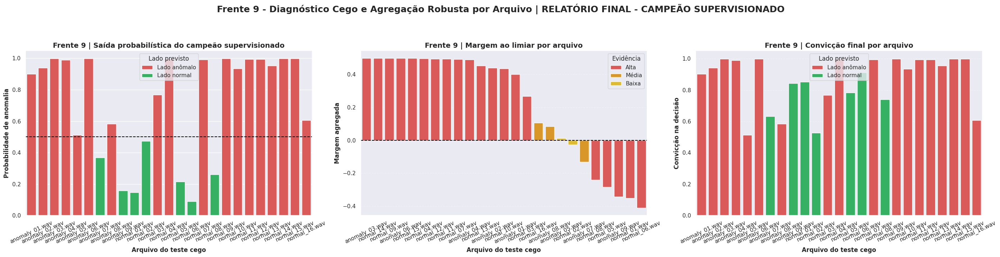


 🧠 Frente 10 - XAI do Modelo | RELATÓRIO FINAL - CAMPEÃO SUPERVISIONADO
Modelo explicado: XGBoost | Exp 4 (Híbrido Antigo) | arquivos-alvo=2 | janelas por arquivo=3


,Arquivo,Método XAI,Top fator,Contribuição do top fator,Margem agregada,Status Frente 9
0,anomaly_03.wav,Contribuição nativa do booster (pred_contribs),Curtose,4.593970,0.498331,🚨 ANOMALIA FORTE
1,normal_14.wav,Contribuição nativa do booster (pred_contribs),Curtose,4.684989,0.498196,🚨 ANOMALIA FORTE


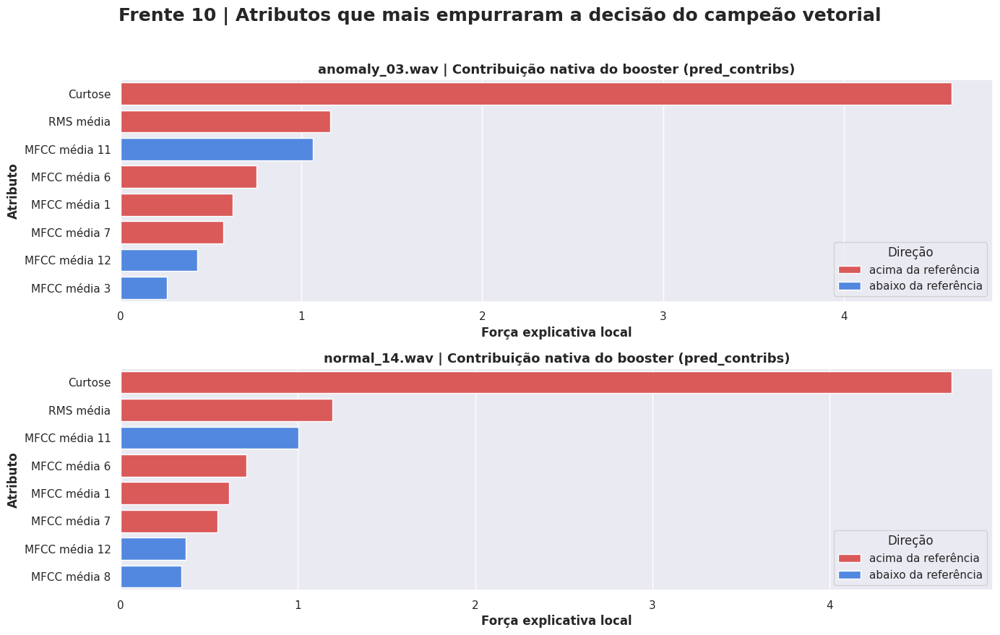

,Arquivo,Atributo,Valor agregado,Referência normal,Desvio,Contribuição,Direção
0,anomaly_03.wav,Curtose,0.129917,2.289938,-2.160021,4.593970,acima da referência
1,anomaly_03.wav,RMS média,0.029683,0.000058,0.029625,1.158680,acima da referência
2,anomaly_03.wav,MFCC média 11,-10.149714,0.552347,-10.702062,1.065271,abaixo da referência
3,anomaly_03.wav,MFCC média 6,-1.964628,6.461188,-8.425816,0.754313,acima da referência
4,anomaly_03.wav,MFCC média 1,-117.152122,-718.899231,601.747131,0.620209,acima da referência
5,anomaly_03.wav,MFCC média 7,1.632648,-3.936857,5.569506,0.567776,acima da referência
6,anomaly_03.wav,MFCC média 12,8.390207,0.947008,7.443199,0.423623,abaixo da referência
7,anomaly_03.wav,MFCC média 3,19.545313,-4.805863,24.351177,0.258062,abaixo da referência
8,normal_14.wav,Curtose,0.393155,2.289938,-1.896784,4.684989,acima da referência
9,normal_14.wav,RMS média,0.028675,0.000058,0.028617,1.194486,acima da referência



 ⚙️ Frente 11 - Edge/TinyML | RELATÓRIO FINAL - CAMPEÃO SUPERVISIONADO
Modelo: XGBoost | experimento: Exp 4 (Híbrido Antigo) | janelas perfiladas: 24
Latência total: 1.3698 ms | latência por janela: 0.0571 ms
Exportação leve: SIM | diretório: /content/front11_exports
Prontidão Edge: Alta | Prontidão TinyML: Média
Parecer: Excelente candidato para CPU de borda; TinyML ainda depende do alvo final.


,Campeão,Formato,Arquivo exportado,Tamanho (MB),Status,Observação
0,CAMPEÃO SUPERVISIONADO,metadata_json,/content/front11_exports/RELATÓRIO_FINAL_-_CAM...,0.000212,ok,
1,CAMPEÃO SUPERVISIONADO,xgboost_json,/content/front11_exports/RELATÓRIO_FINAL_-_CAM...,0.168091,ok,



🧪 Frente 8.2 não foi promovida; a validação final seguirá com os não supervisionados anteriores.
🧪 Frente 8.3 não foi promovida; a validação final seguirá com a melhor seleção até a Frente 8.2.

🏆 Campeão não supervisionado: HHT + UKF | GMM (Não-Sup.) | Exp 5 (Híbrido NMF) | Score DCASE Proxy=0.6798


Montando Exp 5 (Híbrido NMF) para teste cego: 100%|██████████| 25/25 [00:09<00:00,  2.63fatia/s]

🛰️ Frente 7 | OE real inativo | amostras auxiliares = 0
🧭 Frente 9 | agregação=topk_mean | topk=3 | janela=2.0s | overlap=0.50
🧠 Frente 10 | XAI ATIVO | arquivos=2 | top_atributos=8
⚙️ Frente 11 | Edge/TinyML ATIVO | perfil_windows=24 | export=SIM

📏 Métricas no teste cego (RELATÓRIO FINAL - CAMPEÃO NÃO SUPERVISIONADO):
   Acurácia:          0.3600
   Precisão:          0.3600
   Recall:            1.0000
   F1-Score:          0.5294
   AUC-ROC:           0.5347
   pAUC@0.1 (proxy):  0.0417
   Score DCASE Proxy: 0.0773

 RELATÓRIO FINAL - CAMPEÃO NÃO SUPERVISIONADO
Métrica de seleção do campeão: Score DCASE Proxy
Frente DSP campeã: HHT + UKF
Experimento campeão: Exp 5 (Híbrido NMF)
Modelo campeão: GMM (Não-Sup.)
Score de ranking: 0.6798
Limiar final: 87.332832 | Estratégia: max(gamma, empirical, mixup)
Gamma: 40.252843 | Empírico: 35.188499 | Mixup/OE: 87.332833
FPR alvo: 0.10 | Gamma shape: 3.4071 | Gamma scale: 6.8432
------------------------------------------------------------------

,Arquivo,Status,Confiança,Evidência,Margem ao limiar,Janelas avaliadas,Taxa de janelas anômalas,Rótulo_Real
0,anomaly_01.wav,🚨 ANOMALIA FORTE,1.0000,Alta,16705.5703,1,1.0000,1
1,anomaly_02.wav,🚨 ANOMALIA FORTE,1.0000,Alta,20196.9238,1,1.0000,1
2,anomaly_03.wav,🚨 ANOMALIA FORTE,1.0000,Alta,28015.8340,1,1.0000,1
3,anomaly_04.wav,🚨 ANOMALIA FORTE,1.0000,Alta,24152.7441,1,1.0000,1
4,anomaly_05.wav,🚨 ANOMALIA FORTE,1.0000,Alta,14169.5459,1,1.0000,1
5,anomaly_06.wav,🚨 ANOMALIA FORTE,1.0000,Alta,24072.0332,1,1.0000,1
6,anomaly_07.wav,🚨 ANOMALIA FORTE,1.0000,Alta,25347.5957,1,1.0000,1
7,anomaly_08.wav,🚨 ANOMALIA FORTE,1.0000,Alta,19883.1738,1,1.0000,1
8,anomaly_09.wav,🚨 ANOMALIA FORTE,1.0000,Alta,19532.5781,1,1.0000,1
9,normal_01.wav,🚨 ANOMALIA FORTE,1.0000,Alta,16891.3652,1,1.0000,0


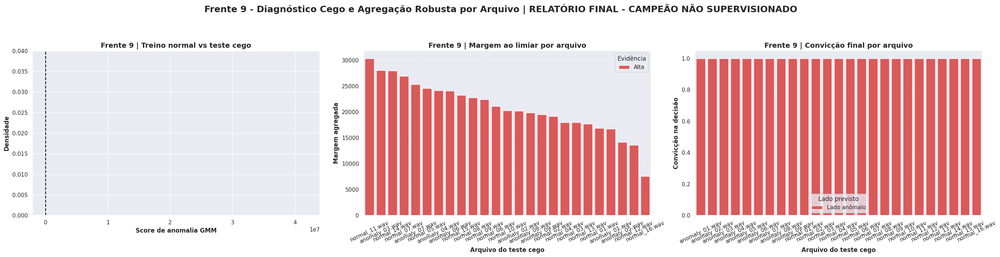


 🧠 Frente 10 - XAI do Modelo | RELATÓRIO FINAL - CAMPEÃO NÃO SUPERVISIONADO
Modelo explicado: GMM (Não-Sup.) | Exp 5 (Híbrido NMF) | arquivos-alvo=2 | janelas por arquivo=3


,Arquivo,Método XAI,Top fator,Contribuição do top fator,Margem agregada,Status Frente 9
0,anomaly_01.wav,Contribuição por atributo do GMM | componente ...,MFCC média 1,14877.743164,16705.570312,🚨 ANOMALIA FORTE
1,anomaly_02.wav,Contribuição por atributo do GMM | componente ...,MFCC média 1,18473.396484,20196.923828,🚨 ANOMALIA FORTE


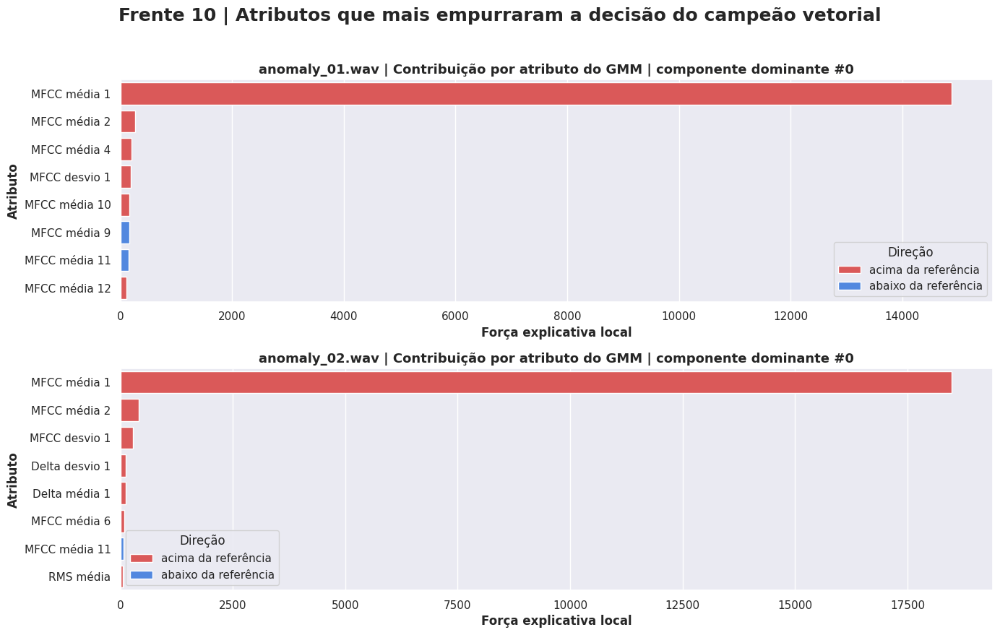

,Arquivo,Atributo,Valor agregado,Referência normal,Desvio,Contribuição,Direção
0,anomaly_01.wav,MFCC média 1,-267.987610,-718.729980,450.742371,14877.743164,acima da referência
1,anomaly_01.wav,MFCC média 2,26.375708,-7.512040,33.887749,265.221039,acima da referência
2,anomaly_01.wav,MFCC média 4,23.264196,3.596229,19.667969,204.066528,acima da referência
3,anomaly_01.wav,MFCC desvio 1,42.154392,10.797424,31.356968,190.763489,acima da referência
4,anomaly_01.wav,MFCC média 10,9.755635,-2.460861,12.216496,165.760208,acima da referência
5,anomaly_01.wav,MFCC média 9,-9.153646,2.300633,-11.454280,157.277634,abaixo da referência
6,anomaly_01.wav,MFCC média 11,-8.904041,0.866532,-9.770573,150.014679,abaixo da referência
7,anomaly_01.wav,MFCC média 12,8.184553,0.690624,7.493929,112.690239,acima da referência
8,anomaly_02.wav,MFCC média 1,-216.464600,-718.729980,502.265381,18473.396484,acima da referência
9,anomaly_02.wav,MFCC média 2,34.102913,-7.512040,41.614952,399.964386,acima da referência



 ⚙️ Frente 11 - Edge/TinyML | RELATÓRIO FINAL - CAMPEÃO NÃO SUPERVISIONADO
Modelo: GMM (Não-Sup.) | experimento: Exp 5 (Híbrido NMF) | janelas perfiladas: 24
Latência total: 1.3911 ms | latência por janela: 0.0580 ms
Exportação leve: SIM | diretório: /content/front11_exports
Prontidão Edge: Alta | Prontidão TinyML: Média
Parecer: Excelente candidato para CPU de borda; TinyML ainda depende do alvo final.


,Campeão,Formato,Arquivo exportado,Tamanho (MB),Status,Observação
0,CAMPEÃO NÃO SUPERVISIONADO,metadata_json,/content/front11_exports/RELATÓRIO_FINAL_-_CAM...,0.000232,ok,
1,CAMPEÃO NÃO SUPERVISIONADO,joblib,/content/front11_exports/RELATÓRIO_FINAL_-_CAM...,0.008201,ok,



 ⚙️ Frente 11 - Edge/TinyML | Resumo dos campeões


,Campeão,Modelo,Experimento,Frente DSP,Janelas perfiladas,Latência total (ms),Latência por janela (ms),Tamanho exportado total (MB),Prontidão Edge,Prontidão TinyML,Parecer
0,CAMPEÃO SUPERVISIONADO,XGBoost,Exp 4 (Híbrido Antigo),HHT + UKF,24,1.369839,0.057077,0.168303,Alta,Média,Excelente candidato para CPU de borda; TinyML ...
1,CAMPEÃO NÃO SUPERVISIONADO,GMM (Não-Sup.),Exp 5 (Híbrido NMF),HHT + UKF,24,1.391131,0.057964,0.008432,Alta,Média,Excelente candidato para CPU de borda; TinyML ...


,Campeão,Formato,Arquivo exportado,Tamanho (MB),Status,Observação
0,CAMPEÃO SUPERVISIONADO,metadata_json,/content/front11_exports/RELATÓRIO_FINAL_-_CAM...,0.000212,ok,
1,CAMPEÃO SUPERVISIONADO,xgboost_json,/content/front11_exports/RELATÓRIO_FINAL_-_CAM...,0.168091,ok,
2,CAMPEÃO NÃO SUPERVISIONADO,metadata_json,/content/front11_exports/RELATÓRIO_FINAL_-_CAM...,0.000232,ok,
3,CAMPEÃO NÃO SUPERVISIONADO,joblib,/content/front11_exports/RELATÓRIO_FINAL_-_CAM...,0.008201,ok,


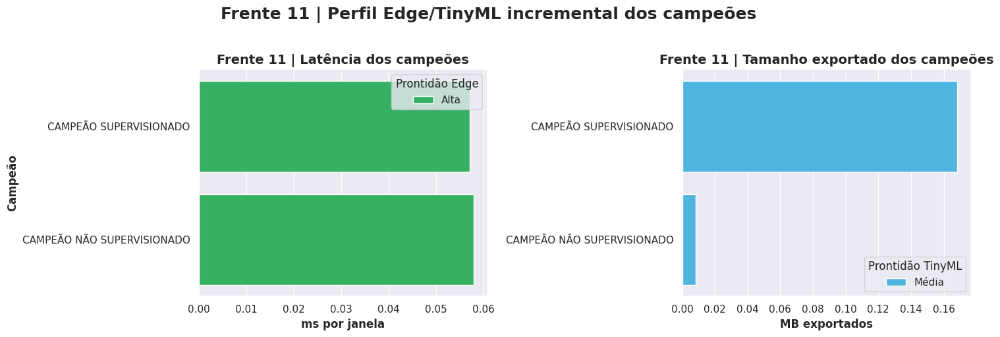


📚 Relatório evolutivo final das frentes (1 -> 11)


,Etapa,Ordem,Frente,Status,Objetivo,Configuração líder,Observação,Acurácia,Precisão,Recall,F1-Score,AUC-ROC,pAUC@0.1,Score DCASE Proxy,Latência (ms),Memória (MB),Tempo DSP (s),Acurácia teste cego,Precisão teste cego,Recall teste cego,F1 teste cego,AUC teste cego,pAUC teste cego,Score DCASE teste cego,Latência edge (ms/janela),Tamanho exportado edge (MB),Prontidão Edge,Prontidão TinyML,Parecer Edge
0,1,1.000000,Frente 1 - Regularização L2 + Gamma,Ativa,Base estatística do não supervisionado com limiar robusto.,HHT + UKF | E5 | NMF | GMM,Leitura referencial a partir do melhor não supervisionado com limiar calibrado.,0.6700,0.9636,0.3533,0.5171,0.8746,0.5560,0.6798,0.0145,0.1000,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,,,
1,2,2.000000,Frente 2 - CNN + GMM,Ativa,Arquitetura serial para embeddings visuais + detector probabilístico.,HHT + UKF | E6 | STFT | CNN+GMM,Modelo líder: CNN + GMM (Não-Sup.) | experimento: Exp 6 (STFT Log 64x64),0.5733,0.6719,0.2867,0.4019,0.6526,0.1816,0.2841,0.0234,4.3000,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,,,
2,3,3.000000,Frente 3 - DSP (HHT / UKF / HHT+UKF),Ativa,Saneamento acústico antes da extração de features.,HHT + UKF | E4 | Híbrido | XGB,DSP ativa nesta rodada: HHT + UKF | cache=MISS | tempo=10130.60s,0.9567,0.9536,0.9600,0.9568,0.9947,0.9482,0.9709,0.0162,0.4000,10130.60,nan,nan,nan,nan,nan,nan,nan,nan,nan,,,
3,4,4.000000,Frente 4 - Mixup,Ativa,Augmentação supervisionada e endurecimento incremental.,HHT + UKF | E4 | Híbrido | XGB,Modelo líder: XGBoost | experimento: Exp 4 (Híbrido Antigo),0.9567,0.9536,0.9600,0.9568,0.9947,0.9482,0.9709,0.0162,0.4000,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,,,
4,5,5.000000,Frente 5 - Avaliação Estrita,Ativa,"Ranking principal por pAUC@0.1, AUC e Score DCASE Proxy.",HHT + UKF | E4 | Híbrido | XGB,Modelo líder: XGBoost | experimento: Exp 4 (Híbrido Antigo),0.9567,0.9536,0.9600,0.9568,0.9947,0.9482,0.9709,0.0162,0.4000,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,,,
5,6,6.000000,Frente 6 - Protocolo Industrial,Ativa,Split por arquivo para evitar vazamento entre janelas irmãs.,HHT + UKF | E4 | Híbrido | XGB,Split por arquivo: ATIVO | arquivos compartilhados treino/teste=0,0.9567,0.9536,0.9600,0.9568,0.9947,0.9482,0.9709,0.0162,0.4000,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,,,
6,7,7.000000,Frente 7 - OE Real Acumulativo via DCASE,Inativa nesta execução,Exposição a exemplos reais fora da distribuição.,Sem configuração elegível nesta execução,Nenhuma configuração com OE real foi gerada nesta rodada.,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,,,
7,8,8.000000,Frente 8 - Baselines Não Supervisionados Incrementais,Ativa,"Comparação entre GMM, Isolation Forest e Mahalanobis.",HHT + UKF | E2 | MFCC | Mahal,Modelo líder: Mahalanobis (Não-Sup.) | experimento: Exp 2 (MFCC Dinâmico),0.7933,0.8056,0.7733,0.7891,0.8986,0.5418,0.6760,0.0493,0.0500,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,,,
8,8.2,8.200000,Frente 8.2 - LSTM-AE com promoção,Monitorada,Autoencoder sequencial promovido apenas se houver ganho real.,HHT + UKF | E6 | STFT | LSTM-AE,Promoção=NÃO | Δ score=-0.3291,0.6033,0.7183,0.3400,0.4615,0.5407,0.2596,0.3507,0.4012,2.6000,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,,,
9,8.3,8.300000,Frente 8.3 - VAE com promoção,Monitorada,Autoencoder variacional promovido apenas se houver ganho real.,HHT + UKF | E6 | STFT | VAE,Promoção=NÃO | Δ score=-0.1205,0.7033,0.8280,0.5133,0.6337,0.7715,0.4387,0.5593,0.9551,3.1000,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,,,


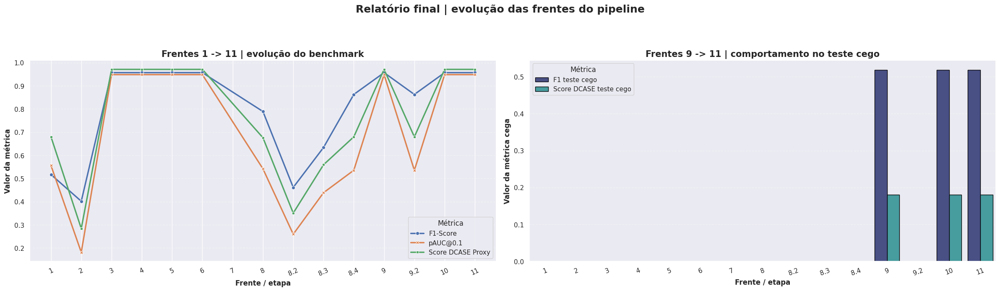

In [ ]:
# =========================================================
# FINAL NOTEBOOK | Validação final dos campeões
# Papel deste bloco:
# - refita os campeões
# - mede teste cego, XAI e Edge/TinyML
# - fecha a evolução das frentes 1 a 11
# =========================================================
# 3. PASSO: Predição com os Modelos Campeões (Supervisionado e Não-Supervisionado)

# Reforço de contexto para permitir reexecução isolada da validação final.
import gc
import json
import os
import shutil
import time
from pathlib import Path

import joblib
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from sklearn.ensemble import IsolationForest
from sklearn.mixture import GaussianMixture
from torch.utils.data import DataLoader, TensorDataset

SR_TARGET = int(globals().get('SR_TARGET', 10000))

MODELOS_SUPERVISIONADOS = globals().get('MODELOS_SUPERVISIONADOS', {'XGBoost', 'GRU'})
MODELOS_FRENTE8 = globals().get('MODELOS_FRENTE8', {'Isolation Forest (Não-Sup.)', 'Mahalanobis (Não-Sup.)'})
MODELOS_FRENTE82 = globals().get('MODELOS_FRENTE82', {'LSTM-AE (Não-Sup.)'})
MODELOS_FRENTE83 = globals().get('MODELOS_FRENTE83', {'VAE (Não-Sup.)'})
MODELOS_NAO_SUPERVISIONADOS = globals().get('MODELOS_NAO_SUPERVISIONADOS', {'GMM (Não-Sup.)', 'Tiny-AST', 'CNN + GMM (Não-Sup.)'} | MODELOS_FRENTE8 | MODELOS_FRENTE82 | MODELOS_FRENTE83)

device_validacao = device if 'device' in globals() else (get_best_device() if 'get_best_device' in globals() else torch.device('cpu'))
batch_validacao = int(globals().get('BATCH_SIZE', 16))
epochs_gru_validacao = int(globals().get('EPOCHS_GRU', 12))
epochs_ast_validacao = int(globals().get('EPOCHS_AST', 12))
embed_pool_validacao = int(globals().get('EMBED_POOL', 2))

FRONT9_ENABLE = os.getenv('AAD_FRONT9_ENABLE', '1').strip().lower() in {'1', 'true', 'yes', 'sim'}
FRONT9_LABEL = 'Frente 9 - Diagnóstico Cego e Agregação Robusta por Arquivo'
FRONT9_BLIND_MAX_LEN_S = float(os.getenv('AAD_FRONT9_BLIND_MAX_LEN_S', '2.0'))
FRONT9_WINDOW_SIZE = float(os.getenv('AAD_FRONT9_WINDOW_SIZE', '2.0'))
FRONT9_WINDOW_OVERLAP = float(os.getenv('AAD_FRONT9_WINDOW_OVERLAP', '0.5'))
FRONT9_AGGREGATION = os.getenv('AAD_FRONT9_AGGREGATION', 'topk_mean').strip().lower()
FRONT9_TOPK = int(os.getenv('AAD_FRONT9_TOPK', '3'))
FRONT9_MARGIN_BAND = float(os.getenv('AAD_FRONT9_MARGIN_BAND', '0.08'))
FRONT9_SHIFT_ALERT_Z = float(os.getenv('AAD_FRONT9_SHIFT_ALERT_Z', '2.5'))
FRONT9_KS_ALERT = float(os.getenv('AAD_FRONT9_KS_ALERT', '0.60'))
FRONT9_MIN_SCALE = float(os.getenv('AAD_FRONT9_MIN_SCALE', '1e-3'))
FRONT10_ENABLE = os.getenv('AAD_FRONT10_ENABLE', '1').strip().lower() in {'1', 'true', 'yes', 'sim'}
FRONT10_LABEL = 'Frente 10 - XAI do Modelo'
FRONT10_MAX_FILES = int(os.getenv('AAD_FRONT10_MAX_FILES', '2'))
FRONT10_TOP_FEATURES = int(os.getenv('AAD_FRONT10_TOP_FEATURES', '8'))
FRONT10_MAX_WINDOWS_PER_FILE = int(os.getenv('AAD_FRONT10_MAX_WINDOWS_PER_FILE', '3'))
FRONT10_USE_ABS_GRAD = os.getenv('AAD_FRONT10_USE_ABS_GRAD', '1').strip().lower() in {'1', 'true', 'yes', 'sim'}
FRONT10_SALIENCY_QUANTILE = float(os.getenv('AAD_FRONT10_SALIENCY_QUANTILE', '0.75'))
FRONT11_ENABLE = os.getenv('AAD_FRONT11_ENABLE', '1').strip().lower() in {'1', 'true', 'yes', 'sim'}
FRONT11_LABEL = 'Frente 11 - Edge/TinyML'
FRONT11_EXPORT = os.getenv('AAD_FRONT11_EXPORT', '1').strip().lower() in {'1', 'true', 'yes', 'sim'}
FRONT11_EXPORT_DIR = os.getenv('AAD_FRONT11_EXPORT_DIR', 'front11_exports').strip()
FRONT11_PROFILE_WINDOWS = int(os.getenv('AAD_FRONT11_PROFILE_WINDOWS', '24'))
FRONT11_PROFILE_ROUNDS = int(os.getenv('AAD_FRONT11_PROFILE_ROUNDS', '2'))
FRONT11_TRY_TORCHSCRIPT = os.getenv('AAD_FRONT11_TRY_TORCHSCRIPT', '1').strip().lower() in {'1', 'true', 'yes', 'sim'}
FRONT11_TRY_ONNX = os.getenv('AAD_FRONT11_TRY_ONNX', '0').strip().lower() in {'1', 'true', 'yes', 'sim'}

if 'df_bench' not in globals():
    raise RuntimeError("Variável 'df_bench' não encontrada. Execute a célula do benchmarking antes desta validação final.")
if 'experimentos_por_frente' not in globals():
    raise RuntimeError("Variável 'experimentos_por_frente' não encontrada. Execute a etapa 1 antes desta validação final.")
if 'front_dataset_cache' not in globals():
    raise RuntimeError("Variável 'front_dataset_cache' não encontrada. Execute a etapa 1 antes desta validação final.")
if 'y_win' not in globals():
    raise RuntimeError("Variável 'y_win' não encontrada. Execute as células de preparação de dados antes desta validação final.")
if 'X_blind' not in globals() or len(X_blind) == 0:
    raise RuntimeError("A lista 'X_blind' está vazia. A pasta de teste precisa ser carregada antes da validação final.")
if df_bench.empty:
    raise RuntimeError("O DataFrame 'df_bench' está vazio. Nenhum modelo foi treinado com sucesso para a validação final.")

front_id_col = 'Frente DSP (ID)' if 'Frente DSP (ID)' in df_bench.columns else None
metrica_ranking_validacao = METRICA_RANKING_BENCHMARK if 'METRICA_RANKING_BENCHMARK' in globals() and METRICA_RANKING_BENCHMARK in df_bench.columns else 'F1-Score'

file_names_blind = blind_file_names if 'blind_file_names' in globals() and len(blind_file_names) == len(X_blind) else [f'Arquivo_{i + 1:02d}' for i in range(len(X_blind))]


def resolve_front_name_from_row(row):
    if front_id_col and front_id_col in row.index:
        return row[front_id_col]
    return globals().get('FRONT_DSP_REFERENCIA', globals().get('DSP_FRONT_ATIVO', 'hht'))


def resolve_front_label(front_name):
    return globals().get('DSP_FRONT_LABELS', {}).get(front_name, front_name)



def normalize_scores(scores):
    scores = np.asarray(scores, dtype=np.float32)
    return (scores - scores.min()) / (scores.max() - scores.min() + 1e-9)


def infer_reference_scale(reference_scores=None, threshold=0.0, fallback=0.10):
    reference_scores = np.asarray(reference_scores if reference_scores is not None else [], dtype=np.float32)
    if reference_scores.size > 1:
        q75, q25 = np.percentile(reference_scores, [75, 25])
        scale = float(q75 - q25)
        if np.isfinite(scale) and scale > 0:
            return max(scale, FRONT9_MIN_SCALE)
        scale = float(np.std(reference_scores))
        if np.isfinite(scale) and scale > 0:
            return max(scale, FRONT9_MIN_SCALE)
    fallback_scale = max(abs(float(threshold)) * fallback, FRONT9_MIN_SCALE)
    return float(fallback_scale)


def anomaly_confidence_from_margin(raw_scores, threshold, reference_scores=None):
    raw_scores = np.asarray(raw_scores, dtype=np.float32)
    scale = infer_reference_scale(reference_scores, threshold=threshold)
    margins = raw_scores - float(threshold)
    confidence = 1.0 / (1.0 + np.exp(-margins / scale))
    return np.asarray(confidence, dtype=np.float32), np.asarray(margins, dtype=np.float32), float(scale)


def aggregate_front9(values, mode='topk_mean', topk=3):
    values = np.asarray(values, dtype=np.float32)
    if values.size == 0:
        return np.nan

    mode = str(mode).lower()
    if mode == 'max':
        return float(np.max(values))
    if mode == 'p95':
        return float(np.percentile(values, 95))
    if mode == 'mean':
        return float(np.mean(values))
    if mode == 'median':
        return float(np.median(values))

    k = int(max(1, min(int(topk), values.size)))
    top_values = np.sort(values)[-k:]
    return float(np.mean(top_values))


def classify_front9_evidence(pred_value, confidence_value, margin_value, scale_value):
    norm_margin = abs(float(margin_value)) / max(float(scale_value), FRONT9_MIN_SCALE)

    if norm_margin >= 2.0 or confidence_value >= 0.90 or confidence_value <= 0.10:
        level = 'Alta'
    elif norm_margin >= 0.80 or confidence_value >= 0.75 or confidence_value <= 0.25:
        level = 'Média'
    else:
        level = 'Baixa'

    if int(pred_value) == 1:
        if level == 'Alta':
            status = '🚨 ANOMALIA FORTE'
        elif level == 'Média':
            status = '⚠️ ANOMALIA PROVÁVEL'
        else:
            status = '🟡 REVISAR | anomalia fraca'
    else:
        if level == 'Alta':
            status = '✅ NORMAL FORTE'
        elif level == 'Média':
            status = '🟢 NORMAL PROVÁVEL'
        else:
            status = '🟡 REVISAR | margem curta'

    return status, level


def prepare_blind_dsp_signals(signals, front_name, sr=SR_TARGET):
    max_len = None if FRONT9_BLIND_MAX_LEN_S <= 0 else int(FRONT9_BLIND_MAX_LEN_S * sr)
    if 'process_signals_with_front' in globals():
        processed = process_signals_with_front(
            signals,
            front_name,
            sr=sr,
            max_len=max_len,
            desc_prefix='Preparando teste cego',
        )
        return [np.asarray(sig, dtype=np.float32) for sig in processed]

    blind_dsp = []
    dsp_func = globals().get('DSP_FRONT_OPTIONS', {}).get(front_name, apply_hht_denoising)

    for sig in tqdm(signals, desc=f"Preparando teste cego ({resolve_front_label(front_name)})", unit="arquivo"):
        try:
            signal_short = sig.astype(np.float32) if max_len is None else sig[:min(len(sig), max_len)].astype(np.float32)
            blind_dsp.append(np.asarray(dsp_func(signal_short, sr=sr), dtype=np.float32))
        except Exception:
            blind_dsp.append(sig.astype(np.float32) if max_len is None else sig[:min(len(sig), max_len)].astype(np.float32))

    return blind_dsp


def build_experiment_features(audio_segments, experiment_name, sr=SR_TARGET):
    if 'extract_all_experiment_features' not in globals():
        raise RuntimeError("Função 'extract_all_experiment_features' não encontrada. Execute a célula 10 antes da validação final.")

    features = []
    for audio_segment in tqdm(audio_segments, desc=f"Montando {experiment_name} para teste cego", unit="fatia"):
        feature_map = extract_all_experiment_features(audio_segment, sr=sr)
        features.append(feature_map[experiment_name])
    return np.array(features, dtype=np.float32)


def build_full_mixup_for_experiment(front_name, experiment_name):
    experimentos_front = experimentos_por_frente[front_name]
    reference = np.asarray(experimentos_front[experiment_name]['X'], dtype=np.float32)

    if not MIXUP_ENABLED:
        return np.empty((0,) + reference.shape[1:], dtype=np.float32)

    front_cache = front_dataset_cache.get(front_name)
    if front_cache is None:
        print(f"⚠️ Cache da frente {resolve_front_label(front_name)} não encontrado. O Mixup final será ignorado.")
        return np.empty((0,) + reference.shape[1:], dtype=np.float32)

    normal_signals = [
        np.asarray(sig, dtype=np.float32)
        for sig, label in zip(front_cache['signals'], front_cache['labels'])
        if int(label) == 0
    ]
    if len(normal_signals) == 0:
        return np.empty((0,) + reference.shape[1:], dtype=np.float32)

    X_norm_windows, _ = apply_sliding_window_to_list(
        normal_signals,
        np.zeros(len(normal_signals), dtype=np.int64),
        sr=SR_TARGET,
        window_size=2.0,
    )
    X_mix_audio_full, _, _ = create_mixup_dataset(
        X_norm_windows,
        sr=SR_TARGET,
        mixup_ratio=MIXUP_RATIO,
        alpha=MIXUP_ALPHA,
        max_samples=MIXUP_MAX_SAMPLES,
        seed=MIXUP_SEED + 101,
    )

    if len(X_mix_audio_full) == 0:
        return np.empty((0,) + reference.shape[1:], dtype=np.float32)
    return build_experiment_features(X_mix_audio_full, experiment_name, sr=SR_TARGET)


def resolve_unsupervised_models_for_final_validation():
    all_unsup = set(MODELOS_NAO_SUPERVISIONADOS)
    front82_models = set(MODELOS_FRENTE82)
    front83_models = set(MODELOS_FRENTE83)

    if 'MODELOS_NAO_SUPERVISIONADOS_VALIDACAO' in globals():
        return set(globals()['MODELOS_NAO_SUPERVISIONADOS_VALIDACAO'])

    metric = metrica_ranking_validacao
    selected = set(all_unsup) - front82_models - front83_models

    df_front82 = df_bench[df_bench['Modelo'].isin(front82_models)].sort_values(by=metric, ascending=False).head(1)
    df_previous_82 = df_bench[df_bench['Modelo'].isin(selected)].sort_values(by=metric, ascending=False).head(1)
    min_gain_82 = float(globals().get('FRONT82_MIN_GAIN', 0.0))

    if df_front82.empty:
        front82_promoted = False
        front82_delta = np.nan
    elif df_previous_82.empty:
        front82_promoted = True
        front82_delta = np.nan
    else:
        front82_delta = float(df_front82.iloc[0][metric] - df_previous_82.iloc[0][metric])
        front82_promoted = bool(front82_delta > min_gain_82)

    if front82_promoted:
        selected = set(selected) | front82_models

    df_front83 = df_bench[df_bench['Modelo'].isin(front83_models)].sort_values(by=metric, ascending=False).head(1)
    df_previous_83 = df_bench[df_bench['Modelo'].isin(selected)].sort_values(by=metric, ascending=False).head(1)
    min_gain_83 = float(globals().get('FRONT83_MIN_GAIN', 0.0))

    if df_front83.empty:
        front83_promoted = False
        front83_delta = np.nan
    elif df_previous_83.empty:
        front83_promoted = True
        front83_delta = np.nan
    else:
        front83_delta = float(df_front83.iloc[0][metric] - df_previous_83.iloc[0][metric])
        front83_promoted = bool(front83_delta > min_gain_83)

    if front83_promoted:
        selected = set(selected) | front83_models

    globals()['FRONT82_PROMOTED'] = bool(front82_promoted)
    globals()['FRONT82_DELTA_SCORE'] = float(front82_delta) if np.isfinite(front82_delta) else np.nan
    globals()['FRONT83_PROMOTED'] = bool(front83_promoted)
    globals()['FRONT83_DELTA_SCORE'] = float(front83_delta) if np.isfinite(front83_delta) else np.nan
    globals()['MODELOS_NAO_SUPERVISIONADOS_VALIDACAO'] = selected
    return selected



def fit_final_model(best_row):
    front_name = resolve_front_name_from_row(best_row)
    front_label = resolve_front_label(front_name)
    experimentos_front = experimentos_por_frente[front_name]
    best_exp_name = best_row['Experimento']
    best_model_type = best_row['Modelo']
    best_X_data = np.asarray(experimentos_front[best_exp_name]['X'], dtype=np.float32)
    best_mixup_full = build_full_mixup_for_experiment(front_name, best_exp_name)
    best_oe_real_full = np.asarray(
        experimentos_front[best_exp_name].get('X_oe_real_train', np.empty((0,), dtype=np.float32)),
        dtype=np.float32,
    )

    if best_model_type == 'XGBoost':
        X_sup, y_sup = merge_supervised_mixup(best_X_data, y_win, best_mixup_full)
        modelo = fit_xgb_with_runtime(X_sup, y_sup)
        return {
            'tipo': best_model_type,
            'experimento': best_exp_name,
            'modelo': modelo,
            'front_name': front_name,
            'front_label': front_label,
            'runtime_label': getattr(modelo, '_aad_runtime_label', 'CPU'),
            'score_label': 'Probabilidade de anomalia',
            'score_kind': 'probability',
        }

    if best_model_type == 'GRU':
        X_seq = np.ascontiguousarray(best_X_data.squeeze(1))
        X_mix_seq = np.ascontiguousarray(best_mixup_full.squeeze(1)) if len(best_mixup_full) > 0 else np.empty((0,) + X_seq.shape[1:], dtype=np.float32)
        X_sup, y_sup = merge_supervised_mixup(X_seq, y_win, X_mix_seq)
        modelo = AnomalyGRU(input_dim=64, hidden_dim=64, num_layers=1, output_dim=2).to(device_validacao)
        opt = optim.Adam(modelo.parameters(), lr=0.005, weight_decay=1e-4)
        crit = nn.CrossEntropyLoss()
        loader = DataLoader(
            TensorDataset(torch.from_numpy(X_sup), torch.from_numpy(y_sup.astype(np.int64))),
            batch_size=batch_validacao,
            shuffle=True
        )

        modelo.train()
        for _ in range(epochs_gru_validacao):
            for batch_x, batch_y in loader:
                batch_x = batch_x.to(device_validacao)
                batch_y = batch_y.to(device_validacao)
                opt.zero_grad()
                logits = modelo(batch_x)
                loss = crit(logits, batch_y)
                loss.backward()
                opt.step()

        return {
            'tipo': best_model_type,
            'experimento': best_exp_name,
            'modelo': modelo,
            'front_name': front_name,
            'front_label': front_label,
            'score_label': 'Probabilidade de anomalia',
            'score_kind': 'probability',
        }

    if best_model_type == 'GMM (Não-Sup.)':
        X_norm = best_X_data[y_win == 0]
        if len(X_norm) == 0:
            raise RuntimeError(f"Sem amostras normais para treinar o campeão não supervisionado em {best_exp_name}.")
        gmm = GaussianMixture(n_components=3, covariance_type='diag', reg_covar=1e-6, random_state=42)
        gmm.fit(X_norm)
        scores_train = -gmm.score_samples(X_norm)
        scores_mix = -gmm.score_samples(best_mixup_full) if len(best_mixup_full) > 0 else np.empty((0,), dtype=np.float32)
        scores_oe = -gmm.score_samples(best_oe_real_full) if len(best_oe_real_full) > 0 else np.empty((0,), dtype=np.float32)
        exposure_scores, exposure_label = merge_auxiliary_exposure_scores(
            ('mixup', scores_mix),
            ('oe_real', scores_oe),
        )
        threshold_info = compose_strict_threshold(
            scores_train,
            exposure_scores,
            target_fpr=THRESHOLD_TARGET_FPR,
            pseudo_label=exposure_label,
        )
        return {
            'tipo': best_model_type,
            'experimento': best_exp_name,
            'modelo': gmm,
            'threshold': threshold_info['threshold'],
            'threshold_info': threshold_info,
            'front_name': front_name,
            'front_label': front_label,
            'score_label': 'Score de anomalia GMM',
            'score_kind': 'neg_log_likelihood',
            'reference_normal_scores': np.asarray(scores_train, dtype=np.float32),
            'reference_mixup_scores': np.asarray(scores_mix, dtype=np.float32),
            'reference_oe_real_scores': np.asarray(scores_oe, dtype=np.float32),
        }

    if best_model_type == 'Isolation Forest (Não-Sup.)':
        X_norm = best_X_data[y_win == 0]
        if len(X_norm) == 0:
            raise RuntimeError(f"Sem amostras normais para treinar o campeão não supervisionado em {best_exp_name}.")
        iso = IsolationForest(
            n_estimators=int(globals().get('FRONT8_IFOREST_TREES', 160)),
            contamination='auto',
            random_state=42,
            n_jobs=CPU_THREADS,
        )
        iso.fit(X_norm)
        scores_train = -iso.score_samples(X_norm)
        scores_mix = -iso.score_samples(best_mixup_full) if len(best_mixup_full) > 0 else np.empty((0,), dtype=np.float32)
        scores_oe = -iso.score_samples(best_oe_real_full) if len(best_oe_real_full) > 0 else np.empty((0,), dtype=np.float32)
        exposure_scores, exposure_label = merge_auxiliary_exposure_scores(
            ('mixup', scores_mix),
            ('oe_real', scores_oe),
        )
        threshold_info = compose_strict_threshold(
            scores_train,
            exposure_scores,
            target_fpr=THRESHOLD_TARGET_FPR,
            pseudo_label=exposure_label,
        )
        return {
            'tipo': best_model_type,
            'experimento': best_exp_name,
            'modelo': iso,
            'threshold': threshold_info['threshold'],
            'threshold_info': threshold_info,
            'front_name': front_name,
            'front_label': front_label,
            'score_label': 'Score de anomalia Isolation Forest',
            'score_kind': 'anomaly_score',
            'reference_normal_scores': np.asarray(scores_train, dtype=np.float32),
            'reference_mixup_scores': np.asarray(scores_mix, dtype=np.float32),
            'reference_oe_real_scores': np.asarray(scores_oe, dtype=np.float32),
        }

    if best_model_type == 'Mahalanobis (Não-Sup.)':
        X_norm = best_X_data[y_win == 0]
        if len(X_norm) == 0:
            raise RuntimeError(f"Sem amostras normais para treinar o campeão não supervisionado em {best_exp_name}.")
        mean_vec, precision = fit_mahalanobis_reference(
            X_norm,
            reg=float(globals().get('FRONT8_MAHAL_REG', 1e-3)),
        )
        scores_train = mahalanobis_scores(X_norm, mean_vec, precision)
        scores_mix = mahalanobis_scores(best_mixup_full, mean_vec, precision) if len(best_mixup_full) > 0 else np.empty((0,), dtype=np.float32)
        scores_oe = mahalanobis_scores(best_oe_real_full, mean_vec, precision) if len(best_oe_real_full) > 0 else np.empty((0,), dtype=np.float32)
        exposure_scores, exposure_label = merge_auxiliary_exposure_scores(
            ('mixup', scores_mix),
            ('oe_real', scores_oe),
        )
        threshold_info = compose_strict_threshold(
            scores_train,
            exposure_scores,
            target_fpr=THRESHOLD_TARGET_FPR,
            pseudo_label=exposure_label,
        )
        return {
            'tipo': best_model_type,
            'experimento': best_exp_name,
            'mean_vec': mean_vec,
            'precision': precision,
            'threshold': threshold_info['threshold'],
            'threshold_info': threshold_info,
            'front_name': front_name,
            'front_label': front_label,
            'score_label': 'Distância de Mahalanobis',
            'score_kind': 'distance',
            'reference_normal_scores': np.asarray(scores_train, dtype=np.float32),
            'reference_mixup_scores': np.asarray(scores_mix, dtype=np.float32),
            'reference_oe_real_scores': np.asarray(scores_oe, dtype=np.float32),
        }

    if best_model_type == 'LSTM-AE (Não-Sup.)':
        X_norm_img = np.ascontiguousarray(best_X_data[y_win == 0])
        if len(X_norm_img) == 0:
            raise RuntimeError(f"Sem amostras normais para treinar o campeão não supervisionado em {best_exp_name}.")
        X_norm_seq = np.ascontiguousarray(X_norm_img.squeeze(1))
        X_mix_seq = np.ascontiguousarray(best_mixup_full.squeeze(1)) if len(best_mixup_full) > 0 else np.empty((0,) + X_norm_seq.shape[1:], dtype=np.float32)
        X_oe_seq = np.ascontiguousarray(best_oe_real_full.squeeze(1)) if len(best_oe_real_full) > 0 else np.empty((0,) + X_norm_seq.shape[1:], dtype=np.float32)

        modelo = LSTMAE(
            input_dim=X_norm_seq.shape[-1],
            hidden_dim=int(globals().get('FRONT82_LSTM_HIDDEN', 64)),
            num_layers=int(globals().get('FRONT82_LSTM_LAYERS', 1)),
        ).to(device_validacao)
        modelo = train_lstm_autoencoder(
            modelo,
            X_norm_seq,
            X_oe_real=X_oe_seq if len(X_oe_seq) > 0 else None,
            batch_size=batch_validacao,
            epochs=int(globals().get('FRONT82_EPOCHS', 8)),
            device=device_validacao,
            lr=0.001,
            weight_decay=1e-4,
            oe_weight=globals().get('OE_REAL_LOSS_WEIGHT', 0.15) if len(X_oe_seq) > 0 else 0.0,
            oe_margin=globals().get('OE_REAL_MARGIN', 0.08),
        )

        err_tr = reconstruction_errors_lstm(modelo, X_norm_seq, batch_validacao, device_validacao)
        err_mix = reconstruction_errors_lstm(modelo, X_mix_seq, batch_validacao, device_validacao) if len(X_mix_seq) > 0 else np.empty((0,), dtype=np.float32)
        err_oe = reconstruction_errors_lstm(modelo, X_oe_seq, batch_validacao, device_validacao) if len(X_oe_seq) > 0 else np.empty((0,), dtype=np.float32)
        exposure_scores, exposure_label = merge_auxiliary_exposure_scores(
            ('mixup', err_mix),
            ('oe_real', err_oe),
        )
        threshold_info = compose_strict_threshold(
            err_tr,
            exposure_scores,
            target_fpr=THRESHOLD_TARGET_FPR,
            pseudo_label=exposure_label,
        )
        return {
            'tipo': best_model_type,
            'experimento': best_exp_name,
            'modelo': modelo,
            'threshold': threshold_info['threshold'],
            'threshold_info': threshold_info,
            'front_name': front_name,
            'front_label': front_label,
            'score_label': 'Erro de reconstrução LSTM-AE',
            'score_kind': 'reconstruction_error',
            'reference_normal_scores': np.asarray(err_tr, dtype=np.float32),
            'reference_mixup_scores': np.asarray(err_mix, dtype=np.float32),
            'reference_oe_real_scores': np.asarray(err_oe, dtype=np.float32),
        }

    if best_model_type == 'VAE (Não-Sup.)':
        X_norm = np.ascontiguousarray(best_X_data[y_win == 0])
        if len(X_norm) == 0:
            raise RuntimeError(f"Sem amostras normais para treinar o campeão não supervisionado em {best_exp_name}.")

        modelo = ConvVAE(
            input_channels=int(X_norm.shape[1]),
            input_h=int(X_norm.shape[-2]),
            input_w=int(X_norm.shape[-1]),
            latent_dim=int(globals().get('FRONT83_LATENT_DIM', 24)),
            base_channels=16,
        ).to(device_validacao)
        modelo = train_vae_autoencoder(
            modelo,
            X_norm,
            X_oe_real=np.ascontiguousarray(best_oe_real_full) if len(best_oe_real_full) > 0 else None,
            batch_size=batch_validacao,
            epochs=int(globals().get('FRONT83_EPOCHS', 6)),
            device=device_validacao,
            lr=0.001,
            weight_decay=1e-4,
            beta=float(globals().get('FRONT83_BETA', 0.002)),
            oe_weight=globals().get('OE_REAL_LOSS_WEIGHT', 0.15) if len(best_oe_real_full) > 0 else 0.0,
            oe_margin=globals().get('OE_REAL_MARGIN', 0.08),
        )

        err_tr = reconstruction_errors_vae(modelo, X_norm, batch_validacao, device_validacao)
        err_mix = reconstruction_errors_vae(modelo, np.ascontiguousarray(best_mixup_full), batch_validacao, device_validacao) if len(best_mixup_full) > 0 else np.empty((0,), dtype=np.float32)
        err_oe = reconstruction_errors_vae(modelo, np.ascontiguousarray(best_oe_real_full), batch_validacao, device_validacao) if len(best_oe_real_full) > 0 else np.empty((0,), dtype=np.float32)
        exposure_scores, exposure_label = merge_auxiliary_exposure_scores(
            ('mixup', err_mix),
            ('oe_real', err_oe),
        )
        threshold_info = compose_strict_threshold(
            err_tr,
            exposure_scores,
            target_fpr=THRESHOLD_TARGET_FPR,
            pseudo_label=exposure_label,
        )
        return {
            'tipo': best_model_type,
            'experimento': best_exp_name,
            'modelo': modelo,
            'threshold': threshold_info['threshold'],
            'threshold_info': threshold_info,
            'front_name': front_name,
            'front_label': front_label,
            'score_label': 'Erro de reconstrução VAE',
            'score_kind': 'reconstruction_error',
            'reference_normal_scores': np.asarray(err_tr, dtype=np.float32),
            'reference_mixup_scores': np.asarray(err_mix, dtype=np.float32),
            'reference_oe_real_scores': np.asarray(err_oe, dtype=np.float32),
        }

    if best_model_type == 'Tiny-AST':
        X_norm = np.ascontiguousarray(best_X_data[y_win == 0])
        if len(X_norm) == 0:
            raise RuntimeError(f"Sem amostras normais para treinar o campeão não supervisionado em {best_exp_name}.")

        modelo = TinyAST(num_mels=64, time_steps=64).to(device_validacao)
        modelo = train_tinyast_autoencoder(
            modelo,
            X_norm,
            X_oe_real=np.ascontiguousarray(best_oe_real_full) if len(best_oe_real_full) > 0 else None,
            batch_size=batch_validacao,
            epochs=epochs_ast_validacao,
            device=device_validacao,
            lr=0.001,
            weight_decay=1e-4,
            oe_weight=globals().get('OE_REAL_LOSS_WEIGHT', 0.15) if len(best_oe_real_full) > 0 else 0.0,
            oe_margin=globals().get('OE_REAL_MARGIN', 0.08),
        )

        err_tr = reconstruction_errors(modelo, X_norm, batch_validacao, device_validacao)
        err_mix = reconstruction_errors(modelo, np.ascontiguousarray(best_mixup_full), batch_validacao, device_validacao) if len(best_mixup_full) > 0 else np.empty((0,), dtype=np.float32)
        err_oe = reconstruction_errors(modelo, np.ascontiguousarray(best_oe_real_full), batch_validacao, device_validacao) if len(best_oe_real_full) > 0 else np.empty((0,), dtype=np.float32)
        exposure_scores, exposure_label = merge_auxiliary_exposure_scores(
            ('mixup', err_mix),
            ('oe_real', err_oe),
        )
        threshold_info = compose_strict_threshold(
            err_tr,
            exposure_scores,
            target_fpr=THRESHOLD_TARGET_FPR,
            pseudo_label=exposure_label,
        )
        return {
            'tipo': best_model_type,
            'experimento': best_exp_name,
            'modelo': modelo,
            'threshold': threshold_info['threshold'],
            'threshold_info': threshold_info,
            'front_name': front_name,
            'front_label': front_label,
            'score_label': 'Erro de reconstrução Tiny-AST',
            'score_kind': 'reconstruction_error',
            'reference_normal_scores': np.asarray(err_tr, dtype=np.float32),
            'reference_mixup_scores': np.asarray(err_mix, dtype=np.float32),
            'reference_oe_real_scores': np.asarray(err_oe, dtype=np.float32),
        }

    if best_model_type == 'CNN + GMM (Não-Sup.)':
        X_norm = np.ascontiguousarray(best_X_data[y_win == 0])
        if len(X_norm) == 0:
            raise RuntimeError(f"Sem amostras normais para treinar o campeão não supervisionado em {best_exp_name}.")

        encoder_model = TinyAST(num_mels=64, time_steps=64).to(device_validacao)
        encoder_model = train_tinyast_autoencoder(
            encoder_model,
            X_norm,
            X_oe_real=np.ascontiguousarray(best_oe_real_full) if len(best_oe_real_full) > 0 else None,
            batch_size=batch_validacao,
            epochs=epochs_ast_validacao,
            device=device_validacao,
            lr=0.001,
            weight_decay=1e-4,
            oe_weight=globals().get('OE_REAL_LOSS_WEIGHT', 0.15) if len(best_oe_real_full) > 0 else 0.0,
            oe_margin=globals().get('OE_REAL_MARGIN', 0.08),
        )

        embeds_train = extract_embeddings(encoder_model, X_norm, batch_validacao, device_validacao, embed_pool_validacao)
        gmm = GaussianMixture(n_components=3, covariance_type='diag', reg_covar=1e-6, random_state=42)
        gmm.fit(embeds_train)
        scores_train = -gmm.score_samples(embeds_train)

        if len(best_mixup_full) > 0:
            embeds_mix = extract_embeddings(encoder_model, np.ascontiguousarray(best_mixup_full), batch_validacao, device_validacao, embed_pool_validacao)
            scores_mix = -gmm.score_samples(embeds_mix)
        else:
            scores_mix = np.empty((0,), dtype=np.float32)

        if len(best_oe_real_full) > 0:
            embeds_oe = extract_embeddings(encoder_model, np.ascontiguousarray(best_oe_real_full), batch_validacao, device_validacao, embed_pool_validacao)
            scores_oe = -gmm.score_samples(embeds_oe)
        else:
            scores_oe = np.empty((0,), dtype=np.float32)

        exposure_scores, exposure_label = merge_auxiliary_exposure_scores(
            ('mixup', scores_mix),
            ('oe_real', scores_oe),
        )
        threshold_info = compose_strict_threshold(
            scores_train,
            exposure_scores,
            target_fpr=THRESHOLD_TARGET_FPR,
            pseudo_label=exposure_label,
        )
        return {
            'tipo': best_model_type,
            'experimento': best_exp_name,
            'modelo': encoder_model,
            'gmm': gmm,
            'threshold': threshold_info['threshold'],
            'threshold_info': threshold_info,
            'front_name': front_name,
            'front_label': front_label,
            'score_label': 'Score latente CNN + GMM',
            'score_kind': 'neg_log_likelihood',
            'reference_normal_scores': np.asarray(scores_train, dtype=np.float32),
            'reference_mixup_scores': np.asarray(scores_mix, dtype=np.float32),
            'reference_oe_real_scores': np.asarray(scores_oe, dtype=np.float32),
        }

    raise ValueError(f"Modelo campeão '{best_model_type}' não suportado para validação final.")



def predict_with_final_model(artefato, X_blind_final):
    model_type = artefato['tipo']

    if model_type == 'XGBoost':
        raw_scores = np.asarray(artefato['modelo'].predict_proba(X_blind_final)[:, 1], dtype=np.float32)
        preds = (raw_scores >= 0.5).astype(np.int64)
        margins = raw_scores - 0.5
        return {
            'preds': preds,
            'probs': raw_scores,
            'raw_scores': raw_scores,
            'margins': margins.astype(np.float32),
            'threshold': 0.5,
            'scale': 0.10,
            'score_label': artefato.get('score_label', 'Probabilidade de anomalia'),
            'score_kind': artefato.get('score_kind', 'probability'),
        }

    if model_type == 'GRU':
        X_seq = np.ascontiguousarray(X_blind_final.squeeze(1))
        preds, raw_scores = predict_gru_batches(artefato['modelo'], X_seq, batch_validacao, device_validacao)
        raw_scores = np.asarray(raw_scores, dtype=np.float32)
        return {
            'preds': np.asarray(preds, dtype=np.int64),
            'probs': raw_scores,
            'raw_scores': raw_scores,
            'margins': (raw_scores - 0.5).astype(np.float32),
            'threshold': 0.5,
            'scale': 0.10,
            'score_label': artefato.get('score_label', 'Probabilidade de anomalia'),
            'score_kind': artefato.get('score_kind', 'probability'),
        }

    if model_type == 'GMM (Não-Sup.)':
        raw_scores = -artefato['modelo'].score_samples(X_blind_final)
    elif model_type == 'Isolation Forest (Não-Sup.)':
        raw_scores = -artefato['modelo'].score_samples(X_blind_final)
    elif model_type == 'Mahalanobis (Não-Sup.)':
        raw_scores = mahalanobis_scores(X_blind_final, artefato['mean_vec'], artefato['precision'])
    elif model_type == 'LSTM-AE (Não-Sup.)':
        X_seq = np.ascontiguousarray(X_blind_final.squeeze(1))
        raw_scores = reconstruction_errors_lstm(artefato['modelo'], X_seq, batch_validacao, device_validacao)
    elif model_type == 'VAE (Não-Sup.)':
        raw_scores = reconstruction_errors_vae(artefato['modelo'], np.ascontiguousarray(X_blind_final), batch_validacao, device_validacao)
    elif model_type == 'Tiny-AST':
        raw_scores = reconstruction_errors(artefato['modelo'], np.ascontiguousarray(X_blind_final), batch_validacao, device_validacao)
    elif model_type == 'CNN + GMM (Não-Sup.)':
        embeds = extract_embeddings(artefato['modelo'], np.ascontiguousarray(X_blind_final), batch_validacao, device_validacao, embed_pool_validacao)
        raw_scores = -artefato['gmm'].score_samples(embeds)
    else:
        raise ValueError(f"Predição não suportada para o modelo '{model_type}'.")

    raw_scores = np.asarray(raw_scores, dtype=np.float32)
    threshold = float(artefato['threshold'])
    probs, margins, scale = anomaly_confidence_from_margin(
        raw_scores,
        threshold,
        reference_scores=artefato.get('reference_normal_scores'),
    )
    preds = (raw_scores > threshold).astype(np.int64)
    return {
        'preds': preds,
        'probs': probs,
        'raw_scores': raw_scores,
        'margins': margins,
        'threshold': threshold,
        'scale': scale,
        'score_label': artefato.get('score_label', 'Score de anomalia'),
        'score_kind': artefato.get('score_kind', 'raw_score'),
    }


def build_front9_file_report(artefato, prediction_bundle, blind_metadata_df):
    blind_metadata_df = blind_metadata_df.reset_index(drop=True).copy()
    n_items = len(prediction_bundle['preds'])

    if blind_metadata_df.empty or len(blind_metadata_df) != n_items:
        blind_metadata_df = pd.DataFrame({
            'source_file': [file_names_blind[i] if i < len(file_names_blind) else f'Arquivo_{i + 1:02d}' for i in range(n_items)],
            'group_id': [Path(file_names_blind[i]).stem if i < len(file_names_blind) else f'arquivo_{i:04d}' for i in range(n_items)],
            'class_label': np.asarray(
                y_blind[:n_items] if 'y_blind' in globals() and len(y_blind) >= n_items else np.zeros(n_items, dtype=np.int64),
                dtype=np.int64,
            ),
            'window_index': np.zeros(n_items, dtype=np.int64),
        })

    blind_metadata_df['Arquivo'] = blind_metadata_df['source_file'].astype(str)
    blind_metadata_df['Predição_janela'] = np.asarray(prediction_bundle['preds'], dtype=np.int64)
    blind_metadata_df['Confiança_Anomalia_janela'] = np.asarray(prediction_bundle['probs'], dtype=np.float32)
    blind_metadata_df['Score_Bruto_janela'] = np.asarray(prediction_bundle['raw_scores'], dtype=np.float32)
    blind_metadata_df['Margem_janela'] = np.asarray(prediction_bundle['margins'], dtype=np.float32)

    order_map = {str(name): idx for idx, name in enumerate(file_names_blind)}
    file_rows = []

    for file_name, group_df in blind_metadata_df.groupby('Arquivo', sort=False):
        agg_conf = aggregate_front9(group_df['Confiança_Anomalia_janela'], mode=FRONT9_AGGREGATION, topk=FRONT9_TOPK)
        agg_score = aggregate_front9(group_df['Score_Bruto_janela'], mode=FRONT9_AGGREGATION, topk=FRONT9_TOPK)
        agg_margin = aggregate_front9(group_df['Margem_janela'], mode=FRONT9_AGGREGATION, topk=FRONT9_TOPK)
        positive_window_rate = float(np.mean(group_df['Predição_janela']))
        agg_pred = int(agg_margin > 0)

        if artefato['tipo'] in MODELOS_SUPERVISIONADOS:
            agg_pred = int(agg_conf >= 0.5)
            agg_margin = float(agg_conf - 0.5)
            agg_score = float(agg_conf)

        status, evidence = classify_front9_evidence(
            agg_pred,
            agg_conf,
            agg_margin,
            prediction_bundle.get('scale', 0.10),
        )
        confidence_display = float(agg_conf if agg_pred == 1 else 1.0 - agg_conf)

        file_rows.append({
            'Arquivo': str(file_name),
            'Predição': int(agg_pred),
            'Status': status,
            'Evidência': evidence,
            'Confiança_Anomalia': float(np.clip(agg_conf, 0.0, 1.0)),
            'Confiança': float(np.clip(confidence_display, 0.0, 1.0)),
            'Score bruto agregado': float(agg_score),
            'Margem ao limiar': float(agg_margin),
            'Janelas avaliadas': int(len(group_df)),
            'Taxa de janelas anômalas': positive_window_rate,
            'Limiar de decisão': float(prediction_bundle.get('threshold', 0.5)),
            'Rótulo_Real': int(group_df['class_label'].iloc[0]) if 'class_label' in group_df.columns else np.nan,
            '_ordem': order_map.get(str(file_name), 9999),
        })

    df_relatorio = pd.DataFrame(file_rows)
    if not df_relatorio.empty:
        df_relatorio.sort_values(by=['_ordem', 'Arquivo'], inplace=True)
        df_relatorio.drop(columns=['_ordem'], inplace=True)
        df_relatorio.reset_index(drop=True, inplace=True)

    return df_relatorio, blind_metadata_df


def build_front9_diagnosis(artefato, prediction_bundle, df_relatorio):
    summary = {
        'positive_rate': float(np.mean(df_relatorio['Predição'])) if not df_relatorio.empty else np.nan,
        'low_evidence_rate': float(np.mean(df_relatorio['Evidência'] == 'Baixa')) if not df_relatorio.empty else np.nan,
        'median_margin': float(np.median(df_relatorio['Margem ao limiar'])) if not df_relatorio.empty else np.nan,
        'aggregation_mode': FRONT9_AGGREGATION,
        'topk': int(FRONT9_TOPK),
    }

    ref_scores = np.asarray(artefato.get('reference_normal_scores', []), dtype=np.float32)
    blind_scores = np.asarray(prediction_bundle.get('raw_scores', []), dtype=np.float32)

    if ref_scores.size > 0 and blind_scores.size > 0:
        ref_median = float(np.median(ref_scores))
        blind_median = float(np.median(blind_scores))
        ref_scale = infer_reference_scale(ref_scores, threshold=prediction_bundle.get('threshold', 0.0))
        robust_shift_z = float((blind_median - ref_median) / max(ref_scale, FRONT9_MIN_SCALE))
        ks_stat = float(stats.ks_2samp(ref_scores, blind_scores).statistic) if ref_scores.size > 1 and blind_scores.size > 1 else np.nan
        summary.update({
            'reference_median': ref_median,
            'blind_median': blind_median,
            'robust_shift_z': robust_shift_z,
            'ks_stat': ks_stat,
            'domain_shift_flag': bool(abs(robust_shift_z) >= FRONT9_SHIFT_ALERT_Z or (np.isfinite(ks_stat) and ks_stat >= FRONT9_KS_ALERT)),
        })
    else:
        blind_probs = np.asarray(prediction_bundle.get('raw_scores', []), dtype=np.float32)
        prob_std = float(np.std(blind_probs)) if blind_probs.size > 0 else np.nan
        high_sat_rate = float(np.mean(blind_probs >= 0.95)) if blind_probs.size > 0 else np.nan
        low_sat_rate = float(np.mean(blind_probs <= 0.05)) if blind_probs.size > 0 else np.nan
        summary.update({
            'prob_std': prob_std,
            'high_sat_rate': high_sat_rate,
            'low_sat_rate': low_sat_rate,
            'domain_shift_flag': bool((np.isfinite(high_sat_rate) and high_sat_rate >= 0.80) or (np.isfinite(low_sat_rate) and low_sat_rate >= 0.80)),
        })

    summary['collapse_flag'] = bool(np.isfinite(summary['positive_rate']) and summary['positive_rate'] >= 0.95)
    summary['low_confidence_flag'] = bool(np.isfinite(summary['low_evidence_rate']) and summary['low_evidence_rate'] >= 0.40)
    return summary


def plot_front9_diagnostics(titulo, artefato, prediction_bundle, df_relatorio):
    if not FRONT9_ENABLE or df_relatorio.empty:
        return

    fig, axes = plt.subplots(1, 3, figsize=(28, 7))
    evidence_palette = {'Alta': '#ef4444', 'Média': '#f59e0b', 'Baixa': '#facc15'}
    side_palette = {'Lado anômalo': '#ef4444', 'Lado normal': '#22c55e'}

    ref_scores = np.asarray(artefato.get('reference_normal_scores', []), dtype=np.float32)
    mix_scores = np.asarray(artefato.get('reference_mixup_scores', []), dtype=np.float32)
    oe_scores = np.asarray(artefato.get('reference_oe_real_scores', []), dtype=np.float32)
    blind_scores = np.asarray(prediction_bundle.get('raw_scores', []), dtype=np.float32)

    if ref_scores.size > 0:
        sns.histplot(ref_scores, bins=18, stat='density', color='#22c55e', alpha=0.30, label='Treino normal', ax=axes[0])
        if mix_scores.size > 0:
            sns.histplot(mix_scores, bins=14, stat='density', color='#f59e0b', alpha=0.22, label='Mixup', ax=axes[0])
        if oe_scores.size > 0:
            sns.histplot(oe_scores, bins=14, stat='density', color='#8b5cf6', alpha=0.20, label='OE real', ax=axes[0])
        sns.histplot(blind_scores, bins=18, stat='density', color='#0ea5e9', alpha=0.28, label='Teste cego', ax=axes[0])
        axes[0].axvline(float(prediction_bundle.get('threshold', 0.0)), color='black', linestyle='--', linewidth=1.6, label='Limiar final')
        axes[0].set_xlabel(artefato.get('score_label', 'Score bruto'), fontweight='bold')
        axes[0].set_ylabel('Densidade', fontweight='bold')
        axes[0].set_title('Frente 9 | Treino normal vs teste cego', fontsize=14, fontweight='bold')
    else:
        blind_prob_df = df_relatorio.copy()
        blind_prob_df['Lado previsto'] = np.where(blind_prob_df['Predição'] == 1, 'Lado anômalo', 'Lado normal')
        sns.barplot(
            data=blind_prob_df,
            x='Arquivo',
            y='Confiança_Anomalia',
            hue='Lado previsto',
            palette=side_palette,
            ax=axes[0],
        )
        axes[0].axhline(0.5, color='black', linestyle='--', linewidth=1.4)
        axes[0].set_xlabel('Arquivo do teste cego', fontweight='bold')
        axes[0].set_ylabel('Probabilidade de anomalia', fontweight='bold')
        axes[0].set_title('Frente 9 | Saída probabilística do campeão supervisionado', fontsize=14, fontweight='bold')
        axes[0].tick_params(axis='x', rotation=25)

    margin_df = df_relatorio.sort_values(by='Margem ao limiar', ascending=False).copy()
    sns.barplot(
        data=margin_df,
        x='Arquivo',
        y='Margem ao limiar',
        hue='Evidência',
        palette=evidence_palette,
        ax=axes[1],
    )
    axes[1].axhline(0.0, color='black', linestyle='--', linewidth=1.4)
    axes[1].set_title('Frente 9 | Margem ao limiar por arquivo', fontsize=14, fontweight='bold')
    axes[1].set_xlabel('Arquivo do teste cego', fontweight='bold')
    axes[1].set_ylabel('Margem agregada', fontweight='bold')
    axes[1].tick_params(axis='x', rotation=25)
    axes[1].grid(True, axis='y', linestyle='--', alpha=0.30)

    certainty_df = df_relatorio.copy()
    certainty_df['Lado previsto'] = np.where(certainty_df['Predição'] == 1, 'Lado anômalo', 'Lado normal')
    sns.barplot(
        data=certainty_df,
        x='Arquivo',
        y='Confiança',
        hue='Lado previsto',
        palette=side_palette,
        ax=axes[2],
    )
    axes[2].set_title('Frente 9 | Convicção final por arquivo', fontsize=14, fontweight='bold')
    axes[2].set_xlabel('Arquivo do teste cego', fontweight='bold')
    axes[2].set_ylabel('Convicção na decisão', fontweight='bold')
    axes[2].set_ylim(0.0, 1.05)
    axes[2].tick_params(axis='x', rotation=25)
    axes[2].grid(True, axis='y', linestyle='--', alpha=0.30)

    plt.suptitle(
        f'{FRONT9_LABEL} | {titulo}',
        fontsize=18,
        fontweight='bold',
        y=1.02
    )
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()




def resolve_front10_feature_names(exp_name, n_features):
    mfcc_blocks = []
    for prefix in ['MFCC média', 'MFCC desvio', 'Delta média', 'Delta desvio', 'Delta2 média', 'Delta2 desvio']:
        mfcc_blocks.extend([f'{prefix} {idx + 1}' for idx in range(13)])

    named = {
        'Exp 2 (MFCC Dinâmico)': mfcc_blocks,
        'Exp 4 (Híbrido Antigo)': mfcc_blocks + ['RMS média', 'RMS desvio', 'Curtose', 'Assimetria', 'Energia Mel média'],
        'Exp 5 (Híbrido NMF)': mfcc_blocks + ['RMS média', 'RMS desvio', 'Curtose', 'Assimetria', 'Erro NMF'],
    }
    names = named.get(exp_name, [f'atributo_{idx + 1}' for idx in range(int(n_features))])
    if len(names) < int(n_features):
        names = names + [f'atributo_{idx + 1}' for idx in range(len(names), int(n_features))]
    return names[: int(n_features)]


def get_front10_reference_matrix(artefato):
    front_name = artefato.get('front_name', globals().get('DSP_FRONT_ATIVO', 'hht'))
    exp_name = artefato.get('experimento', '')
    try:
        X_ref = np.asarray(experimentos_por_frente[front_name][exp_name]['X'], dtype=np.float32)
    except Exception:
        return np.empty((0,), dtype=np.float32)

    if 'y_win' in globals() and len(y_win) == len(X_ref):
        normal_mask = np.asarray(y_win, dtype=np.int64) == 0
        if np.any(normal_mask):
            return np.asarray(X_ref[normal_mask], dtype=np.float32)
    return X_ref


def build_front10_window_table(prediction_bundle, blind_metadata_df):
    blind_metadata_df = blind_metadata_df.reset_index(drop=True).copy()
    n_items = len(prediction_bundle.get('preds', []))

    if blind_metadata_df.empty or len(blind_metadata_df) != n_items:
        blind_metadata_df = pd.DataFrame({
            'source_file': [file_names_blind[i] if i < len(file_names_blind) else f'Arquivo_{i + 1:02d}' for i in range(n_items)],
            'group_id': [Path(file_names_blind[i]).stem if i < len(file_names_blind) else f'arquivo_{i:04d}' for i in range(n_items)],
            'class_label': np.asarray(
                y_blind[:n_items] if 'y_blind' in globals() and len(y_blind) >= n_items else np.zeros(n_items, dtype=np.int64),
                dtype=np.int64,
            ),
            'window_index': np.arange(n_items, dtype=np.int64),
        })

    blind_metadata_df['Arquivo'] = blind_metadata_df['source_file'].astype(str)
    blind_metadata_df['Predição_janela'] = np.asarray(prediction_bundle.get('preds', []), dtype=np.int64)
    blind_metadata_df['Confiança_Anomalia_janela'] = np.asarray(prediction_bundle.get('probs', []), dtype=np.float32)
    blind_metadata_df['Score_Bruto_janela'] = np.asarray(prediction_bundle.get('raw_scores', []), dtype=np.float32)
    blind_metadata_df['Margem_janela'] = np.asarray(prediction_bundle.get('margins', []), dtype=np.float32)
    return blind_metadata_df


def select_front10_files(df_relatorio, max_files=2):
    if df_relatorio is None or df_relatorio.empty:
        return []

    max_files = int(max(1, max_files))
    selected = []
    seen = set()

    candidates = []
    candidates.extend(df_relatorio.sort_values(by='Confiança_Anomalia', ascending=False)['Arquivo'].tolist())
    candidates.extend(df_relatorio.sort_values(by='Confiança_Anomalia', ascending=True)['Arquivo'].tolist())
    candidates.extend(df_relatorio.iloc[np.argsort(np.abs(df_relatorio['Margem ao limiar'].to_numpy(dtype=np.float32)))]['Arquivo'].tolist())

    for file_name in candidates:
        file_name = str(file_name)
        if file_name in seen:
            continue
        selected.append(file_name)
        seen.add(file_name)
        if len(selected) >= max_files:
            break

    return selected


def select_front10_window_indices(window_df, file_name, prefer_positive=True, max_windows=3):
    group_df = window_df[window_df['Arquivo'] == str(file_name)].copy()
    if group_df.empty:
        return []

    if prefer_positive:
        group_df.sort_values(by=['Margem_janela', 'Confiança_Anomalia_janela'], ascending=[False, False], inplace=True)
    else:
        group_df.sort_values(by=['Margem_janela', 'Confiança_Anomalia_janela'], ascending=[True, True], inplace=True)

    max_windows = int(max(1, min(max_windows, len(group_df))))
    return group_df.index[:max_windows].tolist()


def front10_normalize_map(matrix):
    matrix = np.asarray(matrix, dtype=np.float32)
    if matrix.size == 0:
        return matrix
    matrix = np.abs(matrix) if FRONT10_USE_ABS_GRAD else matrix
    max_value = float(np.max(np.abs(matrix)))
    if not np.isfinite(max_value) or max_value <= 0:
        return np.zeros_like(matrix, dtype=np.float32)
    matrix = matrix / max_value
    threshold = float(np.quantile(matrix, FRONT10_SALIENCY_QUANTILE))
    matrix = np.where(matrix >= threshold, matrix, 0.0)
    return np.asarray(matrix, dtype=np.float32)


def front10_describe_band(index_value, total_bins):
    ratio = float(index_value) / max(float(total_bins - 1), 1.0)
    if ratio < 0.33:
        return 'faixa baixa'
    if ratio < 0.66:
        return 'faixa média'
    return 'faixa alta'


def compute_front10_vector_xai(artefato, aggregated_vector):
    x = np.asarray(aggregated_vector, dtype=np.float32).reshape(-1)
    exp_name = artefato.get('experimento', '')
    ref_matrix = np.asarray(get_front10_reference_matrix(artefato), dtype=np.float32)
    if ref_matrix.ndim > 2:
        ref_matrix = ref_matrix.reshape(len(ref_matrix), -1)
    elif ref_matrix.ndim == 1 and ref_matrix.size > 0:
        ref_matrix = ref_matrix.reshape(1, -1)

    baseline = np.median(ref_matrix, axis=0).astype(np.float32) if ref_matrix.size > 0 else np.zeros_like(x, dtype=np.float32)
    spread = np.std(ref_matrix, axis=0).astype(np.float32) if ref_matrix.size > 0 else np.ones_like(x, dtype=np.float32)
    spread = np.where(np.abs(spread) < 1e-6, 1e-6, spread)
    feature_names = resolve_front10_feature_names(exp_name, len(x))

    method = 'Proxy local por desvio padronizado'
    contributions = np.abs((x - baseline) / spread).astype(np.float32)
    signed_effect = x - baseline

    if artefato['tipo'] == 'XGBoost':
        try:
            import xgboost as xgb

            contrib_native = artefato['modelo'].get_booster().predict(
                xgb.DMatrix(x.reshape(1, -1)),
                pred_contribs=True,
            )[0]
            contributions = np.abs(np.asarray(contrib_native[:-1], dtype=np.float32))
            signed_effect = np.asarray(contrib_native[:-1], dtype=np.float32)
            method = 'Contribuição nativa do booster (pred_contribs)'
        except Exception:
            weights = np.asarray(getattr(artefato['modelo'], 'feature_importances_', np.ones_like(x)), dtype=np.float32)
            if weights.size != x.size or np.max(np.abs(weights)) <= 0:
                weights = np.ones_like(x, dtype=np.float32)
            contributions = np.abs((x - baseline) / spread) * (weights / (np.max(np.abs(weights)) + 1e-9))
            signed_effect = (x - baseline) * np.sign(weights)
            method = 'Proxy local = desvio padronizado x importância do XGBoost'

    elif artefato['tipo'] == 'GMM (Não-Sup.)':
        gmm = artefato['modelo']
        responsibilities = gmm.predict_proba(x.reshape(1, -1))[0]
        comp_idx = int(np.argmax(responsibilities))
        mu = np.asarray(gmm.means_[comp_idx], dtype=np.float32)
        cov = np.asarray(gmm.covariances_[comp_idx], dtype=np.float32)
        if cov.ndim > 1:
            cov = np.diag(cov)
        cov = np.where(cov <= 1e-6, 1e-6, cov)
        signed_effect = x - mu
        contributions = 0.5 * ((signed_effect ** 2) / cov)
        baseline = mu
        method = f'Contribuição por atributo do GMM | componente dominante #{comp_idx}'

    elif artefato['tipo'] == 'Mahalanobis (Não-Sup.)':
        mean_vec = np.asarray(artefato['mean_vec'], dtype=np.float32).reshape(-1)
        precision = np.asarray(artefato['precision'], dtype=np.float32)
        diag_precision = np.abs(np.diag(precision)).astype(np.float32) if precision.ndim == 2 else np.abs(precision).astype(np.float32)
        diag_precision = np.where(diag_precision <= 1e-6, 1e-6, diag_precision)
        signed_effect = x - mean_vec
        contributions = 0.5 * (signed_effect ** 2) * diag_precision
        baseline = mean_vec
        method = 'Decomposição aproximada da distância de Mahalanobis (termos diagonais)'

    elif artefato['tipo'] == 'Isolation Forest (Não-Sup.)':
        method = 'Proxy por desvio padronizado | Isolation Forest não expõe atribuição exata por atributo'

    directions = np.where(signed_effect >= 0, 'acima da referência', 'abaixo da referência')
    df_xai = pd.DataFrame({
        'Atributo': feature_names,
        'Valor agregado': x.astype(np.float32),
        'Referência normal': baseline.astype(np.float32),
        'Desvio': (x - baseline).astype(np.float32),
        'Contribuição': np.asarray(contributions, dtype=np.float32),
        'Direção': directions,
    }).sort_values(by='Contribuição', ascending=False).reset_index(drop=True)

    return df_xai.head(FRONT10_TOP_FEATURES), method


def compute_front10_saliency(artefato, sample_matrix):
    model_type = artefato['tipo']

    if model_type in {'GRU', 'LSTM-AE (Não-Sup.)'}:
        sample = np.asarray(sample_matrix.squeeze(0), dtype=np.float32)
        batch = torch.tensor(sample[None, ...], dtype=torch.float32, device=device_validacao, requires_grad=True)

        if model_type == 'GRU':
            logits = artefato['modelo'](batch)
            score = torch.softmax(logits, dim=1)[:, 1].mean()
            label = 'Gradiente da probabilidade de anomalia (GRU)'
        else:
            recons = artefato['modelo'](batch)
            score = torch.mean((recons - batch) ** 2)
            label = 'Gradiente do erro de reconstrução (LSTM-AE)'

        score.backward()
        grad_map = batch.grad.detach().cpu().numpy()[0]
        raw_map = sample

    else:
        sample = np.asarray(sample_matrix, dtype=np.float32)
        batch = torch.tensor(sample[None, ...], dtype=torch.float32, device=device_validacao, requires_grad=True)

        if model_type == 'Tiny-AST':
            recons = artefato['modelo'](batch)
            score = torch.mean((recons - batch) ** 2)
            label = 'Gradiente do erro de reconstrução (Tiny-AST)'
        elif model_type == 'VAE (Não-Sup.)':
            recons, mu, logvar = artefato['modelo'](batch, deterministic=True)
            score = torch.mean((recons - batch) ** 2)
            label = 'Gradiente do erro de reconstrução (VAE)'
        elif model_type == 'CNN + GMM (Não-Sup.)':
            enc = artefato['modelo'].conv_encoder(batch)
            embeds = F.adaptive_avg_pool2d(enc, output_size=(embed_pool_validacao, embed_pool_validacao)).flatten(1)
            weights = torch.as_tensor(artefato['gmm'].weights_, dtype=embeds.dtype, device=embeds.device)
            means = torch.as_tensor(artefato['gmm'].means_, dtype=embeds.dtype, device=embeds.device)
            covars = torch.as_tensor(artefato['gmm'].covariances_, dtype=embeds.dtype, device=embeds.device)
            if covars.ndim == 3:
                covars = torch.diagonal(covars, dim1=-2, dim2=-1)
            covars = torch.clamp(covars, min=1e-6)
            diff = embeds.unsqueeze(1) - means.unsqueeze(0)
            maha = torch.sum((diff ** 2) / covars.unsqueeze(0), dim=-1)
            log_det = torch.sum(torch.log(covars.unsqueeze(0)), dim=-1)
            dim = embeds.shape[-1]
            log_prob = -0.5 * (maha + log_det + dim * np.log(2.0 * np.pi))
            log_prob = log_prob + torch.log(weights.unsqueeze(0) + 1e-9)
            score = -torch.logsumexp(log_prob, dim=1).mean()
            label = 'Gradiente do NLL latente (CNN + GMM)'
        else:
            raise ValueError(f'Saliência não suportada para {model_type}')

        score.backward()
        grad_map = batch.grad.detach().cpu().numpy()[0, 0]
        raw_map = sample[0]

    saliency_map = front10_normalize_map(grad_map)
    input_map = front10_normalize_map(raw_map)
    time_profile = saliency_map.mean(axis=0)
    freq_profile = saliency_map.mean(axis=1)
    peak_time = int(np.argmax(time_profile)) if time_profile.size > 0 else 0
    peak_freq = int(np.argmax(freq_profile)) if freq_profile.size > 0 else 0

    return {
        'label': label,
        'input_map': input_map,
        'saliency_map': saliency_map,
        'time_profile': time_profile,
        'freq_profile': freq_profile,
        'peak_time_bin': peak_time,
        'peak_freq_bin': peak_freq,
        'peak_band': front10_describe_band(peak_freq, saliency_map.shape[0] if saliency_map.ndim == 2 else 1),
    }


def run_front10_xai(titulo, best_row, artefato, prediction_bundle, blind_metadata_df, X_blind_matrix):
    if not FRONT10_ENABLE:
        return None

    df_relatorio, blind_window_report = build_front9_file_report(artefato, prediction_bundle, blind_metadata_df)
    if df_relatorio.empty:
        print(f"\n🧠 {FRONT10_LABEL} | sem dados suficientes para gerar explicação.")
        return None

    print("\n" + "=" * 72)
    print(f" 🧠 {FRONT10_LABEL} | {titulo}")
    print("=" * 72)
    print(
        f"Modelo explicado: {best_row['Modelo']} | {best_row['Experimento']} | "
        f"arquivos-alvo={FRONT10_MAX_FILES} | janelas por arquivo={FRONT10_MAX_WINDOWS_PER_FILE}"
    )

    window_df = build_front10_window_table(prediction_bundle, blind_metadata_df)
    selected_files = select_front10_files(df_relatorio, max_files=FRONT10_MAX_FILES)
    if len(selected_files) == 0:
        print("Frente 10 | nenhum arquivo elegível para explicação nesta execução.")
        return None

    vector_models = {'XGBoost', 'GMM (Não-Sup.)', 'Isolation Forest (Não-Sup.)', 'Mahalanobis (Não-Sup.)'}

    if artefato['tipo'] in vector_models:
        summary_rows = []
        detailed_rows = []
        plot_items = []

        for file_name in selected_files:
            file_view = df_relatorio[df_relatorio['Arquivo'] == str(file_name)]
            prefer_positive = bool(file_view['Predição'].iloc[0]) if not file_view.empty else True
            window_indices = select_front10_window_indices(
                window_df,
                file_name,
                prefer_positive=prefer_positive,
                max_windows=FRONT10_MAX_WINDOWS_PER_FILE,
            )
            if len(window_indices) == 0:
                continue

            aggregated_vector = np.mean(np.asarray(X_blind_matrix[window_indices], dtype=np.float32), axis=0)
            df_xai, method = compute_front10_vector_xai(artefato, aggregated_vector)
            if df_xai.empty:
                continue

            top_feature = df_xai.iloc[0]
            summary_rows.append({
                'Arquivo': str(file_name),
                'Método XAI': method,
                'Top fator': top_feature['Atributo'],
                'Contribuição do top fator': float(top_feature['Contribuição']),
                'Margem agregada': float(file_view['Margem ao limiar'].iloc[0]) if not file_view.empty else np.nan,
                'Status Frente 9': str(file_view['Status'].iloc[0]) if not file_view.empty else 'n/d',
            })

            df_xai = df_xai.copy()
            df_xai.insert(0, 'Arquivo', str(file_name))
            plot_items.append((str(file_name), method, df_xai))
            detailed_rows.append(df_xai)

        if len(summary_rows) == 0:
            print("Frente 10 | não foi possível montar explicação vetorial nesta rodada.")
            return None

        display(pd.DataFrame(summary_rows))

        fig, axes = plt.subplots(len(plot_items), 1, figsize=(14, max(4.5, 4.3 * len(plot_items))), squeeze=False)
        for ax, (file_name, method, df_xai) in zip(axes[:, 0], plot_items):
            sns.barplot(
                data=df_xai.head(FRONT10_TOP_FEATURES),
                x='Contribuição',
                y='Atributo',
                hue='Direção',
                dodge=False,
                palette={'acima da referência': '#ef4444', 'abaixo da referência': '#3b82f6'},
                ax=ax,
            )
            ax.set_title(f'{file_name} | {method}', fontsize=13, fontweight='bold')
            ax.set_xlabel('Força explicativa local', fontweight='bold')
            ax.set_ylabel('Atributo', fontweight='bold')
            if ax.get_legend() is not None:
                ax.get_legend().set_title('Direção')
        plt.suptitle('Frente 10 | Atributos que mais empurraram a decisão do campeão vetorial', fontsize=18, fontweight='bold', y=1.02)
        plt.tight_layout()
        plt.show()

        display(pd.concat(detailed_rows, ignore_index=True))
        return pd.DataFrame(summary_rows)

    summary_rows = []
    plot_payload = []

    for file_name in selected_files:
        file_view = df_relatorio[df_relatorio['Arquivo'] == str(file_name)]
        prefer_positive = bool(file_view['Predição'].iloc[0]) if not file_view.empty else True
        window_indices = select_front10_window_indices(
            window_df,
            file_name,
            prefer_positive=prefer_positive,
            max_windows=FRONT10_MAX_WINDOWS_PER_FILE,
        )
        if len(window_indices) == 0:
            continue

        representative_idx = int(window_indices[0])
        saliency_payload = compute_front10_saliency(artefato, np.asarray(X_blind_matrix[representative_idx], dtype=np.float32))
        summary_rows.append({
            'Arquivo': str(file_name),
            'Método XAI': saliency_payload['label'],
            'Janela representativa': int(window_df.loc[representative_idx, 'window_index']) if 'window_index' in window_df.columns else representative_idx,
            'Pico temporal (bin)': int(saliency_payload['peak_time_bin']),
            'Faixa dominante': saliency_payload['peak_band'],
            'Status Frente 9': str(file_view['Status'].iloc[0]) if not file_view.empty else 'n/d',
        })
        plot_payload.append((str(file_name), saliency_payload))

    if len(plot_payload) == 0:
        print("Frente 10 | não foi possível montar saliência fiel nesta rodada.")
        return None

    display(pd.DataFrame(summary_rows))

    fig, axes = plt.subplots(len(plot_payload), 4, figsize=(20, max(4.8, 4.4 * len(plot_payload))), squeeze=False)
    for row_idx, (file_name, payload) in enumerate(plot_payload):
        raw_ax, sal_ax, time_ax, freq_ax = axes[row_idx]

        raw_ax.imshow(payload['input_map'], aspect='auto', origin='lower', cmap='magma')
        raw_ax.set_title(f'{file_name} | entrada normalizada', fontsize=12, fontweight='bold')
        raw_ax.set_xlabel('Tempo', fontweight='bold')
        raw_ax.set_ylabel('Frequência', fontweight='bold')

        sal_ax.imshow(payload['saliency_map'], aspect='auto', origin='lower', cmap='inferno')
        sal_ax.set_title(payload['label'], fontsize=12, fontweight='bold')
        sal_ax.set_xlabel('Tempo', fontweight='bold')
        sal_ax.set_ylabel('Frequência', fontweight='bold')

        time_ax.plot(payload['time_profile'], color='#22c55e', linewidth=2.2)
        time_ax.set_title('Perfil temporal da saliência', fontsize=12, fontweight='bold')
        time_ax.set_xlabel('Bin temporal', fontweight='bold')
        time_ax.set_ylabel('Energia XAI', fontweight='bold')
        time_ax.axvline(payload['peak_time_bin'], color='gold', linestyle='--', linewidth=1.5)

        freq_ax.plot(payload['freq_profile'], np.arange(len(payload['freq_profile'])), color='#38bdf8', linewidth=2.2)
        freq_ax.set_title('Perfil por banda', fontsize=12, fontweight='bold')
        freq_ax.set_xlabel('Energia XAI', fontweight='bold')
        freq_ax.set_ylabel('Bin de frequência', fontweight='bold')
        freq_ax.axhline(payload['peak_freq_bin'], color='gold', linestyle='--', linewidth=1.5)

    plt.suptitle('Frente 10 | Onde o campeão visual/sequencial realmente concentrou a decisão', fontsize=18, fontweight='bold', y=1.02)
    plt.tight_layout()
    plt.show()
    return pd.DataFrame(summary_rows)




def front11_bytes_to_mb(num_bytes):
    return float(num_bytes) / (1024.0 ** 2)


def front11_sync_device():
    if torch.cuda.is_available():
        torch.cuda.synchronize()
    if hasattr(torch, 'mps') and hasattr(torch.mps, 'synchronize'):
        try:
            torch.mps.synchronize()
        except Exception:
            pass


def front11_safe_name(text):
    clean = ''.join(ch if ch.isalnum() or ch in {'-', '_'} else '_' for ch in str(text))
    while '__' in clean:
        clean = clean.replace('__', '_')
    return clean.strip('_')[:180]


def front11_export_directory():
    export_dir = Path(FRONT11_EXPORT_DIR)
    if not export_dir.is_absolute():
        export_dir = Path.cwd() / export_dir
    export_dir.mkdir(parents=True, exist_ok=True)
    return export_dir


def front11_pick_probe_matrix(X_matrix):
    X_matrix = np.asarray(X_matrix, dtype=np.float32)
    if len(X_matrix) == 0:
        return X_matrix
    return np.ascontiguousarray(X_matrix[: min(len(X_matrix), int(max(1, FRONT11_PROFILE_WINDOWS)))], dtype=np.float32)


def front11_measure_runtime(artefato, X_probe):
    X_probe = np.asarray(X_probe, dtype=np.float32)
    if len(X_probe) == 0:
        return np.nan, np.nan

    _ = predict_with_final_model(artefato, X_probe[: min(len(X_probe), 2)])
    front11_sync_device()

    elapsed_runs = []
    for _ in range(int(max(1, FRONT11_PROFILE_ROUNDS))):
        start_time = time.perf_counter()
        _ = predict_with_final_model(artefato, X_probe)
        front11_sync_device()
        elapsed_runs.append((time.perf_counter() - start_time) * 1000.0)

    total_ms = float(min(elapsed_runs))
    return total_ms, float(total_ms / max(len(X_probe), 1))


def front11_prepare_example_input(model_type, X_probe):
    X_probe = np.asarray(X_probe, dtype=np.float32)
    if len(X_probe) == 0:
        return None

    example = torch.from_numpy(np.ascontiguousarray(X_probe[:1], dtype=np.float32))
    if model_type in {'GRU', 'LSTM-AE (Não-Sup.)'} and example.ndim == 4:
        example = example.squeeze(1)
    return example


def front11_collect_paths(base_name, artefato, X_probe):
    export_rows = []
    if not FRONT11_EXPORT:
        return pd.DataFrame(export_rows)

    export_dir = front11_export_directory()

    def register(path, fmt, status='ok', note=''):
        size_mb = front11_bytes_to_mb(path.stat().st_size) if path.exists() else np.nan
        export_rows.append({
            'Formato': fmt,
            'Arquivo exportado': str(path),
            'Tamanho (MB)': size_mb,
            'Status': status,
            'Observação': note,
        })

    meta = {
        'tipo': artefato.get('tipo'),
        'experimento': artefato.get('experimento'),
        'front_name': artefato.get('front_name'),
        'front_label': artefato.get('front_label'),
        'threshold': float(artefato.get('threshold', 0.0)) if 'threshold' in artefato else None,
        'score_label': artefato.get('score_label', ''),
        'score_kind': artefato.get('score_kind', ''),
    }
    meta_path = export_dir / f'{base_name}.meta.json'
    meta_path.write_text(json.dumps(meta, ensure_ascii=False, indent=2), encoding='utf-8')
    register(meta_path, 'metadata_json')

    model_type = artefato['tipo']

    if model_type == 'XGBoost':
        model_path = export_dir / f'{base_name}.xgb.json'
        artefato['modelo'].save_model(str(model_path))
        register(model_path, 'xgboost_json')
        return pd.DataFrame(export_rows)

    if model_type in {'GMM (Não-Sup.)', 'Isolation Forest (Não-Sup.)'}:
        model_path = export_dir / f'{base_name}.joblib'
        joblib.dump(
            {
                'model': artefato['modelo'],
                'threshold': artefato.get('threshold'),
                'threshold_info': artefato.get('threshold_info'),
            },
            model_path,
            compress=3,
        )
        register(model_path, 'joblib')
        return pd.DataFrame(export_rows)

    if model_type == 'Mahalanobis (Não-Sup.)':
        model_path = export_dir / f'{base_name}.joblib'
        joblib.dump(
            {
                'mean_vec': np.asarray(artefato['mean_vec'], dtype=np.float32),
                'precision': np.asarray(artefato['precision'], dtype=np.float32),
                'threshold': artefato.get('threshold'),
                'threshold_info': artefato.get('threshold_info'),
            },
            model_path,
            compress=3,
        )
        register(model_path, 'joblib')
        return pd.DataFrame(export_rows)

    torch_model = artefato['modelo']
    state_path = export_dir / f'{base_name}.state.pt'
    torch.save(
        {
            'state_dict': torch_model.state_dict(),
            'tipo': model_type,
            'experimento': artefato.get('experimento'),
            'threshold': artefato.get('threshold'),
            'score_label': artefato.get('score_label', ''),
        },
        state_path,
    )
    register(state_path, 'torch_state')

    if model_type == 'CNN + GMM (Não-Sup.)':
        gmm_path = export_dir / f'{base_name}.gmm.joblib'
        joblib.dump(
            {
                'gmm': artefato['gmm'],
                'threshold': artefato.get('threshold'),
                'threshold_info': artefato.get('threshold_info'),
            },
            gmm_path,
            compress=3,
        )
        register(gmm_path, 'gmm_joblib')

    if FRONT11_TRY_TORCHSCRIPT:
        example_input = front11_prepare_example_input(model_type, X_probe)
        if example_input is not None:
            script_path = export_dir / f'{base_name}.torchscript.pt'
            original_device = next(torch_model.parameters()).device
            try:
                torch_model_cpu = torch_model.to('cpu').eval()
                traced = torch.jit.trace(torch_model_cpu, example_input.to('cpu'))
                traced.save(str(script_path))
                register(script_path, 'torchscript')
            except Exception as exc:
                register(script_path, 'torchscript', status='falha', note=str(exc))
            finally:
                try:
                    torch_model.to(original_device)
                except Exception:
                    pass
                clear_runtime_memory()

    if FRONT11_TRY_ONNX:
        example_input = front11_prepare_example_input(model_type, X_probe)
        if example_input is not None:
            onnx_path = export_dir / f'{base_name}.onnx'
            original_device = next(torch_model.parameters()).device
            try:
                torch_model_cpu = torch_model.to('cpu').eval()
                torch.onnx.export(
                    torch_model_cpu,
                    example_input.to('cpu'),
                    str(onnx_path),
                    input_names=['input'],
                    output_names=['output'],
                    opset_version=13,
                    dynamic_axes={'input': {0: 'batch'}, 'output': {0: 'batch'}},
                )
                register(onnx_path, 'onnx')
            except Exception as exc:
                register(onnx_path, 'onnx', status='falha', note=str(exc))
            finally:
                try:
                    torch_model.to(original_device)
                except Exception:
                    pass
                clear_runtime_memory()

    return pd.DataFrame(export_rows)


def front11_deploy_verdict(model_type, size_mb, latency_ms):
    size_mb = float(size_mb) if np.isfinite(size_mb) else np.inf
    latency_ms = float(latency_ms) if np.isfinite(latency_ms) else np.inf

    if model_type in {'XGBoost', 'GMM (Não-Sup.)', 'Mahalanobis (Não-Sup.)', 'Isolation Forest (Não-Sup.)'}:
        edge = 'Alta'
        if size_mb <= 5.0 and latency_ms <= 1.0:
            tiny = 'Média'
            note = 'Excelente candidato para CPU de borda; TinyML ainda depende do alvo final.'
        else:
            tiny = 'Baixa'
            note = 'Ótimo para edge clássico; TinyML exige alvo mais específico antes de comprimir.'
        return edge, tiny, note

    if model_type in {'GRU', 'LSTM-AE (Não-Sup.)'}:
        edge = 'Média' if size_mb <= 25.0 and latency_ms <= 10.0 else 'Baixa'
        tiny = 'Baixa'
        note = 'Viável com exportação leve/TorchScript; antes de TinyML, vale testar quantização dinâmica.'
        return edge, tiny, note

    edge = 'Média' if size_mb <= 40.0 and latency_ms <= 18.0 else 'Baixa'
    tiny = 'Baixa'
    note = 'Modelo visual ainda pede compressão adicional e estabilização do teste cego antes de TinyML.'
    return edge, tiny, note


def run_front11_edge_report(titulo, best_row, artefato, X_blind_matrix):
    if not FRONT11_ENABLE:
        return None, pd.DataFrame()

    X_probe = front11_pick_probe_matrix(X_blind_matrix)
    total_ms, window_ms = front11_measure_runtime(artefato, X_probe)
    base_name = front11_safe_name(
        f"{titulo}_{artefato.get('front_name', 'front')}_{artefato.get('experimento', 'exp')}_{artefato['tipo']}"
    )
    export_df = front11_collect_paths(base_name, artefato, X_probe)
    total_size_mb = float(export_df['Tamanho (MB)'].fillna(0).sum()) if not export_df.empty else np.nan
    edge_level, tiny_level, note = front11_deploy_verdict(artefato['tipo'], total_size_mb, window_ms)

    summary_row = {
        'Campeão': titulo.replace('RELATÓRIO FINAL - ', '').strip(),
        'Modelo': artefato['tipo'],
        'Experimento': artefato.get('experimento', ''),
        'Frente DSP': artefato.get('front_label', artefato.get('front_name', '')),
        'Janelas perfiladas': int(len(X_probe)),
        'Latência total (ms)': float(total_ms) if np.isfinite(total_ms) else np.nan,
        'Latência por janela (ms)': float(window_ms) if np.isfinite(window_ms) else np.nan,
        'Tamanho exportado total (MB)': total_size_mb,
        'Prontidão Edge': edge_level,
        'Prontidão TinyML': tiny_level,
        'Parecer': note,
    }

    print("\n" + "=" * 72)
    print(f" ⚙️ {FRONT11_LABEL} | {titulo}")
    print("=" * 72)
    print(
        f"Modelo: {artefato['tipo']} | experimento: {artefato.get('experimento', '')} | "
        f"janelas perfiladas: {len(X_probe)}"
    )
    print(
        f"Latência total: {summary_row['Latência total (ms)']:.4f} ms | "
        f"latência por janela: {summary_row['Latência por janela (ms)']:.4f} ms"
        if np.isfinite(summary_row['Latência total (ms)']) else
        "Latência não pôde ser medida nesta execução."
    )
    if FRONT11_EXPORT:
        print(f"Exportação leve: {'SIM' if not export_df.empty else 'não gerada'} | diretório: {front11_export_directory()}")
    else:
        print("Exportação leve: desativada nesta execução.")
    print(f"Prontidão Edge: {edge_level} | Prontidão TinyML: {tiny_level}")
    print(f"Parecer: {note}")

    if not export_df.empty:
        export_df = export_df.copy()
        export_df.insert(0, 'Campeão', summary_row['Campeão'])
        display(export_df)

    return summary_row, export_df


def summarize_front11_reports(summary_rows, export_frames):
    if not FRONT11_ENABLE or len(summary_rows) == 0:
        return

    df_front11 = pd.DataFrame(summary_rows)
    print("\n" + "=" * 80)
    print(f" ⚙️ {FRONT11_LABEL} | Resumo dos campeões")
    print("=" * 80)
    display(df_front11)

    if len(export_frames) > 0:
        df_manifest = pd.concat(export_frames, ignore_index=True)
        display(df_manifest)
        if FRONT11_EXPORT:
            export_dir = front11_export_directory()
            df_front11.to_csv(export_dir / 'front11_edge_summary.csv', index=False)
            df_manifest.to_csv(export_dir / 'front11_export_manifest.csv', index=False)

    if not df_front11.empty:
        fig, axes = plt.subplots(1, 2, figsize=(15, 5))
        sns.barplot(
            data=df_front11,
            x='Latência por janela (ms)',
            y='Campeão',
            hue='Prontidão Edge',
            palette={'Alta': '#22c55e', 'Média': '#f59e0b', 'Baixa': '#ef4444'},
            ax=axes[0],
        )
        axes[0].set_title('Frente 11 | Latência dos campeões', fontsize=14, fontweight='bold')
        axes[0].set_xlabel('ms por janela', fontweight='bold')
        axes[0].set_ylabel('Campeão', fontweight='bold')

        sns.barplot(
            data=df_front11,
            x='Tamanho exportado total (MB)',
            y='Campeão',
            hue='Prontidão TinyML',
            palette={'Alta': '#22c55e', 'Média': '#38bdf8', 'Baixa': '#9ca3af'},
            ax=axes[1],
        )
        axes[1].set_title('Frente 11 | Tamanho exportado dos campeões', fontsize=14, fontweight='bold')
        axes[1].set_xlabel('MB exportados', fontweight='bold')
        axes[1].set_ylabel('')

        plt.suptitle('Frente 11 | Perfil Edge/TinyML incremental dos campeões', fontsize=18, fontweight='bold', y=1.02)
        plt.tight_layout()
        plt.show()


def report_predictions(titulo, best_row, artefato, prediction_bundle, blind_metadata_df):
    df_relatorio, blind_window_report = build_front9_file_report(artefato, prediction_bundle, blind_metadata_df)
    front9_diag = build_front9_diagnosis(artefato, prediction_bundle, df_relatorio)

    oe_active = bool(best_row['OE real ativo']) if 'OE real ativo' in best_row.index else False
    oe_count = int(best_row['Amostras OE reais']) if 'Amostras OE reais' in best_row.index and pd.notna(best_row['Amostras OE reais']) else 0

    print(f"🛰️ Frente 7 | OE real {'ATIVO' if oe_active else 'inativo'} | amostras auxiliares = {oe_count}")
    print(
        f"🧭 Frente 9 | agregação={FRONT9_AGGREGATION} | topk={FRONT9_TOPK} | "
        f"janela={FRONT9_WINDOW_SIZE:.1f}s | overlap={FRONT9_WINDOW_OVERLAP:.2f}"
    )
    print(
        f"🧠 Frente 10 | XAI {'ATIVO' if FRONT10_ENABLE else 'inativo'} | "
        f"arquivos={FRONT10_MAX_FILES} | top_atributos={FRONT10_TOP_FEATURES}"
    )
    print(
        f"⚙️ Frente 11 | Edge/TinyML {'ATIVO' if FRONT11_ENABLE else 'inativo'} | "
        f"perfil_windows={FRONT11_PROFILE_WINDOWS} | export={'SIM' if FRONT11_EXPORT else 'NÃO'}"
    )

    y_file = None
    blind_metrics = {}
    score_for_auc = np.asarray(
        df_relatorio['Score bruto agregado'] if 'threshold_info' in artefato else df_relatorio['Confiança_Anomalia'],
        dtype=np.float32,
    ) if not df_relatorio.empty else np.empty((0,), dtype=np.float32)

    if 'y_blind' in globals() and len(y_blind) == len(df_relatorio):
        y_file = np.asarray(y_blind, dtype=np.int64)
        blind_auc = roc_auc_score(y_file, score_for_auc) if len(np.unique(y_file)) > 1 else 0.0
        blind_pauc = calc_dcase_pauc(y_file, score_for_auc, max_fpr=0.1) if len(np.unique(y_file)) > 1 else 0.0
        blind_proxy = harmonic_mean_safe([max(blind_auc, 1e-9), max(blind_pauc, 1e-9)])
        blind_metrics = {
            'Acurácia': accuracy_score(y_file, df_relatorio['Predição']),
            'Precisão': precision_score(y_file, df_relatorio['Predição'], zero_division=0),
            'Recall': recall_score(y_file, df_relatorio['Predição'], zero_division=0),
            'F1-Score': f1_score(y_file, df_relatorio['Predição'], zero_division=0),
            'AUC-ROC': blind_auc,
            'pAUC@0.1': blind_pauc,
            'Score DCASE Proxy': blind_proxy,
        }

        print(f"\n📏 Métricas no teste cego ({titulo}):")
        print(f"   Acurácia:          {accuracy_score(y_file, df_relatorio['Predição']):.4f}")
        print(f"   Precisão:          {precision_score(y_file, df_relatorio['Predição'], zero_division=0):.4f}")
        print(f"   Recall:            {recall_score(y_file, df_relatorio['Predição'], zero_division=0):.4f}")
        print(f"   F1-Score:          {f1_score(y_file, df_relatorio['Predição'], zero_division=0):.4f}")
        print(f"   AUC-ROC:           {blind_auc:.4f}")
        print(f"   pAUC@0.1 (proxy):  {blind_pauc:.4f}")
        print(f"   Score DCASE Proxy: {blind_proxy:.4f}")

    print("\n" + "=" * 72)
    print(f" {titulo}")
    print("=" * 72)
    print(f"Métrica de seleção do campeão: {metrica_ranking_validacao}")
    print(f"Frente DSP campeã: {artefato.get('front_label', resolve_front_label(resolve_front_name_from_row(best_row)))}")
    print(f"Experimento campeão: {best_row['Experimento']}")
    print(f"Modelo campeão: {best_row['Modelo']}")
    print(f"Score de ranking: {best_row[metrica_ranking_validacao]:.4f}")

    if 'threshold_info' in artefato:
        tinfo = artefato['threshold_info']
        print(f"Limiar final: {tinfo['threshold']:.6f} | Estratégia: {tinfo['strategy']}")
        print(
            f"Gamma: {tinfo['gamma_threshold']:.6f} | Empírico: {tinfo['empirical_threshold']:.6f} | "
            f"Mixup/OE: {tinfo['mixup_threshold'] if np.isfinite(tinfo['mixup_threshold']) else float('nan'):.6f}"
        )
        print(
            f"FPR alvo: {tinfo['target_fpr']:.2f} | Gamma shape: {tinfo['gamma_shape']:.4f} | "
            f"Gamma scale: {tinfo['gamma_scale']:.4f}"
        )

    print("-" * 72)
    if front9_diag.get('collapse_flag'):
        print("Frente 9 | ALERTA: o teste cego caiu quase inteiro no lado da anomalia.")
    if front9_diag.get('domain_shift_flag'):
        if 'reference_median' in front9_diag:
            print(
                "Frente 9 | ALERTA: forte indício de deslocamento de domínio "
                f"(mediana treino normal={front9_diag['reference_median']:.4f} | "
                f"mediana blind={front9_diag['blind_median']:.4f} | "
                f"z robusto={front9_diag['robust_shift_z']:.2f} | KS={front9_diag['ks_stat']:.3f})."
            )
        else:
            print(
                "Frente 9 | ALERTA: a saída probabilística do campeão supervisionado ficou saturada no teste cego, "
                "o que costuma indicar mudança de domínio ou calibração ruim fora da base de treino."
            )
    if front9_diag.get('low_confidence_flag'):
        print(
            "Frente 9 | ALERTA: boa parte dos arquivos ficou perto do limiar. "
            "Isso explica leituras de anomalia com baixa certeza: o modelo vê algo fora do normal, "
            "mas sem grande folga em relação à fronteira."
        )
    print("-" * 72)

    for _, row in df_relatorio.iterrows():
        print(
            f"{row['Arquivo']}: {row['Status']} | "
            f"Confiança: {row['Confiança']:.2%} | "
            f"Margem: {row['Margem ao limiar']:.4f} | "
            f"Evidência: {row['Evidência']}"
        )
    print("=" * 72)

    display_cols = [
        'Arquivo',
        'Status',
        'Confiança',
        'Evidência',
        'Margem ao limiar',
        'Janelas avaliadas',
        'Taxa de janelas anômalas',
    ]
    if y_file is not None:
        df_relatorio['Rótulo_Real'] = y_file
        display_cols.append('Rótulo_Real')

    display(df_relatorio[display_cols].style.format({
        'Confiança': '{:.4f}',
        'Margem ao limiar': '{:.4f}',
        'Taxa de janelas anômalas': '{:.4f}',
    }))

    plot_front9_diagnostics(titulo, artefato, prediction_bundle, df_relatorio)

    df_relatorio.attrs['blind_metrics'] = dict(blind_metrics)
    df_relatorio.attrs['front9_diag'] = dict(front9_diag)
    df_relatorio.attrs['titulo'] = str(titulo)
    df_relatorio.attrs['configuracao'] = f"{artefato.get('front_label', resolve_front_label(resolve_front_name_from_row(best_row)))} | {best_row['Experimento']} | {best_row['Modelo']}"
    globals()['FRONT9_LAST_REPORT'] = df_relatorio.copy()
    globals()['FRONT9_LAST_DIAGNOSIS'] = dict(front9_diag)
    globals()['FRONT9_LAST_WINDOW_REPORT'] = blind_window_report.copy()
    globals()['FRONT9_LAST_BLIND_METRICS'] = dict(blind_metrics)
    return df_relatorio


print("\n⚙️ Preparando o teste cego para os modelos campeões...")
blind_dsp_cache = {}
blind_window_cache = {}
blind_window_metadata_cache = {}
blind_feature_cache = {}
blind_true_labels = np.asarray(y_blind, dtype=np.int64) if 'y_blind' in globals() and len(y_blind) == len(X_blind) else np.zeros(len(X_blind), dtype=np.int64)

if 'build_signal_metadata' in globals():
    blind_signal_metadata = build_signal_metadata(
        file_names=file_names_blind,
        labels=blind_true_labels,
        groups=[Path(name).stem for name in file_names_blind],
        folders=['teste_cego'] * len(file_names_blind),
    )
else:
    blind_signal_metadata = [
        {
            'source_index': int(idx),
            'source_file': str(name),
            'source_folder': 'teste_cego',
            'group_id': str(Path(name).stem),
            'class_label': int(blind_true_labels[idx]),
            'class_name': 'Anômalo' if int(blind_true_labels[idx]) == 1 else 'Normal',
        }
        for idx, name in enumerate(file_names_blind)
    ]


def get_blind_base_for_front(front_name):
    if front_name not in blind_window_cache:
        blind_dsp_cache[front_name] = prepare_blind_dsp_signals(X_blind, front_name, sr=SR_TARGET)
        blind_windows, _, blind_meta = apply_sliding_window_to_list(
            blind_dsp_cache[front_name],
            blind_true_labels,
            sr=SR_TARGET,
            window_size=FRONT9_WINDOW_SIZE,
            overlap=FRONT9_WINDOW_OVERLAP,
            metadata_list=blind_signal_metadata,
            return_metadata=True,
        )
        blind_window_cache[front_name] = blind_windows
        blind_window_metadata_cache[front_name] = blind_meta.reset_index(drop=True)
    return blind_window_cache[front_name], blind_window_metadata_cache[front_name].copy()


def get_blind_matrix_for_experiment(front_name, exp_name):
    cache_key = (front_name, exp_name)
    if cache_key not in blind_feature_cache:
        blind_windows, blind_meta = get_blind_base_for_front(front_name)
        blind_feature_cache[cache_key] = {
            'X': build_experiment_features(blind_windows, exp_name, sr=SR_TARGET),
            'metadata': blind_meta.reset_index(drop=True),
        }
    return blind_feature_cache[cache_key]['X'], blind_feature_cache[cache_key]['metadata'].copy()


MODELOS_NAO_SUPERVISIONADOS_VALIDACAO = resolve_unsupervised_models_for_final_validation()
front11_summary_rows = []
front11_export_frames = []
campeao_supervisionado = df_bench[df_bench['Modelo'].isin(MODELOS_SUPERVISIONADOS)].sort_values(by=metrica_ranking_validacao, ascending=False).head(1)
campeao_nao_supervisionado = df_bench[df_bench['Modelo'].isin(MODELOS_NAO_SUPERVISIONADOS_VALIDACAO)].sort_values(by=metrica_ranking_validacao, ascending=False).head(1)

if campeao_supervisionado.empty:
    print("\n⚠️ Nenhum campeão supervisionado foi encontrado em df_bench.")
else:
    best_sup = campeao_supervisionado.iloc[0]
    front_sup = resolve_front_name_from_row(best_sup)
    print(f"\n🏆 Campeão supervisionado: {resolve_front_label(front_sup)} | {best_sup['Modelo']} | {best_sup['Experimento']} | {metrica_ranking_validacao}={best_sup[metrica_ranking_validacao]:.4f}")
    artefato_sup = fit_final_model(best_sup)
    X_blind_sup, blind_meta_sup = get_blind_matrix_for_experiment(front_sup, best_sup['Experimento'])
    bundle_sup = predict_with_final_model(artefato_sup, X_blind_sup)
    df_validacao_supervisionado = report_predictions(
        "RELATÓRIO FINAL - CAMPEÃO SUPERVISIONADO",
        best_sup,
        artefato_sup,
        bundle_sup,
        blind_meta_sup,
    )
    if FRONT10_ENABLE:
        front10_supervisionado = run_front10_xai(
            "RELATÓRIO FINAL - CAMPEÃO SUPERVISIONADO",
            best_sup,
            artefato_sup,
            bundle_sup,
            blind_meta_sup,
            X_blind_sup,
        )
    if FRONT11_ENABLE:
        front11_sup_row, front11_sup_exports = run_front11_edge_report(
            "RELATÓRIO FINAL - CAMPEÃO SUPERVISIONADO",
            best_sup,
            artefato_sup,
            X_blind_sup,
        )
        if front11_sup_row is not None:
            front11_summary_rows.append(front11_sup_row)
        if front11_sup_exports is not None and not front11_sup_exports.empty:
            front11_export_frames.append(front11_sup_exports)

if campeao_nao_supervisionado.empty:
    print("\n⚠️ Nenhum campeão não supervisionado foi encontrado em df_bench.")
else:
    best_unsup = campeao_nao_supervisionado.iloc[0]
    front_unsup = resolve_front_name_from_row(best_unsup)
    if bool(globals().get('FRONT82_PROMOTED', False)):
        print("\n🧪 Frente 8.2 foi PROMOVIDA para a validação final nesta execução.")
    elif len(MODELOS_FRENTE82) > 0:
        print("\n🧪 Frente 8.2 não foi promovida; a validação final seguirá com os não supervisionados anteriores.")
    if bool(globals().get('FRONT83_PROMOTED', False)):
        print("🧪 Frente 8.3 foi PROMOVIDA para a validação final nesta execução.")
    elif len(MODELOS_FRENTE83) > 0:
        print("🧪 Frente 8.3 não foi promovida; a validação final seguirá com a melhor seleção até a Frente 8.2.")
    print(f"\n🏆 Campeão não supervisionado: {resolve_front_label(front_unsup)} | {best_unsup['Modelo']} | {best_unsup['Experimento']} | {metrica_ranking_validacao}={best_unsup[metrica_ranking_validacao]:.4f}")
    artefato_unsup = fit_final_model(best_unsup)
    X_blind_unsup, blind_meta_unsup = get_blind_matrix_for_experiment(front_unsup, best_unsup['Experimento'])
    bundle_unsup = predict_with_final_model(artefato_unsup, X_blind_unsup)
    df_validacao_nao_supervisionado = report_predictions(
        "RELATÓRIO FINAL - CAMPEÃO NÃO SUPERVISIONADO",
        best_unsup,
        artefato_unsup,
        bundle_unsup,
        blind_meta_unsup,
    )
    if FRONT10_ENABLE:
        front10_nao_supervisionado = run_front10_xai(
            "RELATÓRIO FINAL - CAMPEÃO NÃO SUPERVISIONADO",
            best_unsup,
            artefato_unsup,
            bundle_unsup,
            blind_meta_unsup,
            X_blind_unsup,
        )
    if FRONT11_ENABLE:
        front11_unsup_row, front11_unsup_exports = run_front11_edge_report(
            "RELATÓRIO FINAL - CAMPEÃO NÃO SUPERVISIONADO",
            best_unsup,
            artefato_unsup,
            X_blind_unsup,
        )
        if front11_unsup_row is not None:
            front11_summary_rows.append(front11_unsup_row)
        if front11_unsup_exports is not None and not front11_unsup_exports.empty:
            front11_export_frames.append(front11_unsup_exports)

summarize_front11_reports(front11_summary_rows, front11_export_frames)

def extract_validation_candidate(best_row_obj, report_obj, xai_obj=None, label=''):
    if best_row_obj is None or report_obj is None:
        return None
    if isinstance(best_row_obj, pd.DataFrame):
        if best_row_obj.empty:
            return None
        best_row_series = best_row_obj.iloc[0]
    else:
        best_row_series = best_row_obj

    blind_metrics = dict(getattr(report_obj, 'attrs', {}).get('blind_metrics', {}))
    front9_diag = dict(getattr(report_obj, 'attrs', {}).get('front9_diag', {}))
    config_label = (
        f"{resolve_front_label(resolve_front_name_from_row(best_row_series))} | "
        f"{best_row_series['Experimento']} | {best_row_series['Modelo']}"
    )

    return {
        'label': label,
        'best_row': best_row_series,
        'report': report_obj,
        'blind_metrics': blind_metrics,
        'front9_diag': front9_diag,
        'xai': xai_obj,
        'config_label': config_label,
        'edge_key': label.replace('RELATÓRIO FINAL - ', '').strip(),
    }


def validation_candidate_score(candidate):
    if candidate is None:
        return (-1.0, -1.0)
    metrics = candidate.get('blind_metrics', {})
    score = metrics.get('Score DCASE Proxy', np.nan)
    f1 = metrics.get('F1-Score', np.nan)
    score = float(score) if np.isfinite(score) else -1.0
    f1 = float(f1) if np.isfinite(f1) else -1.0
    return (score, f1)


def build_final_stage_row(stage_id, stage_name, objective, candidate=None, status='Ativa', note='', edge_row=None):
    row = {
        'Etapa': str(stage_id),
        'Ordem': float(globals().get('FRONT_STAGE_ORDER', {}).get(str(stage_id), np.nan)),
        'Frente': stage_name,
        'Status': status,
        'Objetivo': objective,
        'Configuração líder': 'Sem configuração elegível nesta execução',
        'Observação': note,
        'Acurácia teste cego': np.nan,
        'Precisão teste cego': np.nan,
        'Recall teste cego': np.nan,
        'F1 teste cego': np.nan,
        'AUC teste cego': np.nan,
        'pAUC teste cego': np.nan,
        'Score DCASE teste cego': np.nan,
        'Latência edge (ms/janela)': np.nan,
        'Tamanho exportado edge (MB)': np.nan,
        'Prontidão Edge': '',
        'Prontidão TinyML': '',
        'Parecer Edge': '',
    }

    benchmark_cols = ['Acurácia', 'Precisão', 'Recall', 'F1-Score', 'AUC-ROC', 'pAUC@0.1', 'Score DCASE Proxy', 'Latência (ms)', 'Memória (MB)', 'Tempo DSP (s)']
    for benchmark_col in benchmark_cols:
        if benchmark_col not in row:
            row[benchmark_col] = np.nan

    if candidate is not None:
        row['Configuração líder'] = candidate['config_label']
        best_row_series = candidate['best_row']
        for benchmark_col in benchmark_cols:
            if benchmark_col in best_row_series.index and pd.notna(best_row_series[benchmark_col]):
                row[benchmark_col] = float(best_row_series[benchmark_col])

        blind_metrics = candidate.get('blind_metrics', {})
        row['Acurácia teste cego'] = float(blind_metrics.get('Acurácia', np.nan)) if np.isfinite(blind_metrics.get('Acurácia', np.nan)) else np.nan
        row['Precisão teste cego'] = float(blind_metrics.get('Precisão', np.nan)) if np.isfinite(blind_metrics.get('Precisão', np.nan)) else np.nan
        row['Recall teste cego'] = float(blind_metrics.get('Recall', np.nan)) if np.isfinite(blind_metrics.get('Recall', np.nan)) else np.nan
        row['F1 teste cego'] = float(blind_metrics.get('F1-Score', np.nan)) if np.isfinite(blind_metrics.get('F1-Score', np.nan)) else np.nan
        row['AUC teste cego'] = float(blind_metrics.get('AUC-ROC', np.nan)) if np.isfinite(blind_metrics.get('AUC-ROC', np.nan)) else np.nan
        row['pAUC teste cego'] = float(blind_metrics.get('pAUC@0.1', np.nan)) if np.isfinite(blind_metrics.get('pAUC@0.1', np.nan)) else np.nan
        row['Score DCASE teste cego'] = float(blind_metrics.get('Score DCASE Proxy', np.nan)) if np.isfinite(blind_metrics.get('Score DCASE Proxy', np.nan)) else np.nan

    if edge_row is not None:
        row['Latência edge (ms/janela)'] = float(edge_row.get('Latência por janela (ms)', np.nan)) if np.isfinite(edge_row.get('Latência por janela (ms)', np.nan)) else np.nan
        row['Tamanho exportado edge (MB)'] = float(edge_row.get('Tamanho exportado total (MB)', np.nan)) if np.isfinite(edge_row.get('Tamanho exportado total (MB)', np.nan)) else np.nan
        row['Prontidão Edge'] = str(edge_row.get('Prontidão Edge', ''))
        row['Prontidão TinyML'] = str(edge_row.get('Prontidão TinyML', ''))
        row['Parecer Edge'] = str(edge_row.get('Parecer', ''))

    return row


validation_candidates = []
sup_candidate = extract_validation_candidate(
    globals().get('best_sup'),
    globals().get('df_validacao_supervisionado'),
    globals().get('front10_supervisionado'),
    label='RELATÓRIO FINAL - CAMPEÃO SUPERVISIONADO',
)
unsup_candidate = extract_validation_candidate(
    globals().get('best_unsup'),
    globals().get('df_validacao_nao_supervisionado'),
    globals().get('front10_nao_supervisionado'),
    label='RELATÓRIO FINAL - CAMPEÃO NÃO SUPERVISIONADO',
)
for candidate in [sup_candidate, unsup_candidate]:
    if candidate is not None:
        validation_candidates.append(candidate)

front9_candidate = max(validation_candidates, key=validation_candidate_score) if len(validation_candidates) > 0 else None
front10_candidate = front9_candidate

edge_summary_df = pd.DataFrame(front11_summary_rows) if len(front11_summary_rows) > 0 else pd.DataFrame()
best_edge_row = None
edge_candidate = None
if not edge_summary_df.empty:
    edge_priority = {'Alta': 3, 'Média': 2, 'Baixa': 1}
    edge_summary_df = edge_summary_df.copy()
    edge_summary_df['_edge_rank'] = edge_summary_df['Prontidão Edge'].map(edge_priority).fillna(0)
    edge_summary_df['_tiny_rank'] = edge_summary_df['Prontidão TinyML'].map(edge_priority).fillna(0)
    edge_summary_df = edge_summary_df.sort_values(
        by=['_edge_rank', '_tiny_rank', 'Latência por janela (ms)'],
        ascending=[False, False, True],
    ).reset_index(drop=True)
    best_edge_row = edge_summary_df.iloc[0].to_dict()
    for candidate in validation_candidates:
        if candidate['edge_key'] == str(best_edge_row.get('Campeão', '')).strip():
            edge_candidate = candidate
            break

front9_note = 'As métricas cegas ainda não puderam ser consolidadas.'
if front9_candidate is not None:
    diag = front9_candidate.get('front9_diag', {})
    alerts = []
    if bool(diag.get('collapse_flag', False)):
        alerts.append('colapso direcional')
    if bool(diag.get('domain_shift_flag', False)):
        alerts.append('shift de domínio')
    if bool(diag.get('low_confidence_flag', False)):
        alerts.append('margem estreita ao limiar')
    front9_note = ' | '.join(alerts) if len(alerts) > 0 else 'Sem alertas críticos no agregado por arquivo.'

front10_status = 'Ativa' if FRONT10_ENABLE else 'Inativa'
if front10_candidate is None or front10_candidate.get('xai') is None:
    front10_status = 'Sem explicação gerada nesta execução' if FRONT10_ENABLE else 'Inativa'
front10_note = (
    f"Explicação fiel gerada para {front10_candidate['config_label']}."
    if front10_candidate is not None and front10_candidate.get('xai') is not None else
    "A XAI final não foi materializada nesta rodada."
)

front11_status = 'Ativa' if FRONT11_ENABLE else 'Inativa'
if best_edge_row is None and FRONT11_ENABLE:
    front11_status = 'Sem perfil edge nesta execução'
front11_note = (
    f"Melhor prontidão edge: {best_edge_row.get('Prontidão Edge', '')} | "
    f"TinyML: {best_edge_row.get('Prontidão TinyML', '')}"
    if best_edge_row is not None else
    "Nenhum campeão foi perfilado para edge nesta rodada."
)

final_stage_rows = [
    build_final_stage_row(
        '9',
        'Frente 9 - Diagnóstico Cego',
        'Leitura por arquivo, margem ao limiar e alarmes de shift/colapso.',
        candidate=front9_candidate,
        status='Ativa' if FRONT9_ENABLE else 'Inativa',
        note=front9_note,
    ),
    build_final_stage_row(
        '10',
        'Frente 10 - XAI do Modelo',
        'Explicação fiel do campeão refitado.',
        candidate=front10_candidate,
        status=front10_status,
        note=front10_note,
    ),
    build_final_stage_row(
        '11',
        'Frente 11 - Edge/TinyML',
        'Perfilagem e exportação leve do campeão.',
        candidate=edge_candidate if edge_candidate is not None else front9_candidate,
        status=front11_status,
        note=front11_note,
        edge_row=best_edge_row,
    ),
]

front_evolution_final = globals().get('FRONT_BENCHMARK_EVOLUTION', pd.DataFrame()).copy()
if front_evolution_final.empty:
    front_evolution_final = pd.DataFrame(columns=['Etapa', 'Ordem', 'Frente', 'Status', 'Objetivo', 'Configuração líder', 'Observação'])

for extra_col in [
    'Acurácia teste cego',
    'Precisão teste cego',
    'Recall teste cego',
    'F1 teste cego',
    'AUC teste cego',
    'pAUC teste cego',
    'Score DCASE teste cego',
    'Latência edge (ms/janela)',
    'Tamanho exportado edge (MB)',
    'Prontidão Edge',
    'Prontidão TinyML',
    'Parecer Edge',
]:
    if extra_col not in front_evolution_final.columns:
        front_evolution_final[extra_col] = np.nan if 'Prontidão' not in extra_col and 'Parecer' not in extra_col else ''

for stage_row in final_stage_rows:
    stage_mask = front_evolution_final['Etapa'].astype(str) == str(stage_row['Etapa'])
    if stage_mask.any():
        for key, value in stage_row.items():
            front_evolution_final.loc[stage_mask, key] = value
    else:
        front_evolution_final = pd.concat([front_evolution_final, pd.DataFrame([stage_row])], ignore_index=True)

front_evolution_final = front_evolution_final.sort_values(by='Ordem').reset_index(drop=True)
globals()['FRONT_FINAL_EVOLUTION_REPORT'] = front_evolution_final.copy()
Path('front_evolution_final.csv').write_text(front_evolution_final.to_csv(index=False), encoding='utf-8')

print("\n📚 Relatório evolutivo final das frentes (1 -> 11)")
display(
    front_evolution_final.style.format({
        'Acurácia': '{:.4f}',
        'Precisão': '{:.4f}',
        'Recall': '{:.4f}',
        'F1-Score': '{:.4f}',
        'AUC-ROC': '{:.4f}',
        'pAUC@0.1': '{:.4f}',
        'Score DCASE Proxy': '{:.4f}',
        'Latência (ms)': '{:.4f}',
        'Memória (MB)': '{:.4f}',
        'Tempo DSP (s)': '{:.2f}',
        'Acurácia teste cego': '{:.4f}',
        'Precisão teste cego': '{:.4f}',
        'Recall teste cego': '{:.4f}',
        'F1 teste cego': '{:.4f}',
        'AUC teste cego': '{:.4f}',
        'pAUC teste cego': '{:.4f}',
        'Score DCASE teste cego': '{:.4f}',
        'Latência edge (ms/janela)': '{:.4f}',
        'Tamanho exportado edge (MB)': '{:.4f}',
    })
)

benchmark_line_df = front_evolution_final[front_evolution_final['Score DCASE Proxy'].notna()].copy()
blind_line_df = front_evolution_final[front_evolution_final['Score DCASE teste cego'].notna()].copy()

ordered_stage_labels = list(front_evolution_final['Etapa'])
fig_front_final, axes_front_final = plt.subplots(1, 2, figsize=(24, 6.8))

if not benchmark_line_df.empty:
    benchmark_line_df['Etapa'] = pd.Categorical(benchmark_line_df['Etapa'], categories=ordered_stage_labels, ordered=True)
    bench_metrics = [col for col in ['F1-Score', 'pAUC@0.1', 'Score DCASE Proxy'] if col in benchmark_line_df.columns]
    bench_melt = benchmark_line_df[['Etapa'] + bench_metrics].melt(
        id_vars=['Etapa'],
        value_vars=bench_metrics,
        var_name='Métrica',
        value_name='Valor',
    ).dropna()
    if not bench_melt.empty:
        sns.lineplot(
            data=bench_melt,
            x='Etapa',
            y='Valor',
            hue='Métrica',
            style='Métrica',
            markers=True,
            dashes=False,
            linewidth=2.4,
            ax=axes_front_final[0],
        )
        axes_front_final[0].set_title('Frentes 1 -> 11 | evolução do benchmark', fontsize=15, fontweight='bold')
        axes_front_final[0].set_xlabel('Frente / etapa', fontweight='bold')
        axes_front_final[0].set_ylabel('Valor da métrica', fontweight='bold')
        axes_front_final[0].grid(True, axis='y', linestyle='--', alpha=0.30)
        axes_front_final[0].tick_params(axis='x', rotation=25)
    else:
        axes_front_final[0].axis('off')
        axes_front_final[0].text(0.5, 0.5, 'Sem métricas suficientes\npara o gráfico acumulativo.', ha='center', va='center', fontsize=12)
else:
    axes_front_final[0].axis('off')
    axes_front_final[0].text(0.5, 0.5, 'Benchmark evolutivo indisponível.', ha='center', va='center', fontsize=12)

if not blind_line_df.empty:
    blind_line_df['Etapa'] = pd.Categorical(blind_line_df['Etapa'], categories=ordered_stage_labels, ordered=True)
    blind_melt = blind_line_df[['Etapa', 'F1 teste cego', 'Score DCASE teste cego']].melt(
        id_vars=['Etapa'],
        value_vars=['F1 teste cego', 'Score DCASE teste cego'],
        var_name='Métrica',
        value_name='Valor',
    ).dropna()
    if not blind_melt.empty:
        sns.barplot(
            data=blind_melt,
            x='Etapa',
            y='Valor',
            hue='Métrica',
            palette='mako',
            edgecolor='black',
            ax=axes_front_final[1],
        )
        axes_front_final[1].set_title('Frentes 9 -> 11 | comportamento no teste cego', fontsize=15, fontweight='bold')
        axes_front_final[1].set_xlabel('Frente / etapa', fontweight='bold')
        axes_front_final[1].set_ylabel('Valor da métrica cega', fontweight='bold')
        axes_front_final[1].grid(True, axis='y', linestyle='--', alpha=0.30)
        axes_front_final[1].tick_params(axis='x', rotation=20)
    else:
        axes_front_final[1].axis('off')
        axes_front_final[1].text(0.5, 0.5, 'Sem métricas cegas\npara as frentes finais.', ha='center', va='center', fontsize=12)
else:
    axes_front_final[1].axis('off')
    axes_front_final[1].text(0.5, 0.5, 'As frentes 9, 10 e 11 ainda não têm\nmétricas cegas consolidadas.', ha='center', va='center', fontsize=12)

plt.suptitle('Relatório final | evolução das frentes do pipeline', fontsize=18, fontweight='bold', y=1.02)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()